In [1]:
import sys
print(sys.version)

3.7.2 (default, Dec 29 2018, 06:19:36) 
[GCC 7.3.0]


In [2]:
"""
Created on Nov 08 2021
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/tigress/ncaplar/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)

In [3]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [ ]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


%load_ext autoreload
%autoreload 2

import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *

# 0.35d or greater

print('Zernike_Module.__version__: '+str(Zernike_Module.__version__))
print('Zernike_Analysis_Module.__version__: '+str(Zernike_Analysis_Module.__version__))


import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle
import glob
import time

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
#import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"
matplotlib.rcParams["figure.facecolor"] = "white"

from shutil import copy
from scipy.optimize import curve_fit

from astropy.io import fits

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c



print(np.__version__)
#print(skimage.__version__)
print(scipy.__version__)
print(pd.__version__)

# Unit test 

In [5]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

#sci_image_unit=np.ones((20,20))
#var_image_unit=np.ones((20,20))

sci_image_unit=np.ones((40,40))
var_image_unit=np.ones((40,40))

#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([7.1,1.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
allparameters_proposal=np.array([20.1,1.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.99,
                                 0.013,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])

print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1,verbosity=0,npix=1536,wavelength=794)   

res=model(allparameters_proposal,return_Image=True)


print(res[0])

version of the code is: 0.51a
self.wavelength794
self.pixelScale20.76
Parameters([('z4', <Parameter 'z4', 20.1, bounds=[-inf:inf]>), ('z5', <Parameter 'z5', 1.09, bounds=[-inf:inf]>), ('z6', <Parameter 'z6', 0.02, bounds=[-inf:inf]>), ('z7', <Parameter 'z7', -0.1, bounds=[-inf:inf]>), ('z8', <Parameter 'z8', 0.0, bounds=[-inf:inf]>), ('z9', <Parameter 'z9', 0.1, bounds=[-inf:inf]>), ('z10', <Parameter 'z10', 0.02, bounds=[-inf:inf]>), ('z11', <Parameter 'z11', 0.2, bounds=[-inf:inf]>), ('dx', <Parameter 'dx', 0.0, bounds=[-inf:inf]>), ('dy', <Parameter 'dy', 0.0, bounds=[-inf:inf]>), ('hscFrac', <Parameter 'hscFrac', 0.7, bounds=[-inf:inf]>), ('strutFrac', <Parameter 'strutFrac', 0.1, bounds=[-inf:inf]>), ('dxFocal', <Parameter 'dxFocal', 0.3, bounds=[-inf:inf]>), ('dyFocal', <Parameter 'dyFocal', 0.0, bounds=[-inf:inf]>), ('slitFrac', <Parameter 'slitFrac', 0.07, bounds=[-inf:inf]>), ('slitFrac_dy', <Parameter 'slitFrac_dy', 0.0, bounds=[-inf:inf]>), ('fiber_r', <Parameter 'fiber_r', 

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)


In [6]:
TESTING_PUPIL_IMAGES_FOLDER

'/tigress/ncaplar/PFS/Testing/Pupil_Images/'

In [7]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
#radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

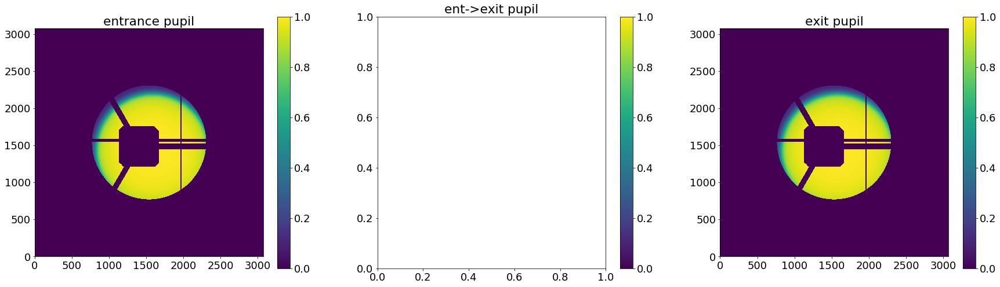

In [8]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
#plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

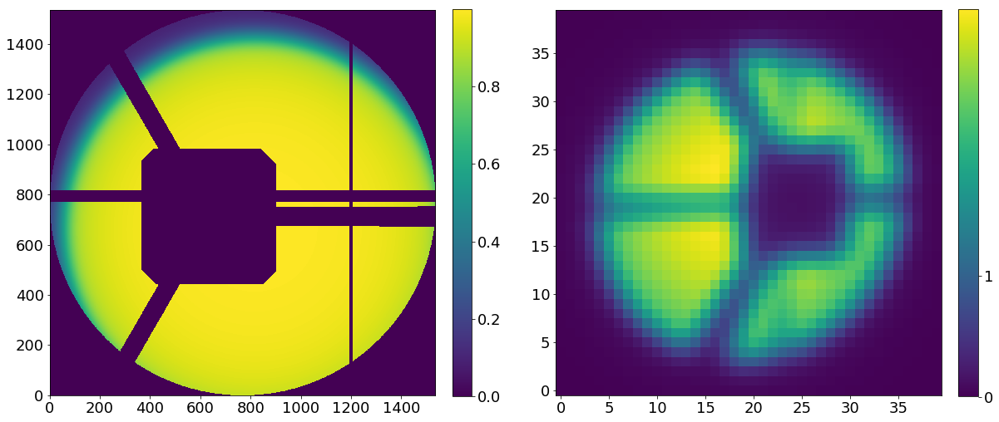

In [9]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**-2,1,10,10**2,10**3,10**4,10**5])

# PIPE2D-929 (multiple spots )

In [ ]:



list_of_Tokovinin_multi_instance_with_pool=[]
for s in range(len(list_of_spots)):
    list_of_Tokovinin_multi_instance_with_pool.append(Tokovinin_multi(
    array_of_sci_images_multi_spot[s],
    array_of_var_images_multi_spot[s],
    list_of_mask_images=array_of_mask_images_multi_spot[s],
    wavelength=array_of_wavelengths[s],
    dithering=1,
    save=0,
    verbosity=0,
    npix=1536,
    zmax=twentytwo_or_extra,
    list_of_defocuses=list_of_defocuses_input_long,
    double_sources=double_sources,
    double_sources_positions_ratios=double_sources_positions_ratios,
    fit_for_flux=True,
    test_run=False,
    num_iter=None,
    pool=pool))
    
list_of_Tokovinin_multi_instance_without_pool=[]
for s in range(len(list_of_spots)):
    list_of_Tokovinin_multi_instance_without_pool.append(Tokovinin_multi(
    array_of_sci_images_multi_spot[s],
    array_of_var_images_multi_spot[s],
    list_of_mask_images=array_of_mask_images_multi_spot[s],
    wavelength=array_of_wavelengths[s],
    dithering=1,
    save=0,
    verbosity=0,
    npix=1536,
    zmax=twentytwo_or_extra,
    list_of_defocuses=list_of_defocuses_input_long,
    double_sources=double_sources,
    double_sources_positions_ratios=double_sources_positions_ratios,
    fit_for_flux=True,
    test_run=False,
    num_iter=None,
    pool=None))

In [ ]:
list_of_best_result=[]
for s in range(len(list_of_spots)):
    list_of_Tokovinin_multi_instance_without_pool[s](
    array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d[s],
    return_Images=True,
    num_iter='initial',
    previous_best_result=None,
    use_only_chi=True)
    

In [ ]:

list_of_out2=[]
for s in range(len(list_of_spots)):
    out1 = pool.map(
    partial(
        list_of_Tokovinin_multi_instance_without_pool[s],
        return_Images=True,
        previous_best_result=list_of_best_result[s],
        use_only_chi=True,
        multi_background_factor=array_of_multi_background_factors[step]),
        list_of_array_of_particle_position_proposal[s])
    out2 = np.array(list(out1))
    
    list_of_out2.append(out2)

In [ ]:
best_result = list_of_Tokovinin_multi_instance_with_pool[s]()

# November runs (PIPE2D-929+)

In [9]:
import glob

#finalAr_wrong_secondary=np.load("/tigress/ncaplar/ReducedData/Data_May_21_2021/Dataframes/finalAr_Jul2021_wrong_secondary",allow_pickle=True)
finalAr=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalAr_Jul2021",allow_pickle=True)
finalNe=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalNe_Jul2021",allow_pickle=True)
finalKr=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalKr_Jul2021",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## scripts 

### scripts for 10 fiber

In [10]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)<120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)<90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)<40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

80
40
10
Int64Index([  1,   3,   5,   6,   7,   8,   9,  11,  13,  15,  17,  18,  19,
             20,  21,  23,  25,  27,  29,  30,  31,  32,  33,  35,  37,  39,
             41,  42,  43,  44,  45,  47,  49,  51,  53,  54,  55,  56,  57,
             59,  61,  63,  65,  66,  67,  68,  69,  71,  73,  75,  77,  78,
             79,  80,  81,  83,  85,  87,  89,  90,  91,  92,  93,  95,  97,
             99, 101, 102, 103, 104, 105, 107, 109, 111, 113, 114, 115, 116,
            117, 119],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31, 35, 39], dtype='int64')


In [11]:
i=0
", ".join(list_of_Ar_to_analyze[i*8:(i+1)*8].astype(str))

'1, 3, 5, 6, 7, 8, 9, 11'

In [13]:
date='Nov2221'

for f in range(10):
    single_spot=list_of_Ar_to_analyze[f*8:(f+1)*8][0]
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    single_string=" ".join(list_of_Ar_to_analyze[f*8:(f+1)*8].astype(str))
    file = open('/home/ncaplar/Scripts/D_Ar_1_'+str(f)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34389 34437 -spot "+str(single_string)+\
               " -nsteps 31 -eps 8 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Sep0521 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  


"""
file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()
"""

'\nfile = open(\'/home/ncaplar/Scripts/\'+date+\'ScriptToSubmitScriptsDella_Ar_1_\'+\'.sh\',\'w\')\nfile.write("#!/bin/bash \n")\nfile.write("\n")\nfor single_spot in list_of_Ar_to_analyze:\n    file.write(\'sbatch /home/ncaplar/Scripts/D_Ar_1_\'+str(single_spot)+date+\'.sh \n\')\n\nfile.close()\n'

### scripts for 21 fiber

In [10]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)>120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)>90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)>40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

168
84
21
Int64Index([121, 123, 125, 126, 127, 128, 129, 131, 133, 135,
            ...
            357, 359, 361, 363, 365, 366, 367, 368, 369, 371],
           dtype='int64', length=168)
Int64Index([ 92,  95,  96,  97, 101, 104, 105, 106, 110, 113, 114, 115, 119,
            122, 123, 124, 128, 131, 132, 133, 137, 140, 141, 142, 146, 149,
            150, 151, 155, 158, 159, 160, 164, 167, 168, 169, 173, 176, 177,
            178, 182, 185, 186, 187, 191, 194, 195, 196, 200, 203, 204, 205,
            209, 212, 213, 214, 218, 221, 222, 223, 227, 230, 231, 232, 236,
            239, 240, 241, 245, 248, 249, 250, 254, 257, 258, 259, 263, 266,
            267, 268, 272, 275, 276, 277],
           dtype='int64')
Int64Index([ 43,  47,  51,  55,  59,  63,  67,  71,  75,  79,  83,  87,  91,
             95,  99, 103, 107, 111, 115, 119, 123],
           dtype='int64')


In [61]:
finalAr.loc[253]

fiber                  289
xc                    2235
yc                     836
wavelength        696.7261
close                    1
lamp                    Ar
xc_effective          2304
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 253, dtype: object

In [63]:
finalAr[finalAr['close']=='1'][finalAr['fiber']==289]

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
253,289,2235,836,696.7261,1,Ar,2304,0,0,0,0
255,289,2234,1188,727.47876,1,Ar,2303,0,0,0,0
257,289,2234,1603,763.74286,1,Ar,2303,0,0,0,0
258,289,2234,1964,795.0522,1,Ar,2303,0,0,0,0
259,289,2234,2330,826.6699,1,Ar,2303,0,0,0,0
260,289,2234,2630,852.4029,1,Ar,2303,0,0,0,0
261,289,2235,3337,912.5693,1,Ar,2304,0,0,0,0
263,289,2235,3977,966.0642,1,Ar,2304,0,0,0,0


In [64]:
finalNe[finalNe['close']=='1'][finalNe['fiber']==289]

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
191,289,2232,418,660.0668,1,Ne,2301,0,0,0,0
194,289,2231,794,693.13116,1,Ne,2300,0,0,0,0
195,289,2231,1073,717.59015,1,Ne,2300,0,0,0,0
196,289,2231,1155,724.72437,1,Ne,2300,0,0,0,0


In [11]:
i=0
", ".join(list_of_Ar_to_analyze[i*8:(i+1)*8].astype(str))

'121, 123, 125, 126, 127, 128, 129, 131'

In [20]:
date='Nov2221'

for f in range(21):
    single_spot=list_of_Ar_to_analyze[f*8:(f+1)*8][0]
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    single_string=" ".join(list_of_Ar_to_analyze[f*8:(f+1)*8].astype(str))
    file = open('/home/ncaplar/Scripts/D_Ar_2_'+str(f)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 51485 51581 51677 -spot "+str(single_string)+\
               " -nsteps 31 -eps 8 -dataset 8 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Sep0521 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    

In [ ]:
# run scp D_Ar_2* ncaplar@della:/home/ncaplar/Scripts/ in terminal

## which are avaliable

In [10]:
#date='May2921'

date_folder=''
date_files='Nov2221'
ResultsFromTiger_FOLDER='/tigress/ncaplar/Results/'


#Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*KrSwarm1.npy', recursive=True)

### which are avaliable - 10 fibers

In [11]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    # single string should be total number, including exposure id, e.g., ``34437101''
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='34437']
analyzed_Ar_images=analyzed_Ar_images[np.argsort(analyzed_Ar_images[:,1].astype(int))]




###########

analyzed_Ne_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Ne_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Ne_images=np.array(analyzed_Ne_images)
try:
    analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='34313']
    analyzed_Ne_images=analyzed_Ne_images[np.argsort(analyzed_Ne_images[:,1].astype(int))]
except:
    pass




###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
try:
    analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='34657']
    analyzed_Kr_images=analyzed_Kr_images[np.argsort(analyzed_Kr_images[:,1].astype(int))]
except:
    pass

In [12]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Ne_images)>0:
    arranged_by_defocus_Ne=analyzed_Ne_images[analyzed_Ne_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Ne_images[analyzed_Ne_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
print([80,40,10])   
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Ne_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

[80, 40, 10]
analyzed_Ar_images:80 / analyzed_Ne_images:0 / analyzed_Kr_images:0


In [13]:
arranged_by_spot_number_Ar_10=np.copy(arranged_by_spot_number_Ar)
arranged_by_spot_number_Ne_10=np.copy(arranged_by_spot_number_Ne)
arranged_by_spot_number_Kr_10=np.copy(arranged_by_spot_number_Kr)

In [14]:
arranged_by_spot_number_Ar_10

array([['34437', '1', 'Ar'],
       ['34437', '101', 'Ar'],
       ['34437', '102', 'Ar'],
       ['34437', '103', 'Ar'],
       ['34437', '104', 'Ar'],
       ['34437', '105', 'Ar'],
       ['34437', '107', 'Ar'],
       ['34437', '109', 'Ar'],
       ['34437', '11', 'Ar'],
       ['34437', '111', 'Ar'],
       ['34437', '113', 'Ar'],
       ['34437', '114', 'Ar'],
       ['34437', '115', 'Ar'],
       ['34437', '116', 'Ar'],
       ['34437', '117', 'Ar'],
       ['34437', '119', 'Ar'],
       ['34437', '13', 'Ar'],
       ['34437', '15', 'Ar'],
       ['34437', '17', 'Ar'],
       ['34437', '18', 'Ar'],
       ['34437', '19', 'Ar'],
       ['34437', '20', 'Ar'],
       ['34437', '21', 'Ar'],
       ['34437', '23', 'Ar'],
       ['34437', '25', 'Ar'],
       ['34437', '27', 'Ar'],
       ['34437', '29', 'Ar'],
       ['34437', '3', 'Ar'],
       ['34437', '30', 'Ar'],
       ['34437', '31', 'Ar'],
       ['34437', '32', 'Ar'],
       ['34437', '33', 'Ar'],
       ['34437', '35', 'Ar']

### which are avaliable - 21 fibers

In [15]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    # single string should be total number, including exposure id, e.g., ``34437101''
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='51677']
analyzed_Ar_images=analyzed_Ar_images[np.argsort(analyzed_Ar_images[:,1].astype(int))]


# we want to avoid fibers 110 and 111 which overlap
index_110_111_Ar=finalAr[(finalAr['fiber']==110) | (finalAr['fiber']==111)].index
analyzed_Ar_images_index_without_110_111=np.setdiff1d(analyzed_Ar_images[:,1].astype(int),index_110_111_Ar)
analyzed_Ar_images=analyzed_Ar_images[np.isin(analyzed_Ar_images[:,1].astype(int),analyzed_Ar_images_index_without_110_111)]

###########

analyzed_Ne_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Ne_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Ne_images=np.array(analyzed_Ne_images)
try:
    analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='59847']
    analyzed_Ne_images=analyzed_Ne_images[np.argsort(analyzed_Ne_images[:,1].astype(int))]

    # we want to avoid fibers 110 and 111 which overlap
    index_110_111_Ne=finalNe[(finalNe['fiber']==110) | (finalNe['fiber']==111)].index
    analyzed_Ne_images_index_without_110_111=np.setdiff1d(analyzed_Ne_images[:,1].astype(int),index_110_111_Ne)
    analyzed_Ne_images=analyzed_Ne_images[np.isin(analyzed_Ne_images[:,1].astype(int),analyzed_Ne_images_index_without_110_111)]
    
except:
    print('error in Ne images')
    pass



###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
try:
    analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='52277']
    analyzed_Kr_images=analyzed_Kr_images[np.argsort(analyzed_Kr_images[:,1].astype(int))]
    # we want to avoid fibers 110 and 111 which overlap
    index_110_111_Kr=finalKr[(finalKr['fiber']==110) | (finalKr['fiber']==111)].index
    analyzed_Kr_images_index_without_110_111=np.setdiff1d(analyzed_Kr_images[:,1].astype(int),index_110_111_Kr)
    analyzed_Kr_images=analyzed_Kr_images[np.isin(analyzed_Kr_images[:,1].astype(int),analyzed_Kr_images_index_without_110_111)]  

except:
    pass


error in Ne images


In [16]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Ne_images)>0:
    arranged_by_defocus_Ne=analyzed_Ne_images[analyzed_Ne_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Ne_images[analyzed_Ne_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print(np.array([ 168, 84, 21])/21*19)  
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+
      ' / '+'analyzed_Ne_images:'+str(len(analyzed_Ne_images))+
      ' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

[152.  76.  19.]
analyzed_Ar_images:136 / analyzed_Ne_images:0 / analyzed_Kr_images:0


In [17]:
arranged_by_spot_number_Ar

array([['51677', '121', 'Ar'],
       ['51677', '123', 'Ar'],
       ['51677', '125', 'Ar'],
       ['51677', '126', 'Ar'],
       ['51677', '127', 'Ar'],
       ['51677', '128', 'Ar'],
       ['51677', '129', 'Ar'],
       ['51677', '131', 'Ar'],
       ['51677', '133', 'Ar'],
       ['51677', '135', 'Ar'],
       ['51677', '137', 'Ar'],
       ['51677', '138', 'Ar'],
       ['51677', '139', 'Ar'],
       ['51677', '140', 'Ar'],
       ['51677', '141', 'Ar'],
       ['51677', '143', 'Ar'],
       ['51677', '145', 'Ar'],
       ['51677', '147', 'Ar'],
       ['51677', '149', 'Ar'],
       ['51677', '150', 'Ar'],
       ['51677', '151', 'Ar'],
       ['51677', '152', 'Ar'],
       ['51677', '153', 'Ar'],
       ['51677', '155', 'Ar'],
       ['51677', '157', 'Ar'],
       ['51677', '159', 'Ar'],
       ['51677', '161', 'Ar'],
       ['51677', '162', 'Ar'],
       ['51677', '163', 'Ar'],
       ['51677', '164', 'Ar'],
       ['51677', '165', 'Ar'],
       ['51677', '167', 'Ar'],
       [

In [18]:
arranged_by_spot_number_Ar_21=np.copy(arranged_by_spot_number_Ar)
arranged_by_spot_number_Ne_21=np.copy(arranged_by_spot_number_Ne)
arranged_by_spot_number_Kr_21=np.copy(arranged_by_spot_number_Kr)

## single image analysis 

In [19]:
 date='Nov2221'

single_number='101'
image_index=int(single_number)
eps=8
arc='Ar'


if arc=='Ar':

    finalArc=finalAr
    if int(single_number)<120:
        dataset=6
        obs=34341+96
    if int(single_number)>=120:
        dataset=8
        obs=51485+16*12
        
if arc=='Ne':

    finalArc=finalNe
    if int(single_number)<90:
        dataset=6
        obs=27719
    if int(single_number)>=90:
        dataset=8    
        obs=59655+16*12
        
        
if arc=='Kr':

    finalArc=finalKr
    if int(single_number)<40:
        dataset=6
        obs=34561+96
    if int(single_number)>=40:
        dataset=8
        obs=52085+16*12
    

wavelength=float(finalArc.loc[int(single_number)]['wavelength'])
#wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_short_with_focus=['m4','0','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    63
xc                     3623
yc                     1632
wavelength        763.74286
close                     1
lamp                     Ar
xc_effective           3692
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 101, dtype: object

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]


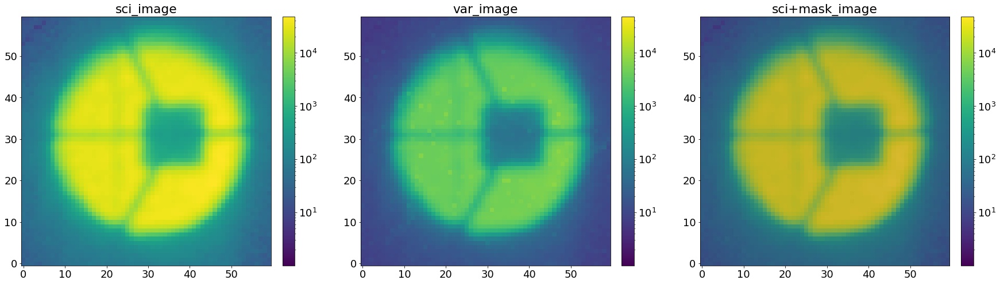

In [20]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
single_analysis.create_basic_data_image()

In [21]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371018ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371018ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 14.910933053181443


### chain analysis 

In [133]:
gbest_filename='/tigress/ncaplar/Results/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/tigress/ncaplar/Results/chainNov2221_Single_P_344371018Arres_gbests_position.npy
(31, 129)


array([   -7.6683309 ,     0.65598993,    -0.21653491,    -0.43128804,
           0.1802671 ,    -0.05478065,    -0.00131849,     0.23480769,
          -0.00934802,    -0.76215963,    -0.02424481,    -0.07782148,
           0.00098509,    -0.28580155,    -0.00245242,    -0.28149673,
           0.00604885,    -0.08468994,    -0.01608492,     0.05910373,
          -0.004337  ,    -0.0308627 ,    -0.00428935,    -0.04275032,
          -0.0113542 ,    -0.02360304,    -0.02119999,    -0.0050184 ,
          -0.00350684,    -0.03959596,     0.00525672,    -0.01737148,
           0.00019632,    -0.026385  ,    -0.00294082,     0.0210808 ,
          -0.01712153,    -0.01560892,     0.70577078,     0.07545586,
           0.1501485 ,    -0.00300264,     0.05797143,    -0.01183502,
           0.23155625,     0.20362914,     0.25610696,     1.55353086,
          -0.05847852,    -0.13024018,     0.96133714,     0.03272359,
           0.67775518,     0.9804671 ,    -0.53943601, 76718.64658464,
      

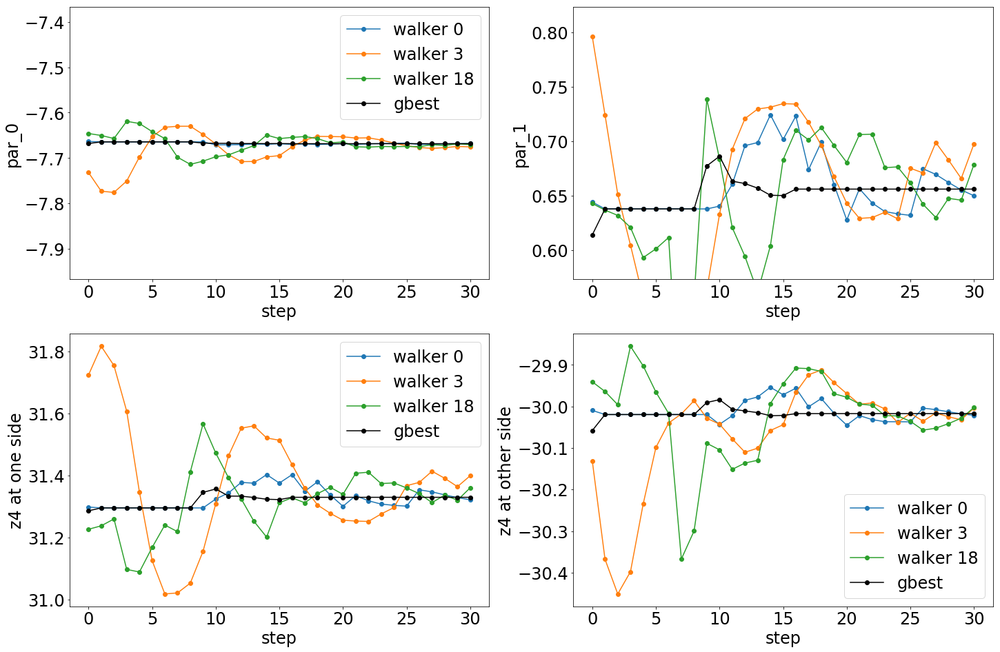

In [134]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=0*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(gbests_positions[:,i])
plt.ylim(np.min([mean_one_what-0.3,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.3,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

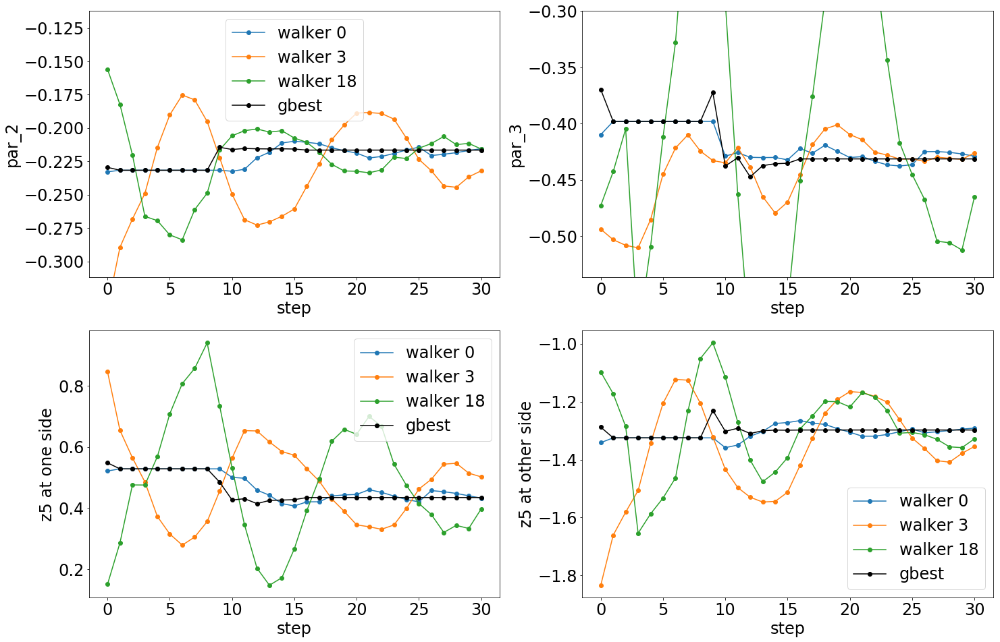

In [135]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=1*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

Text(0.5, 1.0, 'par_46 / wide_43')

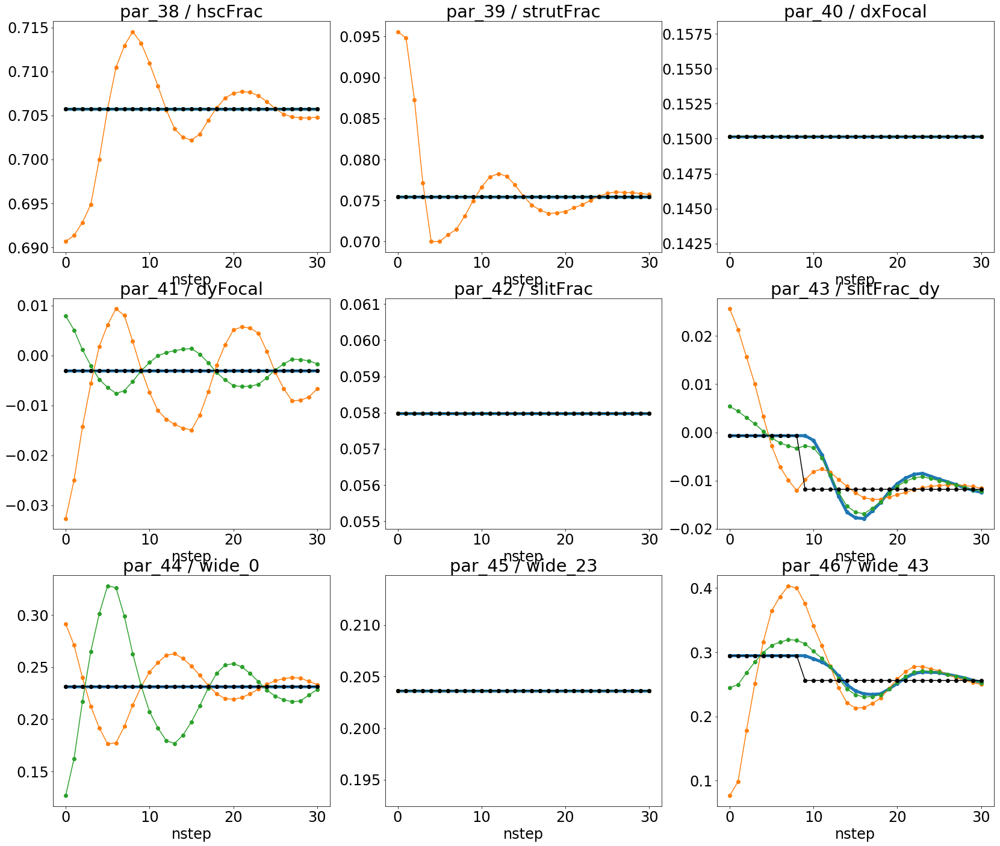

In [136]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

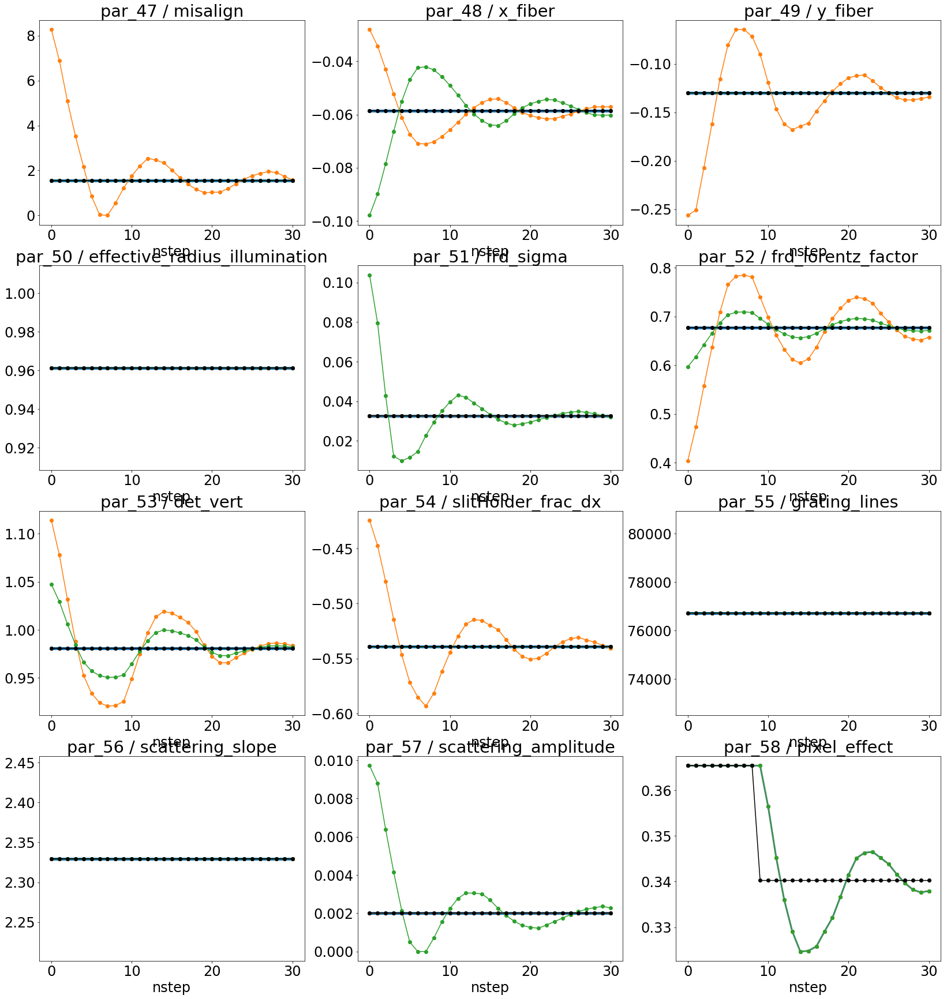

In [137]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

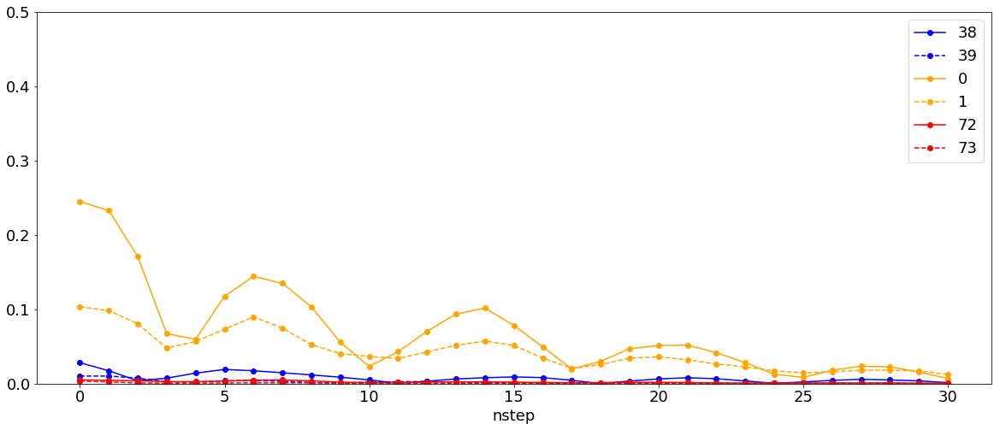

In [30]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.707119681044724, right=0.707119681044724
  ret = ax.set_xlim(*args, **kwargs)
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.08063353970002221, top=0.08063353970002221
  ret = ax.set_ylim(*args, **kwargs)


Text(0, 0.5, 'strutFrac')

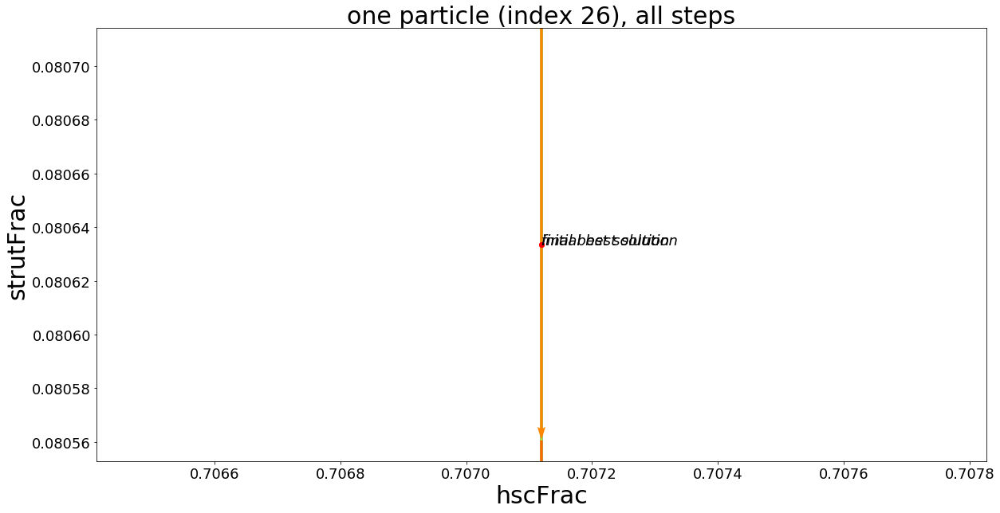

In [31]:
nsteps=chain0_swarm_1.shape[0]

j=0
n_particle=26
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle (index '+str(n_particle)+'), all steps',size=30)

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,label='particle')
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,label='best solution')
plt.scatter(X_best[-1],Y_best[-1],color='red')
plt.scatter(X_best[0],Y_best[0],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.text(X_best[-1]+-0.1*np.abs(delta_X),Y_best[-1]+np.abs(0.1*delta_Y),s='final best solution',style='italic')
plt.text(X_best[0]+-0.1*np.abs(delta_X),Y_best[0]-np.abs(0.2*delta_Y),s='initial best solution',style='italic')



plt.xlim(X_best[-1]-2*delta_X,X_best[-1]+2*delta_X)
plt.ylim(Y_best[-1]-2*delta_Y,Y_best[-1]+2*delta_Y)

plt.xlabel(columns22[i1-19],size=30)
plt.ylabel(columns22[i6-19],size=30)

#plt.legend()

Text(0, 0.5, 'parameter: 39')

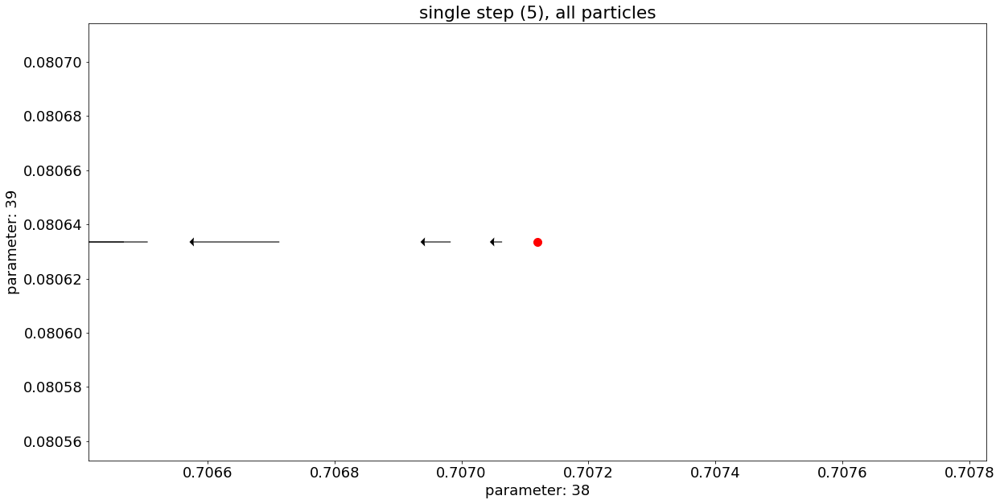

In [32]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

minimal likelihood is: 9.01423584920519
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771508ArSwarm1.npy
(31, 480, 129)


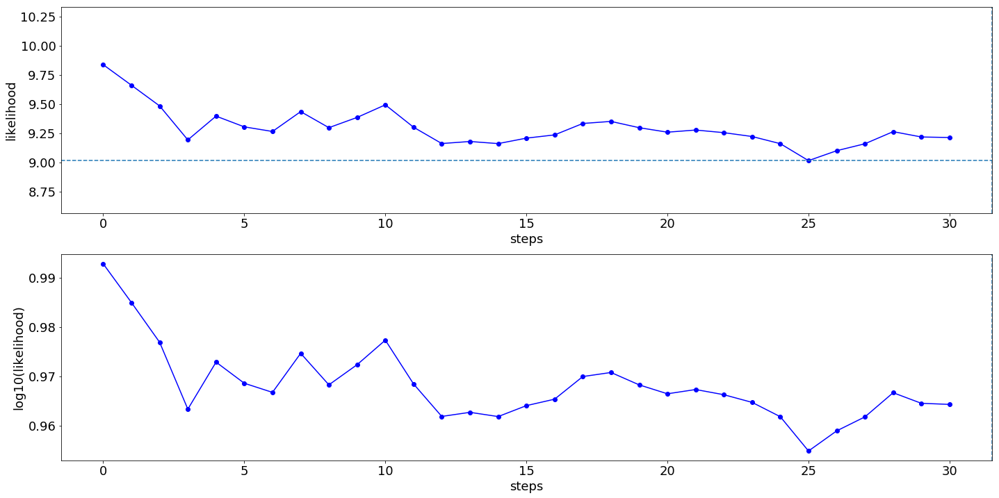

In [33]:
single_analysis.create_fitting_evolution_plot()

In [34]:
list_of_which_particle_is_gbest=[]
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,38]==gbests_positions[i][38])[0][0]])
    
list_of_which_particle_is_gbest
array_of_which_particle_is_gbest=np.array(list_of_which_particle_is_gbest)

(0, 480)

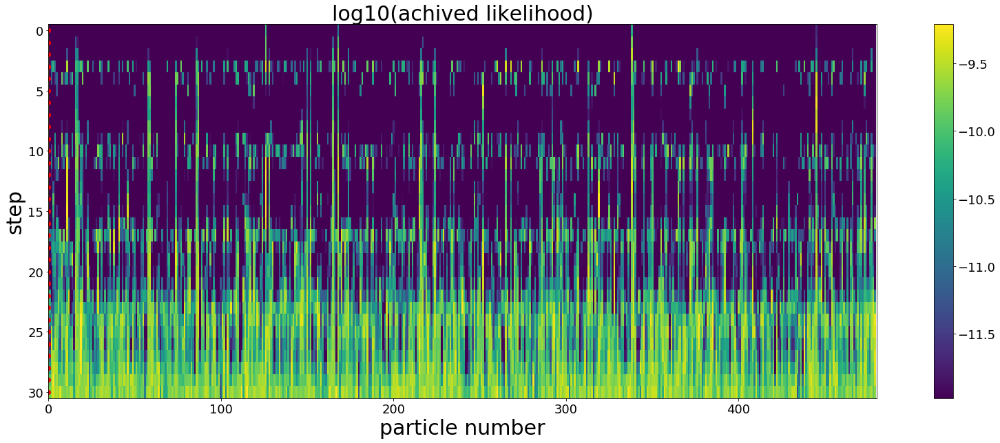

In [35]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),\
           vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()
plt.scatter(array_of_which_particle_is_gbest[:,1],array_of_which_particle_is_gbest[:,0],color='red')

plt.xlabel('particle number',size=30)
plt.ylabel('step',size=30)
plt.title('log10(achived likelihood)',size=30)
plt.xlim(0,likechain0_swarm_1.shape[1])

In [36]:
array_of_which_particle_is_gbest

array([[ 0,  0],
       [ 1,  0],
       [ 2,  0],
       [ 3,  0],
       [ 4,  0],
       [ 5,  0],
       [ 6,  0],
       [ 7,  0],
       [ 8,  0],
       [ 9,  0],
       [10,  0],
       [11,  0],
       [12,  0],
       [13,  0],
       [14,  0],
       [15,  0],
       [16,  0],
       [17,  0],
       [18,  0],
       [19,  0],
       [20,  0],
       [21,  0],
       [22,  0],
       [23,  0],
       [24,  0],
       [25,  0],
       [26,  0],
       [27,  0],
       [28,  0],
       [29,  0],
       [30,  0]])

### image analysis 

In [22]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)




#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


#res_multi_10=np.copy(res_multi)
#res_multi_21=np.copy(res_multi)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

"""
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=True)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)
"""

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 26.934265
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 7.8911033
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.16.2
scipy.__version__1.5.2
Zernike_Module.__version__0.50a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   31.22898473     0.45959956    -0.74038265     0.1482996
    -0.69855095     0.01828868    -0.30098569    -0.2683809
    -0.09842277     0.11560938    -0.02139313    -0.02398171
     0.02455701     0.09836877    -0.01534928    -0.0332521
    -0.02874227     0.03694541     0.05745503     0.70608691
     0.07545586     0.1501485     -0.00300264     0.05799201
    -0.01065301     0.23155625     0.15643573     0

chi2 within shgo with use_only_chi True and use_center_of_light False [32.20881295 20.24113586] / 20.16189563419132
chi2 within shgo with use_only_chi True and use_center_of_light False [29.45881295  3.74113586] / 58.79125873692788
chi2 within shgo with use_only_chi True and use_center_of_light False [40.45881295 25.74113586] / 36.49181753058315
chi2 within shgo with use_only_chi True and use_center_of_light False [34.95881295 14.74113586] / 20.452202559217035
chi2 within shgo with use_only_chi True and use_center_of_light False [23.95881295 36.74113586] / 80.29932260617831
chi2 within shgo with use_only_chi True and use_center_of_light False [24.64631295 16.11613586] / 41.740901276781926
chi2 within shgo with use_only_chi True and use_center_of_light False [35.64631295 38.11613586] / 71.25183138680156
chi2 within shgo with use_only_chi True and use_center_of_light False [41.14631295  5.11613586] / 57.943409001482166
chi2 within shgo with use_only_chi True and use_center_of_light False

chi2 within shgo with use_only_chi True and use_center_of_light False [34.6422415  18.16375049] / 15.32790458759508
chi2 within shgo with use_only_chi True and use_center_of_light False [34.6420507  18.16372269] / 15.327906349346657
chi2 within shgo with use_only_chi True and use_center_of_light False [34.6422993  18.16358687] / 15.327904333044438
chi2 within shgo with use_only_chi True and use_center_of_light False [34.64224916 18.16335019] / 15.327904925758428
chi2 within shgo with use_only_chi True and use_center_of_light False [34.64224342 18.16365041] / 15.327904178304294
chi2 within shgo with use_only_chi True and use_center_of_light False [34.64235135 18.16372349] / 15.327904987882967
chi2 within shgo with use_only_chi True and use_center_of_light False [34.64223136 18.16356622] / 15.327904194729149
chi2 within shgo with use_only_chi True and use_center_of_light False [34.64217548 18.16362976] / 15.32790488166894
chi2 within shgo with use_only_chi True and use_center_of_light Fa

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004112720489501953
Time for FFT is 0.2899143695831299
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 36.77570834518537
size_of_central_cut: 1029
optPsf_cut.shape(1030, 1030)
oversampling:11
size_of_optPsf_cut_downsampled: 308
optPsf_cut_downsampled.shape: (309, 309)
size_of_optPsf_cut_in_Microns: 421.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[76718.64658463963, 2.3296251573781954, 0.0020095759690789963, 0.33324427683841806, 1.8384295112257725]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(309, 309)
simulation_00 parameter: None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0.0 0.0]
self.save paramter is: 1
socket.gethostname(): tiger2-sumire.princeton.edu
Time for po

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0003578662872314453
Time for FFT is 0.29135560989379883
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 36.77570834518537
size_of_central_cut modified to 3072
size_of_central_cut: 3072
optPsf_cut.shape(3072, 3072)
oversampling:11
size_of_optPsf_cut_downsampled: 919
optPsf_cut_downsampled.shape: (919, 919)
size_of_optPsf_cut_in_Microns: 1253.181818181818
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[76718.64658463963, 2.3296251573781954, 0.0020095759690789963, 0.33324427683841806, 1.8384295112257725]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(919, 919)
simulation_00 parameter: None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0.0 0.0]
self.save paramter is: 1
socket.gethostname(): t

chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.97933793 -17.76958539] / 14.175233772158268
chi2 within shgo with use_only_chi True and use_center_of_light False [ 18.04782757 -17.7807334 ] / 14.177175789070027
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.97212794 -17.75020735] / 14.175051977644468
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.93608151 -17.76861274] / 14.176041290797592
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.99555865 -17.75553819] / 14.175091240773039
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.98834865 -17.73616014] / 14.175271486516936
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.98159061 -17.76122908] / 14.175105847382639
chi2 within shgo with use_only_chi True and use_center_of_light False [ 17.98609597 -17.74451645] / 14.175094172136356
chi2 within shgo with use_only_chi True and use_

'\nindex_of_single_image=1\nmodel = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,\n                      simulation_00=True)  \n\nres_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)\n'

In [23]:
mean_res_of_multi_same_spot

-14.848289651477359

In [24]:
popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
custom_var = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)

In [25]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    
    popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
    single_var_image_via_model = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)
   
    list_of_var_images_via_model.append(single_var_image_via_model)

In [26]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(len(list_of_sci_images)):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-2442.67260742 -1561.13330078 -2280.05444336]


'model pixels with a flux larger than (quantile_08_focus): 70.79434204101568'

mean reported value:-14.848289651477359
array_of_single_res: [-21.43502131  -3.21201965 -19.89782799]
renormalization factors: [1. 1. 1.]
array_of_single_res renormalized: [-21.43502131  -3.21201965 -19.89782799]


([<matplotlib.axis.XTick at 0x2aaea00d6240>,
 <a list of 3 Text xticklabel objects>)

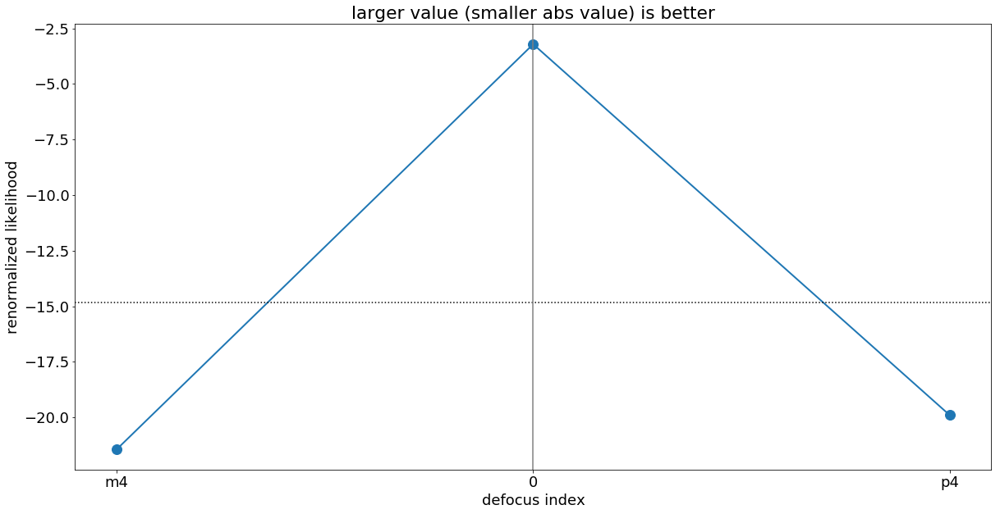

In [27]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.ones(len(list_of_sci_images))


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.title('larger value (smaller abs value) is better')

plt.axvline(np.where(np.array(list_of_defocuses_input_short_with_focus)=='0')[0][0],color='gray')
plt.xticks(np.arange(len(list_of_defocuses_input_short_with_focus)),list_of_defocuses_input_short_with_focus)

In [28]:
minchain=list_of_minchain[0]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
          z4      z5        z6      z7        z8        z9       z10       z11
0  31.228985  0.4596 -0.740383  0.1483 -0.698551  0.018289 -0.300986 -0.268381
##############################################
        z12       z13       z14       z15       z16       z17       z18  \
0 -0.098423  0.115609 -0.021393 -0.023982  0.024557  0.098369 -0.015349   

        z19       z20       z21       z22  
0 -0.033252 -0.028742  0.036945  0.057455  

##############################################
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.706087   0.075456  0.150149 -0.003003  0.057992    -0.010653
##############################################
     wide_0   wide_23   wide_43  misalign
0  0.231556  0.156436  0.251509  1.445793
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.058479 -0.115936                       0.961337   0.029489   

   frd_lorentz_factor  
0            0.677

(-1.5, -0.5)

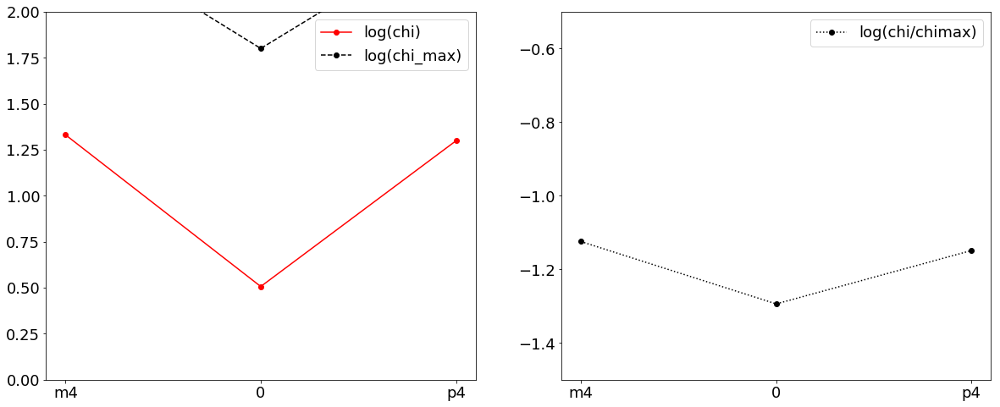

In [29]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 26.934265
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 7.8911033
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.16.2
scipy.__version__1.5.2
Zernike_Module.__version__0.50a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 179.81751251220703
---------------------
chi**2 max reduced is: 73223.482585522
chi**2 reduced is: 547.9089464126089 for log improvement: -2.1259419887611144
chi max reduced is: 189.84155556024706
chi reduced is: 15.398573481453308 for log improvement: -1.090910794020887
---------------------
chi**2 reduced within custom mask area is: 547.908946660461
---------------------
chi**2 max reduced within flux mask area is: 116152.52517233769
chi**2 reduced wi

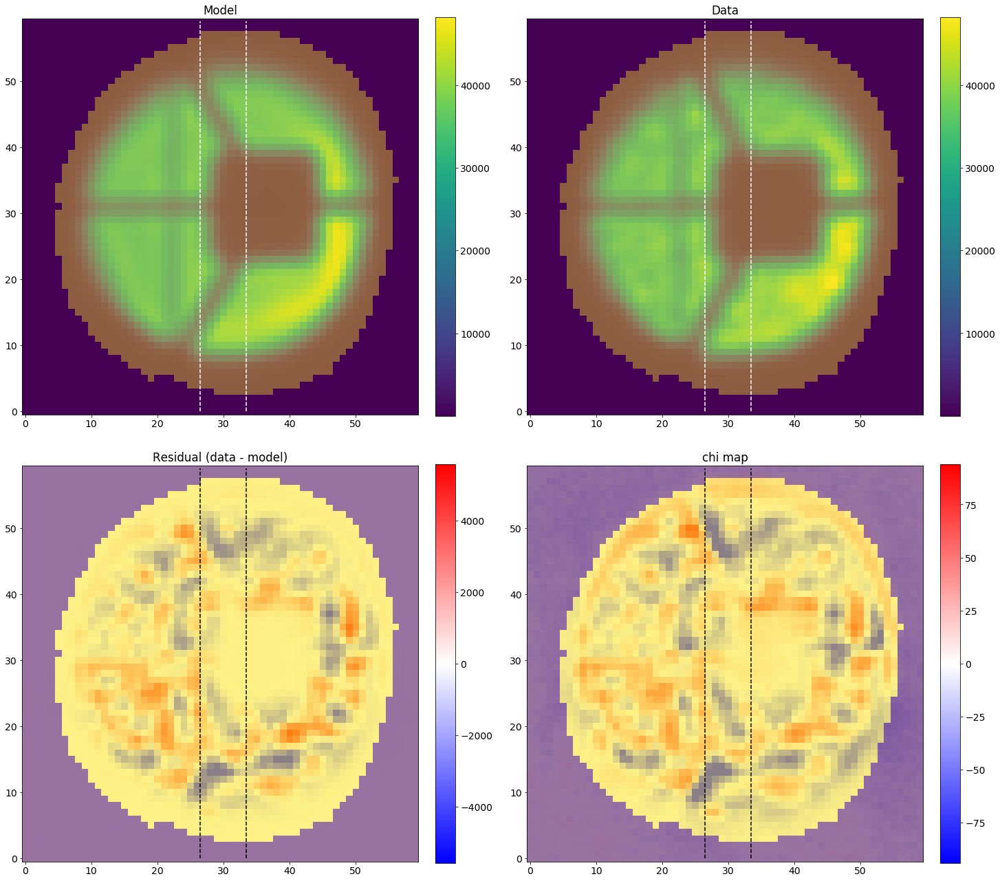

In [30]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
custom_var = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)

# custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
#                                   var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 26.934265
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 7.8911033
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.16.2
scipy.__version__1.5.2
Zernike_Module.__version__0.50a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 179.81751251220703
fraction of chi2 due to 1% of pixels: 0.1369009594957636
---------------------
chi**2 max reduced is: 73223.482585522
chi**2 reduced is: 547.9089464126089 for log improvement: -2.1259419887611144
chi max reduced is: 189.84155556024706
chi reduced is: 15.398573481453308 for log improvement: -1.090910794020887
---------------------
chi**2 reduced within custom mask area is: 547.908946660461
---------------------
chi**2 max reduced withi

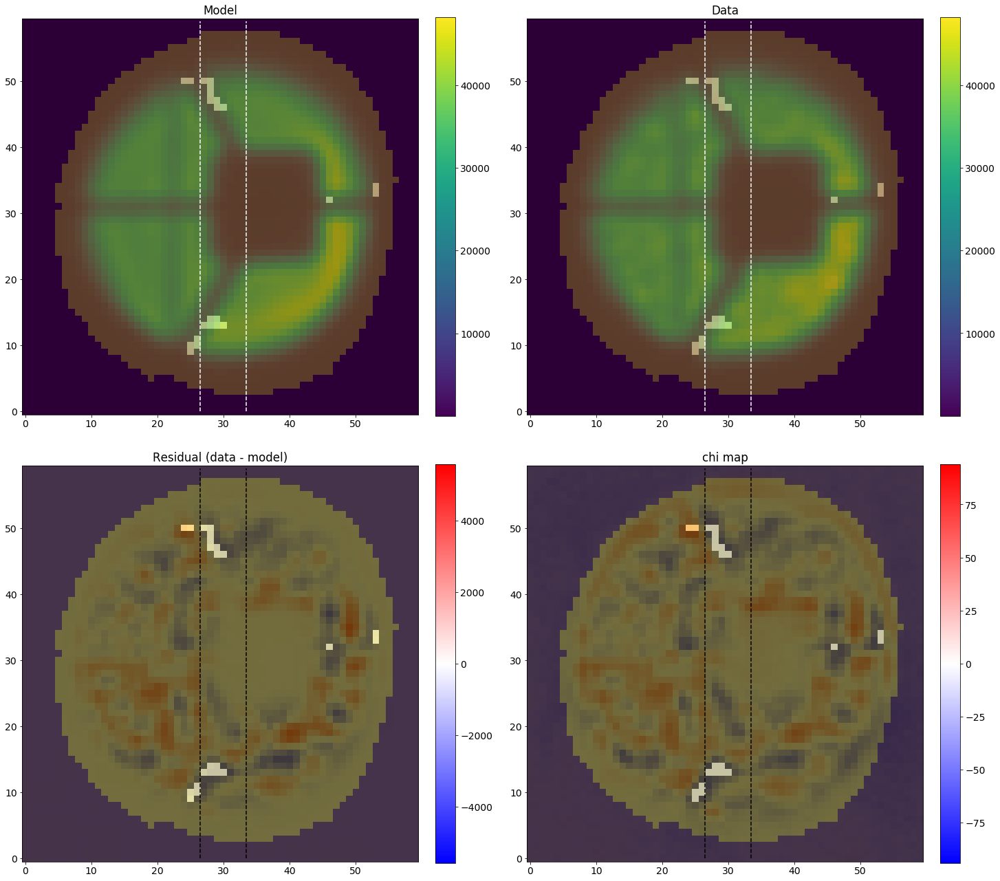

In [31]:
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 26.934265
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 7.8911033
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.16.2
scipy.__version__1.5.2
Zernike_Module.__version__0.50a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 179.81751251220703
---------------------
chi**2 max reduced is: 73223.482585522
chi**2 reduced is: 547.9089464126089 for log improvement: -2.1259419887611144
chi max reduced is: 189.84155556024706
chi reduced is: 15.398573481453308 for log improvement: -1.090910794020887
---------------------
chi**2 reduced within custom mask area is: 547.908946660461
---------------------
chi**2 max reduced within flux mask area is: 116152.52517233769
chi**2 reduced wi

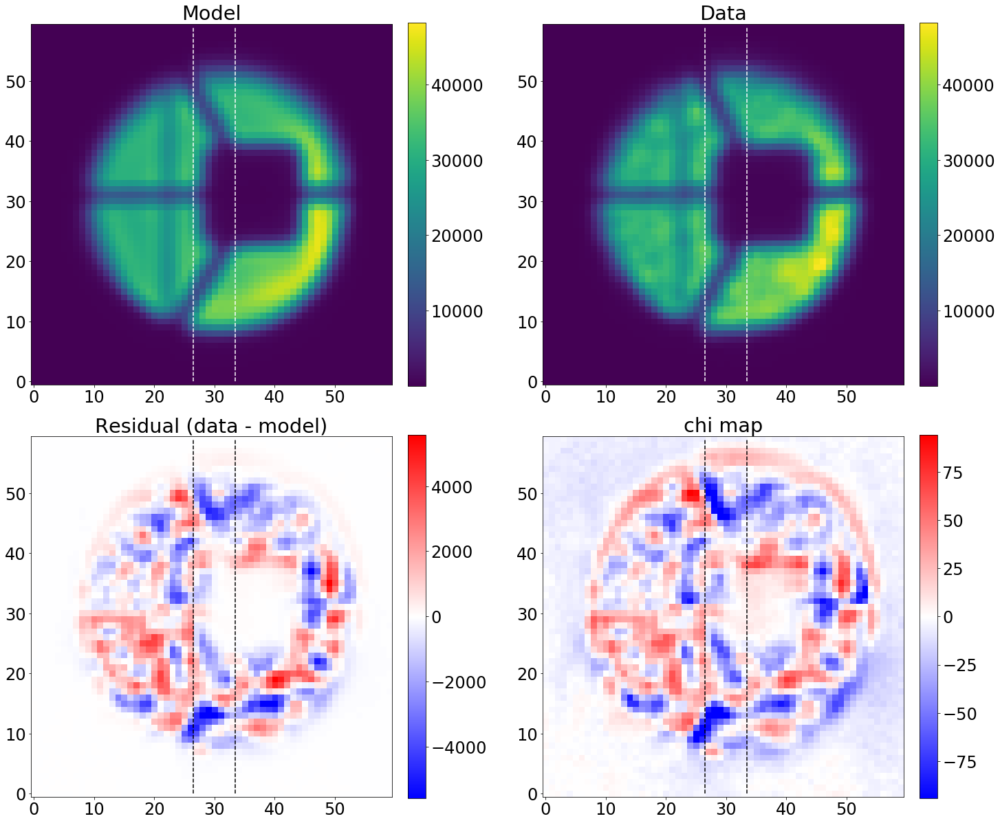

In [32]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 73223.482585522
chi**2 reduced is: 547.9089464126089
Abs of residual divided by total flux is: 0.06198670660536391
Abs of residual divided by largest value of a flux in the image is: 0.15911555302750952


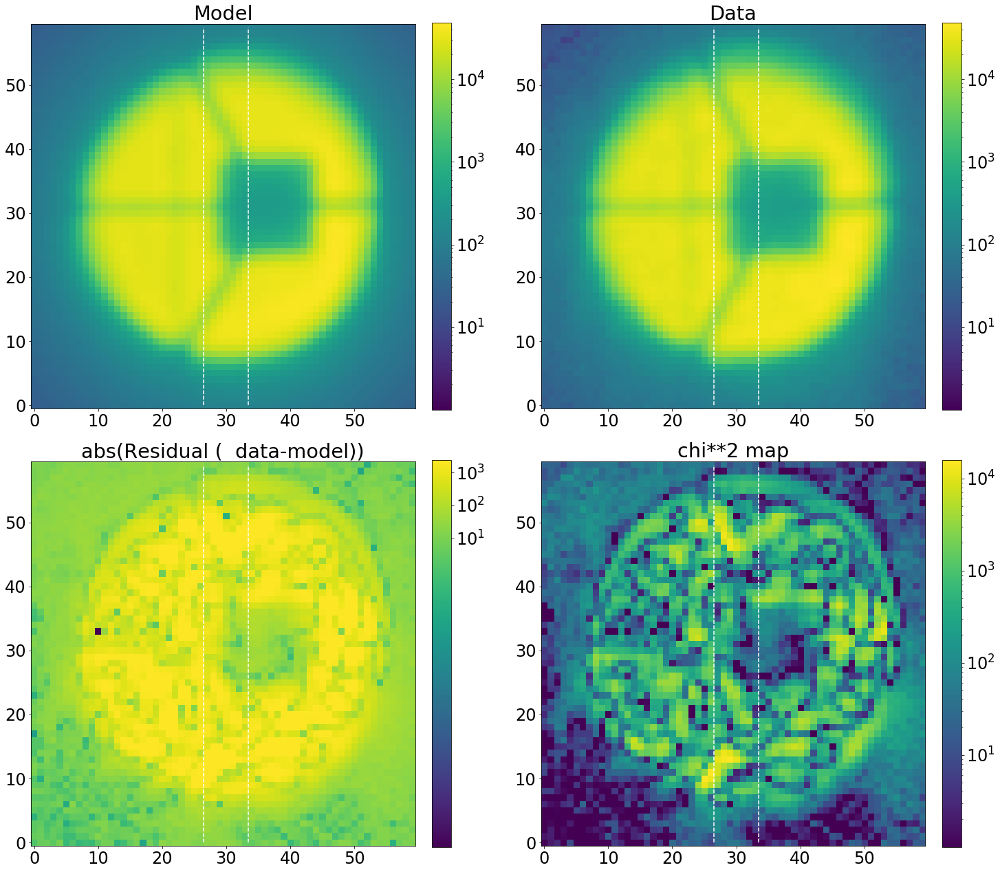

In [33]:
index_of_single_image=0
matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 2.1898599
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.21887
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.16.2
scipy.__version__1.5.2
Zernike_Module.__version__0.50a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 22.27159309387207
---------------------
chi**2 max reduced is: 7597.0587292423115
chi**2 reduced is: 10.99630692191122 for log improvement: -2.8393986306496144
chi max reduced is: 32.08367252356184
chi reduced is: 2.3486158910875723 for log improvement: -1.1354720798115685
---------------------
chi**2 reduced within custom mask area is: 10.996306944144116
---------------------
chi**2 max reduced within flux mask area is: 16565.992763925384
chi**2 reduced 

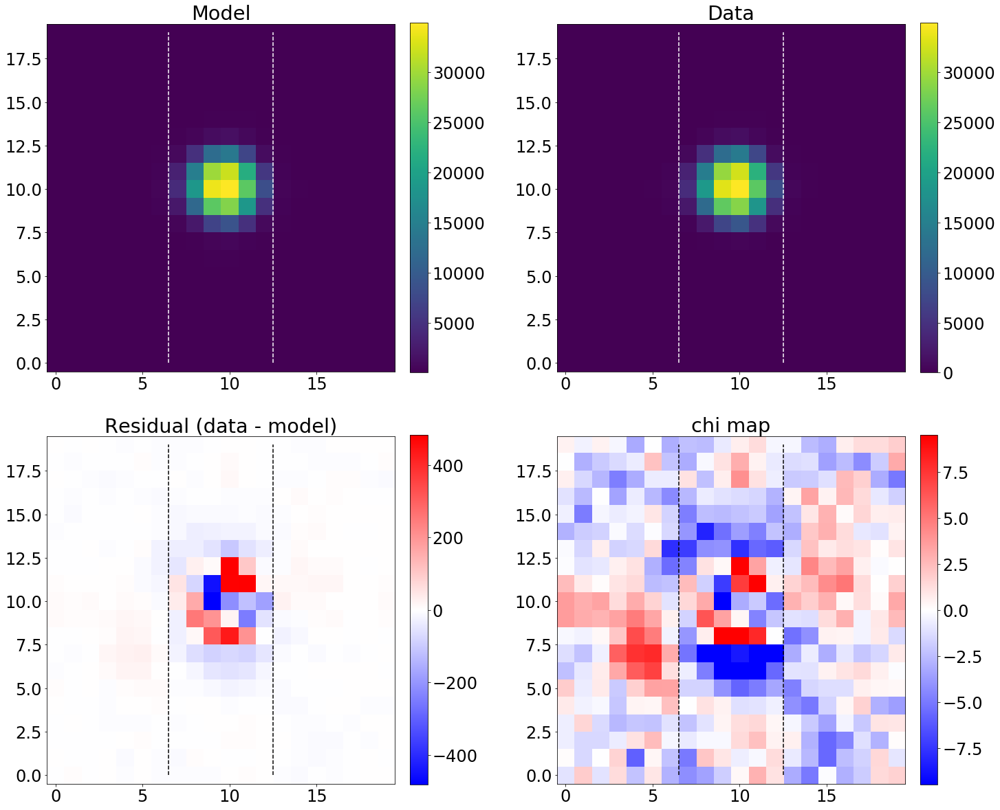

In [34]:
index_of_single_image=1
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 7597.0587292423115
chi**2 reduced is: 10.99630692191122
Abs of residual divided by total flux is: 0.019769265226638633
Abs of residual divided by largest value of a flux in the image is: 0.018317189594650625


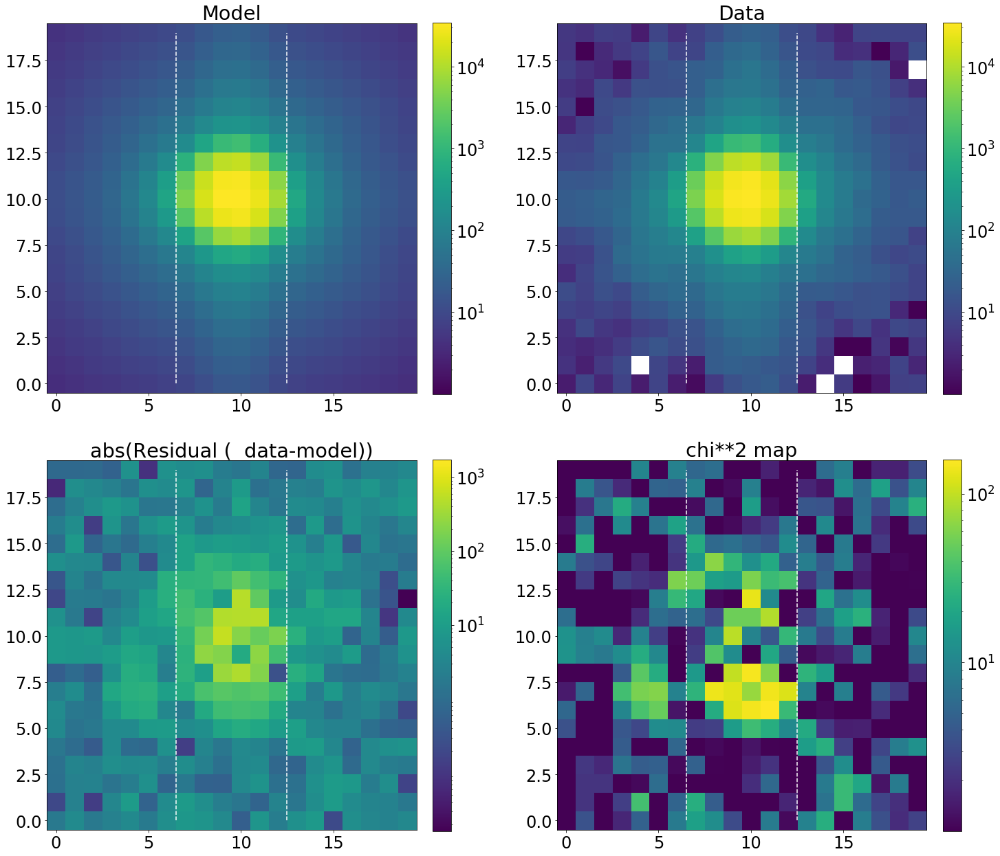

In [35]:
index_of_single_image=1
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

10.99630692191122
chi**2 reduced is: 10.99630692191122
Abs of residual divided by total flux is: 0.019769265226638633
Abs of residual divided by largest value of a flux in the image is: 0.018317189594650625


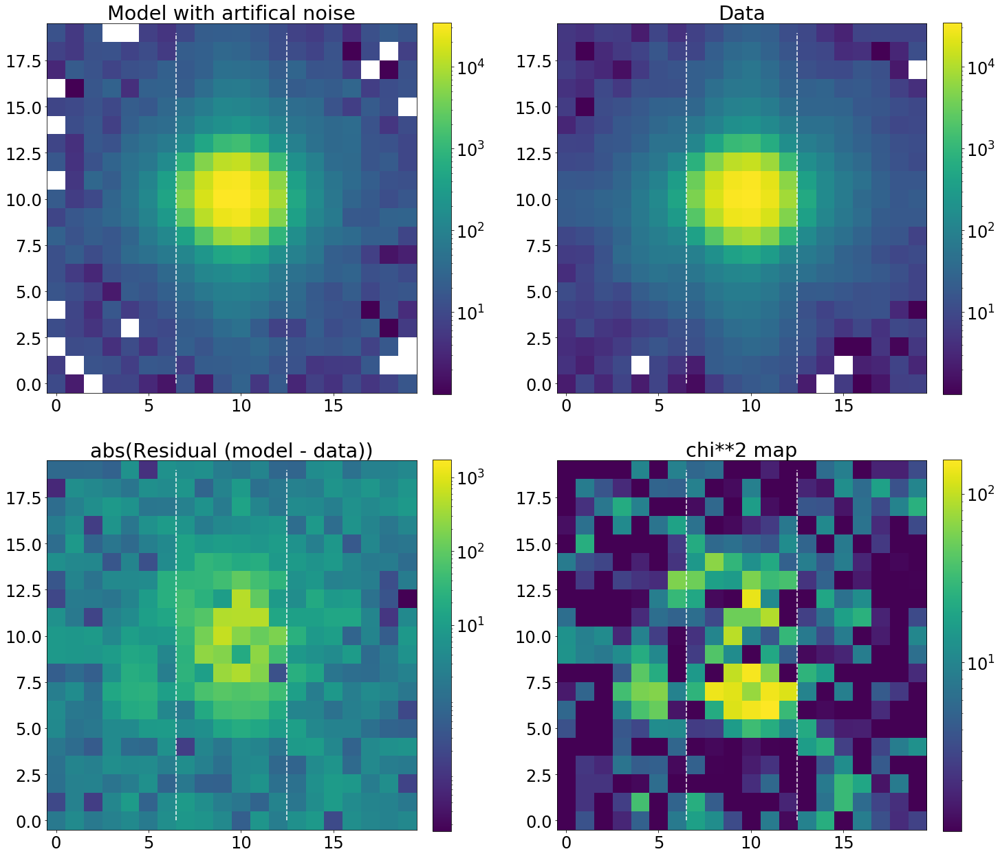

In [36]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

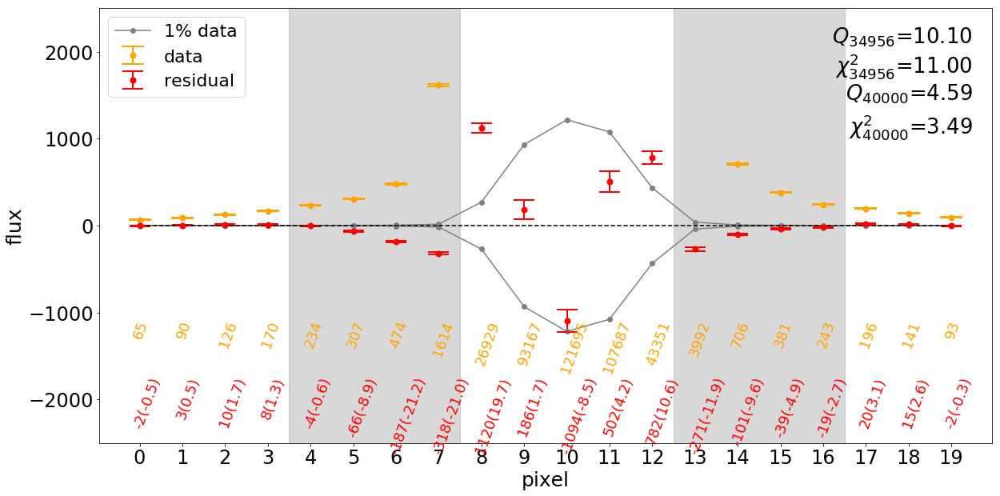

In [37]:
index_of_single_image=1
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],\
                 var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## results everywhere 

### results everywhere - 10 fibers

In [60]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar_10[:,1])

if len(arranged_by_spot_number_Ne)>0:
    unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne_10[:,1])
else:
    unique_numbers_Ne=np.array([])
    
if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr_10[:,1])
else:
    unique_numbers_Kr=np.array([])


In [68]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=6,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_3443718ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_3443718ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.364555607365859
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371018ArS

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371178ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371178ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 25.692067290612055
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 119
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371198ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_344371198ArSwarm1.npy
(31, 480, 129)
minimal lik

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437308ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437308ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.38172602892034
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 31
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437318ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437318ArSwarm1.npy
(31, 480, 129)
minimal likeli

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_3443758ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_3443758ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 14.164881534015658
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437518ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437518ArSwarm1.npy
(31, 480, 129)
minimal likeli

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437688ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437688ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.32442609477675
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 69
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437698ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437698ArSwarm1.npy
(31, 480, 129)
minimal likelihood

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437878ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437878ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 2.8423842998689146
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 89
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437898ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_34437898ArSwarm1.npy
(31, 480, 129)
minimal like

In [ ]:
# need to modify to match Argon
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

In [ ]:
# need to modify to match Argon
results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


In [69]:


pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Nov2221/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Nov2221_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Nov2221_10.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Nov2221_10.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

### results everywhere - 21 fibers

In [70]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar_21[:,1])

if len(arranged_by_spot_number_Ne)>0:
    unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne_21[:,1])
else:
    unique_numbers_Ne=np.array([]) 
    
if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr_21[:,1])
else:
    unique_numbers_Kr=np.array([])


In [71]:
unique_numbers_Ar

array(['121', '123', '125', '126', '127', '128', '129', '131', '133',
       '135', '137', '138', '139', '140', '141', '143', '145', '147',
       '149', '150', '151', '152', '153', '155', '157', '159', '161',
       '162', '163', '164', '165', '167', '169', '171', '173', '174',
       '175', '176', '177', '179', '181', '183', '185', '186', '187',
       '188', '189', '191', '193', '195', '197', '198', '199', '200',
       '201', '203', '205', '207', '209', '210', '211', '212', '213',
       '215', '241', '243', '245', '246', '247', '248', '249', '251',
       '253', '255', '257', '258', '259', '260', '261', '263', '265',
       '267', '269', '270', '271', '272', '273', '275', '277', '279',
       '281', '282', '283', '284', '285', '287', '289', '291', '293',
       '294', '295', '296', '297', '299', '301', '303', '305', '306',
       '307', '308', '309', '311', '337', '339', '341', '342', '343',
       '344', '345', '347', '349', '351', '353', '354', '355', '356',
       '357', '359',

In [72]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    
    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 121
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771218ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771218ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 8.498371622277325
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 123
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_S

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771418ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771418ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 22.556981165082565
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 143
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771438ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771438ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771638ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771638ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.391203028166524
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 164
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771648ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771648ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771858ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771858ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 14.358562194445746
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 186
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771868ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516771868ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772058ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772058ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.6417912620308295
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 207
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772078ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772078ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772498ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772498ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 19.962985783418418
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 251
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772518ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772518ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772718ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772718ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.969326225015934
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 272
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772728ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772728ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772938ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772938ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 21.519109253821778
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 294
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772948ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516772948ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773378ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773378ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.336432275101359
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 339
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773398ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773398ArSwarm1.npy
(31, 480, 129)

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773578ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773578ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 24.633636037842525
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 359
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773598ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainNov2221_Single_P_516773598ArSwarm1.npy
(31, 480, 129

In [73]:

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Nov2221/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Nov2221_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Sep0521_21.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Sep0521_21.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

## adding proper chi2 values 

### Argon 

In [138]:
date='Nov2221'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ar_index=np.unique(arranged_by_spot_number_Ar_10[:,1])


for single_number in tqdm(Ar_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy'):


        wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            print('############')
            print(single_number)
            print(list_of_defocuses_input_short_with_focus[i])
            print(starting_values[i])
            print(final_values[i])
            results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[str(single_number)]=final_values[i]
            results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[str(single_number)]=starting_values[i]
            print(results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].loc['101'])

  9%|█████████▉                                                                                                       | 7/80 [00:00<00:02, 35.92it/s]

############
1
m4
121.02870208544621
8.88959664086185
15.085123785926248
############
1
0
44.10503279993028
1.3359903546091352
15.085123785926248
############
1
p4
126.74186611248307
8.827172619606932
15.085123785926248
############
101
m4
285.5064480500491
21.43502131399931
21.43502131399931
############
101
0
63.18462686761017
3.2120196454629566
3.2120196454629566
############
101
p4
280.311695823169
19.897827994969806
19.897827994969806
############
102
m4
157.39637142153543
11.479587672548357
21.43502131399931
############
102
0
40.263880600839535
2.101718948511821
3.2120196454629566
############
102
p4
152.35199194703944
9.91429142561928
19.897827994969806
############
103
m4
175.76848534227537
12.712625034233358
21.43502131399931
############
103
0
37.51070860133203
2.4442239299307325
3.2120196454629566
############
103
p4
171.0230263796321
12.623912350218534
19.897827994969806
############
104
m4
134.0903314669544
9.472977926535213
21.43502131399931
############
104
0
37.8118733

 20%|██████████████████████▍                                                                                         | 16/80 [00:00<00:01, 37.59it/s]

############
11
m4
82.4119579676446
12.093435208828268
21.43502131399931
############
11
0
32.45700865502658
2.469665215515939
3.2120196454629566
############
11
p4
82.63632552210993
8.093856938874035
19.897827994969806
############
111
m4
59.38285673623225
4.785510473867688
21.43502131399931
############
111
0
35.10640022615409
1.3409520779479265
3.2120196454629566
############
111
p4
58.25284004044913
4.334025397524634
19.897827994969806
############
113
m4
276.48476344974597
19.86152022827896
21.43502131399931
############
113
0
60.17212287450768
3.4882870481224004
3.2120196454629566
############
113
p4
277.1166192070189
19.95030817574319
19.897827994969806
############
114
m4
153.2643096785807
11.95046209914668
21.43502131399931
############
114
0
37.8469858300722
1.8684498583351246
3.2120196454629566
############
114
p4
151.65603813327184
10.82747005759276
19.897827994969806
############
115
m4
176.88297496958958
13.330300733988087
21.43502131399931
############
115
0
38.882661320

 34%|█████████████████████████████████████▊                                                                          | 27/80 [00:00<00:01, 46.37it/s]

############
13
m4
99.3696302963317
6.903607483832432
21.43502131399931
############
13
0
39.5140366133659
1.4731973674923773
3.2120196454629566
############
13
p4
103.42324667115776
7.092271148622659
19.897827994969806
############
15
m4
61.24197187158669
4.282478164519159
21.43502131399931
############
15
0
37.31990954824496
1.276359456665004
3.2120196454629566
############
15
p4
59.68369400126114
4.016166323817403
19.897827994969806
############
17
m4
256.45250055408025
15.002449380733493
21.43502131399931
############
17
0
49.351027251378675
2.179115326410769
3.2120196454629566
############
17
p4
253.6323143627272
15.97524215830378
19.897827994969806
############
18
m4
143.49507916904713
9.017091718125632
21.43502131399931
############
18
0
43.74771227170075
1.9807547854871304
3.2120196454629566
############
18
p4
140.4859748999271
9.272373604162873
19.897827994969806
############
19
m4
160.94888395363256
10.812783940810425
21.43502131399931
############
19
0
41.2021529939365
1.840

 50%|████████████████████████████████████████████████████████                                                        | 40/80 [00:00<00:00, 55.26it/s]

############
3
m4
75.69403828716061
4.821444400569911
21.43502131399931
############
3
0
39.9197624058712
1.0267826302477947
3.2120196454629566
############
3
p4
76.2967579529321
5.059785175408998
19.897827994969806
############
30
m4
124.47343147145098
8.474926485279028
21.43502131399931
############
30
0
41.908494020954635
2.0957701516024394
3.2120196454629566
############
30
p4
118.69688950596795
8.495530262385701
19.897827994969806
############
31
m4
138.10698457264942
8.409051797104976
21.43502131399931
############
31
0
37.13358046394754
1.6495188841323034
3.2120196454629566
############
31
p4
132.46579822592707
8.284700395955051
19.897827994969806
############
32
m4
106.6687840758505
6.549170420360262
21.43502131399931
############
32
0
37.31861269327083
1.7083026592240975
3.2120196454629566
############
32
p4
100.81665209122268
6.623027144855233
19.897827994969806
############
33
m4
249.2281263547201
23.216318110151246
21.43502131399931
############
33
0
51.15236187236882
4.917

 57%|████████████████████████████████████████████████████████████████▍                                               | 46/80 [00:00<00:00, 56.38it/s]

############
47
m4
93.36017874201413
12.313135954069828
21.43502131399931
############
47
0
34.82106793353045
3.6385583742670935
3.2120196454629566
############
47
p4
92.50009676648996
10.004579380007057
19.897827994969806
############
49
m4
107.0829938033831
5.885494875242835
21.43502131399931
############
49
0
34.62506097273793
1.8645433917474699
3.2120196454629566
############
49
p4
107.12067280652848
6.664382076246459
19.897827994969806
############
5
m4
293.911257467888
19.896271775946442
21.43502131399931
############
5
0
57.967534879864324
2.719170251156683
3.2120196454629566
############
5
p4
294.4347119775921
19.73025410050456
19.897827994969806
############
51
m4
61.07993519949946
4.128289819836307
21.43502131399931
############
51
0
36.78849411878633
1.5921417629857044
3.2120196454629566
############
51
p4
61.14219591365382
4.241371164972689
19.897827994969806
############
53
m4
284.48120973289053
16.50525787496735
21.43502131399931
############
53
0
57.611389357833616
3.645

 72%|█████████████████████████████████████████████████████████████████████████████████▏                              | 58/80 [00:01<00:00, 51.72it/s]

############
61
m4
99.7849984221979
5.215451427595919
21.43502131399931
############
61
0
39.17944490306026
1.3311638484118393
3.2120196454629566
############
61
p4
98.7277448080672
5.967253211684856
19.897827994969806
############
63
m4
57.454491201693905
3.3079320836666755
21.43502131399931
############
63
0
34.762977885573854
0.9300839106138005
3.2120196454629566
############
63
p4
55.34200794745603
3.5496532718576987
19.897827994969806
############
65
m4
266.7830056006691
15.112059681992813
21.43502131399931
############
65
0
55.7454038816159
3.1593494406103635
3.2120196454629566
############
65
p4
252.47262781020143
16.935577687462917
19.897827994969806
############
66
m4
147.86240396756116
9.116669617762897
21.43502131399931
############
66
0
36.170425919741994
3.3448070676755877
3.2120196454629566
############
66
p4
137.85412077505663
8.937979070738498
19.897827994969806
############
67
m4
164.9031621416663
10.004900460944691
21.43502131399931
############
67
0
37.30027663423769

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████▍            | 71/80 [00:01<00:00, 53.89it/s]

############
73
m4
111.34816115739018
7.220357716252203
21.43502131399931
############
73
0
36.434582903305795
1.7262233462863814
3.2120196454629566
############
73
p4
110.00823430832149
7.630175648225305
19.897827994969806
############
75
m4
62.770604423206066
4.1300666041298415
21.43502131399931
############
75
0
36.339821260688296
1.4148789302522453
3.2120196454629566
############
75
p4
60.24741888393534
4.326837111934861
19.897827994969806
############
77
m4
291.71081449352715
18.395409265506945
21.43502131399931
############
77
0
63.54025013404559
3.43704005728041
3.2120196454629566
############
77
p4
280.5066858187379
19.35339359113463
19.897827994969806
############
78
m4
163.62842766173566
10.035394583654869
21.43502131399931
############
78
0
37.91106953033294
2.081020981597138
3.2120196454629566
############
78
p4
152.08091698193454
9.966318551633599
19.897827994969806
############
79
m4
182.5510485407012
11.847124637662196
21.43502131399931
############
79
0
36.9189184551296

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 80/80 [00:01<00:00, 49.15it/s]


0
41.1199177340436
1.8175200592718634
3.2120196454629566
############
90
p4
122.35380541026383
8.986389897642823
19.897827994969806
############
91
m4
143.70618895510003
9.147730731608185
21.43502131399931
############
91
0
40.498877573171164
1.6139778710370611
3.2120196454629566
############
91
p4
138.89991268905715
10.134616991664272
19.897827994969806
############
92
m4
108.3092243167888
7.6011443708317135
21.43502131399931
############
92
0
38.68518303558606
2.0913032995169076
3.2120196454629566
############
92
p4
105.50047259468553
7.856106009561495
19.897827994969806
############
93
m4
268.3042969021176
22.444005005050407
21.43502131399931
############
93
0
55.7961447154278
4.598703815985132
3.2120196454629566
############
93
p4
265.24634075577256
24.555579033303204
19.897827994969806
############
95
m4
70.76152332016396
8.396705111578827
21.43502131399931
############
95
0
35.79400168711532
2.261174720110688
3.2120196454629566
############
95
p4
70.88988818051762
8.110802760095

In [123]:
results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].loc['101']

19.897827994969806

In [139]:
results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,z49,z50,z51,z52,z53,z54,z55,z56,chi2,chi2max
1,-32.490252,1.366999,-0.621633,0.568290,0.866040,0.227948,-0.443957,-0.170037,-0.059195,-0.154064,...,-0.000297,-0.011131,0.008835,-0.000987,-0.001342,0.005912,0.014193,0.001835,8.827173,126.741866
101,-29.902592,-1.295924,0.595800,0.322641,-0.821377,-0.165196,-0.280475,-0.291210,-0.065249,-0.002070,...,0.001050,-0.015425,-0.001456,-0.001240,-0.003092,-0.009697,-0.005664,0.000501,19.897828,280.311696
102,-28.930696,-1.107153,0.684614,0.293028,-0.592722,-0.142692,-0.393665,-0.227844,-0.013121,-0.018903,...,-0.001596,-0.013532,0.003736,-0.000144,-0.006281,0.003066,0.004535,0.000981,9.914291,152.351992
103,-28.088305,-0.998308,0.740298,-0.121590,-0.682713,-0.225857,-0.339438,-0.217691,-0.073563,-0.078540,...,0.003174,-0.010394,-0.003113,0.004190,0.002610,-0.002090,0.003153,0.009056,12.623912,171.023026
104,-27.548207,-1.166842,0.676538,-0.048712,-0.702208,-0.259524,-0.333570,-0.154767,-0.065538,-0.012814,...,-0.001482,-0.013092,0.003211,0.005312,-0.000908,-0.001908,-0.001110,0.007073,8.487618,131.200365
105,-26.519024,-1.063481,0.969667,-0.217135,-0.721757,-0.341220,-0.055317,-0.024918,-0.070368,-0.114995,...,0.017692,-0.016320,0.005877,-0.006656,0.007814,-0.004886,0.000438,-0.000699,31.827521,321.105255
107,-24.968455,-1.170523,0.554653,-0.535572,-0.450883,-0.217465,0.051105,0.196592,0.006414,-0.047336,...,0.003600,0.003638,0.001259,0.000823,0.009958,0.001861,0.008483,0.005304,8.424401,80.637644
109,-32.902648,-1.417731,0.237677,0.660506,-1.183126,0.126693,-0.061179,-0.209737,-0.096818,0.096324,...,0.000873,-0.019891,-0.003024,0.005566,0.000415,-0.008824,0.003088,0.012329,7.239963,108.200458
11,-25.209466,1.016471,0.413356,-0.601010,0.206700,-0.131582,-0.512042,0.279699,-0.020816,0.099959,...,-0.014635,0.006810,-0.007098,-0.012351,-0.013802,-0.010836,0.007952,-0.012701,8.093857,82.636326
111,-32.001428,-1.491930,0.435935,0.487266,-1.085953,0.022363,-0.097663,-0.184439,-0.169230,0.098339,...,0.011395,-0.013147,-0.006163,0.009357,0.003938,-0.011990,-0.001296,0.008796,4.334025,58.252840


In [140]:
date='Nov2221'

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ar_index=np.unique(arranged_by_spot_number_Ar_21[:,1])


for single_number in tqdm(Ar_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy'):

        wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')
        

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ar_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ar_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 136/136 [00:00<00:00, 155.76it/s]


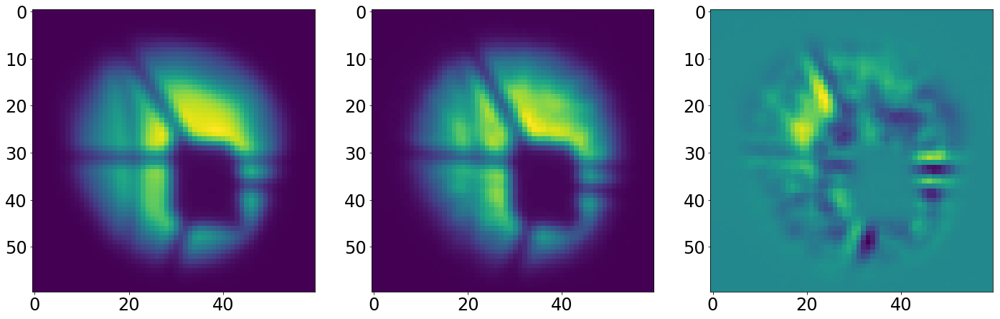

In [106]:
plt.figure(figsize=(24,8))
plt.subplot(131)
plt.imshow(res_multi[2][0])

plt.subplot(132)
plt.imshow(list_of_sci_images[0])

plt.subplot(133)
plt.imshow(list_of_sci_images[0]-res_multi[2][0])

In [122]:
np.mean(np.abs(list_of_sci_images[0]**1)/np.sqrt(list_of_var_images[0]))

79.971565

In [125]:
np.mean(np.abs(list_of_sci_images[0]**1)/np.sqrt(list_of_var_images[0]))

79.971565

In [126]:
np.mean(list_of_sci_images[0]**1/np.sqrt(list_of_var_images[0]))

79.92766

In [114]:
np.log10(np.mean((list_of_sci_images[0]-res_multi[2][0])**2/list_of_var_images[0]))

2.4218039130271847

In [115]:
-np.log10(np.mean((list_of_sci_images[0]-res_multi[2][0])**2/list_of_var_images[0]))+np.log10(np.mean(list_of_sci_images[0]**2/list_of_var_images[0]))

1.6746187592445438

In [117]:
# list_of_single_chi_results
np.array(res_multi[4])

array([[ 34436.92842507, 284469.0851671 ,     13.06904305,
           107.95790708],
       [   487.16453876,   5367.38762165,      2.75234203,
            30.32422385],
       [ 31153.06180908, 276472.39554569,     12.42643072,
           110.28017373]])

In [155]:
single_number=101
res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')

In [167]:
res_multi[4]

[[48486.01821226644, 645815.585489211, 21.43502131399931, 285.5064480500491],
 [587.7995951197211,
  11562.786716772662,
  3.2120196454629566,
  63.18462686761017],
 [44531.33905274243, 627337.5752522522, 19.897827994969806, 280.311695823169]]

In [ ]:
26.934265

### Neon 

### Krypton 

### saving dataframes

In [144]:
date

'Nov2221'

In [145]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar_10,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Sep0521_10.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_direct_Ne_10,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Sep0521_10.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_direct_Kr_10,f, protocol=pickle.HIGHEST_PROTOCOL)

In [146]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar_21,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Sep0521_21.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_direct_Ne_21,f, protocol=pickle.HIGHEST_PROTOCOL)
#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Sep0521_21.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_direct_Kr_21,f, protocol=pickle.HIGHEST_PROTOCOL)

## Combining results 

In [147]:
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl',allow_pickle=True)
#results_of_fit_many_direct_Ne_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl',allow_pickle=True)
#results_of_fit_many_direct_Kr_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl',allow_pickle=True)

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl',allow_pickle=True)
#results_of_fit_many_direct_Ne_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl',allow_pickle=True)
#results_of_fit_many_direct_Kr_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl',allow_pickle=True)

In [149]:
results_of_fit_many_direct_Ar_0 = pd.concat([results_of_fit_many_direct_Ar_10['0'],results_of_fit_many_direct_Ar_21['0']])
# results_of_fit_many_direct_Ne_0 = pd.concat([results_of_fit_many_direct_Ne_10['0'],results_of_fit_many_direct_Ne_21['0']])
# results_of_fit_many_direct_Kr_0 = pd.concat([results_of_fit_many_direct_Kr_10['0'],results_of_fit_many_direct_Kr_21['0']])

results_of_fit_many_direct_Ar_m4 = pd.concat([results_of_fit_many_direct_Ar_10['m4'],results_of_fit_many_direct_Ar_21['m4']])
# results_of_fit_many_direct_Ne_m4 = pd.concat([results_of_fit_many_direct_Ne_10['m4'],results_of_fit_many_direct_Ne_21['m4']])
# results_of_fit_many_direct_Kr_m4 = pd.concat([results_of_fit_many_direct_Kr_10['m4'],results_of_fit_many_direct_Kr_21['m4']])

results_of_fit_many_direct_Ar_p4 = pd.concat([results_of_fit_many_direct_Ar_10['p4'],results_of_fit_many_direct_Ar_21['p4']])
# results_of_fit_many_direct_Ne_p4 = pd.concat([results_of_fit_many_direct_Ne_10['p4'],results_of_fit_many_direct_Ne_21['p4']])
# results_of_fit_many_direct_Kr_p4 = pd.concat([results_of_fit_many_direct_Kr_10['p4'],results_of_fit_many_direct_Kr_21['p4']])

In [150]:
results_of_fit_many_Ar = {'m4': results_of_fit_many_direct_Ar_m4.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4.copy()}

# results_of_fit_many_Ne = {'m4': results_of_fit_many_direct_Ne_m4.copy(), 
#                        '0' : results_of_fit_many_direct_Ne_0.copy(),
#                         'p4' :results_of_fit_many_direct_Ne_p4.copy()}

# results_of_fit_many_Kr = {'m4': results_of_fit_many_direct_Kr_m4.copy(), 
#                        '0' : results_of_fit_many_direct_Kr_0.copy(),
#                         'p4' :results_of_fit_many_direct_Kr_p4.copy()}

In [151]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.DEFAULT_PROTOCOL)
# with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Sep0521.pkl', 'wb') as f:
#     pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.DEFAULT_PROTOCOL)
# with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Sep0521.pkl', 'wb') as f:
#     pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.DEFAULT_PROTOCOL)

### plot images 

In [152]:
results_of_fit_many_direct_Ar_m4=results_of_fit_many_Ar['m4']
results_of_fit_many_direct_Ar_0=results_of_fit_many_Ar['0']
results_of_fit_many_direct_Ar_p4=results_of_fit_many_Ar['p4']


# results_of_fit_many_direct_Ne_m4=results_of_fit_many_Ne['m4']
# results_of_fit_many_direct_Ne_0=results_of_fit_many_Ne['0']
# results_of_fit_many_direct_Ne_p4=results_of_fit_many_Ne['p4']

# results_of_fit_many_direct_Kr_m4=results_of_fit_many_Kr['m4']
# results_of_fit_many_direct_Kr_0=results_of_fit_many_Kr['0']
# results_of_fit_many_direct_Kr_p4=results_of_fit_many_Kr['p4']

In [153]:
renormalization_ratios_Ar=800/finalAr.loc[results_of_fit_many_Ar['m4'].index.astype(int)]['wavelength'].astype(float).values

"""
renormalization_ratios_Ne=800/finalNe.loc[results_of_fit_many_Ne['m4'].index.astype(int)]['wavelength'].astype(float).values
renormalization_ratios_Kr=800/finalKr.loc[results_of_fit_many_Kr['m4'].index.astype(int)]['wavelength'].astype(float).values

"""

"\nrenormalization_ratios_Ne=800/finalNe.loc[results_of_fit_many_Ne['m4'].index.astype(int)]['wavelength'].astype(float).values\nrenormalization_ratios_Kr=800/finalKr.loc[results_of_fit_many_Kr['m4'].index.astype(int)]['wavelength'].astype(float).values\n\n"

In [154]:
results_of_fit_many_direct_Ar_m4_renormalized=results_of_fit_many_direct_Ar_m4.copy()
results_of_fit_many_direct_Ar_0_renormalized=results_of_fit_many_direct_Ar_0.copy()
results_of_fit_many_direct_Ar_p4_renormalized=results_of_fit_many_direct_Ar_p4.copy()

for i in range(4,56):
    results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    
    
#####################################################################################    

"""
results_of_fit_many_direct_Ne_m4_renormalized=results_of_fit_many_direct_Ne_m4.copy()
results_of_fit_many_direct_Ne_0_renormalized=results_of_fit_many_direct_Ne_0.copy()
results_of_fit_many_direct_Ne_p4_renormalized=results_of_fit_many_direct_Ne_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]/renormalization_ratios_Ne
 
"""   
    
    
#####################################################################################    

"""
results_of_fit_many_direct_Kr_m4_renormalized=results_of_fit_many_direct_Kr_m4.copy()
results_of_fit_many_direct_Kr_0_renormalized=results_of_fit_many_direct_Kr_0.copy()
results_of_fit_many_direct_Kr_p4_renormalized=results_of_fit_many_direct_Kr_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]/renormalization_ratios_Kr

"""    
    
results_of_fit_many_Ar_renormalized = {'m4': results_of_fit_many_direct_Ar_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4_renormalized.copy()}

"""
results_of_fit_many_Ne_renormalized = {'m4': results_of_fit_many_direct_Ne_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ne_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ne_p4_renormalized.copy()}

results_of_fit_many_Kr_renormalized = {'m4': results_of_fit_many_direct_Kr_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Kr_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Kr_p4_renormalized.copy()}

"""

"\nresults_of_fit_many_Ne_renormalized = {'m4': results_of_fit_many_direct_Ne_m4_renormalized.copy(), \n                       '0' : results_of_fit_many_direct_Ne_0_renormalized.copy(),\n                        'p4' :results_of_fit_many_direct_Ne_p4_renormalized.copy()}\n\nresults_of_fit_many_Kr_renormalized = {'m4': results_of_fit_many_direct_Kr_m4_renormalized.copy(), \n                       '0' : results_of_fit_many_direct_Kr_0_renormalized.copy(),\n                        'p4' :results_of_fit_many_direct_Kr_p4_renormalized.copy()}\n\n"

In [155]:
# plot the results of the interpolation
#  renomalized!!!!
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Nov2221'
# [:42] makes that you go up to z22
descriptions=results_of_fit_many_Ar[label[0]].columns[:42]
# j runs throught the amount of defocu that we have analyzed

#for j in tqdm(labels_with_data):
for j in [0,8,17]:
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ar=np.array(results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]])
        
        # take values for Neon        
        # x_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        # y_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        # values_Ne=np.array(results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]])
        
        # take values for Krypton        
        # x_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        # y_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        # values_Kr=np.array(results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]])        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        # x=np.concatenate((x_Ar,x_Ne,x_Kr))
        # y=np.concatenate((y_Ar,y_Ne,y_Kr))    
        # colors= np.concatenate((values_Ar,values_Ne,values_Kr))
        
        x= x_Ar
        y= y_Ar  
        colors= values_Ar
        
        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=3
                    min_colors=-3 
                    
            # limits of color for z12-z22
            if np.in1d([i],[8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=0.25
                    min_colors=-0.25

            # limits for all other parameters   - they change 
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(np.quantile(colors,0.9)-median_color)
                low_limit=np.abs(np.quantile(colors,0.1)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  
            
            # Zernike above z22
            if i >42:
                max_colors=0.5/(i-20)
                min_colors=-0.5/(i-20)  

        plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='o')
        # plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='s')
        # plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='p')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+': '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/tigress/ncaplar/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/tigress/ncaplar/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.clf()

NameError: name 'label' is not defined

## quality 

In [158]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Sep0521/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )
    
results_of_fit_many_Ar_Sep0521=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Sep0521.pkl',allow_pickle=True)


Text(0.5, 1.0, 'out of focus')

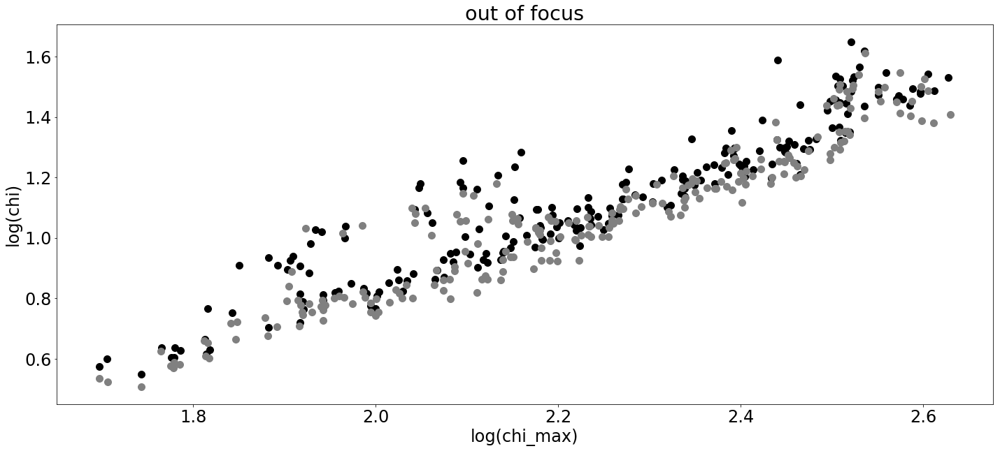

In [159]:
plt.figure(figsize=(24,10))

plt.plot(np.log10(results_of_fit_many_Ar['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar['p4']['chi2'].values),ls='',marker='o',color='black',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ar_Sep0521['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar_Sep0521['p4']['chi2'].values),ls='',marker='o',color='gray',label='Ar',markersize=10)
#plt.plot(np.log10(results_of_fit_many_Ne['p4']['chi2max'].values),\
#         np.log10(results_of_fit_many_Ne['p4']['chi2'].values),ls='',marker='o',color='red',label='Ne',markersize=10)
#plt.plot(np.log10(results_of_fit_many_Kr['p4']['chi2max'].values),\
#         np.log10(results_of_fit_many_Kr['p4']['chi2'].values),ls='',marker='o',color='blue',label='Kr',markersize=10)
plt.xlabel('log(chi_max)')
plt.ylabel('log(chi)')
plt.title('out of focus')

(-0.1, 1)

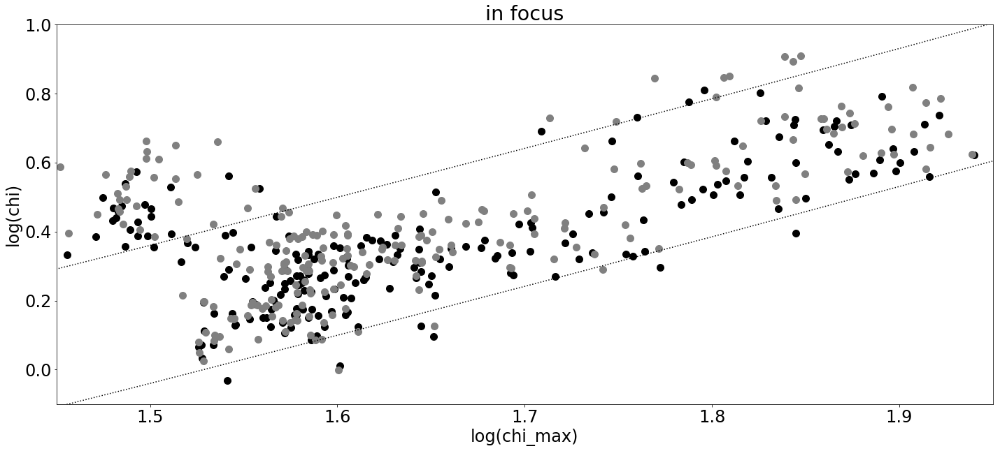

In [160]:
plt.figure(figsize=(24,10))
plt.plot(np.log10(results_of_fit_many_Ar['0']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar['0']['chi2'].values),ls='',marker='o',color='black',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ar_Sep0521['0']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar_Sep0521['0']['chi2'].values),ls='',marker='o',color='gray',label='Ar',markersize=10)
# plt.plot(np.log10(results_of_fit_many_Ne['0']['chi2max'].values),
#          np.log10(results_of_fit_many_Ne['0']['chi2'].values),ls='',marker='o',color='red',label='Ne',markersize=10)
# plt.plot(np.log10(results_of_fit_many_Kr['0']['chi2max'].values),
#          np.log10(results_of_fit_many_Kr['0']['chi2'].values),ls='',marker='o',color='blue',label='Kr',markersize=10)
plt.xlabel('log(chi_max)')
plt.ylabel('log(chi)')
plt.title('in focus')
plt.plot(np.arange(1,2.1,0.1),np.arange(1,2.1,0.1)**1.25-1.7,color='black',ls=':')
plt.plot(np.arange(1,2.1,0.1),np.arange(1,2.1,0.1)**1.25-1.3,color='black',ls=':')
plt.xlim(1.45,1.95)
plt.ylim(-0.1,1)

In [162]:
label_focus='0'

values_Ar_improvment_focus=np.log10(results_of_fit_many_Ar[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Ar[label_focus]['chi2max'].values)
x_Ar_focus=finalAr.loc[results_of_fit_many_Ar[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Ar_focus=finalAr.loc[results_of_fit_many_Ar[label_focus].index.astype(int).ravel()]['yc'].values

#values_Ne_improvment_focus=np.log10(results_of_fit_many_Ne[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Ne[label_focus]['chi2max'].values)
#x_Ne_focus=finalNe.loc[results_of_fit_many_Ne[label_focus].index.astype(int).ravel()]['xc_effective'].values
#y_Ne_focus=finalNe.loc[results_of_fit_many_Ne[label_focus].index.astype(int).ravel()]['yc'].values

#values_Kr_improvment_focus=np.log10(results_of_fit_many_Kr[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Kr[label_focus]['chi2max'].values)
#x_Kr_focus=finalKr.loc[results_of_fit_many_Kr[label_focus].index.astype(int).ravel()]['xc_effective'].values
#y_Kr_focus=finalKr.loc[results_of_fit_many_Kr[label_focus].index.astype(int).ravel()]['yc'].values

min_colors_improvment=np.min(values_Ar_improvment_focus)
max_colors_improvment=np.max(values_Ar_improvment_focus)

label_defocus='m4'

values_Ar_improvment_defocus=np.log10(results_of_fit_many_Ar[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Ar[label_defocus]['chi2max'].values)
x_Ar_defocus=finalAr.loc[results_of_fit_many_Ar[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Ar_defocus=finalAr.loc[results_of_fit_many_Ar[label_defocus].index.astype(int).ravel()]['yc'].values

#values_Ne_improvment_defocus=np.log10(results_of_fit_many_Ne[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Ne[label_defocus]['chi2max'].values)
#x_Ne_defocus=finalNe.loc[results_of_fit_many_Ne[label_defocus].index.astype(int).ravel()]['xc_effective'].values
#y_Ne_defocus=finalNe.loc[results_of_fit_many_Ne[label_defocus].index.astype(int).ravel()]['yc'].values

#values_Kr_improvment_defocus=np.log10(results_of_fit_many_Kr[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Kr[label_defocus]['chi2max'].values)
#x_Kr_defocus=finalKr.loc[results_of_fit_many_Kr[label_defocus].index.astype(int).ravel()]['xc_effective'].values
#y_Kr_defocus=finalKr.loc[results_of_fit_many_Kr[label_defocus].index.astype(int).ravel()]['yc'].values

min_colors_improvment_defocus=np.min(values_Ar_improvment_defocus)
max_colors_improvment_defocus=np.max(values_Ar_improvment_defocus)

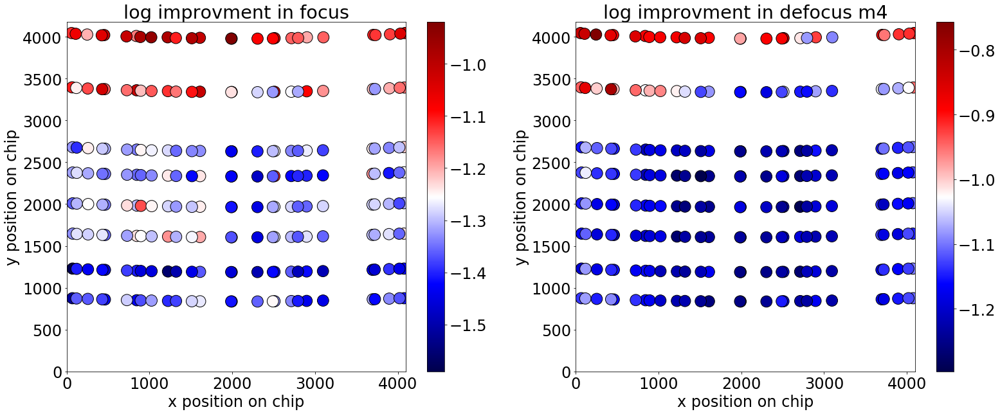

In [164]:
plt.figure(figsize=(26,10))

plt.subplot(121)
plt.scatter(x_Ar_focus, y_Ar_focus, s=np.pi * (10 * 1)**2, c=values_Ar_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='o')
#plt.scatter(x_Ne_focus, y_Ne_focus, s=np.pi * (7 * 1)**2, c=values_Ne_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='s')
#plt.scatter(x_Kr_focus, y_Kr_focus, s=np.pi * (10 * 1)**2, c=values_Kr_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in focus')
plt.colorbar()

plt.subplot(122)
plt.scatter(x_Ar_defocus, y_Ar_defocus, s=np.pi * (10 * 1)**2, c=values_Ar_improvment_defocus, \
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='o')
#plt.scatter(x_Ne_defocus, y_Ne_defocus, s=np.pi * (7 * 1)**2, c=values_Ne_improvment_defocus,\
#            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='s')
#plt.scatter(x_Kr_defocus, y_Kr_defocus, s=np.pi * (10 * 1)**2, c=values_Kr_improvment_defocus,\
#            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in defocus '+label_defocus)
plt.colorbar()

## continue

In [165]:
x_Ar_focus

array([69, 3692, 3692, 3692, 3693, 3697, 3702, 4074, 59, 4072, 4071, 4071,
       4071, 4072, 4077, 4085, 461, 462, 463, 463, 463, 462, 459, 453,
       845, 846, 846, 71, 847, 846, 846, 844, 840, 1223, 1223, 1224, 1224,
       1223, 1223, 1222, 1219, 1610, 73, 1610, 1610, 1610, 1610, 1610,
       1609, 1608, 73, 1992, 1992, 1992, 1992, 1992, 1992, 1992, 72, 1991,
       2509, 2509, 2508, 2508, 2508, 72, 2509, 2509, 2510, 2897, 2897,
       2896, 66, 2896, 2896, 2897, 2898, 2900, 3695, 3693, 118, 120, 122,
       122, 122, 121, 116, 109, 255, 257, 258, 259, 258, 258, 254, 247,
       429, 431, 432, 432, 432, 431, 428, 423, 727, 728, 729, 729, 729,
       729, 726, 722, 894, 895, 896, 896, 896, 896, 894, 890, 1024, 1025,
       1025, 1026, 1025, 1025, 1024, 1021, 1320, 1321, 1321, 1321, 1321,
       1321, 1320, 1318, 1511, 1512, 1512, 1512, 1512, 1512, 1512, 1511,
       1986, 1986, 1987, 1987, 1987, 1987, 1987, 1987, 2304, 2303, 2303,
       2303, 2303, 2303, 2304, 2304, 2489, 2489, 24

In [184]:
import argparse
parser = argparse.ArgumentParser(description="Starting args import",
                                 formatter_class=argparse.RawTextHelpFormatter,
                                 epilog='Done with import')

parser.add_argument(
    "-arc",
    help="which arc lamp is being analyzed (HgAr for Mercury-Argon, \
                    Ne for Neon, Kr for Krypton)  ",
    nargs='+',
    choices=["HgAr", "Ar", "Ne", "Kr", "1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
namespace = 'Ne'
parser.parse_args(['-arc','Ar', 'Ne', 'Kr', '8', '3', '1'])

Namespace(arc=['Ar', 'Ne', 'Kr', '8', '3', '1'])

In [ ]:
# list of labels that we are passing to the algorithm, that are `clean`
list_of_labelInput = []
for obs in list_of_obs_cleaned:
    labelInput = label[list(obs_possibilites).index(obs)]
    list_of_labelInput.append(labelInput)

In [ ]:
# create list_of_obs

IndexError: string index out of range

In [21]:
z4Input_possibilites = np.array([28, 24.5, 21, 17.5, 14, 10.5, 7, 3.5, 0,
                                 -3.5, -7, -10.5, -14, -17.5, -21, -24.5, -28, 0])
label = ['m4', 'm35', 'm3', 'm25', 'm2', 'm15', 'm1', 'm05', '0',
         'p05', 'p1', 'p15', 'p2', 'p25', 'p3', 'p35', 'p4', '0p']

In [25]:
list_of_labelInput = ['m4','0','p4']
len_of_list_of_labelInput = len(list_of_labelInput)

obs_possibilites = np.array([51485,
                             51485 + 12,
                             51485 + 2 * 12,
                             51485 + 3 * 12,
                             51485 + 4 * 12,
                             51485 + 5 * 12,
                             51485 + 6 * 12,
                             51485 + 7 * 12,
                             51485 + 8 * 12,
                             51485 + 9 * 12,
                             51485 + 10 * 12,
                             51485 + 11 * 12,
                             51485 + 12 * 12,
                             51485 + 13 * 12,
                             51485 + 14 * 12,
                             51485 + 15 * 12,
                             51485 + 16 * 12,
                             51485 + 8 * 12])

In [26]:
list_of_obs_cleaned = []
for label_i in list_of_labelInput:
    obs_cleaned = obs_possibilites[list(label).index(label_i)]
    list_of_obs_cleaned.append(obs_cleaned)
    
list_of_obs_cleaned

[51485, 51581, 51677]

In [19]:
list(list_of_labelInput)

['m4', '0', 'p4']

In [ ]:
list_of_wavelengths = []
for s in range(len(list_of_spots)):
    single_number = list_of_spots[s]
    wavelength = float(finalArc.iloc[int(single_number)]['wavelength'])
    print("wavelength used for spot "+str(s)+" [nm] is: " + str(wavelength))
    list_of_wavelengths.append(wavelength)
array_of_wavelengths = np.array(list_of_wavelengths)

In [ ]:
def give_finalArc()

In [ ]:
if arc == "HgAr":
    results_of_fit_input = results_of_fit_input_HgAr
    # finalArc = finalHgAr_Feb2020_dataset
elif arc == "Ne":
    results_of_fit_input = results_of_fit_input_Ne
    finalArc = finalNe_Feb2020_dataset
elif arc == "Kr":
    results_of_fit_input = results_of_fit_input_Kr
    finalArc = finalKr_Feb2020_dataset
elif arc == "Ar":
    results_of_fit_input = results_of_fit_input_HgAr
    finalArc = finalAr_Feb2020_dataset


In [9]:
import argparse

In [10]:
parser = argparse.ArgumentParser(description="Starting args import",
                                 formatter_class=argparse.RawTextHelpFormatter,
                                 epilog='Done with import')

##########################################################################
print('#####################################################################################################')

##########################################################################
print('Start time is: ' + time.ctime())
time_start = time.time()


################################################
# nargs '+' specifies that the algorithm can accept one or more arguments
parser.add_argument(
    "-label",
    help="name of the observation (actually a number/numbers) which we will analyze",
    nargs='+',
    type=str,
    choices=['m4', 'm35', 'm3', 'm25', 'm2', 'm15', 'm1', 'm05', '0',
             'p05', 'p1', 'p15', 'p2', 'p25', 'p3', 'p35', 'p4', '0p'])
################################################
# name of the spot (again, actually number) which we will analyze
parser.add_argument(
    "-spot",
    help="name of the spot (again, actually a number) which we will analyze",
    nargs='+',
    type=int,
    default=argparse.SUPPRESS)
################################################
# number of steps each walker will take
parser.add_argument(
    "-nsteps",
    help="number of steps each walker will take ",
    type=int)
################################################
# input argument that controls the paramters of the cosmo_hammer process
# if in doubt, eps=8 is probably a solid option
parser.add_argument(
    "-eps",
    help="input argument that controls the paramters of the cosmo_hammer process;\
                    if in doubt, eps=8 is probably a solid option ",
    type=int)
################################################
# which dataset is being analyzed [numerical value of 0,1,2,3,4 or 5]
parser.add_argument("-dataset", help="which dataset is being analyzed\
                    [numerical value between 0 and 8] ", type=int, choices=[0, 1, 2, 3, 4, 5, 6, 7, 8])
################################################
parser.add_argument(
    "-arc",
    help="which arc lamp is being analyzed (HgAr for Mercury-Argon, \
                    Ne for Neon, Kr for Krypton)  ",
    nargs='+',
    type=str,
    choices=["HgAr", "Ar", "Ne", "Kr", "1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
################################################
parser.add_argument(
    "-double_sources",
    help="are there two sources in the image (True, False) ",
    default='False',
    type=str,
    choices=[
        'True',
         'False'])
################################################
parser.add_argument(
    "-double_sources_positions_ratios",
    help="parameters for second source ",
    action='append')
################################################
parser.add_argument("-twentytwo_or_extra", help="number of Zernike components\
                    (22 or number larger than 22 which leads to extra Zernike analysis)", type=int)
################################################
parser.add_argument("-date_of_input", help="input date")
################################################
parser.add_argument(
    "-direct_or_interpolation",
    help="direct or interpolation ",
    choices=[
        "direct",
         "interpolation"])
################################################
parser.add_argument("-date_of_output", help="date_of_output ")
################################################
parser.add_argument("-analysis_type", help="defocus or focus? ")
################################################


#####################################################################################################
Start time is: Mon Dec  6 10:41:49 2021


_StoreAction(option_strings=['-analysis_type'], dest='analysis_type', nargs=None, const=None, default=None, type=None, choices=None, help='defocus or focus? ', metavar=None)

In [11]:
args = parser.parse_args(['-label', 'm4', '0', 'p4', '-spot', '253', '255', '257', '258', '259', '260', '261', '263', '191',
                   '-nsteps', '51', '-eps', '8', '-dataset', '8', '-arc', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ne', '-double_sources', 'False',
                    '-double_sources_positions_ratios', '[0.0,0.0]', '-twentytwo_or_extra', '56', '-date_of_input', 'Sep0521',
                    '-direct_or_interpolation', 'direct', '-date_of_output', 'Nov1421', '-analysis_type', 'defocus' ])

In [12]:
import socket

In [13]:
from copy import deepcopy

In [14]:
# Related third party imports
import multiprocessing
from multiprocessing import Pool

In [15]:
list_of_labelInput = args.label
len_of_list_of_labelInput = len(list_of_labelInput)
# len_of_list_of_obs = len(list_of_obs)

# if you passed only one value, somehow put in a list and make sure that
# the code runs
# print('all values in the obs_list is/are: ' + str(list_of_obs))
# print('number of images analyzed is: ' + str(len_of_list_of_obs))

if len_of_list_of_labelInput > 1:
    multi_var = True
else:
    multi_var = False
    
    
list_of_spots = args.spot
len_of_list_of_spots = len(list_of_spots)


print('all values in the list_of_spots is/are: ' + str(list_of_spots))
print('number of spots analyzed is: ' + str(len_of_list_of_spots))

if len_of_list_of_spots > 1:
    multi_spots = True
else:
    multi_spots = False

# if only one spots, use single_number variable
if multi_spots is False:
    single_number = int(args.spot)
    print('spot number (single_number) is: ' + str(single_number))
    
    
nsteps = args.nsteps
print('nsteps is: ' + str(nsteps))
################################################
eps = args.eps

################################################
dataset = args.dataset

print('Dataset analyzed is: ' + str(dataset))
if dataset == 0 or dataset == 1:
    print('ehm.... old data, not analyzed')

# folder contaning the data from December 2017
# dataset 0
# DATA_FOLDER='/tigress/ncaplar/Data/Dec18Data/'

# folder contaning the data from February 2019
# dataset 1
# DATA_FOLDER='/tigress/ncaplar/Data/Feb5Data/'

# folder containing the data taken with F/2.8 stop in April and May 2019
# dataset 2
if dataset == 2:
    DATA_FOLDER = '/tigress/ncaplar/ReducedData/Data_May_28/'

# folder containing the data taken with F/2.8 stop in April and May 2019
# dataset 3
if dataset == 3:
    DATA_FOLDER = '/tigress/ncaplar/ReducedData/Data_Jun_25/'

# folder containing the data taken with F/2.8 stop in July 2019
# dataset 4 (defocu) and 5 (fine defocus)
if dataset == 4 or dataset == 5:
    DATA_FOLDER = '/tigress/ncaplar/ReducedData/Data_Aug_14/'

# folder contaning the data taken with F/2.8 stop in November 2020 on Subaru
if dataset == 6:
    DATA_FOLDER = '/tigress/ncaplar/ReducedData/Data_Nov_20/'

# folder contaning the data taken with F/2.8 stop in June 2021, at LAM, on SM2
if dataset == 7:
    DATA_FOLDER = '/tigress/ncaplar/ReducedData/Data_May_21_2021/'

# folder contaning the data taken with F/2.8 stop in June 2021, at Subaru
# (21 fibers)
if dataset == 8:
    if 'subaru' in socket.gethostname():
        DATA_FOLDER = '/work/ncaplar/ReducedData/Data_May_25_2021/'
    else:
        DATA_FOLDER = '/tigress/ncaplar/ReducedData/Data_May_25_2021/'


STAMPS_FOLDER = DATA_FOLDER + 'Stamps_cleaned/'
DATAFRAMES_FOLDER = DATA_FOLDER + 'Dataframes/'
if 'subaru' in socket.gethostname():
    RESULT_FOLDER = '/work/ncaplar/Results/'
else:
    RESULT_FOLDER = '/tigress/ncaplar/Results/'
# RESULT_FOLDER = '/scratch/gpfs/ncaplar/Results/'

################################################
arc = args.arc
list_of_arc = args.arc
print('arc lamp is: ' + str(arc))
print('list_of_arc' + str(list_of_arc))

################################################
print('double_sources argument: ' + str(args.double_sources))


def str2bool(v):
    """
    Small function that take a string and gives back boolean value

    """

    if isinstance(v, bool):
        return v
    if v.lower() in ('yes', 'true', 't', 'y', '1', 'True'):
        return True
    elif v.lower() in ('no', 'false', 'f', 'n', '0', 'False'):
        return False
    else:
        raise argparse.ArgumentTypeError('Boolean value expected.')


double_sources = str2bool(args.double_sources)

print('double sources argument is: ' + str(double_sources))
################################################
double_sources_positions_ratios = eval(args.double_sources_positions_ratios[0])
print('double source parameters are: ' + str(double_sources_positions_ratios))
################################################
twentytwo_or_extra = args.twentytwo_or_extra
print('22_or_extra parameter is: ' + str(twentytwo_or_extra))

################################################
parser.add_argument("date_of_input", help="input date")
date_of_input = args.date_of_input
print('date of input database: ' + str(date_of_input))
################################################
parser.add_argument("direct_or_interpolation", help="direct or interpolation ",
                    choices=["direct", "interpolation"])
direct_or_interpolation = args.direct_or_interpolation
print('direct or interpolation: ' + str(direct_or_interpolation))
################################################
parser.add_argument("date_of_output", help="date_of_output ")
date_of_output = args.date_of_output
print('date of output: ' + str(date_of_output))
################################################
parser.add_argument("analysis_type", help="analysis_type ")
analysis_type = args.analysis_type
print('analysis_type: ' + str(analysis_type))
################################################



Zernike_estimation_preparation_instance = \
    Zernike_estimation_preparation(list_of_labelInput=list_of_labelInput,
                                   list_of_spots=list_of_spots, dataset=dataset,
                                   list_of_arc=list_of_arc, eps=eps, nsteps=nsteps)

particleCount, c1, c2 = Zernike_estimation_preparation_instance.return_auxiliary_info()


array_of_sci_images_multi_spot, array_of_var_images_multi_spot,\
    array_of_mask_images_multi_spot, array_of_obs_cleaned_multi_spot = \
    Zernike_estimation_preparation_instance.get_sci_var_mask_data()

################################################
# (2.) create output names
################################################

# name of the outputs
# create list with names for each spot

list_of_NAME_OF_CHAIN, list_of_NAME_OF_LIKELIHOOD_CHAIN =\
    Zernike_estimation_preparation_instance.create_output_names(date_of_output)

# TODO: evaluate if all of these different inputs are needed
# list_of_defocuses_input_long input in Tokovinin algorithm
list_of_defocuses_input_long = list_of_labelInput

print('list_of_labelInput: ' + str(list_of_labelInput))

# list of labels without values near focus (for possible analysis with
# Tokovinin alrogithm)
list_of_labelInput_without_focus_or_near_focus = deepcopy(list_of_labelInput)
for i in ['m15', 'm1', 'm05', '0', 'p05', 'p1', 'p15']:
    if i in list_of_labelInput:
        list_of_labelInput_without_focus_or_near_focus.remove(i)

print('list_of_labelInput_without_focus_or_near_focus: ' +
      str(list_of_labelInput_without_focus_or_near_focus))

# positional indices of the defocused data in the whole set of input data
# (for possible analysis with Tokovinin alrogithm)
index_of_list_of_labelInput_without_focus_or_near_focus = []
for i in list_of_labelInput_without_focus_or_near_focus:
    index_of_list_of_labelInput_without_focus_or_near_focus.append(
        list_of_labelInput.index(i))

print('index_of_list_of_labelInput_without_focus_or_near_focus: ' +
      str(index_of_list_of_labelInput_without_focus_or_near_focus))


# Input the zmax that you wish to achieve in the analysis
zmax = twentytwo_or_extra

array_of_wavelengths = Zernike_estimation_preparation_instance.create_array_of_wavelengths()

print('print check just before the pool of workers is created')
if 'subaru' in socket.gethostname():
    pool = Pool(32)
else:
    pool = Pool(processes=multiprocessing.cpu_count())
# pool = Pool(processes=32)
print('print check just after the pool of workers is created')


################################################
# (5.) Create Tokovinin algorithm instances
################################################

list_of_Tokovinin_multi_instance_with_pool = []
for s in range(len(list_of_spots)):
    list_of_Tokovinin_multi_instance_with_pool.append(Tokovinin_multi(
        array_of_sci_images_multi_spot[s],
        array_of_var_images_multi_spot[s],
        list_of_mask_images=array_of_mask_images_multi_spot[s],
        wavelength=array_of_wavelengths[s],
        dithering=1,
        save=0,
        verbosity=0,
        npix=1536,
        zmax=twentytwo_or_extra,
        list_of_defocuses=list_of_defocuses_input_long,
        double_sources=double_sources,
        double_sources_positions_ratios=double_sources_positions_ratios,
        fit_for_flux=True,
        test_run=False,
        num_iter=None,
        pool=pool))

list_of_Tokovinin_multi_instance_without_pool = []
for s in range(len(list_of_spots)):
    list_of_Tokovinin_multi_instance_without_pool.append(Tokovinin_multi(
        array_of_sci_images_multi_spot[s],
        array_of_var_images_multi_spot[s],
        list_of_mask_images=array_of_mask_images_multi_spot[s],
        wavelength=array_of_wavelengths[s],
        dithering=1,
        save=0,
        verbosity=0,
        npix=1536,
        zmax=twentytwo_or_extra,
        list_of_defocuses=list_of_defocuses_input_long,
        double_sources=double_sources,
        double_sources_positions_ratios=double_sources_positions_ratios,
        fit_for_flux=True,
        test_run=False,
        num_iter=None,
        pool=None))
    
################################################
# (6.) Create parametrization proposals
################################################

array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d =\
    Zernike_estimation_preparation_instance.create_parametrization_proposals(date_of_input,
                                                                             direct_or_interpolation,
                                                                             twentytwo_or_extra)


################################################
# (8.) Create init parameters for particles
################################################

list_of_array_of_particle_position_proposal, list_of_array_of_particle_velocity_proposal,\
    list_of_best_particle_likelihood, paramCount =\
    Zernike_estimation_preparation_instance.create_init_parameters_for_particles()

all values in the list_of_spots is/are: [253, 255, 257, 258, 259, 260, 261, 263, 191]
number of spots analyzed is: 9
nsteps is: 51
Dataset analyzed is: 8
arc lamp is: ['Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ne']
list_of_arc['Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ne']
double_sources argument: False
double sources argument is: False
double source parameters are: [0.0, 0.0]
22_or_extra parameter is: 56
date of input database: Sep0521
direct or interpolation: direct
date of output: Nov1421
analysis_type: defocus
Dataset analyzed is: 8
self.list_of_arc: ['Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ar', 'Ne']
arc: Ar
obs_possibilites: [51485 51497 51509 51521 51533 51545 51557 51569 51581 51593 51605 51617
 51629 51641 51653 51665 51677 51581]
arc: Ar
obs_possibilites: [51485 51497 51509 51521 51533 51545 51557 51569 51581 51593 51605 51617
 51629 51641 51653 51665 51677 51581]
arc: Ar
obs_possibilites: [51485 51497 51509 51521 51533 51545 51557 51569 51581 51593 51605 516

results_of_fit_input_Ar is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Ar_from_Sep0521.pkl'>
wavelength used for spot 0 [nm] is: 696.7261
results_of_fit_input_Ar is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Ar_from_Sep0521.pkl'>
wavelength used for spot 1 [nm] is: 727.47876
results_of_fit_input_Ar is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Ar_from_Sep0521.pkl'>
wavelength used for spot 2 [nm] is: 763.74286
results_of_fit_input_Ar is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Ar_from_Sep0521.pkl'>
wavelength used for spot 3 [nm] is: 795.0522
results_of_fit_input_Ar is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_f

results_of_fit_input_Ne is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Ne_from_Sep0521.pkl'>
adding label m4 with single_number 191 for creation of array_of_allparameters
Int64Index([ 11,  14,  15,   2,  20,  23,  24,  29,  32,  33,
            ...
            267, 268, 272, 275, 276, 277,  92,  95,  96,  97],
           dtype='int64', length=106)
Solution for this spot is avaliable
results_of_fit_input[m4].loc[191].values[   36.1027888     -0.48525596    -1.06230213     0.66823493
    -0.10837627    -0.21021855    -0.3242519     -0.5679567
     0.07543596     0.04071622    -0.08430083     0.0400085
    -0.01075338     0.04506969     0.01812126     0.01390309
    -0.03113094     0.00673414     0.03071088     0.64780518
     0.07898401     0.04884243    -0.10940403     0.05577537
     0.01916441     0.0928209      0.14350115     0.02768045
     3.32826025     0.05740933    -0.0498417      0.92040681
     0.072

array_of_polyfit_1_parameterizations_proposal_shape_2d: [[   -8.76681583     0.36987418]
 [   -0.18552852    -0.93442173]
 [    0.02516948    -0.33448169]
 [   -0.07745668     0.65126978]
 [   -0.13737418    -1.28183722]
 [    0.00611342     0.26273895]
 [    0.03121833    -0.09281634]
 [   -0.23884567     0.14629792]
 [   -0.01661951    -0.12517834]
 [    0.00756473     0.12586518]
 [    0.00854526    -0.00280377]
 [   -0.00448358     0.00613514]
 [   -0.02476174    -0.226039  ]
 [   -0.07568636     0.15059854]
 [   -0.01114557     0.03197463]
 [    0.00050921     0.01669671]
 [   -0.00328568    -0.03076409]
 [   -0.00507909     0.05061665]
 [   -0.1371993      0.01795012]
 [    0.             0.67224874]
 [    0.             0.07419977]
 [    0.             0.13870071]
 [    0.            -0.08935021]
 [    0.             0.05511782]
 [    0.             0.04013174]
 [    0.             0.24992228]
 [    0.             0.10006089]
 [    0.             0.52370603]
 [    0.            

In [18]:
array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d[8]

array([[   -8.98706676,     0.15452177],
       [    0.02401871,    -0.38918113],
       [    0.04349772,    -0.88831123],
       [    0.0313218 ,     0.79352211],
       [   -0.06019307,    -0.34914854],
       [    0.00352025,    -0.19613754],
       [    0.02337789,    -0.23074034],
       [    0.04255208,    -0.39774837],
       [   -0.00037868,     0.07392125],
       [   -0.00689517,     0.01313555],
       [    0.01994138,    -0.00453533],
       [   -0.00043882,     0.03825323],
       [   -0.00755116,    -0.04095802],
       [   -0.00751314,     0.01501713],
       [   -0.00672174,    -0.00876568],
       [   -0.00335419,     0.00048634],
       [    0.00422451,    -0.0142329 ],
       [    0.00463629,     0.0252793 ],
       [   -0.00223447,     0.02177299],
       [    0.        ,     0.67224874],
       [    0.        ,     0.07419977],
       [    0.        ,     0.13870071],
       [   -0.        ,    -0.10940403],
       [    0.        ,     0.05511782],
       [    0.  

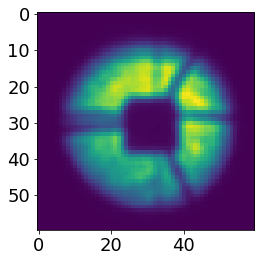

In [22]:
plt.imshow(array_of_sci_images_multi_spot[8][2])

In [24]:
array_of_var_images_multi_spot[8][2]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

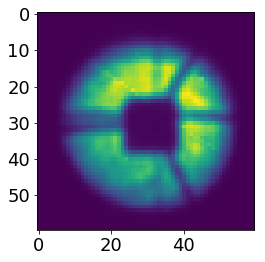

In [27]:
plt.imshow(array_of_mask_images_multi_spot[8][2])

# December run 

In [14]:
import glob

#finalAr_wrong_secondary=np.load("/tigress/ncaplar/ReducedData/Data_May_21_2021/Dataframes/finalAr_Jul2021_wrong_secondary",allow_pickle=True)
finalAr=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalAr_Jul2021",allow_pickle=True)
finalNe=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalNe_Jul2021",allow_pickle=True)
finalKr=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalKr_Jul2021",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

In [15]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Sep0521/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )
    
results_of_fit_many_Ar_Sep0521=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Sep0521.pkl',allow_pickle=True)
results_of_fit_many_Ne_Sep0521=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Sep0521.pkl',allow_pickle=True)
results_of_fit_many_Kr_Sep0521=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Sep0521.pkl',allow_pickle=True)

## Creating fake input dataframes

In [82]:
        columns22 = [
            'z4',
            'z5',
            'z6',
            'z7',
            'z8',
            'z9',
            'z10',
            'z11',
            'z12',
            'z13',
            'z14',
            'z15',
            'z16',
            'z17',
            'z18',
            'z19',
            'z20',
            'z21',
            'z22',
            'hscFrac',
            'strutFrac',
            'dxFocal',
            'dyFocal',
            'slitFrac',
            'slitFrac_dy',
            'wide_0',
            'wide_23',
            'wide_43',
            'misalign',
            'x_fiber',
            'y_fiber',
            'effective_radius_illumination',
            'frd_sigma',
            'frd_lorentz_factor',
            'det_vert',
            'slitHolder_frac_dx',
            'grating_lines',
            'scattering_slope',
            'scattering_amplitude',
            'pixel_effect',
            'fiber_r',
            'flux']

In [76]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Nov2221/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )
    
results_of_fit_many_Ar_Nov2221=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Nov2221.pkl',allow_pickle=True)

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Sep0521/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )
    
results_of_fit_many_Ne_Sep0521=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Sep0521.pkl',allow_pickle=True)
results_of_fit_many_Kr_Sep0521=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Sep0521.pkl',allow_pickle=True)

In [86]:
all_fibers = np.unique(finalAr['fiber'])
all_fibers

array([2, 12, 32, 60, 63, 110, 111, 161, 192, 210, 223, 255, 259, 289,
       339, 341, 360, 400, 401, 418, 449, 464, 497, 518, 525, 545, 587,
       593, 621, 643, 650], dtype=object)

0      False
1      False
2      False
3      False
4      False
5      False
6      False
7      False
8      False
9      False
10     False
11     False
12     False
13     False
14     False
15     False
16     False
17     False
18     False
19     False
20     False
21     False
22     False
23     False
24     False
25     False
26     False
27     False
28     False
29     False
       ...  
342    False
343    False
344    False
345    False
346    False
347    False
348    False
349    False
350    False
351    False
352    False
353    False
354    False
355    False
356    False
357    False
358    False
359    False
360    False
361    False
362    False
363    False
364    False
365    False
366    False
367    False
368    False
369    False
370    False
371    False
Name: fiber, Length: 372, dtype: bool

In [115]:
single_fiber_member=list((finalAr.index[finalAr['fiber'] == 2]).astype(str))
single_fiber_member

['108',
 '109',
 '110',
 '111',
 '112',
 '113',
 '114',
 '115',
 '116',
 '117',
 '118',
 '119']

In [132]:
single_fiber_results_m4 = results_of_fit_many_Ar_Nov2221['m4'].loc[single_fiber_member].dropna()

hscFrac_single_fiber = np.median(single_fiber_results_m4['hscFrac'])
strutFrac_single_fiber = np.median(single_fiber_results_m4['strutFrac'])
dxFocal_single_fiber = np.median(single_fiber_results_m4['dxFocal'])
slitFrac_single_fiber = np.median(single_fiber_results_m4['slitFrac'])


misalign_single_fiber = np.median(single_fiber_results_m4['misalign'])
x_fiber_single_fiber = np.median(single_fiber_results_m4['x_fiber'])
y_fiber_single_fiber = np.median(single_fiber_results_m4['y_fiber'])

effective_radius_illumination_single_fiber = np.median(single_fiber_results_m4['effective_radius_illumination'])
frd_sigma_single_fiber = np.median(single_fiber_results_m4['frd_sigma'])

frd_lorentz_factor_single_fiber = np.median(single_fiber_results_m4['frd_lorentz_factor'])

slitHolder_frac_dx_single_fiber = np.median(single_fiber_results_m4['slitHolder_frac_dx'])
fiber_r_single_fiber = np.median(single_fiber_results_m4['fiber_r'])

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  """Entry point for launching an IPython kernel.


In [ ]:
# unified_names = 

In [194]:
for fiber in all_fibers:
    for label in ['m4','0','p4']:
        for name in unified_names:
            single_fiber_member=list((finalAr.index[finalAr['fiber'] == 2]).astype(str))
            single_fiber_results_m4 = results_of_fit_many_Ar_Nov2221['m4'].loc[single_fiber_member].dropna()
            hscFrac_single_fiber = np.median(single_fiber_results_m4[name])
            single_fiber_member_index=list(results_of_fit_many_Ne_Sep0521['m4'].loc[single_fiber_member].dropna().index)
            results_of_fit_many_Ne_Sep0521[label].loc[single_fiber_member_index,name]= hscFrac_single_fiber

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  """
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  import sys


In [196]:
for fiber in all_fibers:
    for label in ['m4','0','p4']:
        for name in unified_names:
            single_fiber_member=list((finalAr.index[finalAr['fiber'] == 2]).astype(str))
            single_fiber_results_m4 = results_of_fit_many_Ar_Nov2221['m4'].loc[single_fiber_member].dropna()
            hscFrac_single_fiber = np.median(single_fiber_results_m4[name])
            single_fiber_member_index=list(results_of_fit_many_Kr_Sep0521['m4'].loc[single_fiber_member].dropna().index)
            results_of_fit_many_Kr_Sep0521[label].loc[single_fiber_member_index,name]= hscFrac_single_fiber

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  """
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  import sys


In [199]:
date = 'Nov2221'
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

#with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl', 'wb') as f:
#    pickle.dump(results_of_fit_many_direct_Ar_10,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Nov2221.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne_Sep0521,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Nov2221.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr_Sep0521,f, protocol=pickle.HIGHEST_PROTOCOL)

## scripts 

### scripts for 10 fiber

In [30]:
fibers_10=np.unique(finalAr[finalAr.index<120]['fiber'])

In [31]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)<120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)<90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)<40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

80
40
10
Int64Index([  1,   3,   5,   6,   7,   8,   9,  11,  13,  15,  17,  18,  19,
             20,  21,  23,  25,  27,  29,  30,  31,  32,  33,  35,  37,  39,
             41,  42,  43,  44,  45,  47,  49,  51,  53,  54,  55,  56,  57,
             59,  61,  63,  65,  66,  67,  68,  69,  71,  73,  75,  77,  78,
             79,  80,  81,  83,  85,  87,  89,  90,  91,  92,  93,  95,  97,
             99, 101, 102, 103, 104, 105, 107, 109, 111, 113, 114, 115, 116,
            117, 119],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31, 35, 39], dtype='int64')


In [32]:
single_fiber_Ar=finalAr[finalAr['fiber']==fibers_10[0]]
single_fiber_Ar_close=single_fiber_Ar[single_fiber_Ar['close']=='1']
single_fiber_Ar_close=single_fiber_Ar_close.loc[results_of_fit_many_Ar_Sep0521['m4'].index.astype(int)].dropna()

single_fiber_Ne=finalNe[finalNe['fiber']==fibers_10[0]]
single_fiber_Ne_close=single_fiber_Ne[single_fiber_Ne['close']=='1']
single_fiber_Ne_close=single_fiber_Ne_close.loc[results_of_fit_many_Ne_Sep0521['m4'].index.astype(int)].dropna()

single_fiber_Kr=finalKr[finalKr['fiber']==fibers_10[0]]
single_fiber_Kr_close=single_fiber_Kr[single_fiber_Kr['close']==1]
single_fiber_Kr_close=single_fiber_Kr_close.loc[results_of_fit_many_Kr_Sep0521['m4'].index.astype(int)].dropna()

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  import sys
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_

In [33]:
single_fiber_Ne=finalNe[finalNe['fiber']==fibers_10[0]]
single_fiber_Ne

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
81,2,4013,348,650.84186,0,Ne,4082,30.12,0.406,0,0
82,2,4013,379,653.4774,-1,Ne,4082,0,0,0,0
83,2,4012,455,660.0668,1,Ne,4081,0,0,0,0
84,2,4011,547,668.01764,0,Ne,4080,44.24,0.67,-29.97,0.003
85,2,4011,592,671.9268,-1,Ne,4080,0,0,0,0
86,2,4008,835,693.13116,1,Ne,4077,0,0,0,0
87,2,4007,1116,717.59015,1,Ne,4076,0,0,0,0
88,2,4006,1198,724.72437,1,Ne,4075,0,0,0,0
89,2,4005,1421,744.1276,0,Ne,4074,38.57,0.012,57.44,0.162


In [34]:
single_fiber_Ne_close

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
83,2,4012,455,660.0668,1,Ne,4081,0,0,0,0
86,2,4008,835,693.13116,1,Ne,4077,0,0,0,0
87,2,4007,1116,717.59015,1,Ne,4076,0,0,0,0


In [67]:
single_fiber_Ar=finalAr[finalAr['fiber']==fibers_10[0]]
single_fiber_Ar_close=single_fiber_Ar[single_fiber_Ar['close']=='1']
single_fiber_Ar_close=single_fiber_Ar_close.loc[results_of_fit_many_Ar_Sep0521['m4'].index.astype(int)].dropna()

single_fiber_Ne=finalNe[finalNe['fiber']==fibers_10[0]]
single_fiber_Ne_close=single_fiber_Ne[single_fiber_Ne['close']=='1']
single_fiber_Ne_close=single_fiber_Ne_close.loc[results_of_fit_many_Ne_Sep0521['m4'].index.astype(int)].dropna()

single_fiber_Kr=finalKr[finalKr['fiber']==fibers_10[0]]
single_fiber_Kr_close=single_fiber_Kr[single_fiber_Kr['close']==1]
single_fiber_Kr_close=single_fiber_Kr_close.loc[results_of_fit_many_Kr_Sep0521['m4'].index.astype(int)].dropna()

list_of_index_single_fiber = list(single_fiber_Ar_close.index) + list(single_fiber_Ne_close.index)+ list(single_fiber_Kr_close.index)
list_of_arc_single_fiber = ['Ar']*len(single_fiber_Ar_close.index) + ['Ne']*len(single_fiber_Ne_close.index) + ['Kr']*len(single_fiber_Kr_close.index)

single_string_index = " ".join(np.array(list_of_index_single_fiber).astype(str))
single_string_arc = " ".join(np.array(list_of_arc_single_fiber).astype(str))

In [41]:
i=0
", ".join(list_of_Ar_to_analyze[i*8:(i+1)*8].astype(str))

'1, 3, 5, 6, 7, 8, 9, 11'

In [37]:
date='Dec0721'
single_spot=55
for f in range(10):
    double_source=False
    
    single_fiber_Ar=finalAr[finalAr['fiber']==fibers_10[f]]
    single_fiber_Ar_close=single_fiber_Ar[single_fiber_Ar['close']=='1']
    single_fiber_Ar_close=single_fiber_Ar_close.loc[results_of_fit_many_Ar_Sep0521['m4'].index.astype(int)].dropna()

    single_fiber_Ne=finalNe[finalNe['fiber']==fibers_10[f]]
    single_fiber_Ne_close=single_fiber_Ne[single_fiber_Ne['close']=='1']
    single_fiber_Ne_close=single_fiber_Ne_close.loc[results_of_fit_many_Ne_Sep0521['m4'].index.astype(int)].dropna()

    single_fiber_Kr=finalKr[finalKr['fiber']==fibers_10[f]]
    single_fiber_Kr_close=single_fiber_Kr[single_fiber_Kr['close']==1]
    single_fiber_Kr_close=single_fiber_Kr_close.loc[results_of_fit_many_Kr_Sep0521['m4'].index.astype(int)].dropna()

    list_of_index_single_fiber = list(single_fiber_Ar_close.index) + list(single_fiber_Ne_close.index)+ list(single_fiber_Kr_close.index)
    list_of_arc_single_fiber = ['Ar']*len(single_fiber_Ar_close.index) + ['Ne']*len(single_fiber_Ne_close.index) + ['Kr']*len(single_fiber_Kr_close.index)

    single_string_index = " ".join(np.array(list_of_index_single_fiber).astype(str))
    single_string_arc = " ".join(np.array(list_of_arc_single_fiber).astype(str))
    
    
    
    #single_spot=list_of_Ar_to_analyze[f*8:(f+1)*8][0]
    #if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
    #    double_source=True
    #else:
    #    double_source=False    
        
    #single_string=" ".join(list_of_Ar_to_analyze[f*8:(f+1)*8].astype(str))
    file = open('/home/ncaplar/Scripts/D_Ar_1_'+str(f)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_string_index)+\
               " -nsteps 21 -eps 8 -dataset 6 -arc "+str(single_string_arc)+" -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Nov2221 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  


"""
file = open('/home/ncaplar/Scripts/""'+date+'ScriptToSubmitScriptsDella_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()
"""

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:12: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  if sys.path[0] == '':
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:16: FutureWarning: 
Passing list-likes to .loc or [] wi

'\nfile = open(\'/home/ncaplar/Scripts/""\'+date+\'ScriptToSubmitScriptsDella_Ar_1_\'+\'.sh\',\'w\')\nfile.write("#!/bin/bash \n")\nfile.write("\n")\nfor single_spot in list_of_Ar_to_analyze:\n    file.write(\'sbatch /home/ncaplar/Scripts/D_Ar_1_\'+str(single_spot)+date+\'.sh \n\')\n\nfile.close()\n'

### scripts for 21 fiber

In [39]:
fibers_21=list(np.unique(finalAr[finalAr.index>120]['fiber']))
fibers_21.remove(110)
fibers_21.remove(111)

fibers_21=np.array(fibers_21)
fibers_21

array([ 12,  32,  60, 161, 210, 223, 259, 289, 341, 360, 400, 418, 449,
       497, 518, 545, 593, 621, 643])

In [40]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)>120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)>90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)>40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

168
84
21
Int64Index([121, 123, 125, 126, 127, 128, 129, 131, 133, 135,
            ...
            357, 359, 361, 363, 365, 366, 367, 368, 369, 371],
           dtype='int64', length=168)
Int64Index([ 92,  95,  96,  97, 101, 104, 105, 106, 110, 113, 114, 115, 119,
            122, 123, 124, 128, 131, 132, 133, 137, 140, 141, 142, 146, 149,
            150, 151, 155, 158, 159, 160, 164, 167, 168, 169, 173, 176, 177,
            178, 182, 185, 186, 187, 191, 194, 195, 196, 200, 203, 204, 205,
            209, 212, 213, 214, 218, 221, 222, 223, 227, 230, 231, 232, 236,
            239, 240, 241, 245, 248, 249, 250, 254, 257, 258, 259, 263, 266,
            267, 268, 272, 275, 276, 277],
           dtype='int64')
Int64Index([ 43,  47,  51,  55,  59,  63,  67,  71,  75,  79,  83,  87,  91,
             95,  99, 103, 107, 111, 115, 119, 123],
           dtype='int64')


In [41]:
single_fiber_Ar=finalAr[finalAr['fiber']==fibers_21[0]]
single_fiber_Ar_close=single_fiber_Ar[single_fiber_Ar['close']=='1']
single_fiber_Ar_close=single_fiber_Ar_close.loc[results_of_fit_many_Ar_Sep0521['m4'].index.astype(int)].dropna()

single_fiber_Ne=finalNe[finalNe['fiber']==fibers_21[0]]
single_fiber_Ne_close=single_fiber_Ne[single_fiber_Ne['close']=='1']
single_fiber_Ne_close=single_fiber_Ne_close.loc[results_of_fit_many_Ne_Sep0521['m4'].index.astype(int)].dropna()

single_fiber_Kr=finalKr[finalKr['fiber']==fibers_21[0]]
single_fiber_Kr_close=single_fiber_Kr[single_fiber_Kr['close']==1]
single_fiber_Kr_close=single_fiber_Kr_close.loc[results_of_fit_many_Kr_Sep0521['m4'].index.astype(int)].dropna()

list_of_index_single_fiber = list(single_fiber_Ar_close.index) + list(single_fiber_Ne_close.index)+ list(single_fiber_Kr_close.index)
list_of_arc_single_fiber = ['Ar']*len(single_fiber_Ar_close.index) + ['Ne']*len(single_fiber_Ne_close.index) + ['Kr']*len(single_fiber_Kr_close.index)

single_string_index = " ".join(np.array(list_of_index_single_fiber).astype(str))
single_string_arc = " ".join(np.array(list_of_arc_single_fiber).astype(str))

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  import sys
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_

In [42]:
date='Dec0721'
single_spot=55
for f in range(len(fibers_21)):
    #single_spot=list_of_Ar_to_analyze[f*8:(f+1)*8][0]
    #if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
    #    double_source=True
    #else:
    #    double_source=False    
    double_source=False 
    
    single_fiber_Ar=finalAr[finalAr['fiber']==fibers_21[f]]
    single_fiber_Ar_close=single_fiber_Ar[single_fiber_Ar['close']=='1']
    single_fiber_Ar_close=single_fiber_Ar_close.loc[results_of_fit_many_Ar_Sep0521['m4'].index.astype(int)].dropna()

    single_fiber_Ne=finalNe[finalNe['fiber']==fibers_21[f]]
    single_fiber_Ne_close=single_fiber_Ne[single_fiber_Ne['close']=='1']
    single_fiber_Ne_close=single_fiber_Ne_close.loc[results_of_fit_many_Ne_Sep0521['m4'].index.astype(int)].dropna()

    single_fiber_Kr=finalKr[finalKr['fiber']==fibers_21[f]]
    single_fiber_Kr_close=single_fiber_Kr[single_fiber_Kr['close']==1]
    single_fiber_Kr_close=single_fiber_Kr_close.loc[results_of_fit_many_Kr_Sep0521['m4'].index.astype(int)].dropna()

    list_of_index_single_fiber = list(single_fiber_Ar_close.index) + list(single_fiber_Ne_close.index)+ list(single_fiber_Kr_close.index)
    list_of_arc_single_fiber = ['Ar']*len(single_fiber_Ar_close.index) + ['Ne']*len(single_fiber_Ne_close.index) + ['Kr']*len(single_fiber_Kr_close.index)

    single_string_index = " ".join(np.array(list_of_index_single_fiber).astype(str))
    single_string_arc = " ".join(np.array(list_of_arc_single_fiber).astype(str))
    
    #single_string=" ".join(list_of_Ar_to_analyze[f*8:(f+1)*8].astype(str))
    file = open('/home/ncaplar/Scripts/D_Ar_2_'+str(f)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_string_index)+\
               " -nsteps 21 -eps 8 -dataset 8 -arc "+str(single_string_arc)+" -double_sources "+str('False')+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Nov2221 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  del sys.path[0]
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:21: FutureWarning: 
Passing list-likes to .loc or [] with any m

## checking 

In [9]:
results_of_fit_many_direct_Ne=np.load('/tigress/ncaplar/PFS/Fit_Results/Nov2221/results_of_fit_many_direct_Ne_from_Nov2221.pkl')

## which are avaliable

In [16]:
#date='May2921'

date_folder=''
date_files='Dec0721'
ResultsFromTiger_FOLDER='/tigress/ncaplar/Results/'


#Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*KrSwarm1.npy', recursive=True)

### fixing the wrong naming of files 

In [12]:
# only swarm files
for i in range(len(Emcee3_Ar)):
    source=Emcee3_Ar[i]

    print(source)
    dest=source
    if source[47:47+5] == '52277':
        dest = source[:47] + '51677' + source[47+5:]
    if source[47:47+5] == '34657':
        dest = source[:47] + '34437' + source[47+5:]   

    print(dest)
    os.rename(source, dest)

/tigress/ncaplar/Results/chainDec0721_Single_P_34437958ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34437958ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773088ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773088ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771718ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771718ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_344371018ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_344371018ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34437718ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34437718ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773568ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773568ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773078ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773078ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_

/tigress/ncaplar/Results/chainDec0721_Single_P_516772258ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516772258ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773638ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773638ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771998ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771998ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34437298ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34437298ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771768ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771768ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771978ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771978ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_522771418ArSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516771418ArSwarm1.npy
/tigress/ncaplar/Results/chainDec072

In [13]:
# only swarm files
for i in range(len(Emcee3_Ne)):
    source=Emcee3_Ne[i]

    print(source)
    dest=source
    if source[47:47+5] == '52277':
        dest = source[:47] + '59847' + source[47+5:]
    if source[47:47+5] == '34657':
        dest = source[:47] + '34313' + source[47+5:]   

    print(dest)
    os.rename(source, dest)

/tigress/ncaplar/Results/chainDec0721_Single_P_598472638NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598472638NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34313148NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34313148NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_52277928NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_59847928NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598472578NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598472578NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471598NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471598NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34313788NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34313788NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34313338NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_34313338NeSwarm1.npy
/tigress/ncaplar/Results/chainDec0721_Sing

In [14]:
Emcee3_Ar_like=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/likechain'+date_files+'_Single_P_*ArSwarm1.npy', recursive=True)
# only swarm files
for i in range(len(Emcee3_Ar_like)):
    source=Emcee3_Ar_like[i]

    print(source)
    dest=source
    if source[51:51+5] == '52277':
        dest = source[:51] + '51677' + source[51+5:]
    if source[51:51+5] == '34657':
        dest = source[:51] + '34437' + source[51+5:]   

    print(dest)
    os.rename(source, dest)

/tigress/ncaplar/Results/likechainDec0721_Single_P_516773478ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516773478ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516772458ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516772458ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_344371018ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_344371018ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516772468ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516772468ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34437778ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34437778ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516772128ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516772128ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_516773438ArSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_51

In [15]:
Emcee3_Ne_like=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/likechain'+date_files+'_Single_P_*NeSwarm1.npy', recursive=True)

# only swarm files
for i in range(len(Emcee3_Ne_like)):
    source=Emcee3_Ne_like[i]

    print(source)
    dest=source
    if source[51:51+5] == '52277':
        dest = source[:51] + '59847' + source[51+5:]
    if source[51:51+5] == '34657':
        dest = source[:51] + '34313' + source[51+5:]   

    print(dest)
    os.rename(source, dest)

/tigress/ncaplar/Results/likechainDec0721_Single_P_34313148NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313148NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313658NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313658NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313568NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313568NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313868NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_34313868NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_598471598NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_598471598NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_598471778NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_598471778NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_598472678NeSwarm1.npy
/tigress/ncaplar/Results/likechainDec0721_Single_P_59847267

In [16]:
Emcee3_Ar_gbest=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*Arres_gbests_position.npy', recursive=True)
Emcee3_Ar_gbest

# only swarm files
for i in range(len(Emcee3_Ar_gbest)):
    source=Emcee3_Ar_gbest[i]

    print(source)
    dest=source
    if source[47:47+5] == '52277':
        dest = source[:47] + '51677' + source[47+5:]
    if source[47:47+5] == '34657':
        dest = source[:47] + '34437' + source[47+5:]   

    print(dest)
    os.rename(source, dest)

/tigress/ncaplar/Results/chainDec0721_Single_P_516772298Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516772298Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_344371198Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_344371198Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773558Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773558Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773678Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773678Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516772708Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516772708Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773618Arres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_516773618Arres_gbests_position.npy
/tigress/ncaplar

In [17]:
Emcee3_Ne_gbest=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*Neres_gbests_position.npy', recursive=True)
Emcee3_Ne_gbest

# only swarm files
for i in range(len(Emcee3_Ne_gbest)):
    source=Emcee3_Ne_gbest[i]

    print(source)
    dest=source
    if source[47:47+5] == '52277':
        dest = source[:47] + '59847' + source[47+5:]
    if source[47:47+5] == '34657':
        dest = source[:47] + '34313' + source[47+5:]   

    print(dest)
    os.rename(source, dest)

/tigress/ncaplar/Results/chainDec0721_Single_P_598471428Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471428Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471678Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471678Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471138Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471138Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471238Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471238Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598472238Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598472238Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471738Neres_gbests_position.npy
/tigress/ncaplar/Results/chainDec0721_Single_P_598471738Neres_gbests_position.npy
/tigress/ncaplar

### which are avaliable - 10 fibers

In [18]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    # single string should be total number, including exposure id, e.g., ``34437101''
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])

print(analyzed_Ar_images)
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='34437']
#analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='34657']
analyzed_Ar_images=analyzed_Ar_images[np.argsort(analyzed_Ar_images[:,1].astype(int))]




###########

analyzed_Ne_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Ne_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Ne_images=np.array(analyzed_Ne_images)
try:
    analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='34313']
    #analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='34657']
    analyzed_Ne_images=analyzed_Ne_images[np.argsort(analyzed_Ne_images[:,1].astype(int))]
except:
    pass




###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
try:
    analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='34657']
    analyzed_Kr_images=analyzed_Kr_images[np.argsort(analyzed_Kr_images[:,1].astype(int))]
except:
    pass

[[34437, 95, 'Ar'], [51677, 308, 'Ar'], [51677, 171, 'Ar'], [34437, 101, 'Ar'], [34437, 71, 'Ar'], [51677, 356, 'Ar'], [51677, 307, 'Ar'], [34437, 79, 'Ar'], [51677, 295, 'Ar'], [51677, 347, 'Ar'], [34437, 55, 'Ar'], [52277, 138, 'Ar'], [51677, 151, 'Ar'], [34437, 104, 'Ar'], [34437, 75, 'Ar'], [51677, 223, 'Ar'], [51677, 345, 'Ar'], [34437, 73, 'Ar'], [52277, 133, 'Ar'], [51677, 261, 'Ar'], [34437, 25, 'Ar'], [51677, 243, 'Ar'], [51677, 169, 'Ar'], [52277, 126, 'Ar'], [34437, 3, 'Ar'], [51677, 181, 'Ar'], [34437, 49, 'Ar'], [51677, 271, 'Ar'], [34437, 1, 'Ar'], [52277, 143, 'Ar'], [34437, 83, 'Ar'], [51677, 157, 'Ar'], [51677, 165, 'Ar'], [51677, 186, 'Ar'], [51677, 355, 'Ar'], [34437, 53, 'Ar'], [34437, 61, 'Ar'], [34437, 15, 'Ar'], [34437, 102, 'Ar'], [52277, 127, 'Ar'], [51677, 163, 'Ar'], [34437, 17, 'Ar'], [34437, 119, 'Ar'], [52277, 131, 'Ar'], [51677, 272, 'Ar'], [34437, 89, 'Ar'], [52277, 125, 'Ar'], [51677, 241, 'Ar'], [51677, 217, 'Ar'], [51677, 353, 'Ar'], [51677, 303, 'Ar'

In [19]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Ne_images)>0:
    arranged_by_defocus_Ne=analyzed_Ne_images[analyzed_Ne_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Ne_images[analyzed_Ne_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
print([80,40,10])   
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Ne_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

[80, 40, 10]
analyzed_Ar_images:80 / analyzed_Ne_images:30 / analyzed_Kr_images:10


In [20]:
arranged_by_spot_number_Ar_10=np.copy(arranged_by_spot_number_Ar)
arranged_by_spot_number_Ne_10=np.copy(arranged_by_spot_number_Ne)
arranged_by_spot_number_Kr_10=np.copy(arranged_by_spot_number_Kr)

In [21]:
arranged_by_spot_number_Ar_10

array([['34437', '1', 'Ar'],
       ['34437', '101', 'Ar'],
       ['34437', '102', 'Ar'],
       ['34437', '103', 'Ar'],
       ['34437', '104', 'Ar'],
       ['34437', '105', 'Ar'],
       ['34437', '107', 'Ar'],
       ['34437', '109', 'Ar'],
       ['34437', '11', 'Ar'],
       ['34437', '111', 'Ar'],
       ['34437', '113', 'Ar'],
       ['34437', '114', 'Ar'],
       ['34437', '115', 'Ar'],
       ['34437', '116', 'Ar'],
       ['34437', '117', 'Ar'],
       ['34437', '119', 'Ar'],
       ['34437', '13', 'Ar'],
       ['34437', '15', 'Ar'],
       ['34437', '17', 'Ar'],
       ['34437', '18', 'Ar'],
       ['34437', '19', 'Ar'],
       ['34437', '20', 'Ar'],
       ['34437', '21', 'Ar'],
       ['34437', '23', 'Ar'],
       ['34437', '25', 'Ar'],
       ['34437', '27', 'Ar'],
       ['34437', '29', 'Ar'],
       ['34437', '3', 'Ar'],
       ['34437', '30', 'Ar'],
       ['34437', '31', 'Ar'],
       ['34437', '32', 'Ar'],
       ['34437', '33', 'Ar'],
       ['34437', '35', 'Ar']

### which are avaliable - 21 fibers

In [22]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    # single string should be total number, including exposure id, e.g., ``34437101''
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='51677']
#analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='52277']
analyzed_Ar_images=analyzed_Ar_images[np.argsort(analyzed_Ar_images[:,1].astype(int))]


# we want to avoid fibers 110 and 111 which overlap
index_110_111_Ar=finalAr[(finalAr['fiber']==110) | (finalAr['fiber']==111)].index
analyzed_Ar_images_index_without_110_111=np.setdiff1d(analyzed_Ar_images[:,1].astype(int),index_110_111_Ar)
analyzed_Ar_images=analyzed_Ar_images[np.isin(analyzed_Ar_images[:,1].astype(int),analyzed_Ar_images_index_without_110_111)]

###########

analyzed_Ne_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Ne_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Ne_images=np.array(analyzed_Ne_images)
try:
    #analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='52277']
    analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='59847']
    analyzed_Ne_images=analyzed_Ne_images[np.argsort(analyzed_Ne_images[:,1].astype(int))]

    # we want to avoid fibers 110 and 111 which overlap
    index_110_111_Ne=finalNe[(finalNe['fiber']==110) | (finalNe['fiber']==111)].index
    analyzed_Ne_images_index_without_110_111=np.setdiff1d(analyzed_Ne_images[:,1].astype(int),index_110_111_Ne)
    analyzed_Ne_images=analyzed_Ne_images[np.isin(analyzed_Ne_images[:,1].astype(int),analyzed_Ne_images_index_without_110_111)]
    
except:
    print('error in Ne images')
    pass



###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
try:
    analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='52277']
    analyzed_Kr_images=analyzed_Kr_images[np.argsort(analyzed_Kr_images[:,1].astype(int))]
    # we want to avoid fibers 110 and 111 which overlap
    index_110_111_Kr=finalKr[(finalKr['fiber']==110) | (finalKr['fiber']==111)].index
    analyzed_Kr_images_index_without_110_111=np.setdiff1d(analyzed_Kr_images[:,1].astype(int),index_110_111_Kr)
    analyzed_Kr_images=analyzed_Kr_images[np.isin(analyzed_Kr_images[:,1].astype(int),analyzed_Kr_images_index_without_110_111)]  

except:
    pass


In [23]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Ne_images)>0:
    arranged_by_defocus_Ne=analyzed_Ne_images[analyzed_Ne_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Ne_images[analyzed_Ne_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print(np.array([ 168, 84, 21])/21*19)  
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+
      ' / '+'analyzed_Ne_images:'+str(len(analyzed_Ne_images))+
      ' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

[152.  76.  19.]
analyzed_Ar_images:133 / analyzed_Ne_images:68 / analyzed_Kr_images:19


In [24]:
arranged_by_spot_number_Ar

array([['51677', '145', 'Ar'],
       ['51677', '147', 'Ar'],
       ['51677', '149', 'Ar'],
       ['51677', '150', 'Ar'],
       ['51677', '151', 'Ar'],
       ['51677', '152', 'Ar'],
       ['51677', '153', 'Ar'],
       ['51677', '155', 'Ar'],
       ['51677', '157', 'Ar'],
       ['51677', '159', 'Ar'],
       ['51677', '161', 'Ar'],
       ['51677', '163', 'Ar'],
       ['51677', '164', 'Ar'],
       ['51677', '165', 'Ar'],
       ['51677', '167', 'Ar'],
       ['51677', '169', 'Ar'],
       ['51677', '171', 'Ar'],
       ['51677', '173', 'Ar'],
       ['51677', '174', 'Ar'],
       ['51677', '175', 'Ar'],
       ['51677', '176', 'Ar'],
       ['51677', '177', 'Ar'],
       ['51677', '179', 'Ar'],
       ['51677', '181', 'Ar'],
       ['51677', '183', 'Ar'],
       ['51677', '186', 'Ar'],
       ['51677', '187', 'Ar'],
       ['51677', '188', 'Ar'],
       ['51677', '189', 'Ar'],
       ['51677', '191', 'Ar'],
       ['51677', '193', 'Ar'],
       ['51677', '195', 'Ar'],
       [

In [25]:
arranged_by_spot_number_Ar_21=np.copy(arranged_by_spot_number_Ar)
arranged_by_spot_number_Ne_21=np.copy(arranged_by_spot_number_Ne)
arranged_by_spot_number_Kr_21=np.copy(arranged_by_spot_number_Kr)

## single image analysis 

In [70]:
 date='Dec0721'

single_number='223'
image_index=int(single_number)
eps=8
arc='Ar'


if arc=='Ar':

    finalArc=finalAr
    if int(single_number)<120:
        dataset=6
        obs=34341+96
    if int(single_number)>=120:
        dataset=8
        obs=51485+16*12
        
if arc=='Ne':

    finalArc=finalNe
    if int(single_number)<90:
        dataset=6
        obs=27719
    if int(single_number)>=90:
        dataset=8    
        obs=59655+16*12
        
        
if arc=='Kr':

    finalArc=finalKr
    if int(single_number)<40:
        dataset=6
        obs=34561+96
    if int(single_number)>=40:
        dataset=8
        obs=52085+16*12
    

wavelength=float(finalArc.loc[int(single_number)]['wavelength'])
#wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_short_with_focus=['m4','0','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                  400
xc                    1623
yc                    2332
wavelength        826.6699
close                    1
lamp                    Ar
xc_effective          1623
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 223, dtype: object

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 223
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]


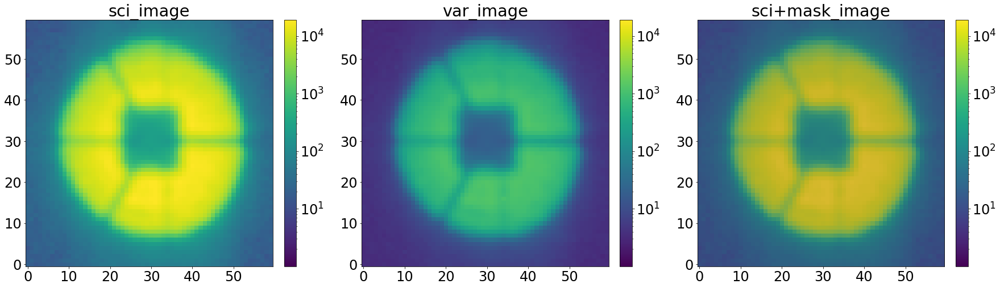

In [71]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
single_analysis.create_basic_data_image()

In [72]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772238ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772238ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.876587515949076


In [86]:
Emcee3_Ar

['/tigress/ncaplar/Results/chainDec0721_Single_P_34437958ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516773088ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516771718ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_344371018ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_34437718ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516773568ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516773078ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_34437798ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516771278ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516772958ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516773478ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_34437558ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_516771518ArSwarm1.npy',
 '/tigress/ncaplar/Results/chainDec0721_Single_P_344371

### chain analysis 

In [20]:
gbest_filename='/tigress/ncaplar/Results/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/tigress/ncaplar/Results/chainDec0721_Single_P_3443738Arres_gbests_position.npy
(21, 129)


array([   -8.08481414,     0.97086071,     0.25642483,     0.21781997,
           0.00433342,    -0.18528183,    -0.02772723,     0.300325  ,
           0.04212672,     0.57636566,     0.00420754,     0.17092304,
           0.01748614,    -0.29383846,    -0.02214132,    -0.07436267,
           0.00815167,    -0.17748606,    -0.00071386,    -0.11538624,
           0.00490884,    -0.04153673,     0.01293011,    -0.0187891 ,
           0.00392386,     0.02470503,    -0.02086192,     0.08169492,
           0.00093687,     0.02604198,    -0.00172731,    -0.00084258,
          -0.00500037,     0.0383217 ,    -0.00295669,     0.0740737 ,
          -0.00838612,    -0.00207093,     0.69133492,     0.08641375,
          -0.19336556,    -0.01465987,     0.05794592,     0.05323779,
           0.59833655,     0.15394167,     0.14815234,     1.47133164,
           0.01843077,    -0.09494303,     0.93935014,     0.03626434,
           0.67422145,     1.02675693,     0.64351736, 84436.07728434,
      

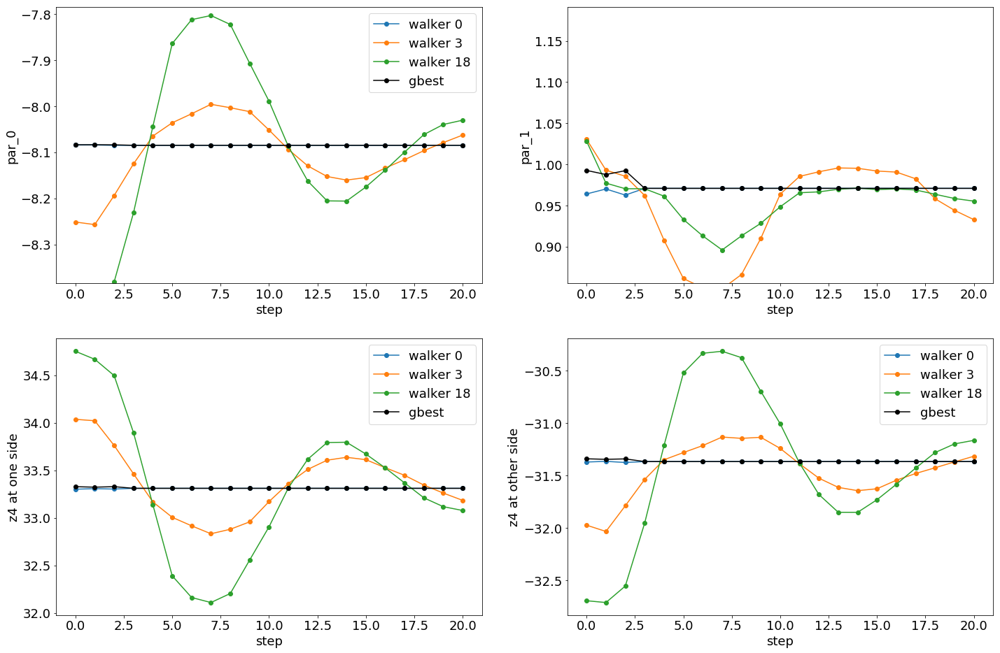

In [21]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=0*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(gbests_positions[:,i])
plt.ylim(np.min([mean_one_what-0.3,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.3,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

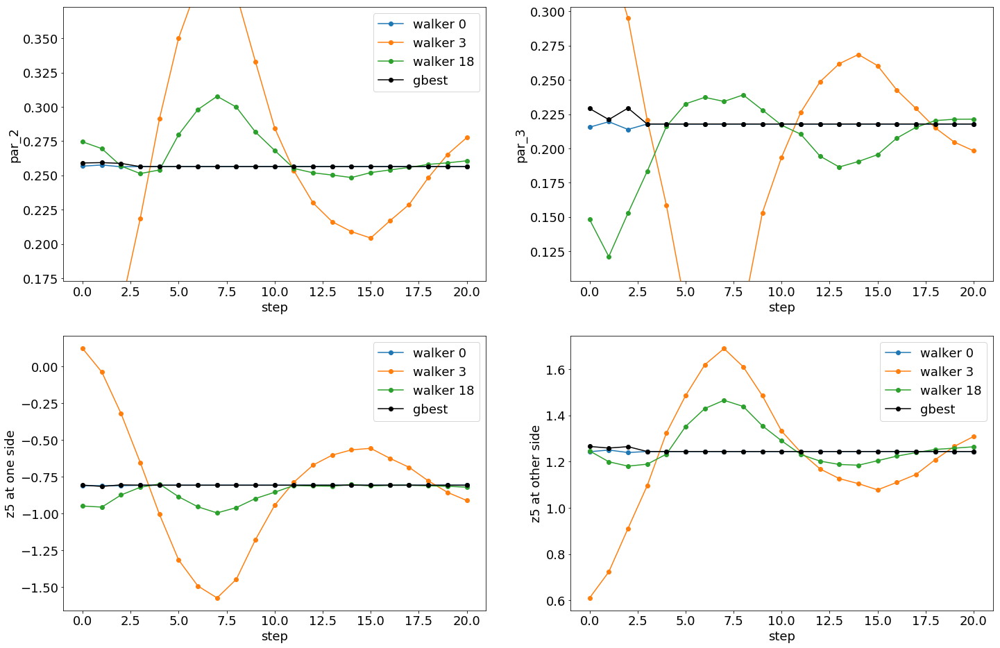

In [22]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=1*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

In [23]:
chain0_swarm_1[:,0][:,i]

array([0.25676144, 0.257591  , 0.25630413, 0.25642483, 0.25642483,
       0.25642483, 0.25642483, 0.25642483, 0.25642483, 0.25642483,
       0.25642483, 0.25642483, 0.25642483, 0.25642483, 0.25642483,
       0.25642483, 0.25642483, 0.25642483, 0.25642483, 0.25642483,
       0.25642483])

In [24]:
chain0_swarm_1[0][:,i+1][0:10]

array([ 0.21551879, -0.20263849,  0.14185534,  0.36604421,  0.19548317,
        0.13477533,  0.15375159,  0.21078776,  0.18273817,  0.07403547])

In [25]:
chain0_swarm_1[0][:,i+1][0:10]

array([ 0.21551879, -0.20263849,  0.14185534,  0.36604421,  0.19548317,
        0.13477533,  0.15375159,  0.21078776,  0.18273817,  0.07403547])

Text(0.5, 1.0, 'par_46 / wide_43')

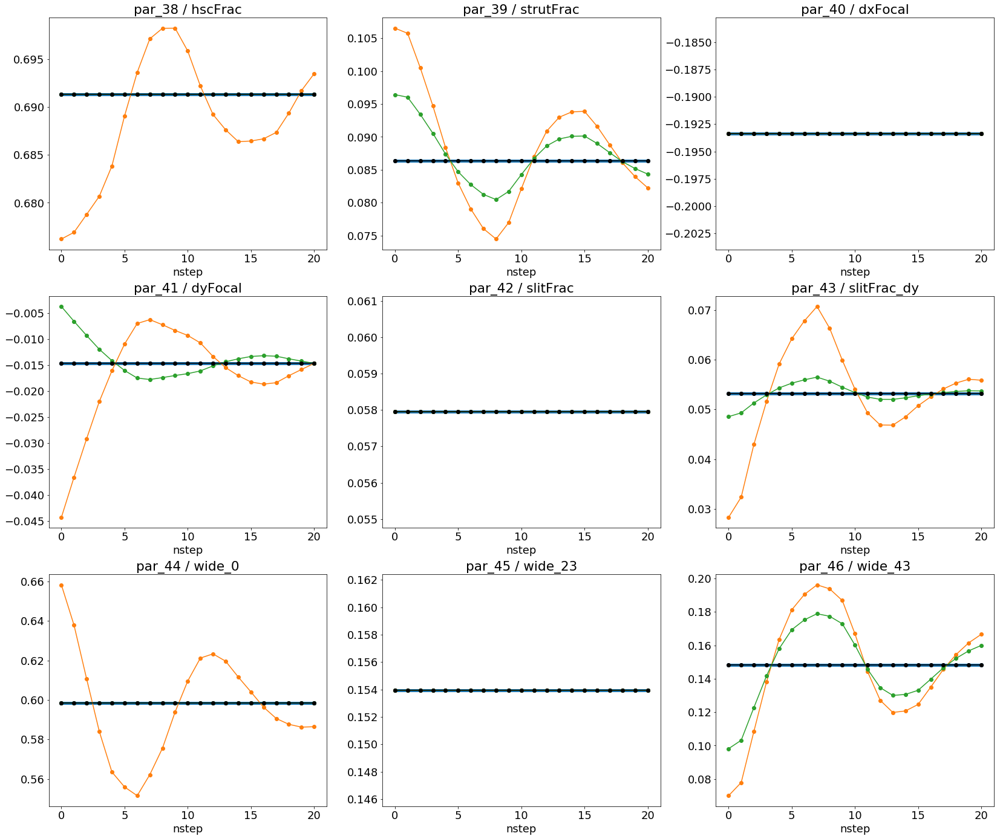

In [26]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

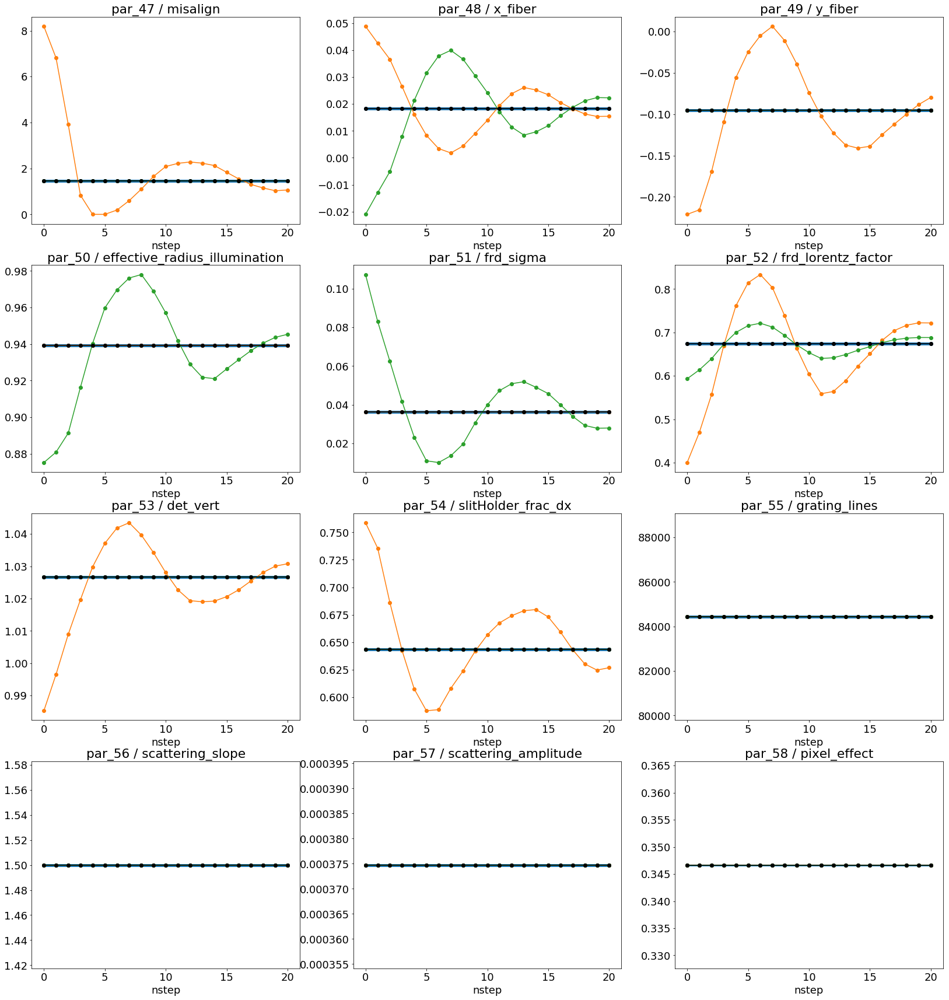

In [27]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

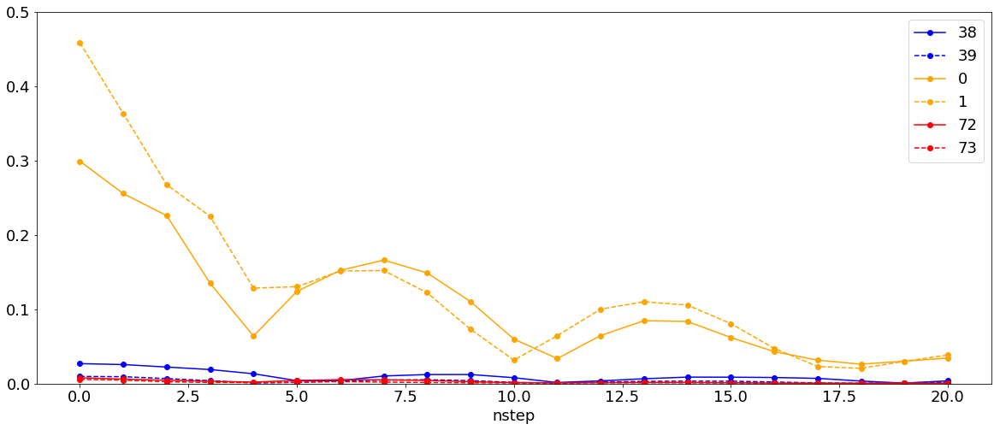

In [28]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.6913349240067271, right=0.6913349240067271
  ret = ax.set_xlim(*args, **kwargs)
/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/matplotlib/pyplot.py:1479: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.08641374580258114, top=0.08641374580258114
  ret = ax.set_ylim(*args, **kwargs)


Text(0, 0.5, 'strutFrac')

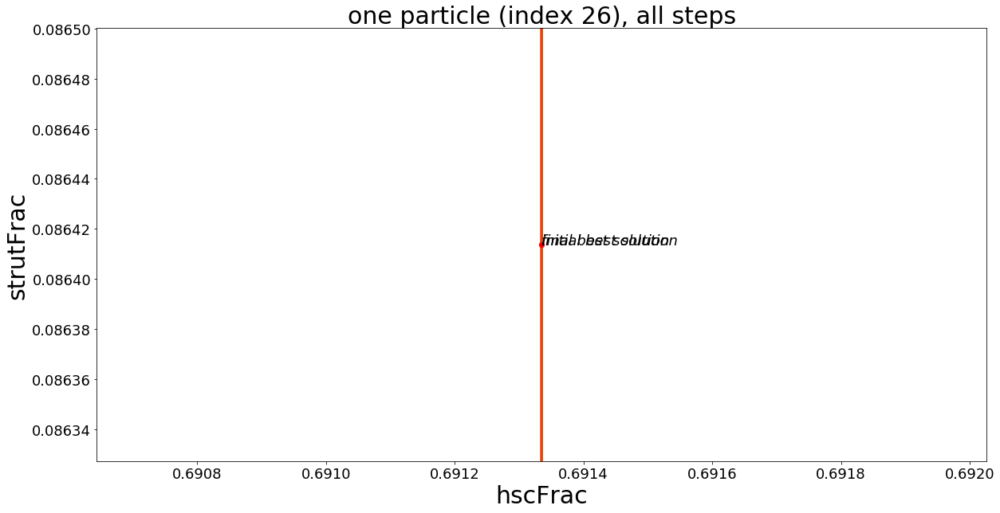

In [29]:
nsteps=chain0_swarm_1.shape[0]

j=0
n_particle=26
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle (index '+str(n_particle)+'), all steps',size=30)

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,label='particle')
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,label='best solution')
plt.scatter(X_best[-1],Y_best[-1],color='red')
plt.scatter(X_best[0],Y_best[0],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.text(X_best[-1]+-0.1*np.abs(delta_X),Y_best[-1]+np.abs(0.1*delta_Y),s='final best solution',style='italic')
plt.text(X_best[0]+-0.1*np.abs(delta_X),Y_best[0]-np.abs(0.2*delta_Y),s='initial best solution',style='italic')



plt.xlim(X_best[-1]-2*delta_X,X_best[-1]+2*delta_X)
plt.ylim(Y_best[-1]-2*delta_Y,Y_best[-1]+2*delta_Y)

plt.xlabel(columns22[i1-19],size=30)
plt.ylabel(columns22[i6-19],size=30)

#plt.legend()

Text(0, 0.5, 'parameter: 39')

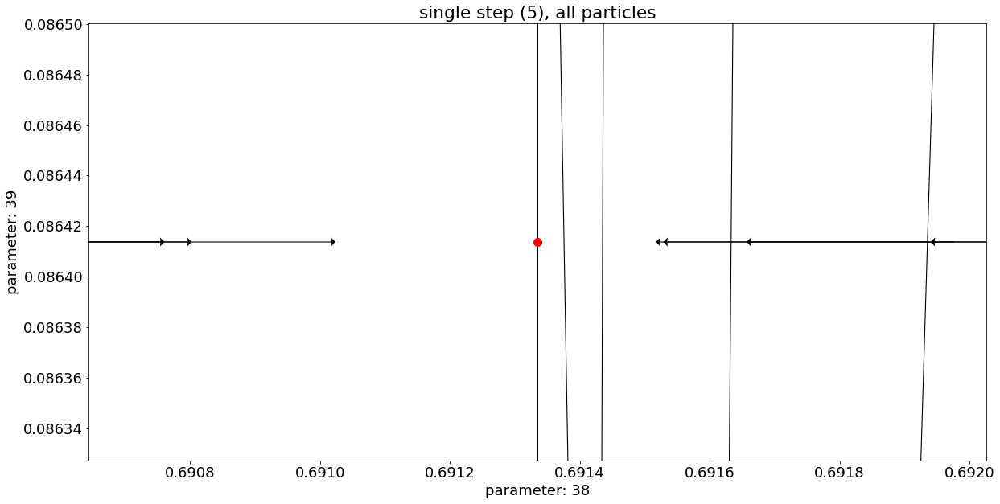

In [30]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

minimal likelihood is: 3.5512507851063844
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3443738ArSwarm1.npy
(21, 480, 129)


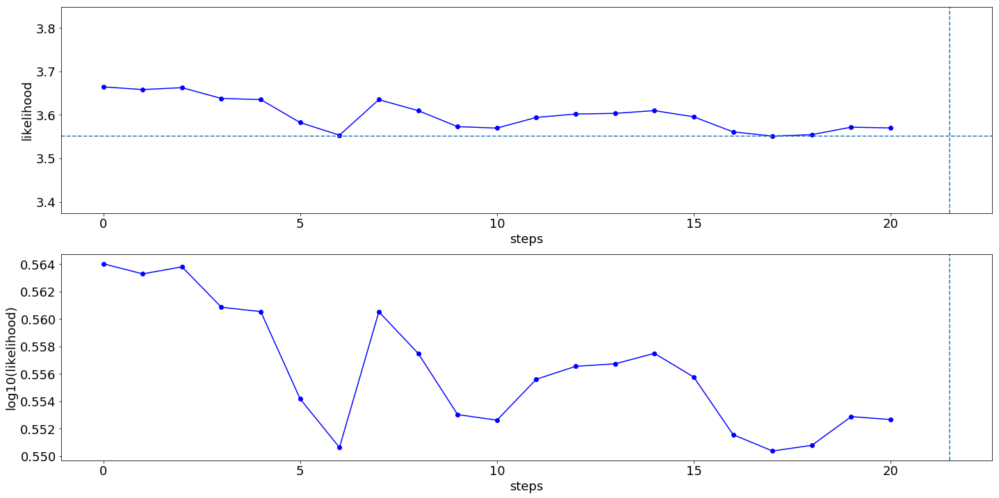

In [31]:
single_analysis.create_fitting_evolution_plot()

In [32]:
list_of_which_particle_is_gbest=[]
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,39]==gbests_positions[i][39])[0][0]])
    
list_of_which_particle_is_gbest
array_of_which_particle_is_gbest=np.array(list_of_which_particle_is_gbest)

(0, 480)

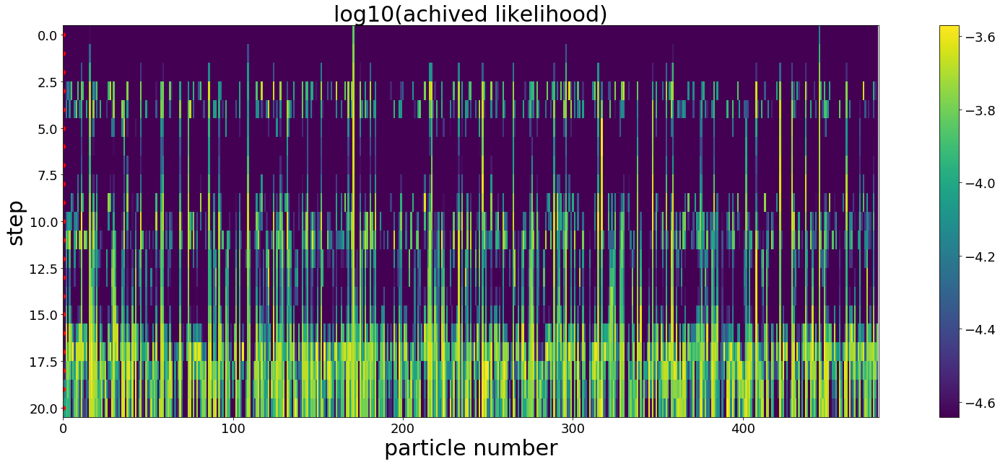

In [33]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),\
           vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()
plt.scatter(array_of_which_particle_is_gbest[:,1],array_of_which_particle_is_gbest[:,0],color='red')

plt.xlabel('particle number',size=30)
plt.ylabel('step',size=30)
plt.title('log10(achived likelihood)',size=30)
plt.xlim(0,likechain0_swarm_1.shape[1])

### image analysis 

In [73]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)




#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


#res_multi_10=np.copy(res_multi)
#res_multi_21=np.copy(res_multi)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

"""
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=True)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)
"""

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 20.48375
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.678121
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelength826.6699
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters used: [   28.62780348    -0.57071844    -0.94940093     0.67079117
    -0.2708098     -0.15296753    -0.2207017      0.19408113
    -0.07833176     0.00497633     0.04337422     0.05209364
    -0.0656297      0.05518112    -0.03052372    -0.00149795
    -0.04074876     0.04745252     0.27453435     0.6559288
     0.07452001    -0.03718669     0.04852718     0.05765131
     0.00716617     0.13047215  

f_multiplier_factor for size of detector triangle is: 1.014510523405173
Time for cutting out the square is 0.008392333984375
Finished with getPupil
Finished with _get_Pupil
Requested pupil size is (pupil.size) [m]: 0.1395327
One pixel has size of (pupil.scale) [m]: 9.08416015625e-05
Requested pupil has so many pixels (pupil_plane_im): (1536, 1536)
Time for _get_Pupil function is 0.5949609279632568
lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.08954524993896484
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.27483320236206055
Time for pupil and illumination calculation is 0.8707578182220459

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004334449768066406
Time for FFT is 

chi2 within shgo with use_only_chi True and use_center_of_light False [11.44794785  1.06117411] / 13.447889393445152
chi2 within shgo with use_only_chi True and use_center_of_light False [11.44275928  1.06770312] / 13.447847944805565
chi2 within shgo with use_only_chi True and use_center_of_light False [11.44653675  1.0714855 ] / 13.447870107440824
chi2 within shgo with use_only_chi True and use_center_of_light False [11.44358424  1.06559807] / 13.447845576427499
chi2 within shgo with use_only_chi True and use_center_of_light False [11.4472025   1.06531293] / 13.447860492989733
chi2 within shgo with use_only_chi True and use_center_of_light False [11.44387009  1.06710557] / 13.447843044739523
chi2 within shgo with use_only_chi True and use_center_of_light False [11.44107679  1.06528566] / 13.44786075164355
chi2 within shgo with use_only_chi True and use_center_of_light False [11.44505235  1.0668849 ] / 13.447845409647627
chi2 within shgo with use_only_chi True and use_center_of_light F

lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.07551741600036621
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.26335787773132324
Time for pupil and illumination calculation is 0.2664299011230469

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0002319812774658203
Time for FFT is 0.39118146896362305
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 33.976300177468346
size_of_central_cut: 951
optPsf_cut.shape(952, 952)
oversampling:11
size_of_optPsf_cut_downsampled: 308
optPsf_cut_downsampled.shape: (309, 309)
size_of_optPsf_cut_in_Microns: 421.3636363636363
postprocessing parameters:
['grating_lin

Time for postprocessing pupil after _get_Pupil 0.22846651077270508
Time for pupil and illumination calculation is 0.2325289249420166

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0006296634674072266
Time for FFT is 0.4020838737487793
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 33.976300177468346
size_of_central_cut: 2854
optPsf_cut.shape(2855, 2855)
oversampling:11
size_of_optPsf_cut_downsampled: 924
optPsf_cut_downsampled.shape: (925, 925)
size_of_optPsf_cut_in_Microns: 1261.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[29485.31581199836, 2.218858840683546, 0.0016419337057210436, 0.32549147995368083, 1.8065980077336943]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(925, 925)
simulation_00 parameter: None
are we invoking dou

chi2 within shgo with use_only_chi True and use_center_of_light False [14.57074823 -8.99166811] / 19.892743219116475
chi2 within shgo with use_only_chi True and use_center_of_light False [14.57148472 -8.98885907] / 19.892740981218925
chi2 within shgo with use_only_chi True and use_center_of_light False [14.57344277 -8.98815337] / 19.892759062547952
chi2 within shgo with use_only_chi True and use_center_of_light False [14.57392785 -8.99306572] / 19.892754208048196
chi2 within shgo with use_only_chi True and use_center_of_light False [14.56971078 -8.98886253] / 19.89274553481817
chi2 within shgo with use_only_chi True and use_center_of_light False [14.57252216 -8.99166465] / 19.89274757313749
chi2 within shgo with use_only_chi True and use_center_of_light False [14.57041363 -8.98956306] / 19.892743614225093
chi2 within shgo with use_only_chi True and use_center_of_light False [14.57181932 -8.99096412] / 19.892744286532025
chi2 within shgo with use_only_chi True and use_center_of_light Fa

'\nindex_of_single_image=1\nmodel = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,\n                      simulation_00=True)  \n\nres_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)\n'

In [74]:
mean_res_of_multi_same_spot

-14.734192664340924

In [75]:
popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
custom_var = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)

In [76]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    
    popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
    single_var_image_via_model = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)
   
    list_of_var_images_via_model.append(single_var_image_via_model)

In [77]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(len(list_of_sci_images)):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-573.43731689 -368.07913208 -460.88278198]


'model pixels with a flux larger than (quantile_08_focus): 41.53220520019533'

mean reported value:-14.734192664340924
array_of_single_res: [-19.03401992  -2.31595717 -22.85260091]
renormalization factors: [1. 1. 1.]
array_of_single_res renormalized: [-19.03401992  -2.31595717 -22.85260091]


([<matplotlib.axis.XTick at 0x2b69c3b462e8>,
 <a list of 3 Text xticklabel objects>)

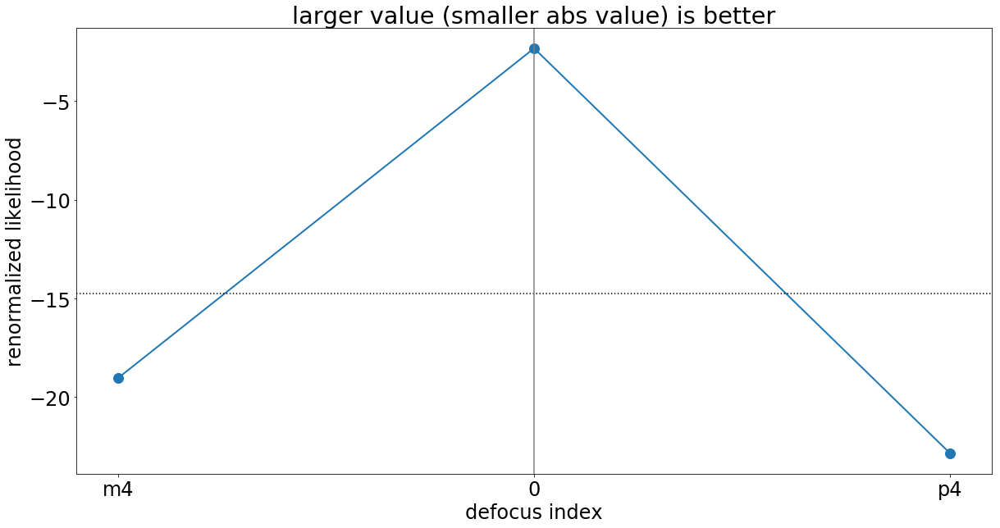

In [78]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.ones(len(list_of_sci_images))


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.title('larger value (smaller abs value) is better')

plt.axvline(np.where(np.array(list_of_defocuses_input_short_with_focus)=='0')[0][0],color='gray')
plt.xticks(np.arange(len(list_of_defocuses_input_short_with_focus)),list_of_defocuses_input_short_with_focus)

In [79]:
minchain=list_of_minchain[0]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
          z4        z5        z6        z7       z8        z9       z10  \
0  28.627803 -0.570718 -0.949401  0.670791 -0.27081 -0.152968 -0.220702   

        z11  
0  0.194081  
##############################################
        z12       z13       z14       z15      z16       z17       z18  \
0 -0.078332  0.004976  0.043374  0.052094 -0.06563  0.055181 -0.030524   

        z19       z20       z21       z22  
0 -0.001498 -0.040749  0.047453  0.274534  

##############################################
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.655929    0.07452 -0.037187  0.048527  0.057651     0.007166
##############################################
     wide_0   wide_23   wide_43  misalign
0  0.130472  0.235489  0.270437  0.912985
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.020397 -0.036248                         0.9019   0.020378   

   frd_lorentz_factor  

(-1.5, -0.5)

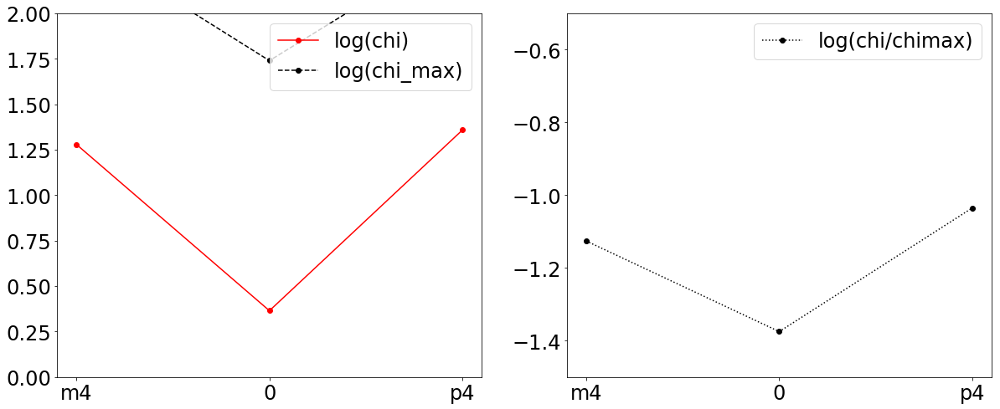

In [80]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 20.48375
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.678121
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 95.91656112670898
---------------------
chi**2 max reduced is: 52735.117745111376
chi**2 reduced is: 396.04794232356585 for log improvement: -2.12435215878053
chi max reduced is: 160.82571912257492
chi reduced is: 13.433550134116063 for log improvement: -1.078164701548007
---------------------
chi**2 reduced within custom mask area is: 396.04794273642733
---------------------
chi**2 max reduced within flux mask area is: 88958.26523867398
chi**2 r

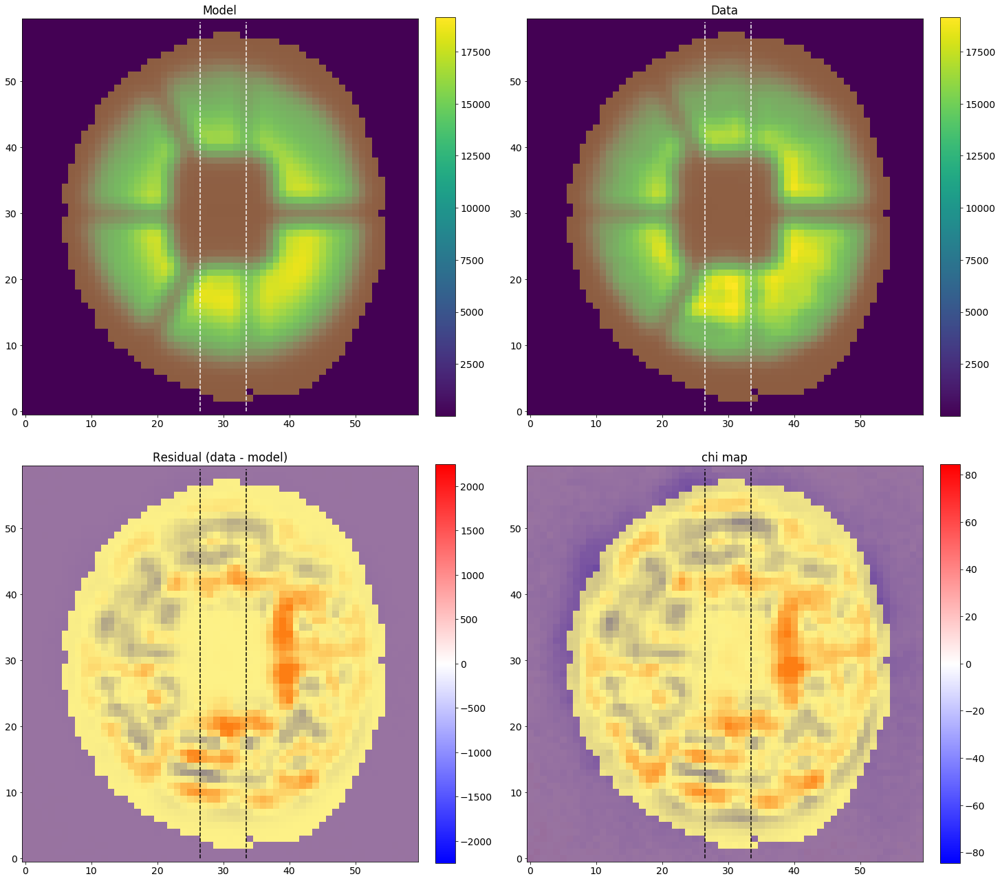

In [81]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
custom_var = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)

# custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
#                                   var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 20.48375
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.678121
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 95.91656112670898
fraction of chi2 due to 1% of pixels: 0.11116411627497638
---------------------
chi**2 max reduced is: 52735.117745111376
chi**2 reduced is: 396.04794232356585 for log improvement: -2.12435215878053
chi max reduced is: 160.82571912257492
chi reduced is: 13.433550134116063 for log improvement: -1.078164701548007
---------------------
chi**2 reduced within custom mask area is: 396.04794273642733
---------------------
chi**2 max re

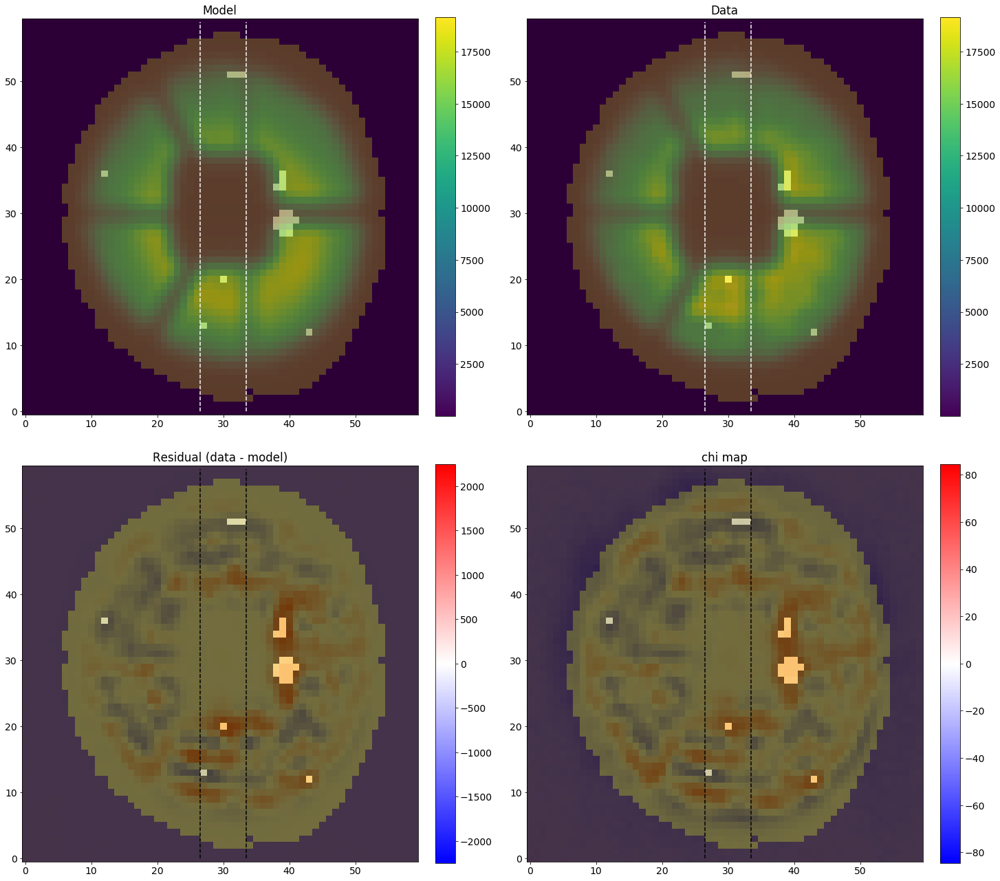

In [82]:
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 20.48375
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.678121
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 95.91656112670898
---------------------
chi**2 max reduced is: 52735.117745111376
chi**2 reduced is: 396.04794232356585 for log improvement: -2.12435215878053
chi max reduced is: 160.82571912257492
chi reduced is: 13.433550134116063 for log improvement: -1.078164701548007
---------------------
chi**2 reduced within custom mask area is: 396.04794273642733
---------------------
chi**2 max reduced within flux mask area is: 88958.26523867398
chi**2 r

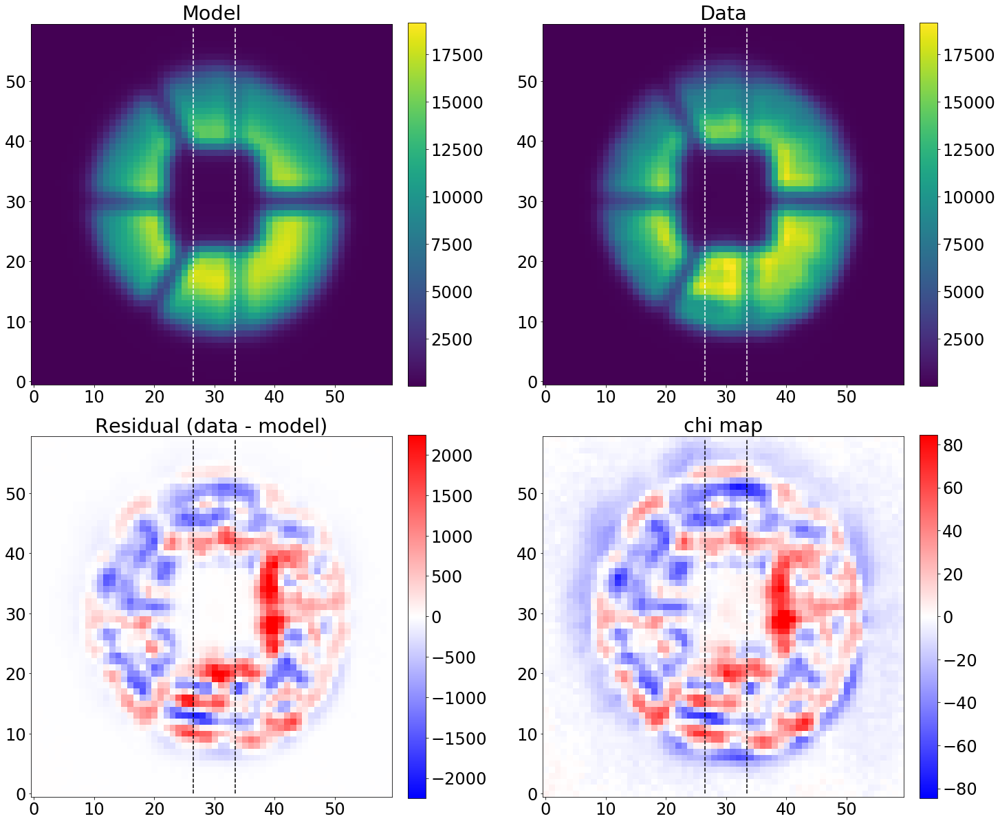

In [83]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 52735.117745111376
chi**2 reduced is: 396.04794232356585
Abs of residual divided by total flux is: 0.06475813645464377
Abs of residual divided by largest value of a flux in the image is: 0.16428188577805009


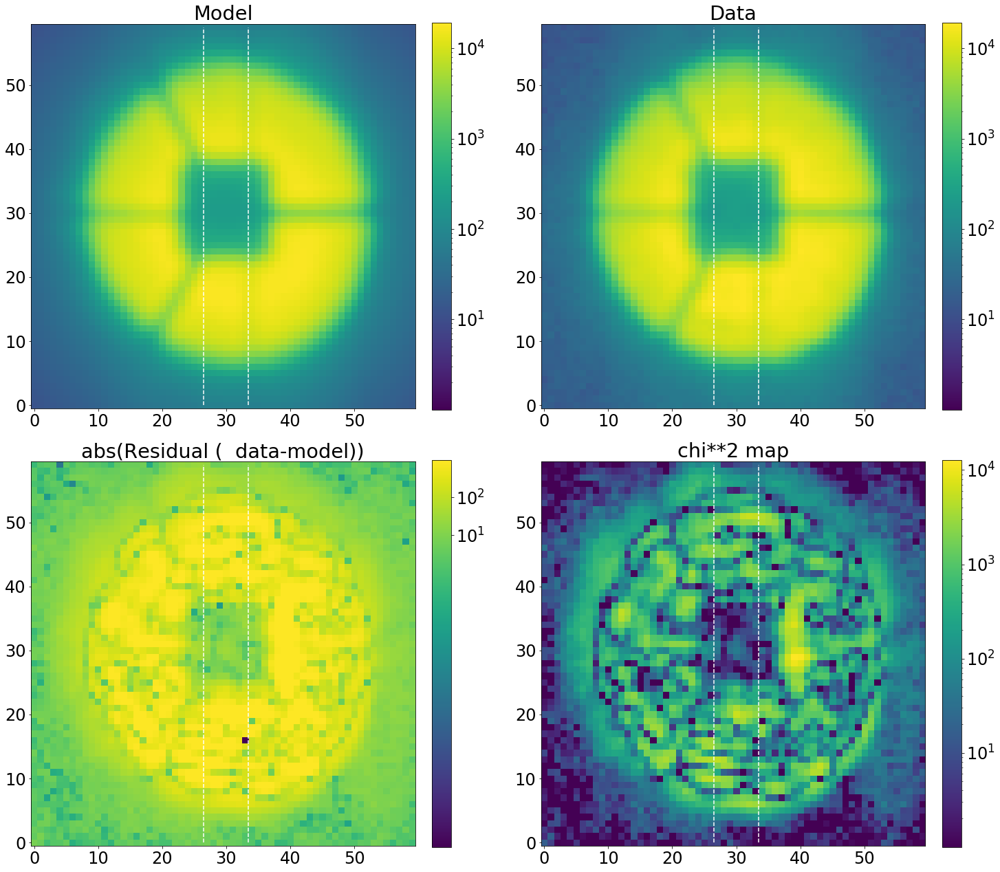

In [84]:
index_of_single_image=0
matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 0.5929936
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 1.5107298
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 8.983023405075073
---------------------
chi**2 max reduced is: 5923.409791808252
chi**2 reduced is: 7.060314128043535 for log improvement: -2.923747754783675
chi max reduced is: 28.9701215400179
chi reduced is: 1.8669017470083509 for log improvement: -1.1908288551200252
---------------------
chi**2 reduced within custom mask area is: 7.060314085931104
---------------------
chi**2 max reduced within flux mask area is: 12321.146471528331
chi**2 r

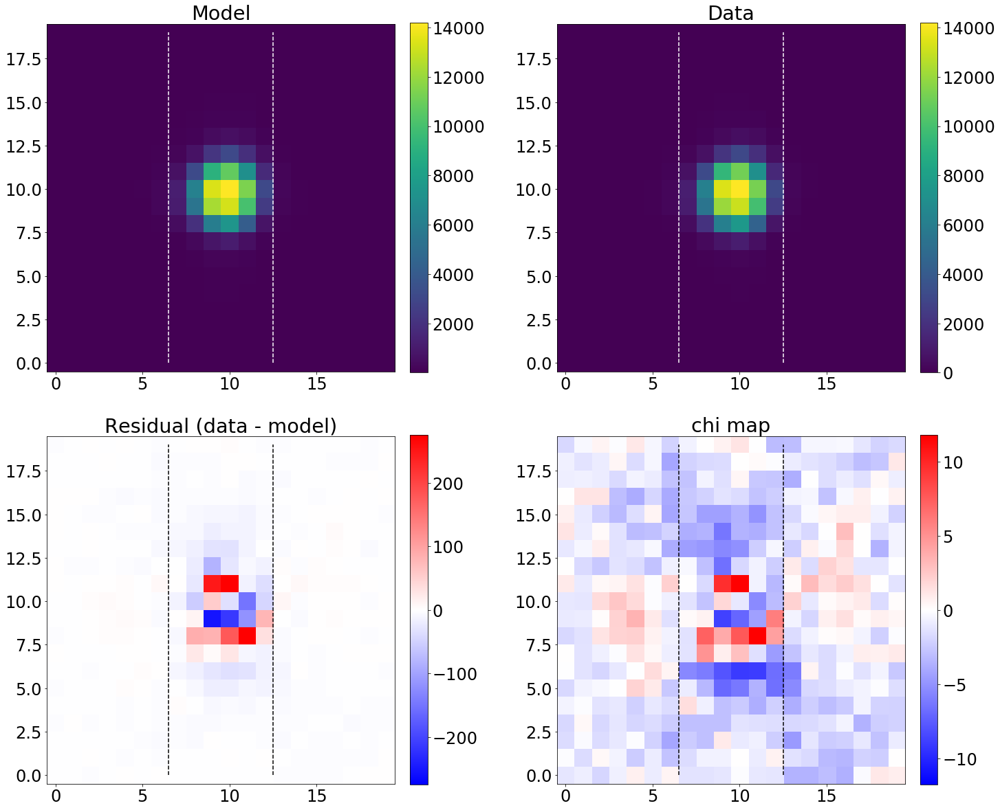

In [85]:
index_of_single_image=1
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 5923.409791808252
chi**2 reduced is: 7.060314128043535
Abs of residual divided by total flux is: 0.022079359365492227
Abs of residual divided by largest value of a flux in the image is: 0.02580607757405963


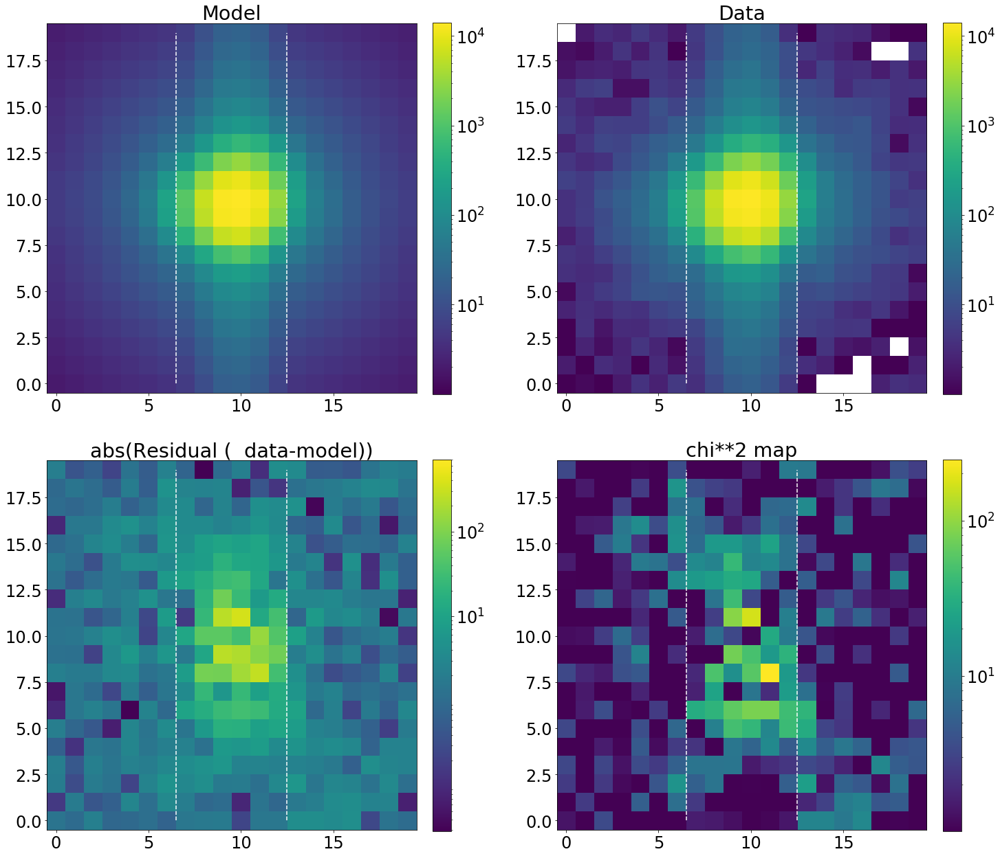

In [86]:
index_of_single_image=1
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

7.060314128043535
chi**2 reduced is: 7.060314128043535
Abs of residual divided by total flux is: 0.022079359365492227
Abs of residual divided by largest value of a flux in the image is: 0.02580607757405963


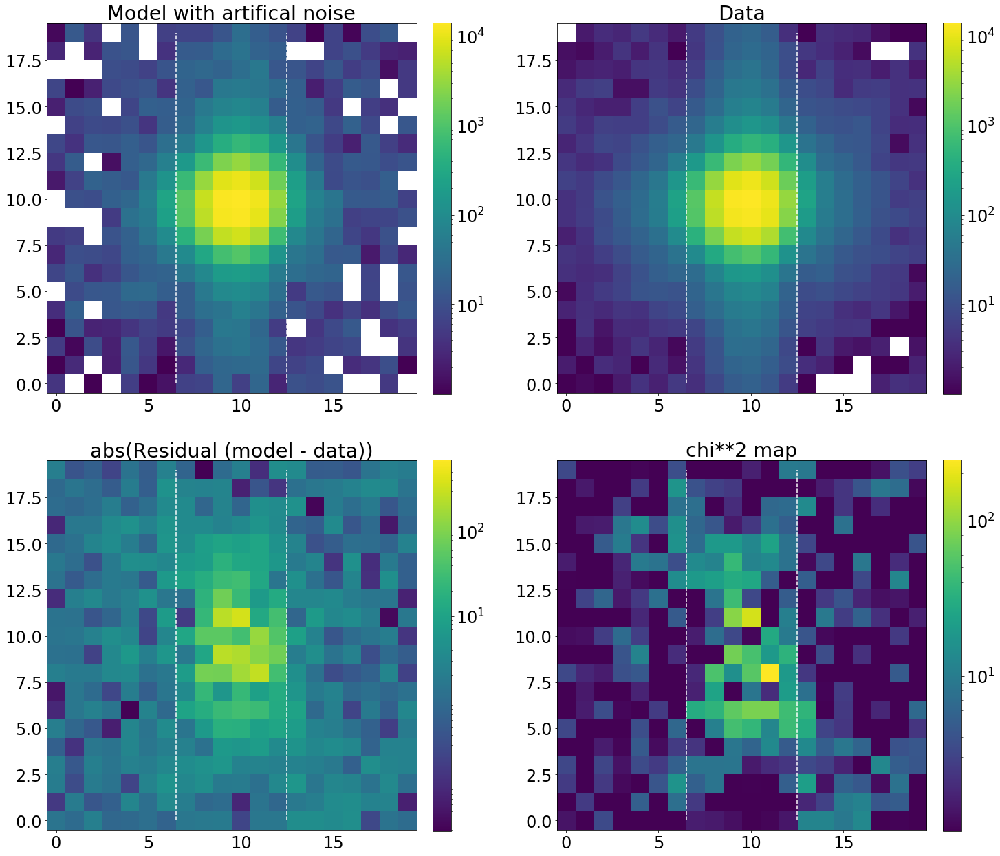

In [87]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

ValueError: too many values to unpack (expected 2)

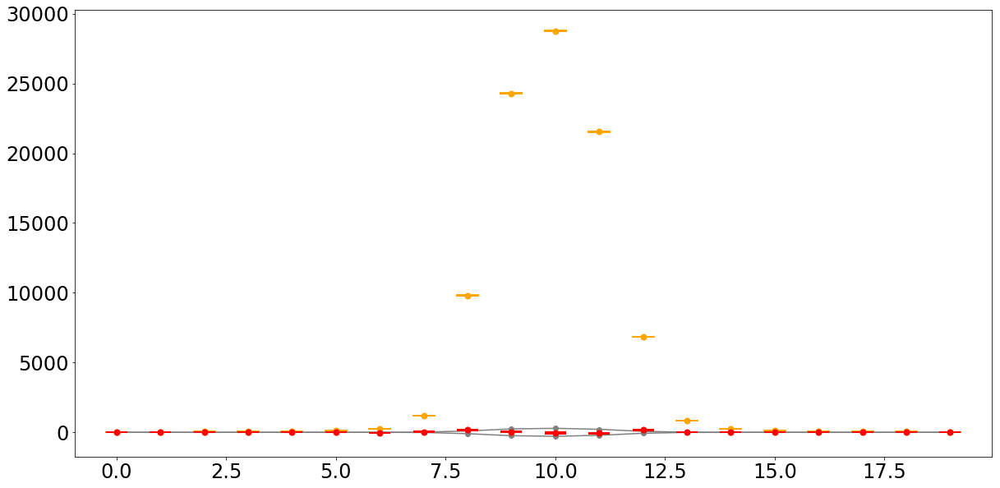

In [43]:
index_of_single_image=1
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],\
                 var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## results everywhere 

### results everywhere - 10 fibers

In [166]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar_10[:,1])

if len(arranged_by_spot_number_Ne)>0:
    unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne_10[:,1])
else:
    unique_numbers_Ne=np.array([])
    
if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr_10[:,1])
else:
    unique_numbers_Kr=np.array([])


In [167]:
unique_numbers_Ne

array(['11', '14', '15', '2', '20', '23', '24', '29', '32', '33', '38',
       '41', '42', '47', '5', '50', '51', '56', '59', '6', '60', '65',
       '68', '69', '74', '77', '78', '83', '86', '87'], dtype='<U21')

In [168]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=6,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3443718ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3443718ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.145145648049225
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_344371018ArS

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_344371178ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_344371178ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 26.829990980822814
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 119
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_344371198ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_344371198ArSwarm1.npy
(21, 480, 129)
minimal lik

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437308ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437308ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.451155256583305
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 31
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437318ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437318ArSwarm1.npy
(21, 480, 129)
minimal likel

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3443758ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3443758ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.102221184524486
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437518ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437518ArSwarm1.npy
(21, 480, 129)
minimal likeli

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437688ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437688ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.231128048689125
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 69
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437698ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437698ArSwarm1.npy
(21, 480, 129)
minimal likelihoo

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437878ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437878ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 2.79820939967861
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 89
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437898ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34437898ArSwarm1.npy
(21, 480, 129)
minimal likeli

In [169]:

results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
    
    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313118NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313118NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.272360709610185
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 14
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
analyzing label: 34217
double_sources_positions_ra

analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313428NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313428NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 6.60377183487896
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 47
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313478NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Re

analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313748NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313748NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.352858473605453
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 77
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34313778NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/

In [170]:

results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
    
    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34561, 34567, 34573, 34603, 34609, 34615, 34645, 34651, 34657]
analyzing label: 34561
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657118KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657118KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.375992414164124
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 15
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34561, 34567, 34573, 34603, 34609, 34615, 34645, 34651, 34657]
analyzing label: 34561
double_sources_positions_rat

In [171]:


pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Dec0721/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Dec0721_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Dec0721_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Dec0721_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

### results everywhere - 21 fibers

In [66]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar_21[:,1])

if len(arranged_by_spot_number_Ne)>0:
    unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne_21[:,1])
else:
    unique_numbers_Ne=np.array([]) 
    
if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr_21[:,1])
else:
    unique_numbers_Kr=np.array([])


In [67]:
unique_numbers_Ar

array(['145', '147', '149', '150', '151', '152', '153', '155', '157',
       '159', '161', '163', '164', '165', '167', '169', '171', '173',
       '174', '175', '176', '177', '179', '181', '183', '186', '187',
       '188', '189', '191', '193', '195', '197', '198', '199', '200',
       '201', '203', '205', '207', '209', '210', '211', '212', '213',
       '215', '217', '219', '221', '222', '223', '224', '225', '227',
       '229', '231', '233', '234', '235', '236', '237', '239', '241',
       '243', '245', '246', '247', '248', '249', '251', '253', '255',
       '257', '258', '259', '260', '261', '263', '265', '267', '269',
       '270', '271', '272', '273', '275', '277', '279', '282', '283',
       '284', '285', '287', '289', '291', '293', '294', '295', '296',
       '297', '299', '301', '303', '305', '306', '307', '308', '309',
       '311', '337', '339', '341', '342', '343', '344', '345', '347',
       '349', '351', '353', '354', '355', '356', '357', '359', '361',
       '363', '365',

In [68]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    
    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 145
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516771458ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516771458ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.669208119158021
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 147
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 174
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516771748ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516771748ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.01344857337079
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 175
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_S

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 199
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516771998ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516771998ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.191693676372813
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 200
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_S

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 222
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772228ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772228ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.773796863523705
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 223
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 245
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772458ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772458ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 14.422019005165055
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 246
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772658ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772658ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.027656936741783
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 267
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772678ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772678ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 4.21042800288555
STAMPS_FOLDER: /tigress/ncaplar/ReducedDat

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772878ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772878ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.155155676703094
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 289
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772898ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516772898ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 7.320343433232902
STAMPS_FOLDER: /tigress/ncaplar/ReducedDa

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773098ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773098ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 22.743029478161144
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 311
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773118ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773118ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 8.869338901301019
STAMPS_FOLDER: /tigress/ncaplar/ReducedD

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773578ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773578ArSwarm1.npy
(21, 480, 129)
minimal likelihood is: 24.36489680945071
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 359
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773598ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_516773598ArSwarm1.npy
(21, 480, 129)

In [69]:

results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):

    
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    
    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 110
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471108NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471108NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 31.82436138403629
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 113
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_S

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 146
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471468NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471468NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 18.79660260994039
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 149
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_S

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471828NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471828NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.199876585702581
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 185
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471858NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598471858NeSwarm1.npy
(21, 480, 129

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 218
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598472188NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598472188NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.98129825049564
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 221
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_S

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 272
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598472728NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_598472728NeSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.854354467070024
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 275
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_

In [70]:

results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=8,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    
    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 103
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [52085, 52181, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_522771038KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_522771038KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 15.168595545133348
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 115
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [52085, 52181, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Sing

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_52277918KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_52277918KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.280723288129684
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 95
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [52085, 52181, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_52277958KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_52277958KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.005028522072658
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Da

In [71]:

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Dec0721/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Dec0721_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Dec0721_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Dec0721_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

## adding proper chi2 values 

### Argon 

In [95]:
date='Dec0721'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ar_index=np.unique(arranged_by_spot_number_Ar_10[:,1])


for single_number in tqdm(Ar_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy'):


        wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            print('############')
            print(single_number)
            print(list_of_defocuses_input_short_with_focus[i])
            print(starting_values[i])
            print(final_values[i])
            results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[str(single_number)]=final_values[i]
            results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[str(single_number)]=starting_values[i]
            print(results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].loc['101'])

  5%|██▏                                         | 4/80 [00:00<00:01, 39.61it/s]

############
1
m4
120.70486498286586
8.22271456128722
15.015364007501013
############
1
0
44.0965611089347
1.286895779053266
15.015364007501013
############
1
p4
126.52457859917745
8.89699658796164
15.015364007501013
############
101
m4
285.5118450402382
19.60943289504823
19.60943289504823
############
101
0
63.15600137164682
3.081893659766718
3.081893659766718
############
101
p4
280.1921742919512
20.76225791184291
20.76225791184291
############
102
m4
157.28531209881723
10.973968885455859
19.60943289504823
############
102
0
40.11394609482807
2.2022727139997573
3.081893659766718
############
102
p4
152.37099760119216
10.555430701820384
20.76225791184291
############
103
m4
175.33090580336614
12.566727641891852
19.60943289504823
############
103
0
37.44222110325102
2.297653498158788
3.081893659766718
############
103
p4
171.16869691095695
11.558301403531706
20.76225791184291
############
104
m4
134.03186968156027
10.13486074410224
19.60943289504823
############
104
0
37.57865681009613

 16%|██████▉                                    | 13/80 [00:00<00:01, 38.62it/s]

0
38.5981630221798
1.4811142184022386
3.081893659766718
############
109
p4
108.25296738325687
7.294519010587991
20.76225791184291
############
11
m4
83.01271603430251
11.824865538816159
19.60943289504823
############
11
0
32.724319569803676
2.3822820183311006
3.081893659766718
############
11
p4
82.7533747821199
8.659062645310238
20.76225791184291
############
111
m4
59.448874692515844
4.880806363452207
19.60943289504823
############
111
0
35.129223166010426
1.2747429563526818
3.081893659766718
############
111
p4
58.288359470030656
4.439008878089871
20.76225791184291
############
113
m4
276.2454846971809
20.349605087980276
19.60943289504823
############
113
0
60.155049056537685
3.4532720784568762
3.081893659766718
############
113
p4
277.3540552874819
19.260400474493274
20.76225791184291
############
114
m4
153.39335500713915
11.91014222406343
19.60943289504823
############
114
0
37.813989484556664
1.856634934537898
3.081893659766718
############
114
p4
151.6019659773364
10.889870509

 29%|████████████▎                              | 23/80 [00:00<00:01, 43.84it/s]

############
13
m4
99.41412458907789
6.920397754109962
19.60943289504823
############
13
0
39.52424486278638
1.4981477586801597
3.081893659766718
############
13
p4
103.52468754621934
6.621260025360141
20.76225791184291
############
15
m4
61.31422181759383
3.9411541995194828
19.60943289504823
############
15
0
37.221316694174035
1.2979080511232728
3.081893659766718
############
15
p4
59.67340597374623
3.7694588932146105
20.76225791184291
############
17
m4
256.43996966029863
13.986496026500847
19.60943289504823
############
17
0
49.28536995416649
2.2039595346211796
3.081893659766718
############
17
p4
253.94609348481202
15.366320862178515
20.76225791184291
############
18
m4
143.51362834562116
9.292792474222681
19.60943289504823
############
18
0
43.75816242478737
1.984646671770888
3.081893659766718
############
18
p4
140.66984720467542
8.924133217683579
20.76225791184291
############
19
m4
161.1581268141744
11.126820747770209
19.60943289504823
############
19
0
41.28882205623566
1.750

 41%|█████████████████▋                         | 33/80 [00:00<00:01, 40.67it/s]

############
27
m4
51.5940625761976
3.547987971242467
19.60943289504823
############
27
0
35.63234813956852
1.4412270397206055
3.081893659766718
############
27
p4
50.89227103157882
3.968180679524627
20.76225791184291
############
29
m4
220.89132961099625
14.038912714546829
19.60943289504823
############
29
0
44.143588625363556
2.491181503468379
3.081893659766718
############
29
p4
215.9247377330274
13.264869796724915
20.76225791184291
############
3
m4
75.56410705948534
4.832409049838377
19.60943289504823
############
3
0
39.91903622355869
1.0111869577553942
3.081893659766718
############
3
p4
76.16905313532982
4.8142422135892184
20.76225791184291
############
30
m4
124.32433924134408
8.611850797418585
19.60943289504823
############
30
0
41.87049819866439
2.0555930444668067
3.081893659766718
############
30
p4
118.68086736186893
8.570155807519253
20.76225791184291
############
31
m4
138.1664882638149
8.36244653074846
19.60943289504823
############
31
0
37.170878718928584
1.62506212498

 55%|███████████████████████▋                   | 44/80 [00:01<00:00, 44.67it/s]

############
39
m4
68.78860748428018
4.036241236819137
19.60943289504823
############
39
0
44.83377360128937
1.2877277001665266
3.081893659766718
############
39
p4
65.74260340618267
4.311552461200132
20.76225791184291
############
41
m4
300.2643977643038
16.32452380923313
19.60943289504823
############
41
0
60.92696588302575
3.9503419362061942
3.081893659766718
############
41
p4
289.398825287342
17.281473363752603
20.76225791184291
############
42
m4
166.43666910958743
9.014461446333206
19.60943289504823
############
42
0
42.96588313814278
2.2167068271687587
3.081893659766718
############
42
p4
158.54320179387403
10.27698066256128
20.76225791184291
############
43
m4
185.5661494191402
11.028956961668621
19.60943289504823
############
43
0
43.06678840825247
2.1132555558523536
3.081893659766718
############
43
p4
180.1433557601852
12.537429792354153
20.76225791184291
############
44
m4
142.52174601243084
9.345319590012261
19.60943289504823
############
44
0
40.36417616759419
1.97537060

 61%|██████████████████████████▎                | 49/80 [00:01<00:00, 41.69it/s]

284.79252096241055
17.886309798390936
19.60943289504823
############
53
0
57.45958586037515
3.34645784412802
3.081893659766718
############
53
p4
271.8886292452738
19.209206608869643
20.76225791184291
############
54
m4
158.47602172399033
9.555115450500644
19.60943289504823
############
54
0
38.61138592017775
1.8883305454422243
3.081893659766718
############
54
p4
149.13721252566117
9.65540978023553
20.76225791184291
############
55
m4
176.48328981190434
10.189592615852632
19.60943289504823
############
55
0
39.50865856534129
2.235663917883984
3.081893659766718
############
55
p4
167.24713561863334
10.299547004837184
20.76225791184291
############
56
m4
134.22773771252253
8.65454298147875
19.60943289504823
############
56
0
38.0107402164038
1.8932508414418825
3.081893659766718
############
56
p4
129.0068846001596
8.029335807921319
20.76225791184291
############
57
m4
325.7658965608143
26.834050221625183
19.60943289504823
############
57
0
61.58730949015181
5.418010886791544
3.081893659

 74%|███████████████████████████████▋           | 59/80 [00:01<00:00, 42.02it/s]

############
63
m4
57.48134174925017
3.2548037720869756
19.60943289504823
############
63
0
34.67166791896007
1.0008695748516458
3.081893659766718
############
63
p4
55.379913807040595
3.6303664395708033
20.76225791184291
############
65
m4
267.48693623229707
16.317702982881727
19.60943289504823
############
65
0
56.17593329973795
3.228956643846385
3.081893659766718
############
65
p4
252.27088912117858
16.16908206493534
20.76225791184291
############
66
m4
147.85781555146082
9.31674741766157
19.60943289504823
############
66
0
36.093384795014
3.5358562994237657
3.081893659766718
############
66
p4
137.85177220018747
9.083176650947484
20.76225791184291
############
67
m4
164.9474785884132
10.260918771334557
19.60943289504823
############
67
0
37.32966794063233
1.7076448458732303
3.081893659766718
############
67
p4
155.41282877117646
10.5341804766922
20.76225791184291
############
68
m4
126.20139196746754
8.267256505906243
19.60943289504823
############
68
0
35.21334404526053
2.0022861

 86%|█████████████████████████████████████      | 69/80 [00:01<00:00, 41.98it/s]

############
75
m4
62.81137209333125
4.004442684843992
19.60943289504823
############
75
0
36.21089268698509
1.4234978927227282
3.081893659766718
############
75
p4
60.19409942824485
4.217373464197493
20.76225791184291
############
77
m4
291.7272043846442
18.839169579226027
19.60943289504823
############
77
0
63.533550960331
3.3113436418290694
3.081893659766718
############
77
p4
280.29157072038794
19.053172529118292
20.76225791184291
############
78
m4
163.46548635587317
10.254488441222415
19.60943289504823
############
78
0
37.92585718355558
2.024105225128269
3.081893659766718
############
78
p4
152.08995208497316
9.902203182291935
20.76225791184291
############
79
m4
182.79578166205079
12.09841204975915
19.60943289504823
############
79
0
37.17938557152263
2.204525351439469
3.081893659766718
############
79
p4
173.40027378967
13.90069748542736
20.76225791184291
############
8
m4
140.832565944629
9.86772353403727
19.60943289504823
############
8
0
38.97632764868599
1.8514378495283172

 92%|███████████████████████████████████████▊   | 74/80 [00:01<00:00, 40.34it/s]

############
87
m4
53.409158742207694
3.5039187943565806
19.60943289504823
############
87
0
35.16632224467161
1.36131634633083
3.081893659766718
############
87
p4
49.639633209325034
3.686194572139464
20.76225791184291
############
89
m4
231.50250927437068
13.862837715169865
19.60943289504823
############
89
0
49.62227203841179
2.5450071461383272
3.081893659766718
############
89
p4
225.2170362804825
16.540845843668304
20.76225791184291
############
9
m4
321.9602285218908
36.44871898076946
19.60943289504823
############
9
0
67.60880304857793
5.261348967625798
3.081893659766718
############
9
p4
317.8857398058859
24.914286414813617
20.76225791184291
############
90
m4
126.83979545481101
8.290840961184525
19.60943289504823
############
90
0
41.10196796534894
1.8302475810165144
3.081893659766718
############
90
p4
122.36785643801807
8.55546659716455
20.76225791184291
############
91
m4
143.44963174973995
9.094691472141493
19.60943289504823
############
91
0
40.53659949913996
1.6023361607

100%|███████████████████████████████████████████| 80/80 [00:01<00:00, 41.06it/s]

############
97
m4
106.12227006763172
7.474272020335046
19.60943289504823
############
97
0
39.8197027805196
1.864632674996789
3.081893659766718
############
97
p4
106.13149066586628
7.199637149233843
20.76225791184291
############
99
m4
60.45065725059732
4.132610405787339
19.60943289504823
############
99
0
37.25112277940938
1.3441726306882693
3.081893659766718
############
99
p4
60.11286764122925
4.051329765546364
20.76225791184291


In [96]:
date='Dec0721'

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ar_index=np.unique(arranged_by_spot_number_Ar_21[:,1])


for single_number in tqdm(Ar_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy'):

        wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')
        

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ar_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ar_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|█████████████████████████████████████████| 133/133 [00:01<00:00, 85.81it/s]


### Neon

In [97]:
date='Dec0721'

results_of_fit_many_direct_Ne_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ne'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ne_index=np.unique(arranged_by_spot_number_Ne_10[:,1])


for single_number in tqdm(Ne_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy'):


        wavelength=float(finalNe.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            print('############')
            print(single_number)
            print(list_of_defocuses_input_short_with_focus[i])
            print(starting_values[i])
            print(final_values[i])
            results_of_fit_many_direct_Ne_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[str(single_number)]=final_values[i]
            results_of_fit_many_direct_Ne_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[str(single_number)]=starting_values[i]
            # print(results_of_fit_many_direct_Ne_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].loc['101'])

 37%|███████████████▍                          | 11/30 [00:00<00:00, 107.48it/s]

############
11
m4
228.1526654597853
16.047394893089415
############
11
0
46.643273299026234
2.0439920839266907
############
11
p4
237.29227436892876
15.574083494383478
############
14
m4
287.49676849798743
17.40721442210669
############
14
0
58.39617473766813
2.3718646996186274
############
14
p4
290.75580940705356
18.550277796034667
############
15
m4
143.98692202107452
8.38886280067793
############
15
0
36.86165101226008
1.6100265964458687
############
15
p4
141.35429427434863
8.66719571465075
############
2
m4
253.27526061152463
18.237481865640305
############
2
0
55.4798505789591
1.7732314484046374
############
2
p4
267.96547749357615
18.395199177396815
############
20
m4
201.7020008451637
13.136581948200668
############
20
0
40.38836912981685
1.9309640572685887
############
20
p4
204.94659501071425
14.056086284885906
############
23
m4
254.59203373513915
16.27713760851101
############
23
0
53.02940996986536
2.9502810189233353
############
23
p4
250.2798062294003
16.79082396731845

100%|██████████████████████████████████████████| 30/30 [00:00<00:00, 118.33it/s]

############
74
m4
261.6537131026799
15.99943176188946
############
74
0
53.665737041970466
2.0284945783106925
############
74
p4
261.8317516523372
15.957344418518247
############
77
m4
158.37687628200734
14.487249791957757
############
77
0
68.91206254288313
2.5229231254557667
############
77
p4
319.20974477356657
19.59144802338
############
78
m4
158.6741525160315
9.80174862313624
############
78
0
38.49378883215037
1.5421177479202501
############
78
p4
155.73249271131485
10.32089917665705
############
83
m4
251.07296944063893
18.545127486191635
############
83
0
58.92040461131198
1.7390100829382544
############
83
p4
256.81423337637995
16.368994986792732
############
86
m4
315.5584873194413
22.547636615639032
############
86
0
68.28137494641649
2.627472521359232
############
86
p4
153.12783500724967
13.102913254531735
############
87
m4
154.9631803107109
10.47960994464878
############
87
0
35.424337602006126
1.6307375408795555
############
87
p4
156.19190500707694
10.058796272905157

In [98]:
date='Dec0721'

results_of_fit_many_direct_Ne_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ne'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ne_index=np.unique(arranged_by_spot_number_Ne_21[:,1])


for single_number in tqdm(Ne_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy'):

        wavelength=float(finalNe.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy')
        

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ne_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ne_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|██████████████████████████████████████████| 68/68 [00:00<00:00, 123.11it/s]


### Krypton 

In [99]:
date='Dec0721'

results_of_fit_many_direct_Kr_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Kr'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Kr_index=np.unique(arranged_by_spot_number_Kr_10[:,1])


for single_number in tqdm(Kr_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy'):


        wavelength=float(finalKr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            print('############')
            print(single_number)
            print(list_of_defocuses_input_short_with_focus[i])
            print(starting_values[i])
            print(final_values[i])
            results_of_fit_many_direct_Kr_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[str(single_number)]=final_values[i]
            results_of_fit_many_direct_Kr_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[str(single_number)]=starting_values[i]
            #print(results_of_fit_many_direct_Kr_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].loc['101'])

  0%|                                                    | 0/10 [00:00<?, ?it/s]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657118KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657118KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 9.375992414164124


 10%|████▍                                       | 1/10 [00:07<01:10,  7.82s/it]

############
11
m4
172.72040808701308
12.371560625258372
############
11
0
41.500085128727754
3.4110749629120383
############
11
p4
167.6244754294276
12.069431080132254
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 15
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657158KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657158KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.4364141766851


 20%|████████▊                                   | 2/10 [00:15<01:03,  7.99s/it]

############
15
m4
234.2125333810518
16.92314539612693
############
15
0
51.619109928061036
4.585908999958285
############
15
p4
225.30639880210663
18.52139965302394
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 19
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657198KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657198KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 11.748454162310466


 30%|█████████████▏                              | 3/10 [00:23<00:55,  7.90s/it]

############
19
m4
219.00544019107997
15.81285001859643
############
19
0
48.5031122845792
3.421089900067821
############
19
p4
211.24458505855054
16.100160357924032
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 23
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657238KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657238KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 10.628942207518746


 40%|█████████████████▌                          | 4/10 [00:31<00:47,  7.95s/it]

############
23
m4
205.30513857234305
13.280727420280781
############
23
0
41.11090674652945
3.201395001217666
############
23
p4
198.99064046501783
15.314822033957553
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 27
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657278KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657278KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.80605273831776


 50%|██████████████████████                      | 5/10 [00:39<00:39,  7.94s/it]

############
27
m4
226.32700417934186
17.187563560302458
############
27
0
45.80411896975806
5.326077898727625
############
27
p4
221.50236056313992
19.032222626125947
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 3
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3465738KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3465738KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 13.21790204064555


 60%|██████████████████████████▍                 | 6/10 [00:47<00:31,  7.96s/it]

############
3
m4
220.80580501371128
19.74797678035033
############
3
0
49.08593921478638
3.5729354547986176
############
3
p4
218.86694618776576
15.68610516499306
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 31
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657318KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657318KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.580893940127263


 70%|██████████████████████████████▊             | 7/10 [00:56<00:24,  8.27s/it]

############
31
m4
177.9889624824767
16.26430360295043
############
31
0
44.05311669376159
4.115624502149585
############
31
p4
177.29121745386234
17.091736136824785
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 35
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657358KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657358KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.558689396366711


 80%|███████████████████████████████████▏        | 8/10 [01:05<00:16,  8.49s/it]

############
35
m4
222.87608188191777
17.08945663334878
############
35
0
43.96030988946924
4.119378235742527
############
35
p4
218.0642976466947
16.26237393121836
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 39
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657398KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_34657398KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 16.920637791912583


 90%|███████████████████████████████████████▌    | 9/10 [01:14<00:08,  8.62s/it]

############
39
m4
225.7507222338202
24.018099753383915
############
39
0
51.08786209452134
4.375635339778711
############
39
p4
216.91851605300192
21.485477217724988
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 7
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34657
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3465778KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec0721_Single_P_3465778KrSwarm1.npy
(21, 480, 129)
minimal likelihood is: 12.446906292721962


100%|███████████████████████████████████████████| 10/10 [01:22<00:00,  8.23s/it]

############
7
m4
201.36181953045997
16.389985793076047
############
7
0
43.92796761041051
3.8756561730639687
############
7
p4
196.9103350667925
14.523279594566505


In [100]:
date='Dec0721'

results_of_fit_many_direct_Kr_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Kr'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Kr_index=np.unique(arranged_by_spot_number_Kr_21[:,1])


for single_number in tqdm(Kr_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy'):

        wavelength=float(finalKr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy')
        

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Kr_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Kr_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|███████████████████████████████████████████| 19/19 [00:00<00:00, 76.44it/s]


### saving dataframes

In [144]:
date

'Nov2221'

In [103]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar_10,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ne_10,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Kr_10,f, protocol=pickle.HIGHEST_PROTOCOL)

In [104]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar_21,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ne_21,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Kr_21,f, protocol=pickle.HIGHEST_PROTOCOL)

## Combining results 

In [105]:
date = 'Dec0721'

DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl',allow_pickle=True)

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl',allow_pickle=True)

In [106]:
results_of_fit_many_direct_Ar_0 = pd.concat([results_of_fit_many_direct_Ar_10['0'],results_of_fit_many_direct_Ar_21['0']])
results_of_fit_many_direct_Ne_0 = pd.concat([results_of_fit_many_direct_Ne_10['0'],results_of_fit_many_direct_Ne_21['0']])
results_of_fit_many_direct_Kr_0 = pd.concat([results_of_fit_many_direct_Kr_10['0'],results_of_fit_many_direct_Kr_21['0']])

results_of_fit_many_direct_Ar_m4 = pd.concat([results_of_fit_many_direct_Ar_10['m4'],results_of_fit_many_direct_Ar_21['m4']])
results_of_fit_many_direct_Ne_m4 = pd.concat([results_of_fit_many_direct_Ne_10['m4'],results_of_fit_many_direct_Ne_21['m4']])
results_of_fit_many_direct_Kr_m4 = pd.concat([results_of_fit_many_direct_Kr_10['m4'],results_of_fit_many_direct_Kr_21['m4']])

results_of_fit_many_direct_Ar_p4 = pd.concat([results_of_fit_many_direct_Ar_10['p4'],results_of_fit_many_direct_Ar_21['p4']])
results_of_fit_many_direct_Ne_p4 = pd.concat([results_of_fit_many_direct_Ne_10['p4'],results_of_fit_many_direct_Ne_21['p4']])
results_of_fit_many_direct_Kr_p4 = pd.concat([results_of_fit_many_direct_Kr_10['p4'],results_of_fit_many_direct_Kr_21['p4']])

In [107]:
results_of_fit_many_Ar = {'m4': results_of_fit_many_direct_Ar_m4.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4.copy()}

results_of_fit_many_Ne = {'m4': results_of_fit_many_direct_Ne_m4.copy(), 
                        '0' : results_of_fit_many_direct_Ne_0.copy(),
                         'p4' :results_of_fit_many_direct_Ne_p4.copy()}

results_of_fit_many_Kr = {'m4': results_of_fit_many_direct_Kr_m4.copy(), 
                        '0' : results_of_fit_many_direct_Kr_0.copy(),
                       'p4' :results_of_fit_many_direct_Kr_p4.copy()}

In [108]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.DEFAULT_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.DEFAULT_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.DEFAULT_PROTOCOL)

In [90]:
results_of_fit_many_direct_Ne_10['m4']

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,z49,z50,z51,z52,z53,z54,z55,z56,chi2,chi2max
11,36.187599,-0.385080,-0.338443,0.633242,0.353595,0.106244,-0.755257,-0.130377,-0.055303,-0.117703,...,0.003842,-0.013166,0.001971,-0.007626,-0.000803,0.004972,-0.002896,-0.013254,11.538963,12.540887
14,34.547850,-0.452206,-0.278002,0.545229,0.383866,-0.001883,-0.514822,-0.343762,-0.102358,-0.135842,...,0.001145,-0.007022,0.001820,-0.001689,0.003223,0.005799,0.000402,-0.011028,12.928033,13.200551
15,33.233360,-0.590544,-0.436167,0.441651,0.238581,-0.003883,-0.547079,-0.287067,-0.100460,-0.044826,...,0.001678,-0.009341,0.002115,-0.000364,0.000957,0.003316,0.004215,-0.005054,6.258579,6.704295
2,37.221125,-0.319724,-0.197346,0.764574,0.576169,0.135861,-0.719926,0.128278,-0.105274,-0.106234,...,0.007740,-0.011395,0.009331,0.004142,-0.000410,0.000785,-0.000954,0.000356,12.960130,13.164607
20,36.054469,-0.200590,-0.464427,0.840579,0.341336,-0.142833,-0.478602,-0.200696,-0.023882,-0.097071,...,0.002460,-0.004803,0.005930,0.000314,-0.005582,0.010320,0.003373,0.004064,10.027112,10.764113
23,34.266848,-0.347360,-0.544180,0.745692,0.200428,-0.158053,-0.537819,-0.297915,-0.062997,-0.067603,...,0.004485,-0.005018,0.002070,-0.003412,0.000669,0.005715,0.004211,-0.006606,12.236064,13.012581
24,33.222018,-0.480593,-0.494334,0.559942,0.135898,-0.154292,-0.379268,-0.394780,-0.065689,-0.011833,...,-0.002039,-0.001562,-0.001050,0.000238,0.001915,0.006243,0.008015,-0.009923,5.651039,5.678017
29,36.087899,-0.146230,-0.818823,0.715521,0.125200,-0.177721,-0.574236,-0.288488,0.043092,-0.066647,...,0.004184,-0.003083,-0.002209,-0.004170,0.008125,0.003013,-0.000524,0.000038,12.830179,14.362596
32,34.147519,-0.175559,-0.670472,0.788176,0.061129,-0.327536,-0.352443,-0.355002,-0.012660,-0.060923,...,-0.002057,-0.004656,0.002891,-0.000208,0.002272,0.002427,0.002659,-0.002694,20.591448,23.177099
33,33.173258,-0.375010,-0.879314,0.461302,-0.006104,-0.077517,-0.447138,-0.484521,0.022812,-0.022239,...,0.003217,-0.002586,-0.000568,-0.004444,0.000648,0.003559,0.005132,-0.005752,6.764545,7.112408


### plot images 

In [79]:
results_of_fit_many_direct_Ar_m4=results_of_fit_many_Ar['m4']
results_of_fit_many_direct_Ar_0=results_of_fit_many_Ar['0']
results_of_fit_many_direct_Ar_p4=results_of_fit_many_Ar['p4']


results_of_fit_many_direct_Ne_m4=results_of_fit_many_Ne['m4']
results_of_fit_many_direct_Ne_0=results_of_fit_many_Ne['0']
results_of_fit_many_direct_Ne_p4=results_of_fit_many_Ne['p4']

results_of_fit_many_direct_Kr_m4=results_of_fit_many_Kr['m4']
results_of_fit_many_direct_Kr_0=results_of_fit_many_Kr['0']
results_of_fit_many_direct_Kr_p4=results_of_fit_many_Kr['p4']

In [80]:
renormalization_ratios_Ar=800/finalAr.loc[results_of_fit_many_Ar['m4'].index.astype(int)]['wavelength'].astype(float).values

renormalization_ratios_Ne=800/finalNe.loc[results_of_fit_many_Ne['m4'].index.astype(int)]['wavelength'].astype(float).values
renormalization_ratios_Kr=800/finalKr.loc[results_of_fit_many_Kr['m4'].index.astype(int)]['wavelength'].astype(float).values



In [81]:
results_of_fit_many_direct_Ar_m4_renormalized=results_of_fit_many_direct_Ar_m4.copy()
results_of_fit_many_direct_Ar_0_renormalized=results_of_fit_many_direct_Ar_0.copy()
results_of_fit_many_direct_Ar_p4_renormalized=results_of_fit_many_direct_Ar_p4.copy()

for i in range(4,56):
    results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    
    
#####################################################################################    


results_of_fit_many_direct_Ne_m4_renormalized=results_of_fit_many_direct_Ne_m4.copy()
results_of_fit_many_direct_Ne_0_renormalized=results_of_fit_many_direct_Ne_0.copy()
results_of_fit_many_direct_Ne_p4_renormalized=results_of_fit_many_direct_Ne_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]/renormalization_ratios_Ne
 
 
    
    
#####################################################################################    


results_of_fit_many_direct_Kr_m4_renormalized=results_of_fit_many_direct_Kr_m4.copy()
results_of_fit_many_direct_Kr_0_renormalized=results_of_fit_many_direct_Kr_0.copy()
results_of_fit_many_direct_Kr_p4_renormalized=results_of_fit_many_direct_Kr_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]/renormalization_ratios_Kr

    
    
results_of_fit_many_Ar_renormalized = {'m4': results_of_fit_many_direct_Ar_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4_renormalized.copy()}


results_of_fit_many_Ne_renormalized = {'m4': results_of_fit_many_direct_Ne_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ne_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ne_p4_renormalized.copy()}

results_of_fit_many_Kr_renormalized = {'m4': results_of_fit_many_direct_Kr_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Kr_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Kr_p4_renormalized.copy()}



In [82]:
# plot the results of the interpolation
#  renomalized!!!!
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Dec0721'
# [:42] makes that you go up to z22
descriptions=results_of_fit_many_Ar[label[0]].columns[:42]
# j runs throught the amount of defocu that we have analyzed

#for j in tqdm(labels_with_data):
for j in [0,8,17]:
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ar=np.array(results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]])
        
        # take values for Krypton        
        x_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Kr=np.array(results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]])        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_Ar,x_Ne,x_Kr))
        y=np.concatenate((y_Ar,y_Ne,y_Kr))    
        colors= np.concatenate((values_Ar,values_Ne,values_Kr))
        
        #x= x_Ar
        #y= y_Ar  
        #colors= values_Ar
        
        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=3
                    min_colors=-3 
                    
            # limits of color for z12-z22
            if np.in1d([i],[8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=0.25
                    min_colors=-0.25

            # limits for all other parameters   - they change 
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(np.quantile(colors,0.9)-median_color)
                low_limit=np.abs(np.quantile(colors,0.1)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  
            
            # Zernike above z22
            if i >42:
                max_colors=0.5/(i-20)
                min_colors=-0.5/(i-20)  

        plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='o')
        plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='s')
        plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='p')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+': '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/tigress/ncaplar/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/tigress/ncaplar/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.clf()

<Figure size 864x720 with 0 Axes>

In [312]:
np.array(columns22)

array(['z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10', 'z11', 'z12', 'z13',
       'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20', 'z21', 'z22',
       'hscFrac', 'strutFrac', 'dxFocal', 'dyFocal', 'slitFrac',
       'slitFrac_dy', 'wide_0', 'wide_23', 'wide_43', 'misalign',
       'x_fiber', 'y_fiber', 'effective_radius_illumination', 'frd_sigma',
       'frd_lorentz_factor', 'det_vert', 'slitHolder_frac_dx',
       'grating_lines', 'scattering_slope', 'scattering_amplitude',
       'pixel_effect', 'fiber_r', 'flux'], dtype='<U29')

## quality 

In [45]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Dec0721/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )
    
results_of_fit_many_Ar_Dec0721=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Dec0721.pkl',allow_pickle=True)
results_of_fit_many_Ne_Dec0721=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Dec0721.pkl',allow_pickle=True)
results_of_fit_many_Kr_Dec0721=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Dec0721.pkl',allow_pickle=True)

In [46]:
results_of_fit_many_Ne_Dec0721['m4']

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,z49,z50,z51,z52,z53,z54,z55,z56,chi2,chi2max
11,36.187599,-0.385080,-0.338443,0.633242,0.353595,0.106244,-0.755257,-0.130377,-0.055303,-0.117703,...,0.003842,-0.013166,0.001971,-0.007626,-0.000803,0.004972,-0.002896,-0.013254,16.047395,228.152665
14,34.547850,-0.452206,-0.278002,0.545229,0.383866,-0.001883,-0.514822,-0.343762,-0.102358,-0.135842,...,0.001145,-0.007022,0.001820,-0.001689,0.003223,0.005799,0.000402,-0.011028,17.407214,287.496768
15,33.233360,-0.590544,-0.436167,0.441651,0.238581,-0.003883,-0.547079,-0.287067,-0.100460,-0.044826,...,0.001678,-0.009341,0.002115,-0.000364,0.000957,0.003316,0.004215,-0.005054,8.388863,143.986922
2,37.221125,-0.319724,-0.197346,0.764574,0.576169,0.135861,-0.719926,0.128278,-0.105274,-0.106234,...,0.007740,-0.011395,0.009331,0.004142,-0.000410,0.000785,-0.000954,0.000356,18.237482,253.275261
20,36.054469,-0.200590,-0.464427,0.840579,0.341336,-0.142833,-0.478602,-0.200696,-0.023882,-0.097071,...,0.002460,-0.004803,0.005930,0.000314,-0.005582,0.010320,0.003373,0.004064,13.136582,201.702001
23,34.266848,-0.347360,-0.544180,0.745692,0.200428,-0.158053,-0.537819,-0.297915,-0.062997,-0.067603,...,0.004485,-0.005018,0.002070,-0.003412,0.000669,0.005715,0.004211,-0.006606,16.277138,254.592034
24,33.222018,-0.480593,-0.494334,0.559942,0.135898,-0.154292,-0.379268,-0.394780,-0.065689,-0.011833,...,-0.002039,-0.001562,-0.001050,0.000238,0.001915,0.006243,0.008015,-0.009923,7.372456,128.337520
29,36.087899,-0.146230,-0.818823,0.715521,0.125200,-0.177721,-0.574236,-0.288488,0.043092,-0.066647,...,0.004184,-0.003083,-0.002209,-0.004170,0.008125,0.003013,-0.000524,0.000038,16.909729,269.488546
32,34.147519,-0.175559,-0.670472,0.788176,0.061129,-0.327536,-0.352443,-0.355002,-0.012660,-0.060923,...,-0.002057,-0.004656,0.002891,-0.000208,0.002272,0.002427,0.002659,-0.002694,25.450851,340.724726
33,33.173258,-0.375010,-0.879314,0.461302,-0.006104,-0.077517,-0.447138,-0.484521,0.022812,-0.022239,...,0.003217,-0.002586,-0.000568,-0.004444,0.000648,0.003559,0.005132,-0.005752,9.061367,171.578312


In [47]:
results_of_fit_many_Ne_Dec0721['m4']['hscFrac']

11     0.679855
14     0.680961
15     0.680881
2      0.691357
20     0.680376
23     0.677177
24     0.674724
29     0.667835
32     0.663529
33     0.669797
38     0.655367
41     0.655367
42     0.655367
47     0.656680
5      0.691335
50     0.656680
51     0.656680
56     0.648008
59     0.648008
6      0.691335
60     0.649360
65     0.644646
68     0.644646
69     0.644646
74     0.706555
77     0.700608
78     0.700320
83     0.699693
86     0.700242
87     0.700242
         ...   
195    0.661062
196    0.661062
200    0.677755
203    0.677755
204    0.677755
205    0.677755
209    0.688975
212    0.703550
213    0.682459
214    0.682640
218    0.663024
221    0.702477
222    0.663024
223    0.663024
227    0.656345
230    0.664236
231    0.654830
232    0.660503
254    0.722190
257    0.698169
258    0.697820
259    0.697820
263    0.695496
266    0.695676
267    0.689716
268    0.695496
272    0.712883
275    0.712883
276    0.714449
277    0.726885
Name: hscFrac, Length: 9

Text(0.5, 1.0, 'out of focus')

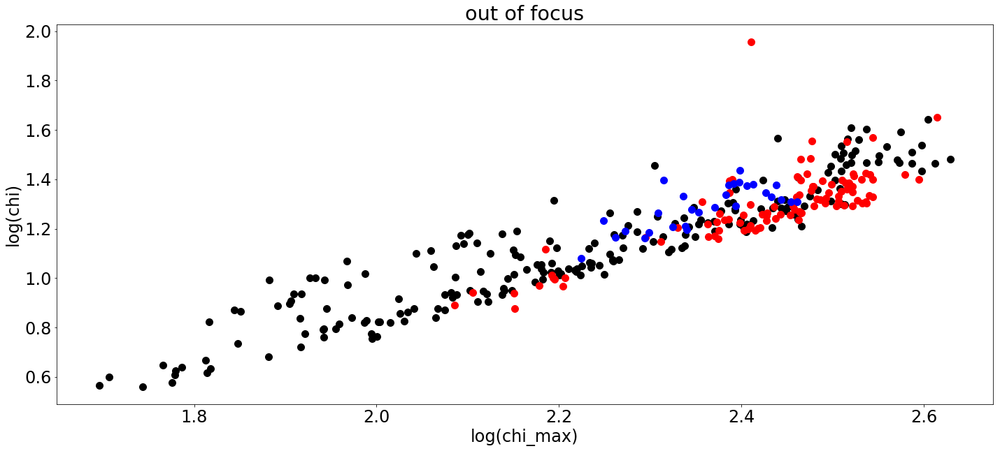

In [110]:
plt.figure(figsize=(24,10))

plt.plot(np.log10(results_of_fit_many_Ar['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar['p4']['chi2'].values),ls='',marker='o',color='black',label='Ar',markersize=10)
#plt.plot(np.log10(results_of_fit_many_Ar_Sep0521['p4']['chi2max'].values),\
#         np.log10(results_of_fit_many_Ar_Sep0521['p4']['chi2'].values),ls='',marker='o',color='gray',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ne['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Ne['p4']['chi2'].values),ls='',marker='o',color='red',label='Ne',markersize=10)
plt.plot(np.log10(results_of_fit_many_Kr['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Kr['p4']['chi2'].values),ls='',marker='o',color='blue',label='Kr',markersize=10)
plt.xlabel('log(chi_max)')
plt.ylabel('log(chi)')
plt.title('out of focus')

(-0.1, 1)

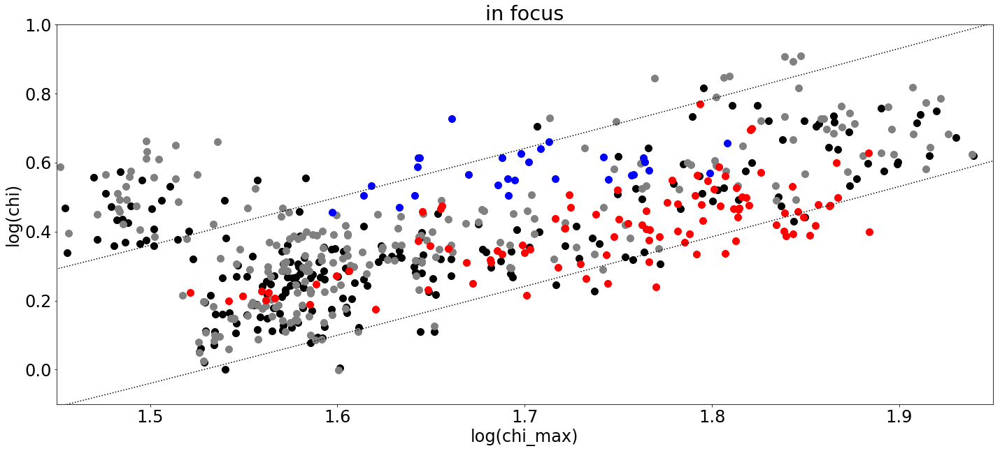

In [111]:
plt.figure(figsize=(24,10))
plt.plot(np.log10(results_of_fit_many_Ar['0']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar['0']['chi2'].values),ls='',marker='o',color='black',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ar_Sep0521['0']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar_Sep0521['0']['chi2'].values),ls='',marker='o',color='gray',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ne['0']['chi2max'].values),
         np.log10(results_of_fit_many_Ne['0']['chi2'].values),ls='',marker='o',color='red',label='Ne',markersize=10)
plt.plot(np.log10(results_of_fit_many_Kr['0']['chi2max'].values),
         np.log10(results_of_fit_many_Kr['0']['chi2'].values),ls='',marker='o',color='blue',label='Kr',markersize=10)
plt.xlabel('log(chi_max)')
plt.ylabel('log(chi)')
plt.title('in focus')
plt.plot(np.arange(1,2.1,0.1),np.arange(1,2.1,0.1)**1.25-1.7,color='black',ls=':')
plt.plot(np.arange(1,2.1,0.1),np.arange(1,2.1,0.1)**1.25-1.3,color='black',ls=':')
plt.xlim(1.45,1.95)
plt.ylim(-0.1,1)

In [113]:
label_focus='0'

values_Ar_improvment_focus=np.log10(results_of_fit_many_Ar[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Ar[label_focus]['chi2max'].values)
x_Ar_focus=finalAr.loc[results_of_fit_many_Ar[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Ar_focus=finalAr.loc[results_of_fit_many_Ar[label_focus].index.astype(int).ravel()]['yc'].values

values_Ne_improvment_focus=np.log10(results_of_fit_many_Ne[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Ne[label_focus]['chi2max'].values)
x_Ne_focus=finalNe.loc[results_of_fit_many_Ne[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Ne_focus=finalNe.loc[results_of_fit_many_Ne[label_focus].index.astype(int).ravel()]['yc'].values

values_Kr_improvment_focus=np.log10(results_of_fit_many_Kr[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Kr[label_focus]['chi2max'].values)
x_Kr_focus=finalKr.loc[results_of_fit_many_Kr[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Kr_focus=finalKr.loc[results_of_fit_many_Kr[label_focus].index.astype(int).ravel()]['yc'].values

min_colors_improvment=np.min(values_Ar_improvment_focus)
max_colors_improvment=np.max(values_Ar_improvment_focus)

label_defocus='m4'

values_Ar_improvment_defocus=np.log10(results_of_fit_many_Ar[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Ar[label_defocus]['chi2max'].values)
x_Ar_defocus=finalAr.loc[results_of_fit_many_Ar[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Ar_defocus=finalAr.loc[results_of_fit_many_Ar[label_defocus].index.astype(int).ravel()]['yc'].values

values_Ne_improvment_defocus=np.log10(results_of_fit_many_Ne[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Ne[label_defocus]['chi2max'].values)
x_Ne_defocus=finalNe.loc[results_of_fit_many_Ne[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Ne_defocus=finalNe.loc[results_of_fit_many_Ne[label_defocus].index.astype(int).ravel()]['yc'].values

values_Kr_improvment_defocus=np.log10(results_of_fit_many_Kr[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Kr[label_defocus]['chi2max'].values)
x_Kr_defocus=finalKr.loc[results_of_fit_many_Kr[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Kr_defocus=finalKr.loc[results_of_fit_many_Kr[label_defocus].index.astype(int).ravel()]['yc'].values

min_colors_improvment_defocus=np.min(values_Ar_improvment_defocus)
max_colors_improvment_defocus=np.max(values_Ar_improvment_defocus)

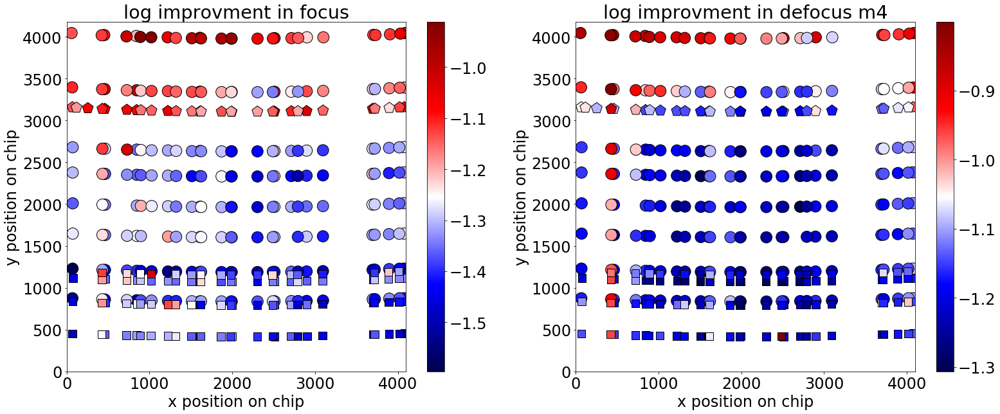

In [114]:
plt.figure(figsize=(26,10))

plt.subplot(121)
plt.scatter(x_Ar_focus, y_Ar_focus, s=np.pi * (10 * 1)**2, c=values_Ar_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='o')
plt.scatter(x_Ne_focus, y_Ne_focus, s=np.pi * (7 * 1)**2, c=values_Ne_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='s')
plt.scatter(x_Kr_focus, y_Kr_focus, s=np.pi * (10 * 1)**2, c=values_Kr_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in focus')
plt.colorbar()

plt.subplot(122)
plt.scatter(x_Ar_defocus, y_Ar_defocus, s=np.pi * (10 * 1)**2, c=values_Ar_improvment_defocus, \
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='o')
plt.scatter(x_Ne_defocus, y_Ne_defocus, s=np.pi * (7 * 1)**2, c=values_Ne_improvment_defocus,\
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='s')
plt.scatter(x_Kr_defocus, y_Kr_defocus, s=np.pi * (10 * 1)**2, c=values_Kr_improvment_defocus,\
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in defocus '+label_defocus)
plt.colorbar()

In [120]:
list_of_arc = np.array(['Ar'])
list_of_obs_cleaned = np.array([51485, 51581, 51677])

list_of_obs_cleaned[list_of_arc == 'Ar']

IndexError: boolean index did not match indexed array along dimension 0; dimension is 3 but corresponding boolean dimension is 1

In [118]:
list_of_arc == 'Ar'

array([ True,  True,  True,  True, False])

In [131]:
stronger_array_01 = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                              0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                              1.2, 1.2, 1.2, 1.2, 1.2, 1.2,
                              1, 1, 1, 1,
                              1.2, 1.2, 1.2, 1.2, 1.2,
                              1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1])

unified_index = [0, 1, 2, 4, 9, 10, 11, 12, 13, 14, 16, 21]

      

In [140]:
stronger_array_01[19*2:][unified_index] = 0
stronger_array_01

array([0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 1.2, 0. , 1.2, 1. , 1. , 1. , 0. , 0. , 0. , 0. , 0. ,
       0. , 1.2, 0. , 1.2, 1.2, 1.2, 1.2, 0. , 1. ])

In [ ]:
stronger_array_01[19*2:][unified_index]

In [143]:
np.array(columns22)[19:][unified_index]

array(['hscFrac', 'strutFrac', 'dxFocal', 'slitFrac', 'misalign',
       'x_fiber', 'y_fiber', 'effective_radius_illumination', 'frd_sigma',
       'frd_lorentz_factor', 'slitHolder_frac_dx', 'fiber_r'],
      dtype='<U29')

# Dec x

In [9]:
import glob

#finalAr_wrong_secondary=np.load("/tigress/ncaplar/ReducedData/Data_May_21_2021/Dataframes/finalAr_Jul2021_wrong_secondary",allow_pickle=True)
finalAr=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalAr_Jul2021",allow_pickle=True)
finalNe=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalNe_Jul2021",allow_pickle=True)
finalKr=np.load("/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/finalKr_Jul2021",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## Scripts 

In [10]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)<120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)<90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)<40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

80
40
10
Int64Index([  1,   3,   5,   6,   7,   8,   9,  11,  13,  15,  17,  18,  19,
             20,  21,  23,  25,  27,  29,  30,  31,  32,  33,  35,  37,  39,
             41,  42,  43,  44,  45,  47,  49,  51,  53,  54,  55,  56,  57,
             59,  61,  63,  65,  66,  67,  68,  69,  71,  73,  75,  77,  78,
             79,  80,  81,  83,  85,  87,  89,  90,  91,  92,  93,  95,  97,
             99, 101, 102, 103, 104, 105, 107, 109, 111, 113, 114, 115, 116,
            117, 119],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31, 35, 39], dtype='int64')


### Scripts 10

In [34]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)<120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)<90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)<40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

80
40
10
Int64Index([  1,   3,   5,   6,   7,   8,   9,  11,  13,  15,  17,  18,  19,
             20,  21,  23,  25,  27,  29,  30,  31,  32,  33,  35,  37,  39,
             41,  42,  43,  44,  45,  47,  49,  51,  53,  54,  55,  56,  57,
             59,  61,  63,  65,  66,  67,  68,  69,  71,  73,  75,  77,  78,
             79,  80,  81,  83,  85,  87,  89,  90,  91,  92,  93,  95,  97,
             99, 101, 102, 103, 104, 105, 107, 109, 111, 113, 114, 115, 116,
            117, 119],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31, 35, 39], dtype='int64')


In [244]:
date='Dec1021'


for single_spot in list_of_Ar_to_analyze:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_spot)+\
               " -nsteps 31 -eps 8 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  

file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [245]:
for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Ne_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --cpus-per-task=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    
    # m4, 0 p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4  -spot "+str(single_spot)+\
               " -nsteps 56 -eps 8 -dataset 6 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  

file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Ne_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ne_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [246]:
#list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index 
print(list_of_Kr_to_analyze)



for single_spot in list_of_Kr_to_analyze:
    if str(finalKr.loc[single_spot]['close'])=='0' or str(finalKr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Kr_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --cpus-per-task=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")

    # m4, 0 p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_spot)+\
               " -nsteps 56 -eps 8 -dataset 6 -arc Kr -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalKr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  



file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Kr_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Kr_1_'+str(single_spot)+date+'.sh \n')

file.close()

Int64Index([3, 7, 11, 15, 19, 23, 27, 31, 35, 39], dtype='int64')


### Scripts 21

In [63]:
date='Dec1021'

In [64]:
#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=(finalAr[finalAr['close']=='1'].index)[(finalAr[finalAr['close']=='1'].index)>120]
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index [(finalNe[finalNe['close']=='1'].index)>90]
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index [(finalKr[finalKr['close']==1].index)>40]

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

168
84
21
Int64Index([121, 123, 125, 126, 127, 128, 129, 131, 133, 135,
            ...
            357, 359, 361, 363, 365, 366, 367, 368, 369, 371],
           dtype='int64', length=168)
Int64Index([ 92,  95,  96,  97, 101, 104, 105, 106, 110, 113, 114, 115, 119,
            122, 123, 124, 128, 131, 132, 133, 137, 140, 141, 142, 146, 149,
            150, 151, 155, 158, 159, 160, 164, 167, 168, 169, 173, 176, 177,
            178, 182, 185, 186, 187, 191, 194, 195, 196, 200, 203, 204, 205,
            209, 212, 213, 214, 218, 221, 222, 223, 227, 230, 231, 232, 236,
            239, 240, 241, 245, 248, 249, 250, 254, 257, 258, 259, 263, 266,
            267, 268, 272, 275, 276, 277],
           dtype='int64')
Int64Index([ 43,  47,  51,  55,  59,  63,  67,  71,  75,  79,  83,  87,  91,
             95,  99, 103, 107, 111, 115, 119, 123],
           dtype='int64')


In [67]:
arranged_by_spot_number_Ar[:,1].astype(int)

array([121, 123, 125, 126, 127, 128, 129, 131, 133, 135, 151, 152, 153,
       155, 157, 159, 161, 162, 163, 164, 165, 167, 169, 171, 173, 174,
       175, 176, 177, 179, 181, 183, 185, 186, 187, 188, 189, 191, 193,
       195, 211, 212, 213, 215, 217, 219, 221, 222, 223, 224, 225, 227,
       229, 231, 233, 234, 235, 236, 237, 239, 241, 243, 245, 246, 247,
       248, 249, 251, 253, 255, 257, 258, 259, 260, 261, 263, 265, 267,
       269, 270, 271, 272, 273, 275, 277, 279, 281, 282, 283, 284, 285,
       287, 289, 291, 293, 294, 295, 296, 297, 299, 301, 303, 305, 306,
       307, 308, 309, 311, 337, 339, 341, 342, 343, 344, 345, 347, 349,
       351, 353, 354, 355, 356, 357, 359, 361, 363, 365, 366, 367, 368,
       369, 371])

In [71]:
Argon_spots_2nd_run = np.setdiff1d(list_of_Ar_to_analyze,arranged_by_spot_number_Ar[:,1].astype(int))
Argon_spots_2nd_run

array([137, 138, 139, 140, 141, 143, 145, 147, 149, 150, 197, 198, 199,
       200, 201, 203, 205, 207, 209, 210, 313, 315, 317, 318, 319, 320,
       321, 323, 325, 327, 329, 330, 331, 332, 333, 335])

In [14]:
# on della

date='Dec1021'

for single_spot in list_of_Ar_to_analyze[159:]:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_spot)+\
               " -nsteps 31 -eps 8 -dataset 8 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  

file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Ar_21_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze[159:]:
    file.write('sbatch /home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [74]:
# on della

date='Dec1021'

for single_spot in Argon_spots_2nd_run:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    # source /tigress/HSC/PFS/stack/current/loadLSST.bash; source scl_source enable devtoolset-6; setup pfs_pipe2d; setup galsim; setup matplotlib; setup display_matplotlib;
    
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_spot)+\
               " -nsteps 31 -eps 8 -dataset 8 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  

file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Ar_212_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in Argon_spots_2nd_run:
    file.write('sbatch /home/ncaplar/Scripts/D_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [301]:
# on pfsa-usr01.subaru.nao.ac.jp

date='Dec1021'
for s in range(len(np.array_split(list_of_Ar_to_analyze,18))):
    list_of_Ar_to_analyze_in_this_script = np.array_split(list_of_Ar_to_analyze,18)[s]

    file = open('/home/ncaplar/Scripts/D_Ar_'+str(s)+'_Hilo_'+date+'.sh','w') 
    for single_spot in list_of_Ar_to_analyze_in_this_script:
        if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
            double_source=True
        else:
            double_source=False    


        file.write("python /home/neven/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_spot)+\
                   " -nsteps 31 -eps 8 -dataset 8 -arc Ar -double_sources "+str(double_source)+\
                   " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
                   " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot; \n")


    file.close()    
    
"""
# use homebrew terminal
ssh pfsa-usr01.subaru.nao.ac.jp
# open http://pfsa-usr01.subaru.nao.ac.jp:8100 for Jupiter
# open terminal within opera
export OMP_NUM_THREADS=1
source /work/stack/loadLSST.bash; setup pfs_pipe2d

"""
    
# on IapetusUSA
# scp ncaplar@tiger:/home/ncaplar/Scripts/* ~/Documents/PFS/TigerAnalysis/ScriptsForTiger/
# scp ~/Documents/PFS/TigerAnalysis/ScriptsForTiger/* neven@pfsa-usr01-gb:/home/neven/Scripts


# to get data
# rsync -avh neven@pfsa-usr01-gb:/work/ncaplar/Results/*Dec10* ~/Documents/PFS/TigerAnalysis/ResultsFromTiger/
# scp neven@pfsa-usr01-gb:/work/ncaplar/Results/*Dec10* ~/Documents/PFS/TigerAnalysis/ResultsFromTiger/
# rsync ~/Documents/PFS/TigerAnalysis/ResultsFromTiger/*Dec10* ncaplar@tiger:/tigress/ncaplar/Results/
# scp ~/Documents/PFS/TigerAnalysis/ResultsFromTiger/*Dec10* ncaplar@tiger:/tigress/ncaplar/Results/


# 
# source /work/stack/loadLSST.bash; setup pfs_pipe2d; 
# export OMP_NUM_THREADS=1
# nohup sh D_Ar_5_Hilo_Dec1021.sh &> D_Ar_5_Hilo_Dec1021.out &

# up to 6 on Dec10

In [18]:
for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Ne_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --cpus-per-task=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    
    
    # m4, 0 p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4  -spot "+str(single_spot)+\
               " -nsteps 56 -eps 8 -dataset 8 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  

file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Ne_21_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Ne_1_'+str(single_spot)+date+'.sh \n')

file.close()

# scp ncaplar@tiger:/home/ncaplar/Scripts/* ~/Documents/PFS/TigerAnalysis/ScriptsForTiger/
# scp /Users/nevencaplar/PFS/TigerAnalysis/ScriptsForTiger/* ncaplar@della:/home/ncaplar/Scripts

In [19]:
#list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index 
print(list_of_Kr_to_analyze)



for single_spot in list_of_Kr_to_analyze:
    if str(finalKr.loc[single_spot]['close'])=='0' or str(finalKr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/home/ncaplar/Scripts/D_Kr_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --cpus-per-task=28 \n") 
    file.write("#SBATCH --time 05:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")

    # m4, 0 p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -label m4 0 p4 -spot "+str(single_spot)+\
               " -nsteps 56 -eps 8 -dataset 8 -arc Kr -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalKr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Dec0721 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type fixed_single_spot \n")
    file.close()    
  



file = open('/home/ncaplar/Scripts/'+date+'ScriptToSubmitScriptsDella_Kr_21_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/D_Kr_1_'+str(single_spot)+date+'.sh \n')

file.close()

Int64Index([ 43,  47,  51,  55,  59,  63,  67,  71,  75,  79,  83,  87,  91,
             95,  99, 103, 107, 111, 115, 119, 123],
           dtype='int64')


## which are avaliable

In [10]:
#date='May2921'

date_folder=''
date_files='Dec1021'
ResultsFromTiger_FOLDER='/tigress/ncaplar/Results/'


#Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date_folder+'/chain'+date_files+'_Single_P_*KrSwarm1.npy', recursive=True)

### which are avaliable - 10 fibers

In [13]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    # single string should be total number, including exposure id, e.g., ``34437101''
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])

print(analyzed_Ar_images)
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='34437']
#analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='34657']
analyzed_Ar_images=analyzed_Ar_images[np.argsort(analyzed_Ar_images[:,1].astype(int))]




###########

analyzed_Ne_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Ne_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Ne_images=np.array(analyzed_Ne_images)
try:
    analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='34313']
    #analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='34657']
    analyzed_Ne_images=analyzed_Ne_images[np.argsort(analyzed_Ne_images[:,1].astype(int))]
except:
    pass




###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
try:
    analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='34657']
    analyzed_Kr_images=analyzed_Kr_images[np.argsort(analyzed_Kr_images[:,1].astype(int))]
except:
    pass

[[34437, 113, 'Ar'], [51677, 371, 'Ar'], [51677, 197, 'Ar'], [34437, 114, 'Ar'], [34437, 68, 'Ar'], [51677, 305, 'Ar'], [51677, 147, 'Ar'], [51677, 207, 'Ar'], [34437, 37, 'Ar'], [34437, 30, 'Ar'], [51677, 309, 'Ar'], [51677, 269, 'Ar'], [51677, 323, 'Ar'], [51677, 265, 'Ar'], [34437, 6, 'Ar'], [51677, 125, 'Ar'], [51677, 282, 'Ar'], [34437, 17, 'Ar'], [51677, 215, 'Ar'], [34437, 9, 'Ar'], [34437, 116, 'Ar'], [51677, 179, 'Ar'], [51677, 219, 'Ar'], [51677, 123, 'Ar'], [34437, 61, 'Ar'], [34437, 79, 'Ar'], [34437, 13, 'Ar'], [34437, 102, 'Ar'], [34437, 15, 'Ar'], [51677, 337, 'Ar'], [51677, 171, 'Ar'], [34437, 81, 'Ar'], [34437, 19, 'Ar'], [51677, 273, 'Ar'], [51677, 343, 'Ar'], [34437, 69, 'Ar'], [51677, 149, 'Ar'], [51677, 270, 'Ar'], [51677, 177, 'Ar'], [34437, 18, 'Ar'], [51677, 365, 'Ar'], [51677, 272, 'Ar'], [51677, 212, 'Ar'], [51677, 319, 'Ar'], [51677, 153, 'Ar'], [51677, 145, 'Ar'], [51677, 189, 'Ar'], [51677, 303, 'Ar'], [34437, 109, 'Ar'], [51677, 185, 'Ar'], [51677, 318, 'A

In [14]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Ne_images)>0:
    arranged_by_defocus_Ne=analyzed_Ne_images[analyzed_Ne_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Ne_images[analyzed_Ne_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
print([80,40,10])   
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Ne_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

[80, 40, 10]
analyzed_Ar_images:80 / analyzed_Ne_images:31 / analyzed_Kr_images:10


In [15]:
arranged_by_spot_number_Ar_10=np.copy(arranged_by_spot_number_Ar)
arranged_by_spot_number_Ne_10=np.copy(arranged_by_spot_number_Ne)
arranged_by_spot_number_Kr_10=np.copy(arranged_by_spot_number_Kr)

In [16]:
arranged_by_spot_number_Ne_10

array([['34313', '11', 'Ne'],
       ['34313', '14', 'Ne'],
       ['34313', '15', 'Ne'],
       ['34313', '2', 'Ne'],
       ['34313', '20', 'Ne'],
       ['34313', '23', 'Ne'],
       ['34313', '24', 'Ne'],
       ['34313', '25', 'Ne'],
       ['34313', '29', 'Ne'],
       ['34313', '32', 'Ne'],
       ['34313', '33', 'Ne'],
       ['34313', '38', 'Ne'],
       ['34313', '41', 'Ne'],
       ['34313', '42', 'Ne'],
       ['34313', '47', 'Ne'],
       ['34313', '5', 'Ne'],
       ['34313', '50', 'Ne'],
       ['34313', '51', 'Ne'],
       ['34313', '56', 'Ne'],
       ['34313', '59', 'Ne'],
       ['34313', '6', 'Ne'],
       ['34313', '60', 'Ne'],
       ['34313', '65', 'Ne'],
       ['34313', '68', 'Ne'],
       ['34313', '69', 'Ne'],
       ['34313', '74', 'Ne'],
       ['34313', '77', 'Ne'],
       ['34313', '78', 'Ne'],
       ['34313', '83', 'Ne'],
       ['34313', '86', 'Ne'],
       ['34313', '87', 'Ne']], dtype='<U21')

In [16]:
arranged_by_spot_number_Ar_10

array([['34437', '1', 'Ar'],
       ['34437', '101', 'Ar'],
       ['34437', '102', 'Ar'],
       ['34437', '103', 'Ar'],
       ['34437', '104', 'Ar'],
       ['34437', '105', 'Ar'],
       ['34437', '107', 'Ar'],
       ['34437', '109', 'Ar'],
       ['34437', '11', 'Ar'],
       ['34437', '111', 'Ar'],
       ['34437', '113', 'Ar'],
       ['34437', '114', 'Ar'],
       ['34437', '115', 'Ar'],
       ['34437', '116', 'Ar'],
       ['34437', '117', 'Ar'],
       ['34437', '119', 'Ar'],
       ['34437', '13', 'Ar'],
       ['34437', '15', 'Ar'],
       ['34437', '17', 'Ar'],
       ['34437', '18', 'Ar'],
       ['34437', '19', 'Ar'],
       ['34437', '20', 'Ar'],
       ['34437', '21', 'Ar'],
       ['34437', '23', 'Ar'],
       ['34437', '25', 'Ar'],
       ['34437', '27', 'Ar'],
       ['34437', '29', 'Ar'],
       ['34437', '3', 'Ar'],
       ['34437', '30', 'Ar'],
       ['34437', '31', 'Ar'],
       ['34437', '32', 'Ar'],
       ['34437', '33', 'Ar'],
       ['34437', '35', 'Ar']

In [ ]:
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70, 74, 77,
            78, 79, 83, 86, 87, 88],

### which are avaliable - 21 fibers

In [2]:
eps_value=8

analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    # single string should be total number, including exposure id, e.g., ``34437101''
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]==str(eps_value):
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 
analyzed_Ar_images=np.array(analyzed_Ar_images)
analyzed_Ar_images_original = np.copy(analyzed_Ar_images)
analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='51677']
#analyzed_Ar_images=analyzed_Ar_images[analyzed_Ar_images[:,0]=='52277']
analyzed_Ar_images=analyzed_Ar_images[np.argsort(analyzed_Ar_images[:,1].astype(int))]


# we want to avoid fibers 110 and 111 which overlap
index_110_111_Ar=finalAr[(finalAr['fiber']==110) | (finalAr['fiber']==111)].index
analyzed_Ar_images_index_without_110_111=np.setdiff1d(analyzed_Ar_images[:,1].astype(int),index_110_111_Ar)
analyzed_Ar_images=analyzed_Ar_images[np.isin(analyzed_Ar_images[:,1].astype(int),analyzed_Ar_images_index_without_110_111)]

###########

analyzed_Ne_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]==str(eps_value):
        analyzed_Ne_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Ne_images=np.array(analyzed_Ne_images)
try:
    #analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='52277']
    analyzed_Ne_images=analyzed_Ne_images[analyzed_Ne_images[:,0]=='59847']
    analyzed_Ne_images=analyzed_Ne_images[np.argsort(analyzed_Ne_images[:,1].astype(int))]

    # we want to avoid fibers 110 and 111 which overlap
    index_110_111_Ne=finalNe[(finalNe['fiber']==110) | (finalNe['fiber']==111)].index
    analyzed_Ne_images_index_without_110_111=np.setdiff1d(analyzed_Ne_images[:,1].astype(int),index_110_111_Ne)
    analyzed_Ne_images=analyzed_Ne_images[np.isin(analyzed_Ne_images[:,1].astype(int),analyzed_Ne_images_index_without_110_111)]
    
except:
    print('error in Ne images')
    pass



###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+22:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]==str(eps_value):
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)
try:
    analyzed_Kr_images=analyzed_Kr_images[analyzed_Kr_images[:,0]=='52277']
    analyzed_Kr_images=analyzed_Kr_images[np.argsort(analyzed_Kr_images[:,1].astype(int))]
    # we want to avoid fibers 110 and 111 which overlap
    index_110_111_Kr=finalKr[(finalKr['fiber']==110) | (finalKr['fiber']==111)].index
    analyzed_Kr_images_index_without_110_111=np.setdiff1d(analyzed_Kr_images[:,1].astype(int),index_110_111_Kr)
    analyzed_Kr_images=analyzed_Kr_images[np.isin(analyzed_Kr_images[:,1].astype(int),analyzed_Kr_images_index_without_110_111)]  

except:
    pass


NameError: name 'Emcee3_Ar' is not defined

In [3]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Ne_images)>0:
    arranged_by_defocus_Ne=analyzed_Ne_images[analyzed_Ne_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Ne_images[analyzed_Ne_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print(np.array([ 168, 84, 21])/21*19)  
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+
      ' / '+'analyzed_Ne_images:'+str(len(analyzed_Ne_images))+
      ' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

NameError: name 'analyzed_Ne_images' is not defined

In [16]:
arranged_by_spot_number_Ar

array([['51677', '121', 'Ar'],
       ['51677', '123', 'Ar'],
       ['51677', '125', 'Ar'],
       ['51677', '126', 'Ar'],
       ['51677', '127', 'Ar'],
       ['51677', '128', 'Ar'],
       ['51677', '129', 'Ar'],
       ['51677', '131', 'Ar'],
       ['51677', '133', 'Ar'],
       ['51677', '135', 'Ar'],
       ['51677', '137', 'Ar'],
       ['51677', '138', 'Ar'],
       ['51677', '139', 'Ar'],
       ['51677', '140', 'Ar'],
       ['51677', '141', 'Ar'],
       ['51677', '143', 'Ar'],
       ['51677', '145', 'Ar'],
       ['51677', '147', 'Ar'],
       ['51677', '149', 'Ar'],
       ['51677', '150', 'Ar'],
       ['51677', '151', 'Ar'],
       ['51677', '152', 'Ar'],
       ['51677', '153', 'Ar'],
       ['51677', '155', 'Ar'],
       ['51677', '157', 'Ar'],
       ['51677', '159', 'Ar'],
       ['51677', '161', 'Ar'],
       ['51677', '162', 'Ar'],
       ['51677', '163', 'Ar'],
       ['51677', '164', 'Ar'],
       ['51677', '165', 'Ar'],
       ['51677', '167', 'Ar'],
       [

In [17]:
arranged_by_spot_number_Ne

array([['59847', '101', 'Ne'],
       ['59847', '104', 'Ne'],
       ['59847', '105', 'Ne'],
       ['59847', '106', 'Ne'],
       ['59847', '110', 'Ne'],
       ['59847', '113', 'Ne'],
       ['59847', '114', 'Ne'],
       ['59847', '115', 'Ne'],
       ['59847', '119', 'Ne'],
       ['59847', '122', 'Ne'],
       ['59847', '123', 'Ne'],
       ['59847', '124', 'Ne'],
       ['59847', '128', 'Ne'],
       ['59847', '131', 'Ne'],
       ['59847', '132', 'Ne'],
       ['59847', '133', 'Ne'],
       ['59847', '137', 'Ne'],
       ['59847', '140', 'Ne'],
       ['59847', '141', 'Ne'],
       ['59847', '142', 'Ne'],
       ['59847', '146', 'Ne'],
       ['59847', '149', 'Ne'],
       ['59847', '150', 'Ne'],
       ['59847', '151', 'Ne'],
       ['59847', '155', 'Ne'],
       ['59847', '158', 'Ne'],
       ['59847', '159', 'Ne'],
       ['59847', '160', 'Ne'],
       ['59847', '164', 'Ne'],
       ['59847', '167', 'Ne'],
       ['59847', '168', 'Ne'],
       ['59847', '169', 'Ne'],
       [

In [21]:
arranged_by_spot_number_Ar_21=np.copy(arranged_by_spot_number_Ar)
arranged_by_spot_number_Ne_21=np.copy(arranged_by_spot_number_Ne)
arranged_by_spot_number_Kr_21=np.copy(arranged_by_spot_number_Kr)

In [20]:
results_of_fit_many_direct_Kr_from_Dec0721=np.load('/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Kr_from_Dec0721.pkl')
results_of_fit_many_direct_Kr_from_Sep0521=np.load('/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Kr_from_Sep0521.pkl')

In [19]:
results_of_fit_many_direct_Kr_from_Dec0721['m4'].loc['87']

z4              26.421262
z5               0.141369
z6              -1.494370
z7               0.015111
z8              -0.358965
z9              -0.172460
z10             -0.283160
z11             -0.394072
z12              0.013170
z13             -0.051260
z14             -0.024889
z15              0.093679
z16              0.014306
z17              0.079292
z18             -0.003299
z19              0.024669
z20             -0.069561
z21              0.010261
z22              0.089542
hscFrac          0.664129
strutFrac        0.076704
dxFocal          0.013148
dyFocal          0.113079
slitFrac         0.058383
slitFrac_dy      0.007383
wide_0           0.000771
wide_23          0.123095
wide_43          0.063291
misalign         2.108891
x_fiber          0.019830
                  ...    
z29             -0.005069
z30              0.001750
z31             -0.005557
z32             -0.005602
z33             -0.005008
z34             -0.004800
z35             -0.002310
z36         

In [21]:
results_of_fit_many_direct_Kr_from_Sep0521['m4'].loc['87']

z4              26.163149
z5               0.167678
z6              -1.481591
z7               0.039540
z8              -0.362455
z9              -0.104866
z10             -0.314347
z11             -0.329085
z12             -0.013422
z13             -0.053601
z14             -0.000220
z15              0.072519
z16             -0.018604
z17              0.103870
z18              0.000902
z19              0.005469
z20             -0.059387
z21              0.032384
z22              0.105033
hscFrac          0.670058
strutFrac        0.073596
dxFocal         -0.004014
dyFocal          0.113079
slitFrac         0.062671
slitFrac_dy      0.007383
wide_0           0.001038
wide_23          0.123095
wide_43          0.063291
misalign         0.124403
x_fiber         -0.003964
                  ...    
z29             -0.002288
z30             -0.002356
z31             -0.000144
z32             -0.001968
z33             -0.013983
z34             -0.009023
z35             -0.003168
z36         

## single image analysis 

In [46]:
 date='Dec1021'

single_number='221'
image_index=int(single_number)
eps=8
arc='Ar'


if arc=='Ar':

    finalArc=finalAr
    if int(single_number)<120:
        dataset=6
        obs=34341+96
    if int(single_number)>=120:
        dataset=8
        obs=51485+16*12
        
if arc=='Ne':

    finalArc=finalNe
    if int(single_number)<90:
        dataset=6
        obs=27719
    if int(single_number)>=90:
        dataset=8    
        obs=59655+16*12
        
        
if arc=='Kr':

    finalArc=finalKr
    if int(single_number)<40:
        dataset=6
        obs=34561+96
    if int(single_number)>=40:
        dataset=8
        obs=52085+16*12
    

wavelength=float(finalArc.loc[int(single_number)]['wavelength'])
#wavelength=None

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_short_with_focus=['m4','0','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   400
xc                     1623
yc                     1605
wavelength        763.74286
close                     1
lamp                     Ar
xc_effective           1623
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 221, dtype: object

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 221
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]


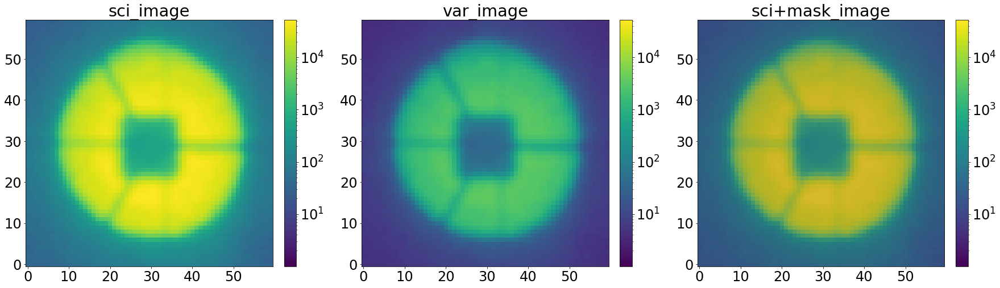

In [47]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
single_analysis.create_basic_data_image()

In [48]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772218ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772218ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 23.454952084682038


In [25]:
double_sources_positions_ratios.shape

(2,)

### chain analysis 

In [14]:
gbest_filename='/tigress/ncaplar/Results/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/tigress/ncaplar/Results/chainDec1021_Single_P_516772228Arres_gbests_position.npy
(31, 129)


array([    -7.53813831,     -0.45038473,      0.08555675,     -0.12218698,
            0.14699227,     -0.3148366 ,     -0.11382542,      0.19904857,
            0.06510547,     -0.08836101,     -0.00323387,     -0.13130829,
           -0.00681432,     -0.37437878,     -0.22916557,     -0.62781668,
            0.00712298,     -0.01798728,     -0.00157518,     -0.02693627,
            0.00133306,      0.035884  ,      0.00080491,      0.02164696,
            0.00055989,     -0.04222093,     -0.02322491,      0.04575677,
           -0.00336966,     -0.00505106,     -0.00091056,     -0.02714849,
           -0.00057344,     -0.04987206,     -0.00057113,      0.08565465,
           -0.08767994,     -0.11616542,      0.67648546,      0.07017027,
           -0.03538806,      0.01325448,      0.058876  ,      0.00975886,
            0.01257842,      0.28213551,      0.16248842,      0.93930315,
            0.02166682,     -0.03624787,      0.90189977,      0.02231524,
            0.76334506,  

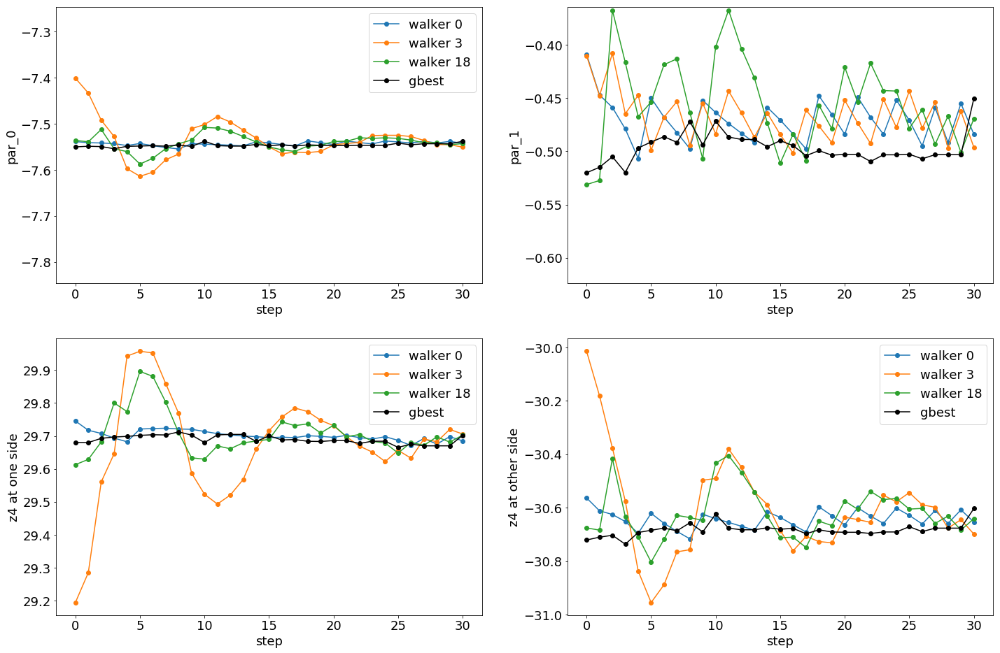

In [15]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=0*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(gbests_positions[:,i])
plt.ylim(np.min([mean_one_what-0.3,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.3,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z4 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

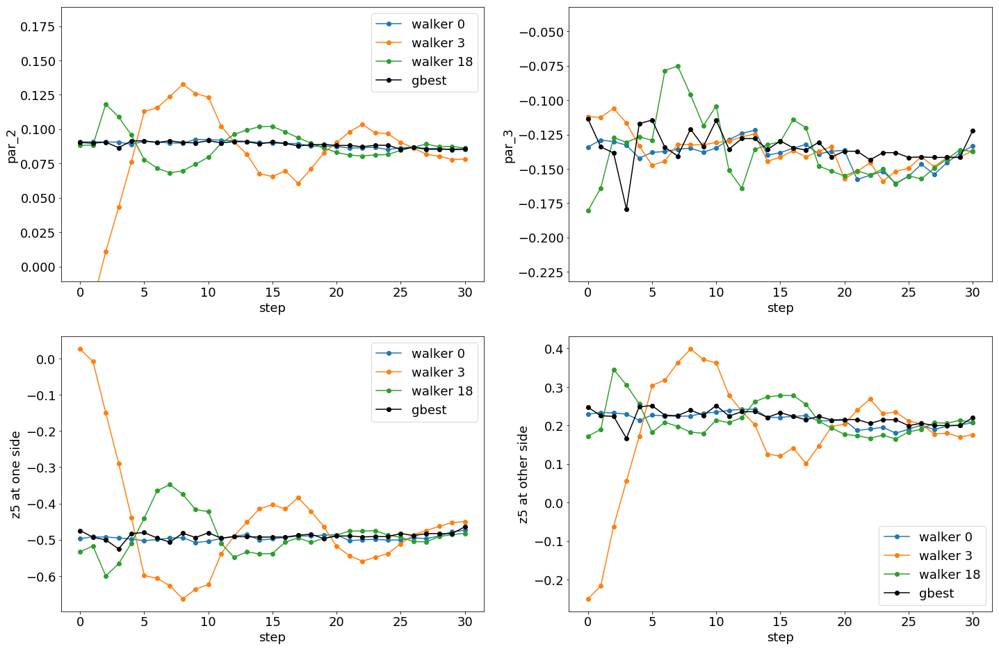

In [16]:
# wavefront paramter
plt.figure(figsize=(24,16))
i=1*2
plt.subplot(221)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(222)
#  paramter 1 (z4, linear parameter)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i+1])*1.2]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i+1])*1.2]))
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))


plt.subplot(223)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(-4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(-4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at one side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

plt.subplot(224)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,0],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i]*(4)+chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i]*(4)+gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('z5 at other side')
mean_one_what=np.mean(chain0_swarm_1[:,:,i][:,2])
#plt.ylim(np.min([mean_one_what-0.1,np.min(gbests_positions[:,i])*0.8]),np.max([mean_one_what+0.1,np.max(gbests_positions[:,i])*1.2]))
plt.legend()

Text(0.5, 1.0, 'par_46 / wide_43')

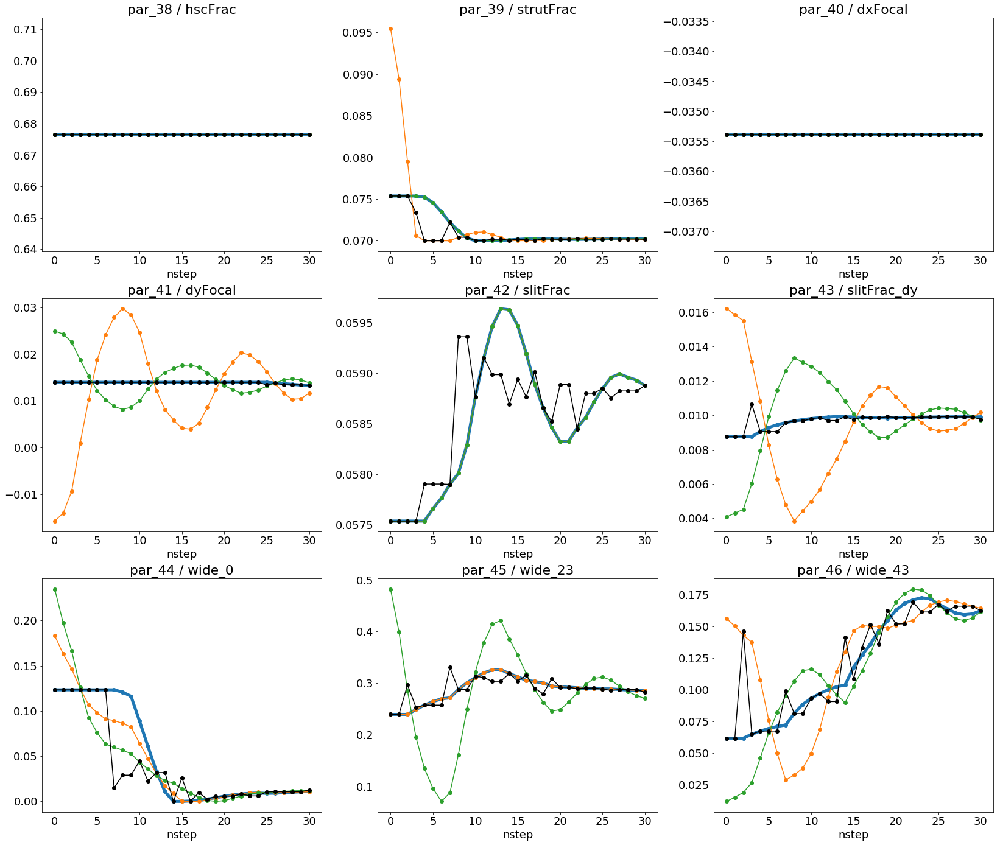

In [17]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

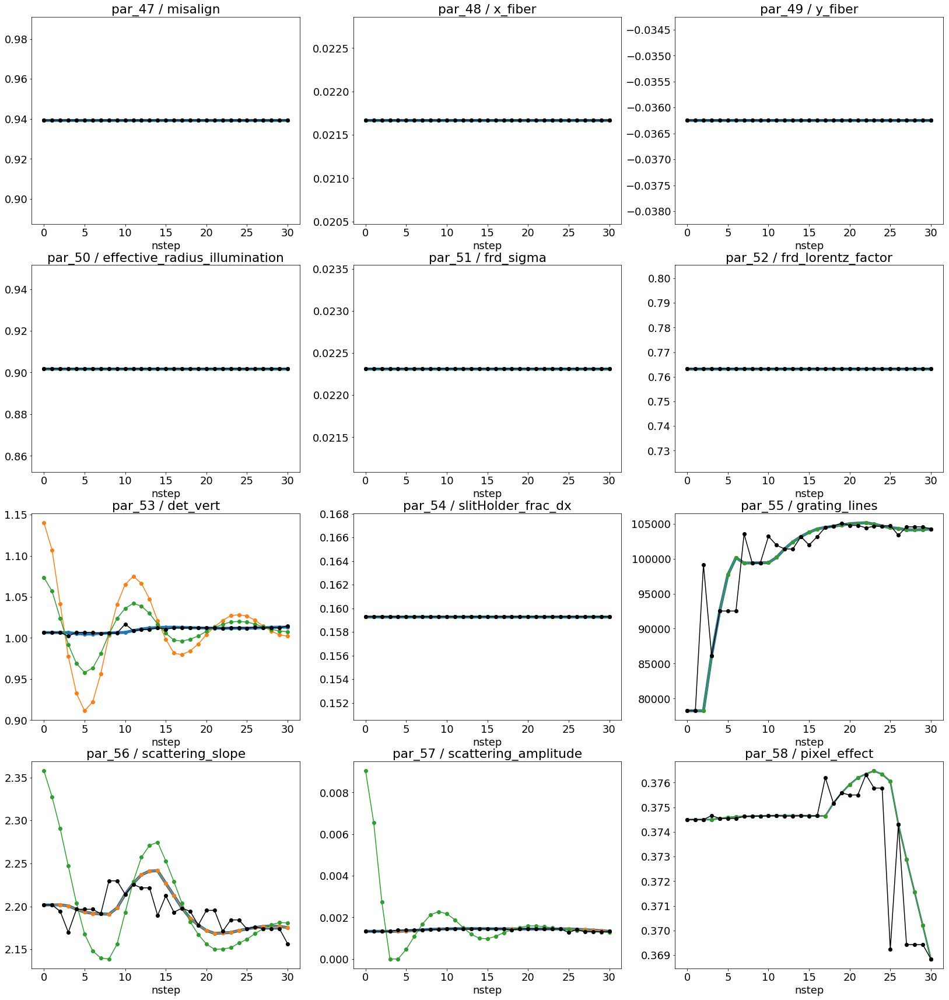

In [18]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

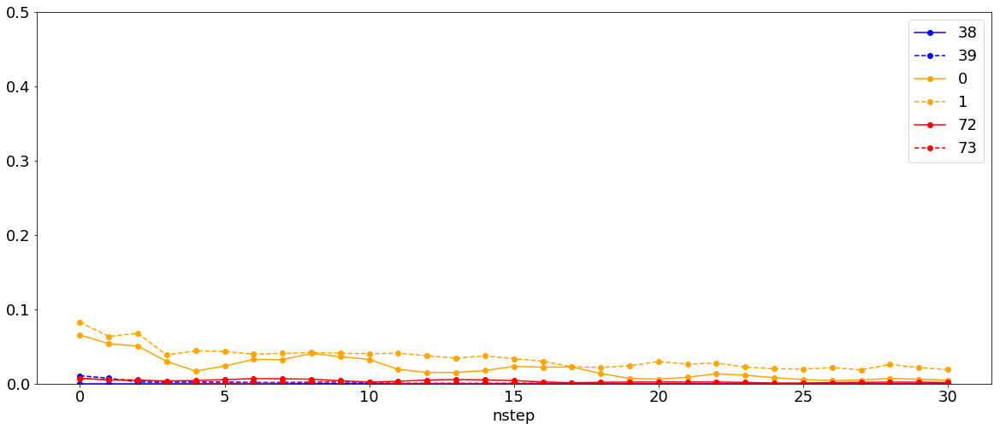

In [19]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0,0.5)
plt.xlabel('nstep')


plt.legend()

/tigress/HSC/PFS/stack/20190925/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/matplotlib/pyplot.py:1442: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=0.6764854558344449, right=0.6764854558344449
  ret = ax.set_xlim(*args, **kwargs)


Text(0, 0.5, 'strutFrac')

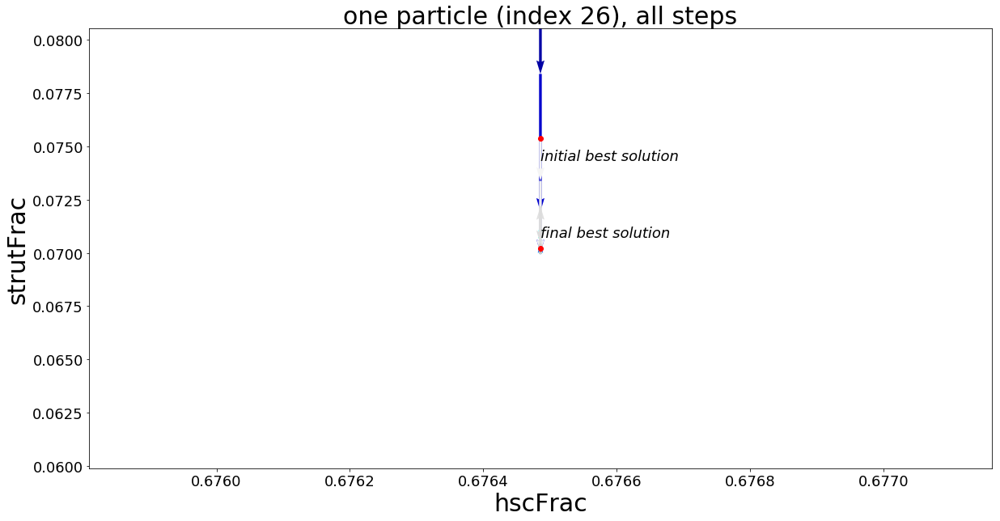

In [20]:
nsteps=chain0_swarm_1.shape[0]

j=0
n_particle=26
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])


X=array_of_single_particle_par_movements[:,0][0:(nsteps-1)]
Y=array_of_single_particle_par_movements[:,1][0:(nsteps-1)]
U=step32_dif_1[0:(nsteps-1)]
V=step32_dif_6[0:(nsteps-1)]

X_best=array_of_gbest_particle_movements[:,0][0:(nsteps-1)]
Y_best=array_of_gbest_particle_movements[:,1][0:(nsteps-1)]
U_best=step32_dif_1_best[0:(nsteps-1)]
V_best=step32_dif_6_best[0:(nsteps-1)]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range((nsteps-1)):
    list_of_colors.append(cmap(i/(nsteps-1)))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range((nsteps-1)):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle (index '+str(n_particle)+'), all steps',size=30)

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,label='particle')
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,label='best solution')
plt.scatter(X_best[-1],Y_best[-1],color='red')
plt.scatter(X_best[0],Y_best[0],color='red')

delta_X=np.abs(X_best[0]-X_best[-1])
delta_Y=np.abs(Y_best[0]-Y_best[-1])

plt.text(X_best[-1]+-0.1*np.abs(delta_X),Y_best[-1]+np.abs(0.1*delta_Y),s='final best solution',style='italic')
plt.text(X_best[0]+-0.1*np.abs(delta_X),Y_best[0]-np.abs(0.2*delta_Y),s='initial best solution',style='italic')



plt.xlim(X_best[-1]-2*delta_X,X_best[-1]+2*delta_X)
plt.ylim(Y_best[-1]-2*delta_Y,Y_best[-1]+2*delta_Y)

plt.xlabel(columns22[i1-19],size=30)
plt.ylabel(columns22[i6-19],size=30)

#plt.legend()

Text(0, 0.5, 'parameter: 39')

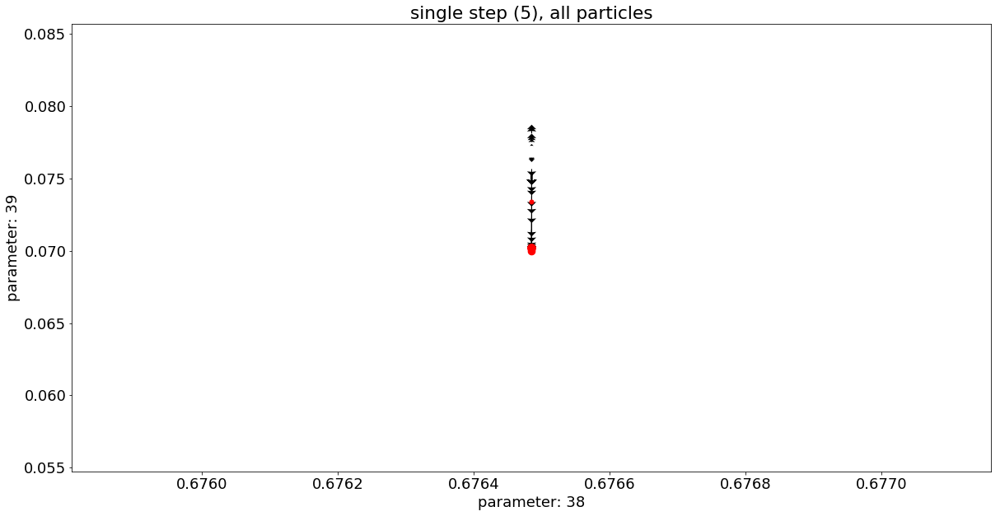

In [21]:
j=3
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j1=j+1
step1_test_1=chain0_swarm_1[:,:,i1][j1]
step1_test_6=chain0_swarm_1[:,:,i6][j1]
j2=j+2
step2_test_1=chain0_swarm_1[:,:,i1][j2]
step2_test_6=chain0_swarm_1[:,:,i6][j2]
j3=j+3
step3_test_1=chain0_swarm_1[:,:,i1][j3]
step3_test_6=chain0_swarm_1[:,:,i6][j3]

step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

X=step1_test_1
Y=step1_test_6
U=step21_dif_1
V=step21_dif_6

number_of_particles_shown=200
plt.figure(figsize=(20,10))
plt.title('single step ('+str(j2)+'), all particles')
Q = plt.quiver(X[0:number_of_particles_shown], Y[0:number_of_particles_shown], U[0:number_of_particles_shown], V[0:number_of_particles_shown], units='width', angles='xy', scale_units='xy', scale=1,width=0.001,headwidth=10)

range_multiplier=3
plt.scatter(X_best[-1],Y_best[-1],color='red',s=100)
plt.scatter(X_best[j],Y_best[j],color='red',s=25)
plt.scatter(X_best[j1],Y_best[j1],color='red',s=50)
plt.scatter(X_best[j2],Y_best[j2],color='red',s=75)
plt.xlim(X_best[-1]-range_multiplier*delta_X,X_best[-1]+range_multiplier*delta_X)
plt.ylim(Y_best[-1]-range_multiplier*delta_Y,Y_best[-1]+range_multiplier*delta_Y)
plt.xlabel('parameter: '+str(i1))
plt.ylabel('parameter: '+str(i6))

minimal likelihood is: 11.971801375962258
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772228ArSwarm1.npy
(31, 480, 129)


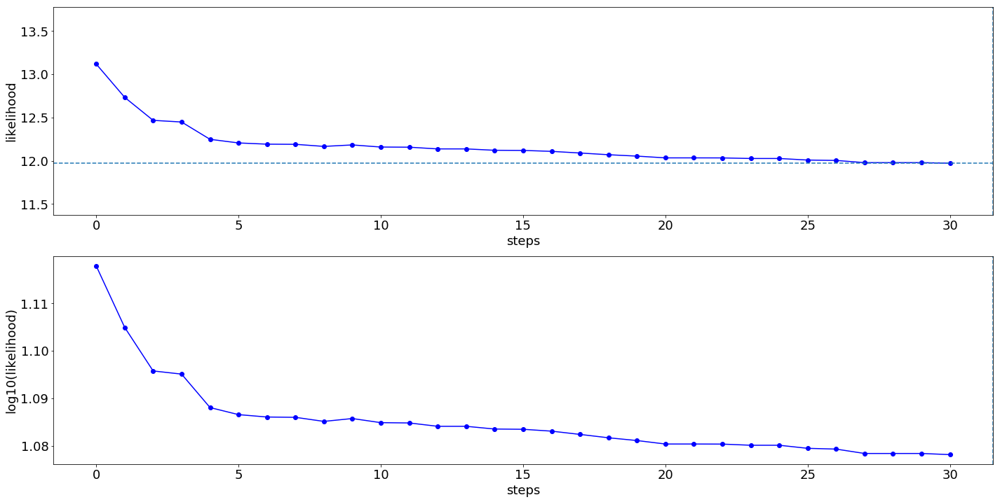

In [22]:
single_analysis.create_fitting_evolution_plot()

In [42]:
list_of_which_particle_is_gbest=[]
# that wont work anymore
for i in range(len(gbests_positions)):
    list_of_which_particle_is_gbest.append([i,np.where(chain0_swarm_1[i][:,39]==gbests_positions[i][39])[0][0]])
    
list_of_which_particle_is_gbest
array_of_which_particle_is_gbest=np.array(list_of_which_particle_is_gbest)

(0, 480)

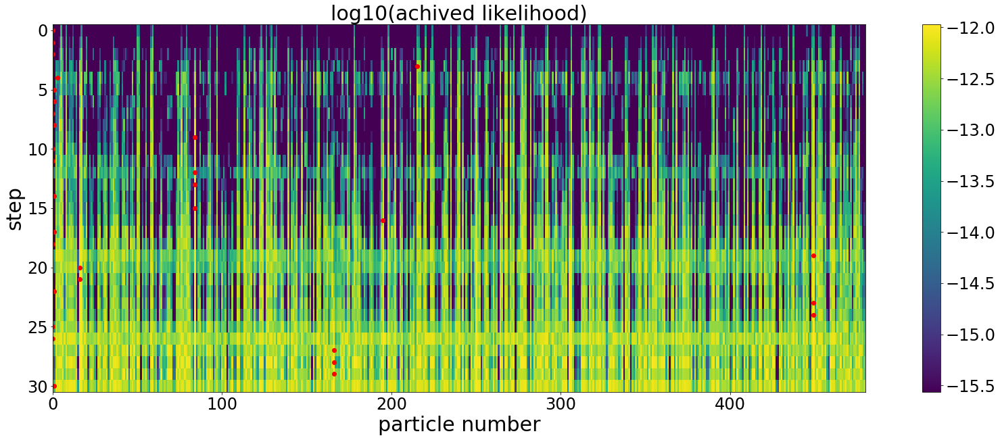

In [43]:
plt.figure(figsize=(30,10))
plt.imshow(likechain0_swarm_1,aspect=int(0.5*likechain0_swarm_1.shape[1]/likechain0_swarm_1.shape[0]),\
           vmax=np.max(likechain0_swarm_1[-1][0:]),vmin=1.3*np.max(likechain0_swarm_1[-1][0:]))
plt.colorbar()
plt.scatter(array_of_which_particle_is_gbest[:,1],array_of_which_particle_is_gbest[:,0],color='red')

plt.xlabel('particle number',size=30)
plt.ylabel('step',size=30)
plt.title('log10(achived likelihood)',size=30)
plt.xlim(0,likechain0_swarm_1.shape[1])

### image analysis 

In [25]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                   wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
            pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
            extraZernike=None,pupilExplicit=None,simulation_00=None,
            double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
            list_of_defocuses=list_of_defocuses_input_long,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                  use_center_of_flux=True)   


#minchain_parametrization_test=gbest[1]
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

#minchain_parametrization_test=np.copy(allparameters_parametrization_proposal_initial+array_of_delta_all_parametrizations)

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)




#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


#res_multi_10=np.copy(res_multi)
#res_multi_21=np.copy(res_multi)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

"""
index_of_single_image=1
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],\
                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,
                      simulation_00=True)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)
"""

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 17.72492
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.45925
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelength795.0522
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters used: [    29.66158501     -0.4784439      -0.87673418      0.64446062
     -0.3468286      -0.13820115     -0.34465753      0.27998091
     -0.04397181     -0.00946012      0.02159901     -0.00216815
     -0.03988355      0.11855593     -0.00381618     -0.01227748
     -0.03843697      0.08455997      0.22140684      0.67648546
      0.07017027     -0.03538806      0.01325448      0.058876
      0.00

f_multiplier_factor for size of detector triangle is: 1.0037716385487585
Time for cutting out the square is 0.010210752487182617
Finished with getPupil
Finished with _get_Pupil
Requested pupil size is (pupil.size) [m]: 0.1395327
One pixel has size of (pupil.scale) [m]: 9.08416015625e-05
Requested pupil has so many pixels (pupil_plane_im): (1536, 1536)
Time for _get_Pupil function is 0.4607670307159424
lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.05859255790710449
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.1922450065612793
Time for pupil and illumination calculation is 0.6544163227081299

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0002675056457519531
Time for FFT 

chi2 within shgo with use_only_chi True and use_center_of_light False [10.74340301  5.9027444 ] / 10.110397167614764
chi2 within shgo with use_only_chi True and use_center_of_light False [10.77622361  5.87463537] / 10.111207758154102
chi2 within shgo with use_only_chi True and use_center_of_light False [10.71675996  5.8947895 ] / 10.110404749501809
chi2 within shgo with use_only_chi True and use_center_of_light False [10.75640239  5.88135341] / 10.110550184473846
chi2 within shgo with use_only_chi True and use_center_of_light False [10.72667057  5.89143048] / 10.11024341523177
chi2 within shgo with use_only_chi True and use_center_of_light False [10.7130269   5.86208458] / 10.110626661753335
chi2 within shgo with use_only_chi True and use_center_of_light False [10.73580898  5.89257945] / 10.11021279735561
chi2 within shgo with use_only_chi True and use_center_of_light False [10.73272021  5.91061142] / 10.110477004426945
chi2 within shgo with use_only_chi True and use_center_of_light Fa

Time for postprocessing pupil after _get_Pupil 0.19744515419006348
Time for pupil and illumination calculation is 0.2006385326385498

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.00021338462829589844
Time for FFT is 0.28790903091430664
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.32747242266324
size_of_central_cut: 989
optPsf_cut.shape(990, 990)
oversampling:11
size_of_optPsf_cut_downsampled: 308
optPsf_cut_downsampled.shape: (309, 309)
size_of_optPsf_cut_in_Microns: 421.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[104249.48103672163, 2.156592146109377, 0.0013264349387074757, 0.3688416301600349, 1.8004893466077547]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(309, 309)
simulation_00 parameter: None
are we invoking double

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.00024771690368652344
Time for FFT is 0.28676867485046387
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.32747242266324
size_of_central_cut: 2967
optPsf_cut.shape(2968, 2968)
oversampling:11
size_of_optPsf_cut_downsampled: 924
optPsf_cut_downsampled.shape: (925, 925)
size_of_optPsf_cut_in_Microns: 1261.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[104249.48103672163, 2.156592146109377, 0.0013264349387074757, 0.3688416301600349, 1.8004893466077547]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(925, 925)
simulation_00 parameter: None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0.0 0.0]
self.save paramter is: 1
socket.gethostname(): tiger2-sumire.princeton.edu
Time for 

chi2 within shgo with use_only_chi True and use_center_of_light False [15.36782326 -4.67807043] / 16.79170082940277
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36415351 -4.67750956] / 16.791709141768095
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36631664 -4.68062516] / 16.79169677395494
chi2 within shgo with use_only_chi True and use_center_of_light False [15.3686756  -4.68024303] / 16.79169624421637
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36913404 -4.67901344] / 16.791695872193486
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36723352 -4.67816597] / 16.791700704812268
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36831508 -4.67972377] / 16.791695709878773
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36595611 -4.68010589] / 16.791696244253412
chi2 within shgo with use_only_chi True and use_center_of_light Fal

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 1.005241362278039
Finished with lnlike_Neven
chi_almost/d.o.f is 18.801644528779157; chi_almost_max_dof is 221.9300086739201; log(improvment) is -1.0720201926451889
The `likelihood` reported is: -18.801644528779157
Time for lnlike_Neven function in thread 46920533291904 is: 4.579277515411377 seconds
 
################################
Likelihoods returned per individual images are: [-14.99533132  -2.15540793 -18.80164453]
Mean likelihood is -11.984127924363174
################################
Renormalized likelihoods returned per individual images are: [-14.99533132  -2.15540793 -18.80164453]
Renormalization factors are: [1. 1. 1.]
Mean renormalized likelihood is -11.984127924363174
array_of_psf_positions_output: [[10.73860015  5.89261723]
 [ 2.46046394  6.17203327]
 [15.37014146 -4.67915415]]
Ending LN_PFS_multi_same_s

'\nindex_of_single_image=1\nmodel = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],                        mask_image=list_of_mask_images[index_of_single_image],wavelength=wavelength,dithering=1,save=1,zmax=56,verbosity=1,                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,use_center_of_flux=True,\n                      simulation_00=True)  \n\nres_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True,use_only_chi=True)\n'

In [26]:
list_of_defocuses_input_short_with_focus

['m4', '0', 'p4']

In [27]:
list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
list_of_defocuses_input_short_with_focus
#res_multi=model_multi(list_of_minchain,return_Images=True)
res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)

#res_multi_10=np.copy(res_multi)
#res_multi_21=np.copy(res_multi)

mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

################################
analyzing image 1 out of 3
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 17.72492
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.45925
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelength795.0522
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters used: [    29.66158501     -0.4784439      -0.87673418      0.64446062
     -0.3468286      -0.13820115     -0.34465753      0.27998091
     -0.04397181     -0.00946012      0.02159901     -0.00216815
     -0.03988355      0.11855593     -0.00381618     -0.01227748
     -0.03843697      0.08455997      0.22140684      0.67648546
      0.07017027     -0.03538806      0.01325448      0.058876
      0.00

Time to execute illumination considerations due to misalignment 0.0361330509185791
f_multiplier_factor for size of detector triangle is: 1.0037716385487585
Time for cutting out the square is 0.007910966873168945
Finished with getPupil
Finished with _get_Pupil
Requested pupil size is (pupil.size) [m]: 0.1395327
One pixel has size of (pupil.scale) [m]: 9.08416015625e-05
Requested pupil has so many pixels (pupil_plane_im): (1536, 1536)
Time for _get_Pupil function is 0.4406747817993164
lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.05917048454284668
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.19421601295471191
Time for pupil and illumination calculation is 0.6357848644256592

Starting creation of wavefront
creating wf_full_fake_0
Tim

chi2 within shgo with use_only_chi True and use_center_of_light False [10.77622361  5.87463537] / 10.111207758154102
chi2 within shgo with use_only_chi True and use_center_of_light False [10.71675996  5.8947895 ] / 10.110404749501809
chi2 within shgo with use_only_chi True and use_center_of_light False [10.75640239  5.88135341] / 10.110550184473846
chi2 within shgo with use_only_chi True and use_center_of_light False [10.72667057  5.89143048] / 10.11024341523177
chi2 within shgo with use_only_chi True and use_center_of_light False [10.7130269   5.86208458] / 10.110626661753335
chi2 within shgo with use_only_chi True and use_center_of_light False [10.73580898  5.89257945] / 10.11021279735561
chi2 within shgo with use_only_chi True and use_center_of_light False [10.73272021  5.91061142] / 10.110477004426945
chi2 within shgo with use_only_chi True and use_center_of_light False [10.73049956  5.88270173] / 10.110249490293091
chi2 within shgo with use_only_chi True and use_center_of_light Fa

Time to apodize the pupil: 0.05496501922607422
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.19794011116027832
Time for pupil and illumination calculation is 0.20566964149475098

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004010200500488281
Time for FFT is 0.2881429195404053
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.32747242266324
size_of_central_cut: 989
optPsf_cut.shape(990, 990)
oversampling:11
size_of_optPsf_cut_downsampled: 308
optPsf_cut_downsampled.shape: (309, 309)
size_of_optPsf_cut_in_Microns: 421.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[104249.48103672163, 2.156592146109377, 0.0013264349387074757, 0.3688416301600349, 1.8004893466077547]
type(pointsx): <class 'numpy.float32'>
o

Time for postprocessing pupil after _get_Pupil 0.189117431640625
Time for pupil and illumination calculation is 0.19152021408081055

Starting creation of wavefront
creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0002079010009765625
Time for FFT is 0.28722286224365234
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.32747242266324
size_of_central_cut: 2967
optPsf_cut.shape(2968, 2968)
oversampling:11
size_of_optPsf_cut_downsampled: 924
optPsf_cut_downsampled.shape: (925, 925)
size_of_optPsf_cut_in_Microns: 1261.3636363636363
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[104249.48103672163, 2.156592146109377, 0.0013264349387074757, 0.3688416301600349, 1.8004893466077547]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(925, 925)
simulation_00 parameter: None
are we invoking doub

chi2 within shgo with use_only_chi True and use_center_of_light False [15.36782326 -4.67807043] / 16.79170082940277
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36415351 -4.67750956] / 16.791709141768095
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36631664 -4.68062516] / 16.79169677395494
chi2 within shgo with use_only_chi True and use_center_of_light False [15.3686756  -4.68024303] / 16.79169624421637
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36913404 -4.67901344] / 16.791695872193486
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36723352 -4.67816597] / 16.791700704812268
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36831508 -4.67972377] / 16.791695709878773
chi2 within shgo with use_only_chi True and use_center_of_light False [15.36595611 -4.68010589] / 16.791696244253412
chi2 within shgo with use_only_chi True and use_center_of_light Fal

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 1.005241362278039
Finished with lnlike_Neven
chi_almost/d.o.f is 18.801644528779157; chi_almost_max_dof is 221.9300086739201; log(improvment) is -1.0720201926451889
The `likelihood` reported is: -18.801644528779157
Time for lnlike_Neven function in thread 46920533291904 is: 4.515758514404297 seconds
 
################################
Likelihoods returned per individual images are: [-14.99533132  -2.15540793 -18.80164453]
Mean likelihood is -11.984127924363174
################################
Renormalized likelihoods returned per individual images are: [-14.99533132  -2.15540793 -18.80164453]
Renormalization factors are: [1. 1. 1.]
Mean renormalized likelihood is -11.984127924363174
array_of_psf_positions_output: [[10.73860015  5.89261723]
 [ 2.46046394  6.17203327]
 [15.37014146 -4.67915415]]
Ending LN_PFS_multi_same_s

In [28]:
popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
custom_var = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)

In [29]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    
    popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
    single_var_image_via_model = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)
   
    list_of_var_images_via_model.append(single_var_image_via_model)

In [30]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(len(list_of_sci_images)):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-422.33450317 -294.1590271  -343.91894531]


'model pixels with a flux larger than (quantile_08_focus): 23.503592300415058'

mean reported value:-11.984127924363174
array_of_single_res: [-14.99533132  -2.15540793 -18.80164453]
renormalization factors: [1. 1. 1.]
array_of_single_res renormalized: [-14.99533132  -2.15540793 -18.80164453]


([<matplotlib.axis.XTick at 0x2aad2209d668>,
 <a list of 3 Text xticklabel objects>)

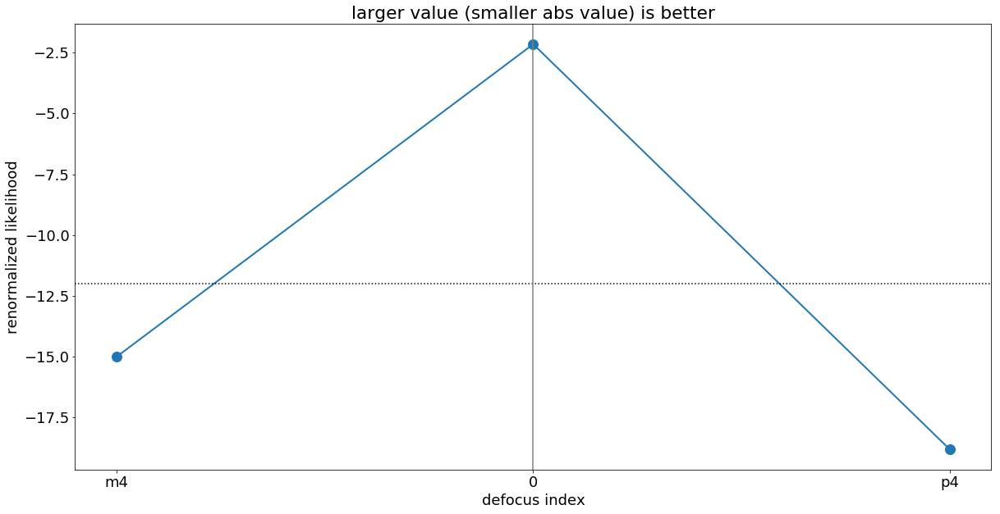

In [31]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.ones(len(list_of_sci_images))


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.title('larger value (smaller abs value) is better')

plt.axvline(np.where(np.array(list_of_defocuses_input_short_with_focus)=='0')[0][0],color='gray')
plt.xticks(np.arange(len(list_of_defocuses_input_short_with_focus)),list_of_defocuses_input_short_with_focus)

In [32]:
minchain=list_of_minchain[0]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
          z4        z5        z6        z7        z8        z9       z10  \
0  29.661585 -0.478444 -0.876734  0.644461 -0.346829 -0.138201 -0.344658   

        z11  
0  0.279981  
##############################################
        z12      z13       z14       z15       z16       z17       z18  \
0 -0.043972 -0.00946  0.021599 -0.002168 -0.039884  0.118556 -0.003816   

        z19       z20      z21       z22  
0 -0.012277 -0.038437  0.08456  0.221407  

##############################################
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.676485    0.07017 -0.035388  0.013254  0.058876     0.009759
##############################################
     wide_0   wide_23   wide_43  misalign
0  0.012578  0.282136  0.162488  0.939303
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.021667 -0.036248                         0.9019   0.022315   

   frd_lorentz_factor  

(-1.5, -0.5)

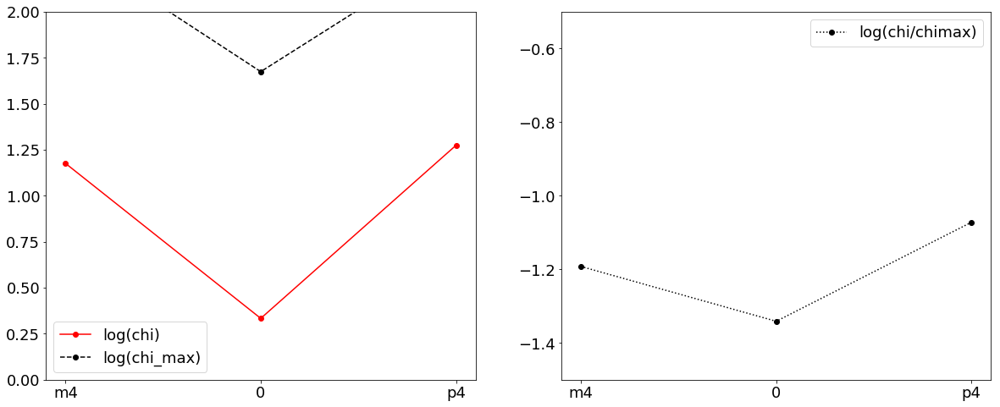

In [33]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi_max)',marker='o',ls='--')
plt.ylim(0,2)
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi/chimax)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_short_with_focus),1),list_of_defocuses_input_short_with_focus)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.5,-0.5)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 17.72492
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.45925
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 88.00506591796875
---------------------
chi**2 max reduced is: 39933.09211411545
chi**2 reduced is: 225.8821077461289 for log improvement: -2.247451108386216
chi max reduced is: 138.35278626975094
chi reduced is: 10.11020586098773 for log improvement: -1.1362279111128397
---------------------
chi**2 reduced within custom mask area is: 225.88210769322512
---------------------
chi**2 max reduced within flux mask area is: 72047.38760927231
chi**2 red

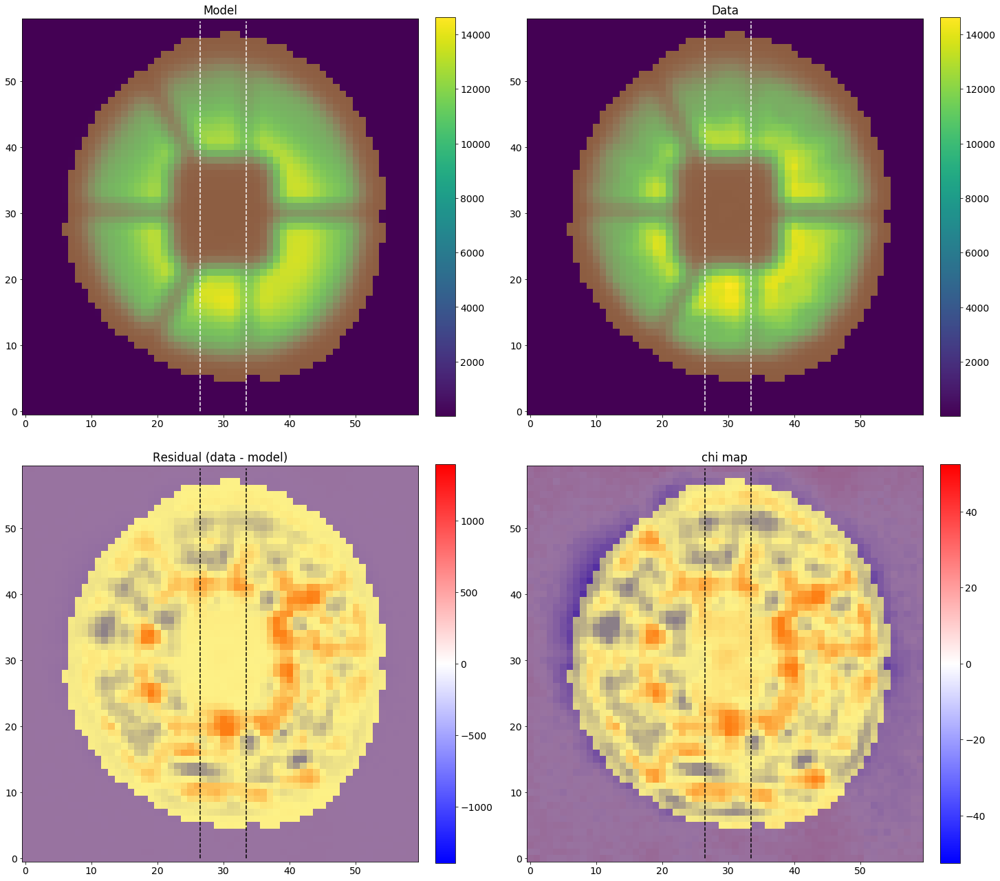

In [34]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

popt_for_custom_var = create_popt_for_custom_var(sci_image=list_of_sci_images[index_of_single_image],
                            var_image=list_of_var_images[index_of_single_image],
                            mask_image=list_of_mask_images[index_of_single_image])
custom_var = create_custom_var_from_popt(model_image=list_of_single_model_image[index_of_single_image], popt = popt_for_custom_var)

# custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
#                                   var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                             custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,\
                                             show_impact_pixels_mask=False,multi_background_factor=3)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 17.72492
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.45925
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 88.00506591796875
fraction of chi2 due to 1% of pixels: 0.0903508001560112
---------------------
chi**2 max reduced is: 39933.09211411545
chi**2 reduced is: 225.8821077461289 for log improvement: -2.247451108386216
chi max reduced is: 138.35278626975094
chi reduced is: 10.11020586098773 for log improvement: -1.1362279111128397
---------------------
chi**2 reduced within custom mask area is: 225.88210769322512
---------------------
chi**2 max reduc

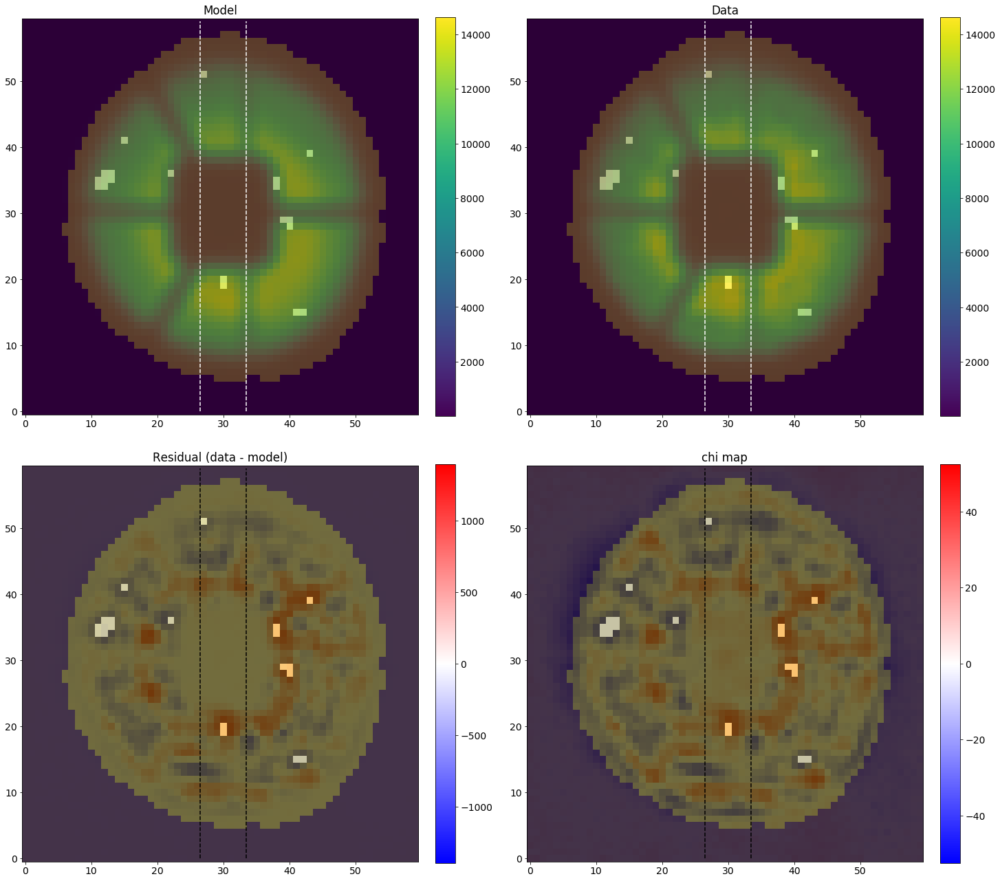

In [35]:
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 17.72492
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.45925
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 88.00506591796875
---------------------
chi**2 max reduced is: 39933.09211411545
chi**2 reduced is: 225.8821077461289 for log improvement: -2.247451108386216
chi max reduced is: 138.35278626975094
chi reduced is: 10.11020586098773 for log improvement: -1.1362279111128397
---------------------
chi**2 reduced within custom mask area is: 225.88210769322512
---------------------
chi**2 max reduced within flux mask area is: 72047.38760927231
chi**2 red

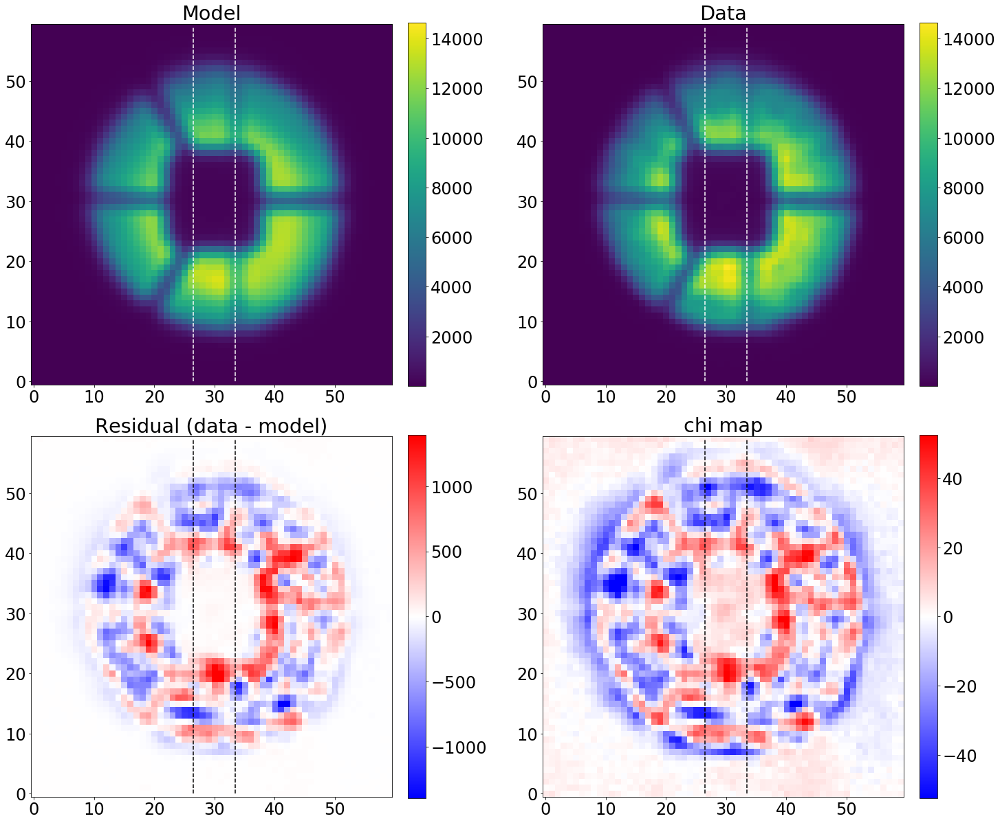

In [36]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 39933.09211411545
chi**2 reduced is: 225.8821077461289
Abs of residual divided by total flux is: 0.0552745670542285
Abs of residual divided by largest value of a flux in the image is: 0.13453584216613748


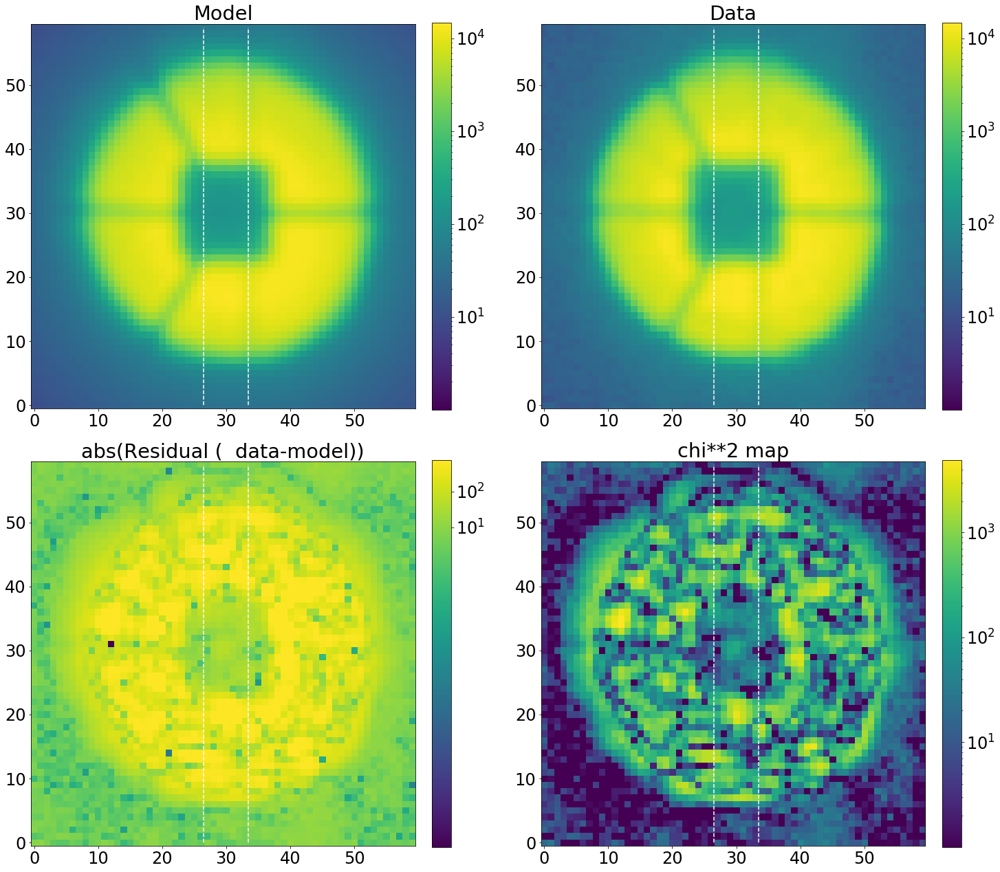

In [37]:
index_of_single_image=0
matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: -0.1664022
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 1.4562562
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

Supplied extra Zernike parameters (beyond zmax): None
self.wavelengthNone
self.pixelScale20.76
np.__version__1.16.2
scipy.__version__1.5.2
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 6.828460693359375
---------------------
chi**2 max reduced is: 4646.670467597864
chi**2 reduced is: 4.4887711503252445 for log improvement: -3.01501440983054
chi max reduced is: 23.76918489323659
chi reduced is: 1.5933010971139503 for log improvement: -1.1737164337186092
---------------------
chi**2 reduced within custom mask area is: 4.488771155760222
---------------------
chi**2 max reduced within flux mask area is: 9927.770271763584
chi**2 

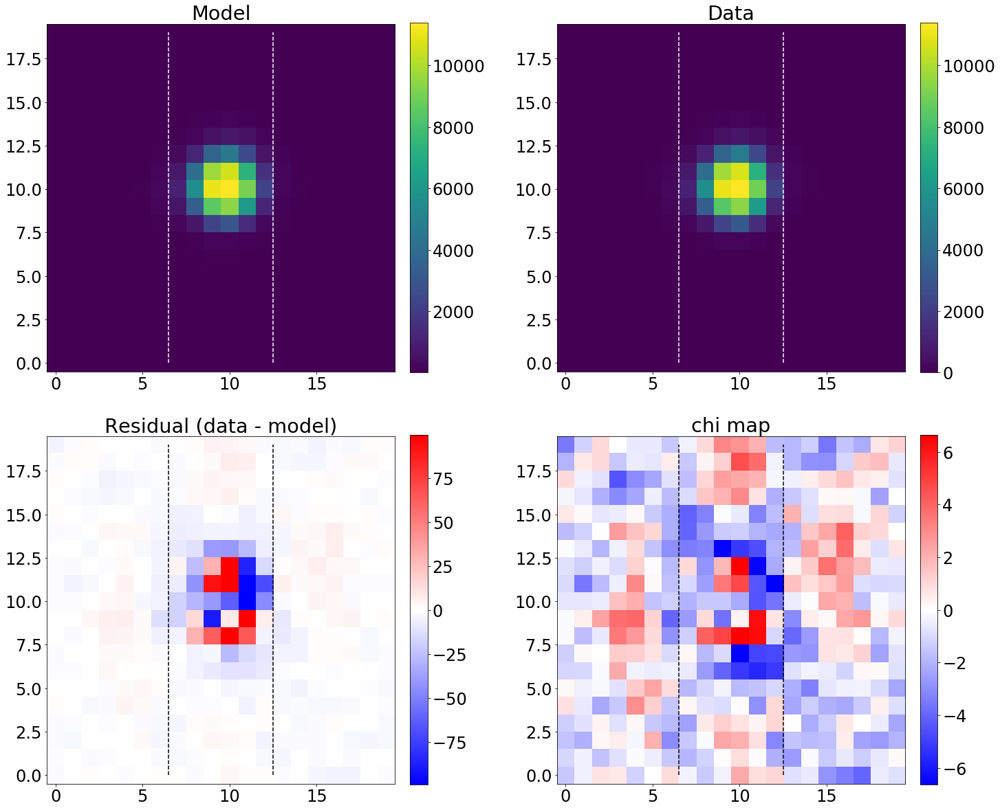

In [38]:
index_of_single_image=1
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(model_image=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 24})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 4646.670467597864
chi**2 reduced is: 4.4887711503252445
Abs of residual divided by total flux is: 0.019221029389086926
Abs of residual divided by largest value of a flux in the image is: 0.011567182961838006


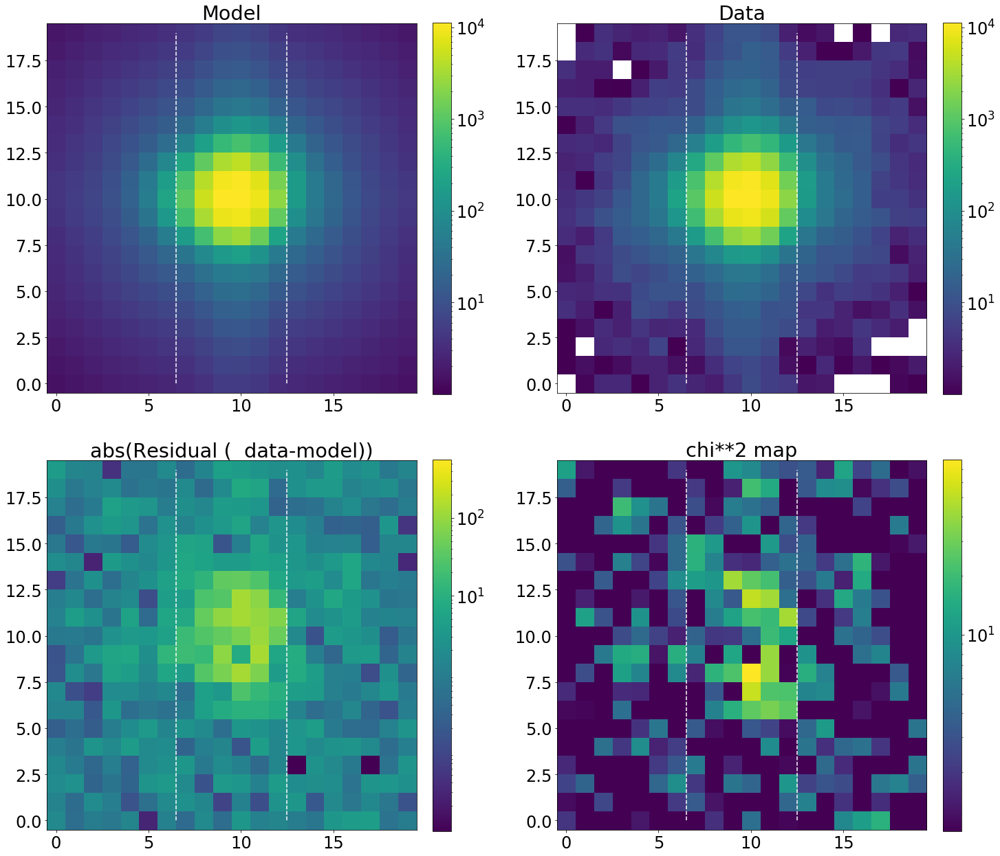

In [39]:
index_of_single_image=1
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

4.4887711503252445
chi**2 reduced is: 4.4887711503252445
Abs of residual divided by total flux is: 0.019221029389086926
Abs of residual divided by largest value of a flux in the image is: 0.011567182961838006


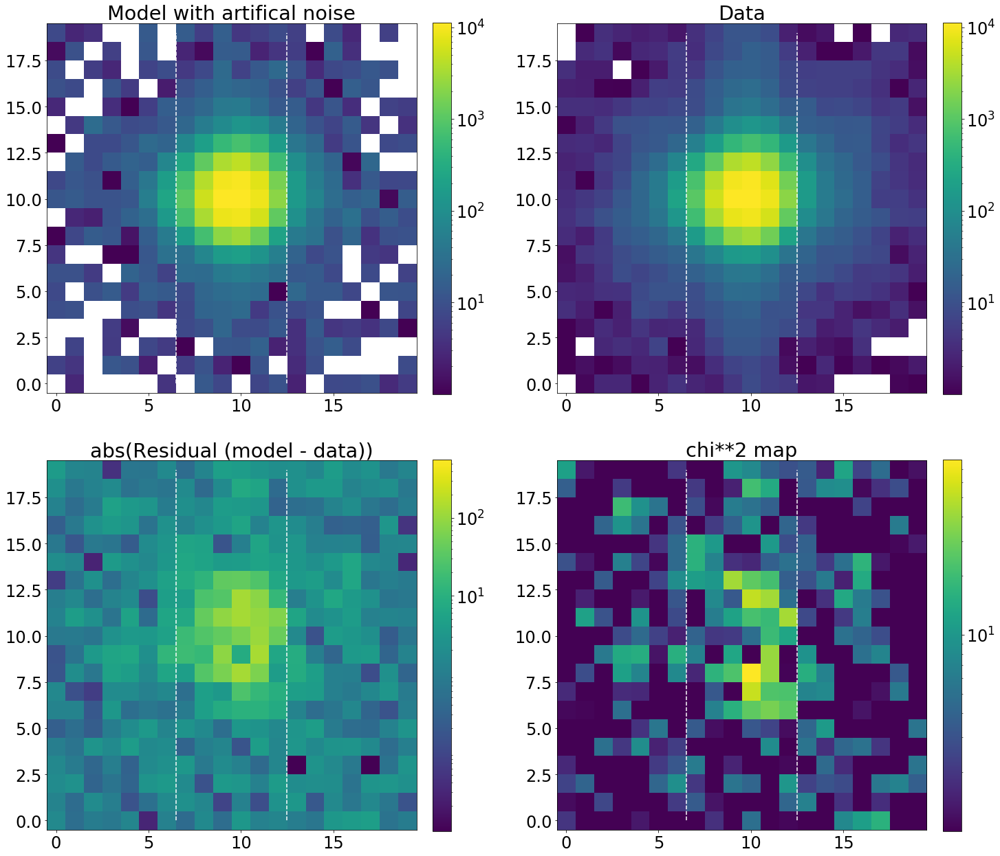

In [40]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

ValueError: too many values to unpack (expected 2)

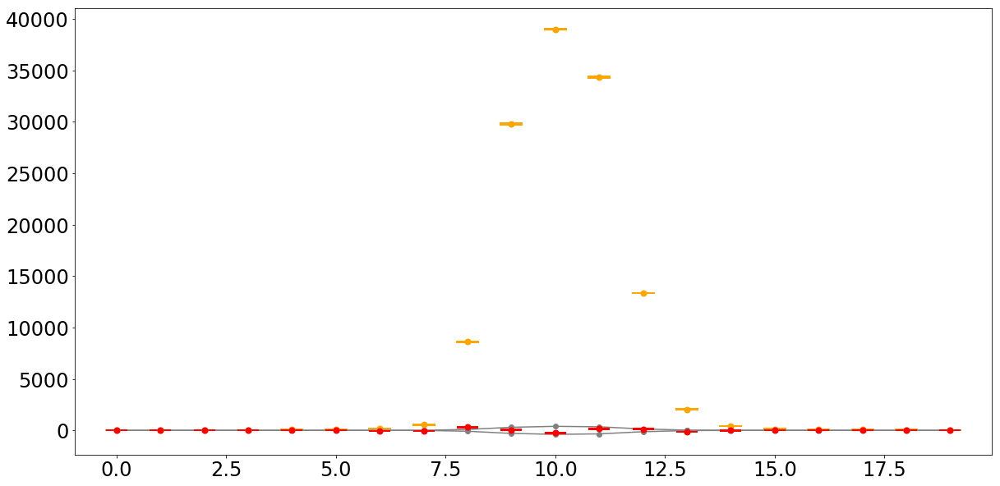

In [41]:
index_of_single_image=1
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],\
                 var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## results everywhere 


### results everywhere - 10 fibers

In [41]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar_10[:,1])

unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne_10[:,1])

if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr_10[:,1])
else:
    unique_numbers_Kr=np.array([])

arranged_by_spot_number_Ar_10

array([['34437', '1', 'Ar'],
       ['34437', '101', 'Ar'],
       ['34437', '102', 'Ar'],
       ['34437', '103', 'Ar'],
       ['34437', '104', 'Ar'],
       ['34437', '105', 'Ar'],
       ['34437', '107', 'Ar'],
       ['34437', '109', 'Ar'],
       ['34437', '11', 'Ar'],
       ['34437', '111', 'Ar'],
       ['34437', '113', 'Ar'],
       ['34437', '114', 'Ar'],
       ['34437', '115', 'Ar'],
       ['34437', '116', 'Ar'],
       ['34437', '117', 'Ar'],
       ['34437', '119', 'Ar'],
       ['34437', '13', 'Ar'],
       ['34437', '15', 'Ar'],
       ['34437', '17', 'Ar'],
       ['34437', '18', 'Ar'],
       ['34437', '19', 'Ar'],
       ['34437', '20', 'Ar'],
       ['34437', '21', 'Ar'],
       ['34437', '23', 'Ar'],
       ['34437', '25', 'Ar'],
       ['34437', '27', 'Ar'],
       ['34437', '29', 'Ar'],
       ['34437', '3', 'Ar'],
       ['34437', '30', 'Ar'],
       ['34437', '31', 'Ar'],
       ['34437', '32', 'Ar'],
       ['34437', '33', 'Ar'],
       ['34437', '35', 'Ar']

In [42]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=6,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443718ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443718ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.951220789674255
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371018ArS

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371178ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371178ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 22.32330558589455
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 119
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371198ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371198ArSwarm1.npy
(31, 480, 129)
minimal like

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437308ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437308ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.437407191050515
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 31
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437318ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437318ArSwarm1.npy
(31, 480, 129)
minimal likel

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443758ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443758ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.88937924912613
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437518ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437518ArSwarm1.npy
(31, 480, 129)
minimal likelih

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437688ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437688ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.740648767591845
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 69
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437698ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437698ArSwarm1.npy
(31, 480, 129)
minimal likelihoo

analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437878ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437878ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 2.719565845515374
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 89
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437898ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437898ArSwarm1.npy
(31, 480, 129)
minimal likel

In [43]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=6,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313118NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313118NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 10.468860410485474
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 14
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313148NeSwa

analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313478NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313478NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 9.394379191370662
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 5
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3431358NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3431358NeSwarm1.npy
(56, 480, 129)
minimal likelihood i

analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313838NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313838NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 11.746100054272402
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 86
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34217, 34265, 34313]
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313868NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34313868NeSwarm1.npy
(56, 480, 129)
minimal likeliho

In [44]:
results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=6,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34561
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34657118KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34657118KrSwarm1.npy
(56, 480, 129)
minimal likelihood is: 8.585222173035383
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: m4
self.single_number: 15
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34561, 34609, 34657]
analyzing label: 34561
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34657158KrSwar

In [45]:
# just the ones without neigbhours done with 0.48, only subset of the data

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Dec1021/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Dec1021_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Dec1021_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Dec1021_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

### results everywhere - 21 fibers


In [46]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar_21[:,1])

unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne_21[:,1])

if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr_21[:,1])
else:
    unique_numbers_Kr=np.array([])


In [47]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=8,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 121
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771218ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771218ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 8.814172740203558
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 123
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_S

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771418ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771418ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 28.590664707215442
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 143
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771438ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771438ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771638ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771638ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.366193640229648
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 164
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771648ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771648ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771858ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771858ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 16.889905099986596
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 186
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771868ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516771868ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772058ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772058ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.984252581575114
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 207
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772078ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772078ArSwarm1.npy
(31, 480, 129)

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772258ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772258ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 25.23578103216992
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 227
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772278ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772278ArSwarm1.npy
(31, 480, 129)

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772478ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772478ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 11.356182010400525
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 248
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772488ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772488ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772698ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772698ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 16.79940180671273
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 270
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772708ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772708ArSwarm1.npy
(31, 480, 129)

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772898ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772898ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.886975821117603
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 291
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772918ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516772918ArSwarm1.npy
(31, 480, 129)

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773098ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773098ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 20.985408963603728
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 311
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773118ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773118ArSwarm1.npy
(31, 480, 129

analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773558ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773558ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 13.233541710621045
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 356
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [51485, 51581, 51677]
analyzing label: 51485
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773568ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_516773568ArSwarm1.npy
(31, 480, 129

In [48]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=8,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471018NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471018NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 17.72893311605357
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 104
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_S

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471318NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471318NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 14.023935702969416
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 132
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471328NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471328NeSwarm1.npy
(56, 480, 129

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471608NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471608NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 14.403287730917507
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 164
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471648NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471648NeSwarm1.npy
(56, 480, 129

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471948NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471948NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 13.339075560866993
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 195
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471958NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598471958NeSwarm1.npy
(56, 480, 129

analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472278NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472278NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 11.738586660266028
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 230
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472308NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472308NeSwarm1.npy
(56, 480, 129

create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472768NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472768NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 13.546919504507423
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 277
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [59655, 59751, 59847]
analyzing label: 59655
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472778NeSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_598472778NeSwarm1.npy
(56, 480, 129)
minimal likelihood is: 16.23348902752886
STAMPS_FOLDER: /tigress/ncaplar/ReducedD

In [49]:
results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=8,verbosity=None)  

    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=8,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_short_with_focus)
    #single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
    #                             list_of_defocuses=list_of_defocuses_input_long)

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()
    
    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 103
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [52085, 52181, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_522771038KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_522771038KrSwarm1.npy
(56, 480, 129)
minimal likelihood is: 14.12515361050261
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 115
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [52085, 52181, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Singl

analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_52277838KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_52277838KrSwarm1.npy
(56, 480, 129)
minimal likelihood is: 13.477111456605252
STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/
labelInput: m4
self.single_number: 87
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [52085, 52181, 52277]
analyzing label: 52085
double_sources_positions_ratios for this spot is: [0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_52277878KrSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_52277878KrSwarm1.npy
(56, 480, 129)
minimal

In [50]:
# just the ones without neigbhours done with 0.48, only subset of the data

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/Dec1021/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Dec1021_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Dec1021_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Dec1021_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

## adding proper chi2 values 

### Argon 

In [51]:
date='Dec1021'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ar_index=np.unique(arranged_by_spot_number_Ar_10[:,1])


for single_number in tqdm(Ar_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy'):


        wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ar_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

  0%|                                                                                                                                                                                                                | 0/80 [00:00<?, ?it/s]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 1
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443718ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443718ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.951220789674255


  1%|██▌                                                                                                                                                                                                     | 1/80 [00:06<08:59,  6.83s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 101
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371018ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371018ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 13.458082544603363


  2%|█████                                                                                                                                                                                                   | 2/80 [00:14<09:20,  7.18s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 102
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371028ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371028ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.4264047210460795


  4%|███████▌                                                                                                                                                                                                | 3/80 [00:21<09:00,  7.01s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 103
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371038ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371038ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 8.283044365875462


  5%|██████████                                                                                                                                                                                              | 4/80 [00:27<08:44,  6.90s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 104
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371048ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371048ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.758221015318147


  6%|████████████▌                                                                                                                                                                                           | 5/80 [00:35<08:50,  7.07s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 105
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371058ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371058ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 19.5486083676959


  8%|███████████████                                                                                                                                                                                         | 6/80 [00:42<08:51,  7.19s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 107
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371078ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371078ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.508336119514922


  9%|█████████████████▌                                                                                                                                                                                      | 7/80 [00:49<08:48,  7.25s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 109
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371098ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371098ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.33628589925301


 10%|████████████████████                                                                                                                                                                                    | 8/80 [00:56<08:30,  7.10s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437118ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437118ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.898616026324007


 11%|██████████████████████▌                                                                                                                                                                                 | 9/80 [01:03<08:21,  7.06s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 111
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371118ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371118ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 3.3602041900102813


 12%|████████████████████████▉                                                                                                                                                                              | 10/80 [01:10<08:00,  6.87s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 113
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371138ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371138ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 13.695567457731629


 14%|███████████████████████████▎                                                                                                                                                                           | 11/80 [01:16<07:52,  6.85s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 114
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371148ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371148ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.846425464953195


 15%|█████████████████████████████▊                                                                                                                                                                         | 12/80 [01:24<07:59,  7.06s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 115
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371158ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371158ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 9.079889392113722


 16%|████████████████████████████████▎                                                                                                                                                                      | 13/80 [01:31<07:51,  7.03s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 116
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371168ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371168ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.474723176681397


 18%|██████████████████████████████████▊                                                                                                                                                                    | 14/80 [01:38<07:52,  7.17s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 117
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371178ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371178ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 22.32330558589455


 19%|█████████████████████████████████████▎                                                                                                                                                                 | 15/80 [01:46<07:51,  7.25s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 119
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371198ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_344371198ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.873514868985414


 20%|███████████████████████████████████████▊                                                                                                                                                               | 16/80 [01:53<07:34,  7.10s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 13
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437138ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437138ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.6715124758354944


 21%|██████████████████████████████████████████▎                                                                                                                                                            | 17/80 [01:59<07:18,  6.96s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 15
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437158ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437158ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 2.7567497394912155


 22%|████████████████████████████████████████████▊                                                                                                                                                          | 18/80 [02:06<06:59,  6.76s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 17
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437178ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437178ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 10.32537565773408


 24%|███████████████████████████████████████████████▎                                                                                                                                                       | 19/80 [02:14<07:19,  7.21s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 18
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437188ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437188ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.423973366163547


 25%|█████████████████████████████████████████████████▊                                                                                                                                                     | 20/80 [02:21<07:11,  7.20s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 19
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437198ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437198ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.377849233394458


 26%|████████████████████████████████████████████████████▏                                                                                                                                                  | 21/80 [02:28<06:55,  7.05s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 20
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437208ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437208ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.124987900480424


 28%|██████████████████████████████████████████████████████▋                                                                                                                                                | 22/80 [02:35<06:46,  7.00s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 21
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437218ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437218ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 17.734679341495102


 29%|█████████████████████████████████████████████████████████▏                                                                                                                                             | 23/80 [02:42<06:38,  6.99s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 23
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437238ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437238ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.886512676292388


 30%|███████████████████████████████████████████████████████████▋                                                                                                                                           | 24/80 [02:49<06:33,  7.03s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 25
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437258ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437258ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.01360067404559


 31%|██████████████████████████████████████████████████████████████▏                                                                                                                                        | 25/80 [02:56<06:25,  7.02s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 27
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437278ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437278ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 2.480605516656849


 32%|████████████████████████████████████████████████████████████████▋                                                                                                                                      | 26/80 [03:04<06:32,  7.27s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 29
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437298ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437298ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 9.197148608893983


 34%|███████████████████████████████████████████████████████████████████▏                                                                                                                                   | 27/80 [03:12<06:40,  7.56s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 3
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443738ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443738ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 3.374875858954853


 35%|█████████████████████████████████████████████████████████████████████▋                                                                                                                                 | 28/80 [03:19<06:22,  7.35s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 30
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437308ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437308ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.437407191050515


 36%|████████████████████████████████████████████████████████████████████████▏                                                                                                                              | 29/80 [03:26<06:21,  7.47s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 31
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437318ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437318ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.79370530660525


 38%|██████████████████████████████████████████████████████████████████████████▋                                                                                                                            | 30/80 [03:34<06:08,  7.37s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 32
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437328ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437328ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.546641031000662


 39%|█████████████████████████████████████████████████████████████████████████████                                                                                                                          | 31/80 [03:41<05:58,  7.32s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 33
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437338ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437338ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 14.33961167838654


 40%|███████████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 32/80 [03:47<05:42,  7.13s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 35
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437358ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437358ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.506619637797485


 41%|██████████████████████████████████████████████████████████████████████████████████                                                                                                                     | 33/80 [03:55<05:38,  7.20s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 37
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437378ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437378ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.886557050856187


 42%|████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                  | 34/80 [04:01<05:21,  6.98s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 39
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437398ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437398ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 3.0497254601229558


 44%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                | 35/80 [04:09<05:23,  7.20s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 41
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437418ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437418ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 11.701607563234736


 45%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 36/80 [04:16<05:10,  7.07s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 42
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437428ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437428ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.7252109150638235


 46%|████████████████████████████████████████████████████████████████████████████████████████████                                                                                                           | 37/80 [04:23<05:12,  7.26s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 43
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437438ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437438ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 8.194028089135267


 48%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 38/80 [04:30<04:54,  7.02s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 44
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437448ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437448ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.073309724312935


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 39/80 [04:37<04:49,  7.06s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 45
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437458ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437458ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 21.867024840614103


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                   | 40/80 [04:44<04:35,  6.90s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 47
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437478ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437478ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.5007641303235815


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                 | 41/80 [04:50<04:28,  6.89s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 49
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437498ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437498ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.580891010110438


 52%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 42/80 [04:57<04:23,  6.93s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 5
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443758ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443758ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.88937924912613


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                            | 43/80 [05:05<04:18,  6.99s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 51
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437518ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437518ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 3.0594272534461715


 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 44/80 [05:11<04:08,  6.90s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 53
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437538ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437538ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.300402717864594


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 45/80 [05:18<04:00,  6.88s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 54
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437548ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437548ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.501907430333179


 57%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 46/80 [05:25<03:55,  6.93s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 55
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437558ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437558ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.121443685189122


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 47/80 [05:32<03:50,  6.99s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 56
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437568ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437568ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.740358161774675


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 48/80 [05:40<03:49,  7.17s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 57
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437578ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437578ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 18.60328564508838


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                             | 49/80 [05:47<03:38,  7.04s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 59
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437598ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437598ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.699816484511698


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 50/80 [05:53<03:27,  6.93s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 6
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443768ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443768ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.656980292152788


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                        | 51/80 [06:00<03:21,  6.95s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 61
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437618ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437618ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.033327708156336


 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                     | 52/80 [06:07<03:13,  6.91s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 63
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437638ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437638ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 2.5612492347134346


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 53/80 [06:15<03:17,  7.32s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 65
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437658ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437658ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 11.09663507370216


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 54/80 [06:22<03:04,  7.10s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 66
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437668ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437668ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.295273988446411


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 55/80 [06:29<02:55,  7.00s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 67
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437678ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437678ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.136961351783378


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 56/80 [06:36<02:48,  7.04s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 68
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437688ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437688ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.740648767591845


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 57/80 [06:43<02:40,  6.98s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 69
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437698ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437698ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.625574955169236


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 58/80 [06:50<02:32,  6.94s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 7
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443778ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443778ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 8.791350635601406


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 59/80 [06:56<02:25,  6.91s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 71
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437718ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437718ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.233597296722729


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 60/80 [07:04<02:19,  6.98s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 73
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437738ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437738ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.029367308260443


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                               | 61/80 [07:10<02:11,  6.94s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 75
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437758ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437758ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 3.066741477389614


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                            | 62/80 [07:18<02:06,  7.04s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 77
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437778ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437778ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 12.81344999212601


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 63/80 [07:25<02:03,  7.25s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 78
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437788ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437788ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.007875496257072


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 64/80 [07:32<01:53,  7.11s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 79
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437798ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437798ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 8.366166162184145


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 65/80 [07:39<01:46,  7.13s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 8
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443788ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443788ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.4967262979310645


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 66/80 [07:47<01:39,  7.13s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 80
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437808ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437808ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.18223072114493


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 67/80 [07:53<01:31,  7.07s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 81
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437818ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437818ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 19.200490718467915


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 68/80 [08:01<01:25,  7.12s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 83
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437838ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437838ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 7.020620540918006


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 69/80 [08:08<01:17,  7.07s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 85
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437858ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437858ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 4.306287767601266


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 70/80 [08:14<01:08,  6.87s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 87
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437878ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437878ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 2.719565845515374


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 71/80 [08:21<01:01,  6.87s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 89
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437898ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437898ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 10.69077977874023


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 72/80 [08:29<00:56,  7.10s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 9
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443798ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_3443798ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 19.57226100639882


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 73/80 [08:36<00:50,  7.22s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 90
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437908ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437908ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.966552979324305


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 74/80 [08:43<00:42,  7.15s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 91
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437918ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437918ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 6.543581007275653


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 75/80 [08:50<00:35,  7.13s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 92
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437928ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437928ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.5165989019338335


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 76/80 [08:57<00:28,  7.19s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 93
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437938ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437938ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 16.181681046389496


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 77/80 [09:05<00:22,  7.42s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 95
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437958ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437958ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.450733785346732


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 78/80 [09:13<00:14,  7.49s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 97
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437978ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437978ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 5.0436273324403595


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 79/80 [09:20<00:07,  7.29s/it]

STAMPS_FOLDER: /tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/
labelInput: p4
self.single_number: 99
list_of_defocuses: ['m4', '0', 'p4']
list_of_obs: [34341, 34389, 34437]
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437998ArSwarm1.npy
create_chains_swarm_1: Swarm1 and likechainSwarm1 found
Path searched was: /tigress/ncaplar/Results/chainDec1021_Single_P_34437998ArSwarm1.npy
(31, 480, 129)
minimal likelihood is: 3.0662202280673436


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 80/80 [09:27<00:00,  7.10s/it]


In [54]:
date='Dec1021'

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ar'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ar_index=np.unique(arranged_by_spot_number_Ar_21[:,1])


for single_number in tqdm(Ar_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy'):

        wavelength=float(finalAr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ar.npy')
        

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ar_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ar_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 152/152 [00:01<00:00, 79.28it/s]


### Neon 

In [55]:
date='Dec1021'


results_of_fit_many_direct_Ne_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ne'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ne_index=np.unique(arranged_by_spot_number_Ne_10[:,1])


for single_number in tqdm(Ne_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy'):    

        wavelength=float(finalNe.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne',res_multi)

    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ne_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ne_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 68.41it/s]


In [56]:
date='Dec1021'

results_of_fit_many_direct_Ne_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Ne'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Ne_index=np.unique(arranged_by_spot_number_Ne_21[:,1])


for single_number in tqdm(Ne_index):
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy'):  
    
        wavelength=float(finalNe.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Ne.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Ne_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Ne_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 75/75 [00:01<00:00, 64.20it/s]


### Krypton

In [57]:
date='Dec1021'


results_of_fit_many_direct_Kr_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Kr'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Kr_index=np.unique(arranged_by_spot_number_Kr_10[:,1])


for single_number in tqdm(Kr_index):
    
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy'): 
    
        wavelength=float(finalKr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr',res_multi)

    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy')
        
    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Kr_10[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Kr_10[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 67.13it/s]


In [58]:
date='Dec1021'

results_of_fit_many_direct_Kr_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl',allow_pickle=True)

obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=8
arc='Kr'
dataset=8

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

#Ar_index=results_of_fit_many_Ar['0'].index.values
Kr_index=np.unique(arranged_by_spot_number_Kr_21[:,1])


for single_number in tqdm(Kr_index):
    
    # if this is first running, generate res_multi
    # otherwise take previous made values
    if not os.path.exists('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy'): 
    
        wavelength=float(finalKr.iloc[int(single_number)]['wavelength'])

        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_short_with_focus)
        #single_analysis.create_basic_data_image()

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()

        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()

        model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,
                                           wavelength=wavelength,dithering=1,save=0,zmax=56,verbosity=0,\
                    pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,\
                    extraZernike=None,pupilExplicit=None,simulation_00=None,
                    double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,\
                    list_of_defocuses=list_of_defocuses_input_short_with_focus,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
                                          use_center_of_flux=True)   


        #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
        list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_short_with_focus,zmax=56)
        #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

        res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)
        np.save('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr',res_multi)
    else:
        res_multi=np.load('/tigress/ncaplar/Images/'+date+'/Res_multi/res_multi_'+str(single_number)+'_Kr.npy')

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==len(list_of_defocuses_input_short_with_focus):
        for i in range(len(list_of_defocuses_input_short_with_focus)):
            results_of_fit_many_direct_Kr_21[list_of_defocuses_input_short_with_focus[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_direct_Kr_21[list_of_defocuses_input_short_with_focus[i]]['chi2max'].at[single_number]=starting_values[i]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 70.17it/s]


### saving dataframes

In [59]:
date='Dec1021'

pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar_10,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ne_10,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Kr_10,f, protocol=pickle.HIGHEST_PROTOCOL)

In [60]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ar_21,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Ne_21,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_direct_Kr_21,f, protocol=pickle.HIGHEST_PROTOCOL)

## Combining results 

In [61]:
date='Dec1021'

DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'

results_of_fit_many_direct_Ar_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_10.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_10.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr_10=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_10.pkl',allow_pickle=True)

results_of_fit_many_direct_Ar_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'_21.pkl',allow_pickle=True)
results_of_fit_many_direct_Ne_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'_21.pkl',allow_pickle=True)
results_of_fit_many_direct_Kr_21=np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'_21.pkl',allow_pickle=True)

In [62]:
results_of_fit_many_direct_Ar_0 = pd.concat([results_of_fit_many_direct_Ar_10['0'],results_of_fit_many_direct_Ar_21['0']])
results_of_fit_many_direct_Ne_0 = pd.concat([results_of_fit_many_direct_Ne_10['0'],results_of_fit_many_direct_Ne_21['0']])
results_of_fit_many_direct_Kr_0 = pd.concat([results_of_fit_many_direct_Kr_10['0'],results_of_fit_many_direct_Kr_21['0']])

results_of_fit_many_direct_Ar_m4 = pd.concat([results_of_fit_many_direct_Ar_10['m4'],results_of_fit_many_direct_Ar_21['m4']])
results_of_fit_many_direct_Ne_m4 = pd.concat([results_of_fit_many_direct_Ne_10['m4'],results_of_fit_many_direct_Ne_21['m4']])
results_of_fit_many_direct_Kr_m4 = pd.concat([results_of_fit_many_direct_Kr_10['m4'],results_of_fit_many_direct_Kr_21['m4']])

results_of_fit_many_direct_Ar_p4 = pd.concat([results_of_fit_many_direct_Ar_10['p4'],results_of_fit_many_direct_Ar_21['p4']])
results_of_fit_many_direct_Ne_p4 = pd.concat([results_of_fit_many_direct_Ne_10['p4'],results_of_fit_many_direct_Ne_21['p4']])
results_of_fit_many_direct_Kr_p4 = pd.concat([results_of_fit_many_direct_Kr_10['p4'],results_of_fit_many_direct_Kr_21['p4']])

In [63]:
results_of_fit_many_Ar = {'m4': results_of_fit_many_direct_Ar_m4.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4.copy()}

results_of_fit_many_Ne = {'m4': results_of_fit_many_direct_Ne_m4.copy(), 
                       '0' : results_of_fit_many_direct_Ne_0.copy(),
                        'p4' :results_of_fit_many_direct_Ne_p4.copy()}

results_of_fit_many_Kr = {'m4': results_of_fit_many_direct_Kr_m4.copy(), 
                       '0' : results_of_fit_many_direct_Kr_0.copy(),
                        'p4' :results_of_fit_many_direct_Kr_p4.copy()}

In [64]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.DEFAULT_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.DEFAULT_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.DEFAULT_PROTOCOL)

### plot images 

In [65]:
DATAFRAMES_FOLDER='/tigress/ncaplar/PFS/Fit_Results/'+date+'/'
results_of_fit_many_Ar = np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_'+date+'.pkl')
results_of_fit_many_Ne = np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_'+date+'.pkl')
results_of_fit_many_Kr = np.load(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_'+date+'.pkl')

In [66]:
results_of_fit_many_direct_Ar_m4=results_of_fit_many_Ar['m4']
results_of_fit_many_direct_Ar_0=results_of_fit_many_Ar['0']
results_of_fit_many_direct_Ar_p4=results_of_fit_many_Ar['p4']


results_of_fit_many_direct_Ne_m4=results_of_fit_many_Ne['m4']
results_of_fit_many_direct_Ne_0=results_of_fit_many_Ne['0']
results_of_fit_many_direct_Ne_p4=results_of_fit_many_Ne['p4']

results_of_fit_many_direct_Kr_m4=results_of_fit_many_Kr['m4']
results_of_fit_many_direct_Kr_0=results_of_fit_many_Kr['0']
results_of_fit_many_direct_Kr_p4=results_of_fit_many_Kr['p4']


In [67]:
renormalization_ratios_Ar=800/finalAr.loc[results_of_fit_many_Ar['m4'].index.astype(int)]['wavelength'].astype(float).values
renormalization_ratios_Ne=800/finalNe.loc[results_of_fit_many_Ne['m4'].index.astype(int)]['wavelength'].astype(float).values
renormalization_ratios_Kr=800/finalKr.loc[results_of_fit_many_Kr['m4'].index.astype(int)]['wavelength'].astype(float).values


In [68]:
results_of_fit_many_direct_Ar_m4_renormalized=results_of_fit_many_direct_Ar_m4.copy()
results_of_fit_many_direct_Ar_0_renormalized=results_of_fit_many_direct_Ar_0.copy()
results_of_fit_many_direct_Ar_p4_renormalized=results_of_fit_many_direct_Ar_p4.copy()

for i in range(4,56):
    results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_m4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_0_renormalized['z'+str(i)]/renormalization_ratios_Ar
    results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ar_p4_renormalized['z'+str(i)]/renormalization_ratios_Ar
    
    
#####################################################################################    


results_of_fit_many_direct_Ne_m4_renormalized=results_of_fit_many_direct_Ne_m4.copy()
results_of_fit_many_direct_Ne_0_renormalized=results_of_fit_many_direct_Ne_0.copy()
results_of_fit_many_direct_Ne_p4_renormalized=results_of_fit_many_direct_Ne_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_m4_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_0_renormalized['z'+str(i)]/renormalization_ratios_Ne
    results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Ne_p4_renormalized['z'+str(i)]/renormalization_ratios_Ne
 

    
    
#####################################################################################    


results_of_fit_many_direct_Kr_m4_renormalized=results_of_fit_many_direct_Kr_m4.copy()
results_of_fit_many_direct_Kr_0_renormalized=results_of_fit_many_direct_Kr_0.copy()
results_of_fit_many_direct_Kr_p4_renormalized=results_of_fit_many_direct_Kr_p4.copy()


for i in range(4,56):
    results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_m4_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_0_renormalized['z'+str(i)]/renormalization_ratios_Kr
    results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]=results_of_fit_many_direct_Kr_p4_renormalized['z'+str(i)]/renormalization_ratios_Kr

   
    
results_of_fit_many_Ar_renormalized = {'m4': results_of_fit_many_direct_Ar_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ar_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ar_p4_renormalized.copy()}


results_of_fit_many_Ne_renormalized = {'m4': results_of_fit_many_direct_Ne_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Ne_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Ne_p4_renormalized.copy()}

results_of_fit_many_Kr_renormalized = {'m4': results_of_fit_many_direct_Kr_m4_renormalized.copy(), 
                       '0' : results_of_fit_many_direct_Kr_0_renormalized.copy(),
                        'p4' :results_of_fit_many_direct_Kr_p4_renormalized.copy()}



In [69]:
# plot the results of the interpolation
#  renomalized!!!!
label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']

zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Dec1021'
# [:42] makes that you go up to z22
descriptions=results_of_fit_many_Ar[label[0]].columns[:42]
# j runs throught the amount of defocu that we have analyzed

#for j in tqdm(labels_with_data):
for j in [0,8,17]:
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ar=finalAr.loc[results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ar=np.array(results_of_fit_many_Ar_renormalized[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne_renormalized[label[j]][descriptions[i]])
        
        # take values for Krypton        
        x_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Kr=finalKr.loc[results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Kr=np.array(results_of_fit_many_Kr_renormalized[label[j]][descriptions[i]])        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_Ar,x_Ne,x_Kr))
        y=np.concatenate((y_Ar,y_Ne,y_Kr))    
        colors= np.concatenate((values_Ar,values_Ne,values_Kr))
        

        
        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=3
                    min_colors=-3 
                    
            # limits of color for z12-z22
            if np.in1d([i],[8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=0.25
                    min_colors=-0.25

            # limits for all other parameters   - they change 
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(np.quantile(colors,0.9)-median_color)
                low_limit=np.abs(np.quantile(colors,0.1)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  
            
            # Zernike above z22
            if i >42:
                max_colors=0.5/(i-20)
                min_colors=-0.5/(i-20)  

        plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='o')
        plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='s')
        plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='p')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+': '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/tigress/ncaplar/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/tigress/ncaplar/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i])+'_renormalized')
        plt.clf()

<Figure size 864x720 with 0 Axes>

## quality 

Text(0.5, 1.0, 'out of focus')

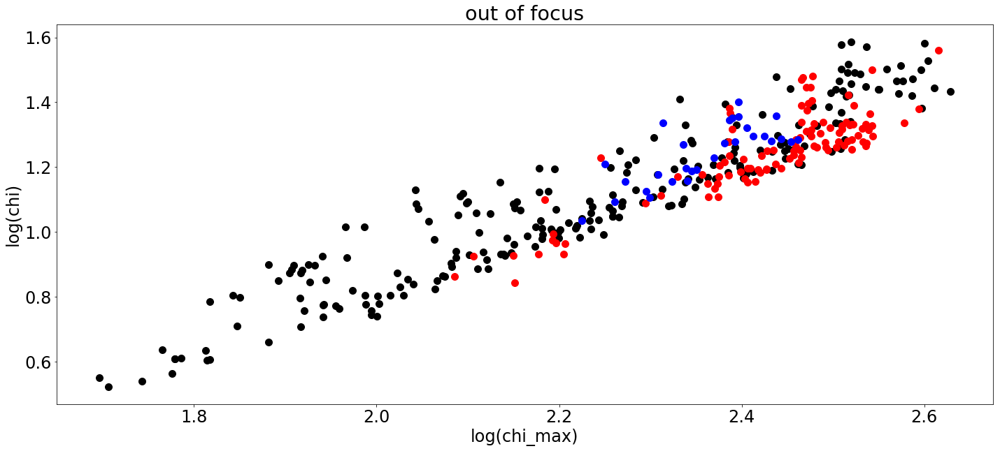

In [70]:
plt.figure(figsize=(24,10))

plt.plot(np.log10(results_of_fit_many_Ar['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar['p4']['chi2'].values),ls='',marker='o',color='black',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ne['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Ne['p4']['chi2'].values),ls='',marker='o',color='red',label='Ne',markersize=10)
plt.plot(np.log10(results_of_fit_many_Kr['p4']['chi2max'].values),\
         np.log10(results_of_fit_many_Kr['p4']['chi2'].values),ls='',marker='o',color='blue',label='Kr',markersize=10)
plt.xlabel('log(chi_max)')
plt.ylabel('log(chi)')
plt.title('out of focus')

(-0.1, 1)

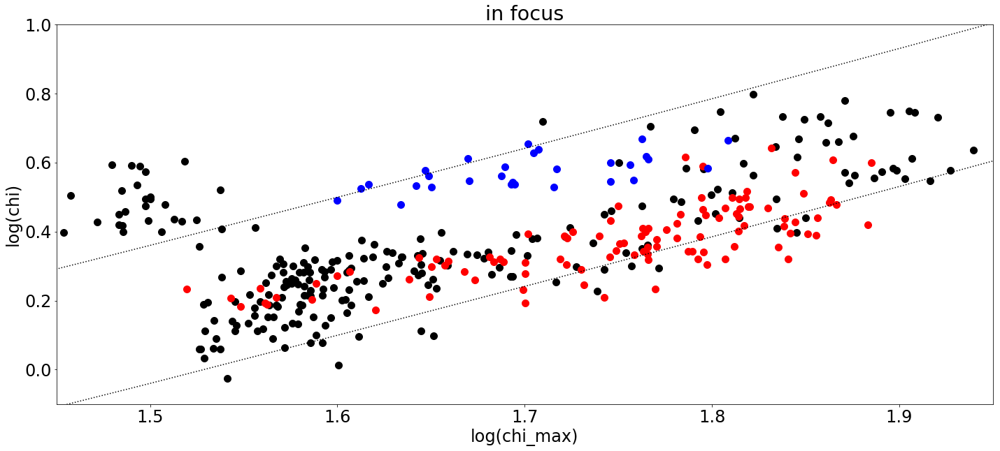

In [71]:
plt.figure(figsize=(24,10))
plt.plot(np.log10(results_of_fit_many_Ar['0']['chi2max'].values),\
         np.log10(results_of_fit_many_Ar['0']['chi2'].values),ls='',marker='o',color='black',label='Ar',markersize=10)
plt.plot(np.log10(results_of_fit_many_Ne['0']['chi2max'].values),
         np.log10(results_of_fit_many_Ne['0']['chi2'].values),ls='',marker='o',color='red',label='Ne',markersize=10)
plt.plot(np.log10(results_of_fit_many_Kr['0']['chi2max'].values),
         np.log10(results_of_fit_many_Kr['0']['chi2'].values),ls='',marker='o',color='blue',label='Kr',markersize=10)
plt.xlabel('log(chi_max)')
plt.ylabel('log(chi)')
plt.title('in focus')
plt.plot(np.arange(1,2.1,0.1),np.arange(1,2.1,0.1)**1.25-1.7,color='black',ls=':')
plt.plot(np.arange(1,2.1,0.1),np.arange(1,2.1,0.1)**1.25-1.3,color='black',ls=':')
plt.xlim(1.45,1.95)
plt.ylim(-0.1,1)

In [72]:
label_focus='0'

values_Ar_improvment_focus=np.log10(results_of_fit_many_Ar[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Ar[label_focus]['chi2max'].values)
x_Ar_focus=finalAr.loc[results_of_fit_many_Ar[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Ar_focus=finalAr.loc[results_of_fit_many_Ar[label_focus].index.astype(int).ravel()]['yc'].values

values_Ne_improvment_focus=np.log10(results_of_fit_many_Ne[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Ne[label_focus]['chi2max'].values)
x_Ne_focus=finalNe.loc[results_of_fit_many_Ne[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Ne_focus=finalNe.loc[results_of_fit_many_Ne[label_focus].index.astype(int).ravel()]['yc'].values

values_Kr_improvment_focus=np.log10(results_of_fit_many_Kr[label_focus]['chi2'].values)-np.log10(results_of_fit_many_Kr[label_focus]['chi2max'].values)
x_Kr_focus=finalKr.loc[results_of_fit_many_Kr[label_focus].index.astype(int).ravel()]['xc_effective'].values
y_Kr_focus=finalKr.loc[results_of_fit_many_Kr[label_focus].index.astype(int).ravel()]['yc'].values

min_colors_improvment=np.min(values_Ar_improvment_focus)
max_colors_improvment=np.max(values_Ar_improvment_focus)

label_defocus='m4'

values_Ar_improvment_defocus=np.log10(results_of_fit_many_Ar[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Ar[label_defocus]['chi2max'].values)
x_Ar_defocus=finalAr.loc[results_of_fit_many_Ar[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Ar_defocus=finalAr.loc[results_of_fit_many_Ar[label_defocus].index.astype(int).ravel()]['yc'].values

values_Ne_improvment_defocus=np.log10(results_of_fit_many_Ne[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Ne[label_defocus]['chi2max'].values)
x_Ne_defocus=finalNe.loc[results_of_fit_many_Ne[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Ne_defocus=finalNe.loc[results_of_fit_many_Ne[label_defocus].index.astype(int).ravel()]['yc'].values

values_Kr_improvment_defocus=np.log10(results_of_fit_many_Kr[label_defocus]['chi2'].values)-np.log10(results_of_fit_many_Kr[label_defocus]['chi2max'].values)
x_Kr_defocus=finalKr.loc[results_of_fit_many_Kr[label_defocus].index.astype(int).ravel()]['xc_effective'].values
y_Kr_defocus=finalKr.loc[results_of_fit_many_Kr[label_defocus].index.astype(int).ravel()]['yc'].values

min_colors_improvment_defocus=np.min(values_Ar_improvment_defocus)
max_colors_improvment_defocus=np.max(values_Ar_improvment_defocus)

In [73]:
suboptimal_Ar=np.log10(results_of_fit_many_Ar['0']['chi2'].values)>(np.log10(results_of_fit_many_Ar['0']['chi2max'].values)**1.25-1.3)
suboptimal_Ne=np.log10(results_of_fit_many_Ne['0']['chi2'].values)>(np.log10(results_of_fit_many_Ne['0']['chi2max'].values)**1.25-1.3)
suboptimal_Kr=np.log10(results_of_fit_many_Kr['0']['chi2'].values)>(np.log10(results_of_fit_many_Kr['0']['chi2max'].values)**1.25-1.3)

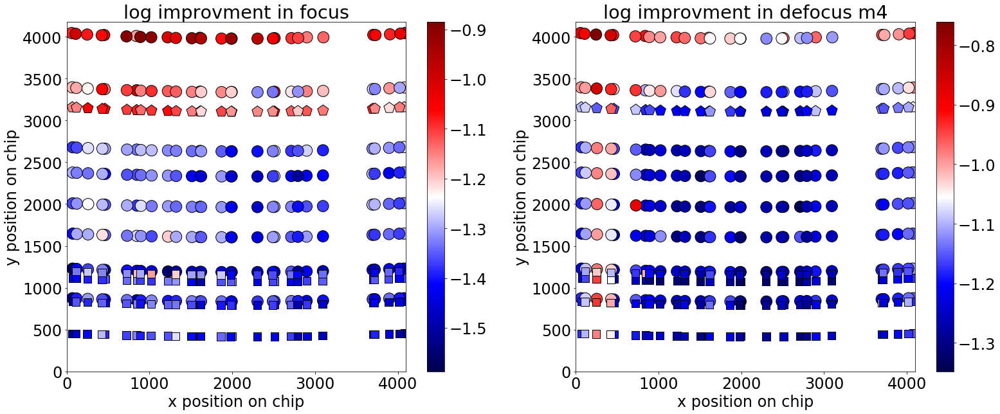

In [74]:
plt.figure(figsize=(26,10))

plt.subplot(121)
plt.scatter(x_Ar_focus, y_Ar_focus, s=np.pi * (10 * 1)**2, c=values_Ar_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='o')
plt.scatter(x_Ne_focus, y_Ne_focus, s=np.pi * (7 * 1)**2, c=values_Ne_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='s')
plt.scatter(x_Kr_focus, y_Kr_focus, s=np.pi * (10 * 1)**2, c=values_Kr_improvment_focus, cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in focus')
plt.colorbar()

plt.subplot(122)
plt.scatter(x_Ar_defocus, y_Ar_defocus, s=np.pi * (10 * 1)**2, c=values_Ar_improvment_defocus, \
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='o')
plt.scatter(x_Ne_defocus, y_Ne_defocus, s=np.pi * (7 * 1)**2, c=values_Ne_improvment_defocus,\
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='s')
plt.scatter(x_Kr_defocus, y_Kr_defocus, s=np.pi * (10 * 1)**2, c=values_Kr_improvment_defocus,\
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in defocus '+label_defocus)
plt.colorbar()

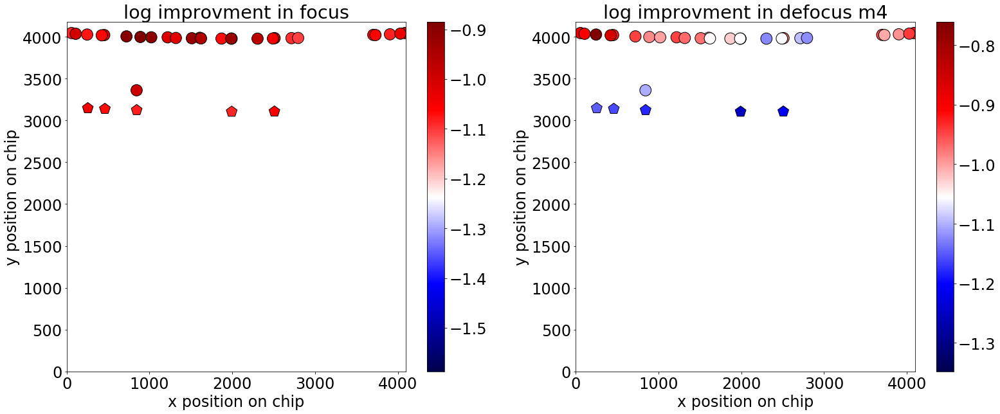

In [75]:
plt.figure(figsize=(26,10))

plt.subplot(121)
plt.scatter(x_Ar_focus[suboptimal_Ar], y_Ar_focus[suboptimal_Ar], s=np.pi * (10 * 1)**2, c=values_Ar_improvment_focus[suboptimal_Ar], cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='o')
plt.scatter(x_Ne_focus[suboptimal_Ne], y_Ne_focus[suboptimal_Ne], s=np.pi * (7 * 1)**2, c=values_Ne_improvment_focus[suboptimal_Ne], cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='s')
plt.scatter(x_Kr_focus[suboptimal_Kr], y_Kr_focus[suboptimal_Kr], s=np.pi * (10 * 1)**2, c=values_Kr_improvment_focus[suboptimal_Kr], cmap='seismic', alpha=1,vmin=min_colors_improvment, vmax=max_colors_improvment,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in focus')
plt.colorbar()

plt.subplot(122)
plt.scatter(x_Ar_defocus[suboptimal_Ar], y_Ar_defocus[suboptimal_Ar], s=np.pi * (10 * 1)**2, c=values_Ar_improvment_defocus[suboptimal_Ar], \
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='o')
plt.scatter(x_Ne_defocus[suboptimal_Ne], y_Ne_defocus[suboptimal_Ne], s=np.pi * (7 * 1)**2, c=values_Ne_improvment_defocus[suboptimal_Ne],\
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='s')
plt.scatter(x_Kr_defocus[suboptimal_Kr], y_Kr_defocus[suboptimal_Kr], s=np.pi * (10 * 1)**2, c=values_Kr_improvment_defocus[suboptimal_Kr],\
            cmap='seismic', alpha=1,vmin=min_colors_improvment_defocus, vmax=max_colors_improvment_defocus,edgecolor='black',marker='p')
plt.ylim(0,4176)
plt.xlim(0,4096)
plt.xlabel('x position on chip')
plt.ylabel('y position on chip')
plt.title('log improvment in defocus '+label_defocus)
plt.colorbar()

# Fiber illumination (PIPE2D-697)

In [114]:
sci_data_400_m4 = np.load('/tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/sci3434130Ar_Stacked.npy')
center_sci_data_400_m4=find_centroid_of_flux(sci_data_400_m4)
profile_sci_data_400_m4 = create_res_data(sci_data_400_m4,custom_cent = center_sci_data_400_m4, size_pixel = 1)
# 34437
sci_data_400_p4 = np.load('/tigress/ncaplar/ReducedData/Data_Nov_20/Stamps_cleaned/sci3443730Ar_Stacked.npy')
center_sci_data_400_p4=find_centroid_of_flux(sci_data_400_p4)
profile_sci_data_400_p4 = create_res_data(sci_data_400_p4,custom_cent = center_sci_data_400_p4, size_pixel = 1)

# [51485, 51581, 51677]
sci_data_401_m4 = np.load('/tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/sci51485222Ar_Stacked.npy')
center_sci_data_401_m4=find_centroid_of_flux(sci_data_401_m4)
profile_sci_data_401_m4 = create_res_data(sci_data_401_m4,custom_cent = center_sci_data_401_m4, size_pixel = 1)
# 51677
sci_data_401_p4 = np.load('/tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/sci51677222Ar_Stacked.npy')
center_sci_data_401_p4=find_centroid_of_flux(sci_data_401_p4)
profile_sci_data_401_p4 = create_res_data(sci_data_401_p4,custom_cent = center_sci_data_401_p4, size_pixel = 1)

center of the uniform values in units of pixels is:[29.5, 29.5]
center specified (in respect to the center of image, units of pixels) at:[1.7500084868552896, -0.7553482679894117]
center of the uniform values in units of pixels is:[29.5, 29.5]
center specified (in respect to the center of image, units of pixels) at:[0.27817100597016875, 0.26715814659521087]
center of the uniform values in units of pixels is:[29.5, 29.5]
center specified (in respect to the center of image, units of pixels) at:[2.083261682156593, -0.40522792301925037]
center of the uniform values in units of pixels is:[29.5, 29.5]
center specified (in respect to the center of image, units of pixels) at:[0.3134053015611009, 0.5996545759211322]


(-0.5, 59.5)

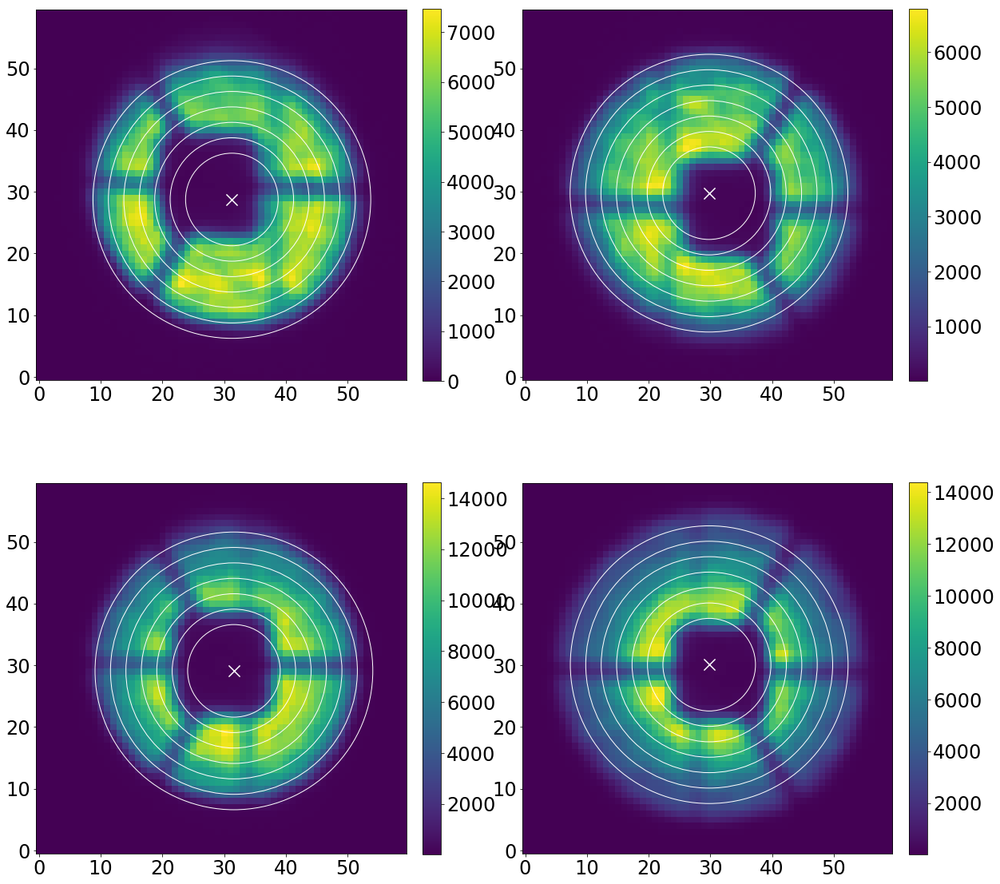

In [116]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(sci_data_400_m4,origin='lower', vmax = np.max(sci_data_400_m4))
circle0 =  plt.Circle(center_sci_data_400_m4, 7.5, color='white', fill=False)
circle1 =  plt.Circle(center_sci_data_400_m4, 10, color='white', fill=False)
circle2 =  plt.Circle(center_sci_data_400_m4, 12.5, color='white', fill=False)
circle3 =  plt.Circle(center_sci_data_400_m4, 15, color='white', fill=False)
circle4 =  plt.Circle(center_sci_data_400_m4, 17.5, color='white', fill=False)
circle5 =  plt.Circle(center_sci_data_400_m4, 20, color='white', fill=False)
circle6 =  plt.Circle(center_sci_data_400_m4, 22.5, color='white', fill=False)
plt.gca().add_patch(circle0)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)
plt.gca().add_patch(circle4)
plt.gca().add_patch(circle5)
plt.gca().add_patch(circle6)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(x=np.array(center_sci_data_400_m4)[0],y=np.array(center_sci_data_400_m4)[1], s=200,c='white',marker='x')
plt.xlim(-0.5,59.5)
plt.ylim(-0.5,59.5)

plt.subplot(222)
plt.imshow(sci_data_400_p4,origin='lower', vmax = np.max(sci_data_400_p4))
circle0 =  plt.Circle(center_sci_data_400_p4, 7.5, color='white', fill=False)
circle1 =  plt.Circle(center_sci_data_400_p4, 10, color='white', fill=False)
circle2 =  plt.Circle(center_sci_data_400_p4, 12.5, color='white', fill=False)
circle3 =  plt.Circle(center_sci_data_400_p4, 15, color='white', fill=False)
circle4 =  plt.Circle(center_sci_data_400_p4, 17.5, color='white', fill=False)
circle5 =  plt.Circle(center_sci_data_400_p4, 20, color='white', fill=False)
circle6 =  plt.Circle(center_sci_data_400_p4, 22.5, color='white', fill=False)
plt.gca().add_patch(circle0)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)
plt.gca().add_patch(circle4)
plt.gca().add_patch(circle5)
plt.gca().add_patch(circle6)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(x=np.array(center_sci_data_400_p4)[0],y=np.array(center_sci_data_400_p4)[1], s=200,c='white',marker='x')
plt.xlim(-0.5,59.5)
plt.ylim(-0.5,59.5)

plt.subplot(223)
plt.imshow(sci_data_401_m4,origin='lower', vmax = np.max(sci_data_401_m4))
circle0 =  plt.Circle(center_sci_data_401_m4, 7.5, color='white', fill=False)
circle1 =  plt.Circle(center_sci_data_401_m4, 10, color='white', fill=False)
circle2 =  plt.Circle(center_sci_data_401_m4, 12.5, color='white', fill=False)
circle3 =  plt.Circle(center_sci_data_401_m4, 15, color='white', fill=False)
circle4 =  plt.Circle(center_sci_data_401_m4, 17.5, color='white', fill=False)
circle5 =  plt.Circle(center_sci_data_401_m4, 20, color='white', fill=False)
circle6 =  plt.Circle(center_sci_data_401_m4, 22.5, color='white', fill=False)
plt.gca().add_patch(circle0)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)
plt.gca().add_patch(circle4)
plt.gca().add_patch(circle5)
plt.gca().add_patch(circle6)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(x=np.array(center_sci_data_401_m4)[0],y=np.array(center_sci_data_401_m4)[1], s=200,c='white',marker='x')
plt.xlim(-0.5,59.5)
plt.ylim(-0.5,59.5)

plt.subplot(224)
plt.imshow(sci_data_401_p4,origin='lower', vmax = np.max(sci_data_401_p4))
circle0 =  plt.Circle(center_sci_data_401_p4, 7.5, color='white', fill=False)
circle1 =  plt.Circle(center_sci_data_401_p4, 10, color='white', fill=False)
circle2 =  plt.Circle(center_sci_data_401_p4, 12.5, color='white', fill=False)
circle3 =  plt.Circle(center_sci_data_401_p4, 15, color='white', fill=False)
circle4 =  plt.Circle(center_sci_data_401_p4, 17.5, color='white', fill=False)
circle5 =  plt.Circle(center_sci_data_401_p4, 20, color='white', fill=False)
circle6 =  plt.Circle(center_sci_data_401_p4, 22.5, color='white', fill=False)
plt.gca().add_patch(circle0)
plt.gca().add_patch(circle1)
plt.gca().add_patch(circle2)
plt.gca().add_patch(circle3)
plt.gca().add_patch(circle4)
plt.gca().add_patch(circle5)
plt.gca().add_patch(circle6)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.scatter(x=np.array(center_sci_data_401_p4)[0],y=np.array(center_sci_data_401_p4)[1], s=200,c='white',marker='x')
plt.xlim(-0.5,59.5)
plt.ylim(-0.5,59.5)



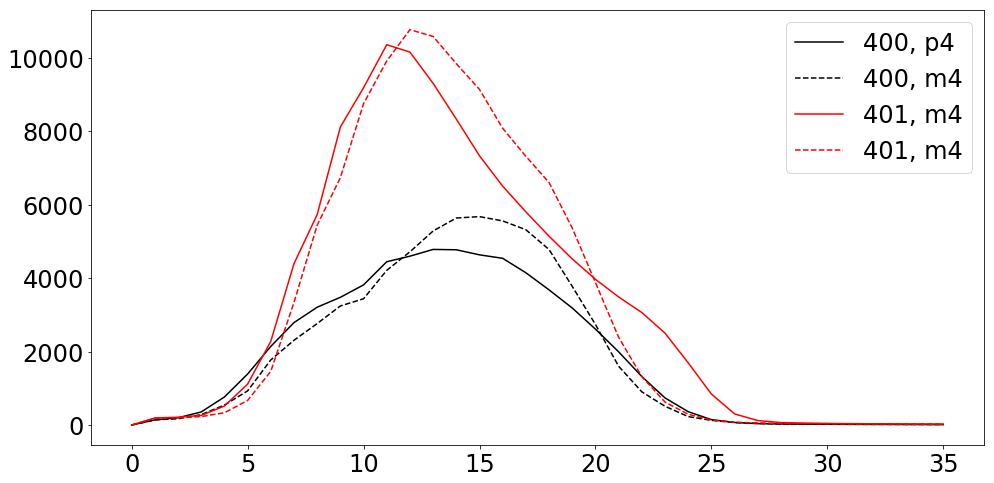

In [122]:
plt.figure(figsize=(16,8))
plt.plot(profile_sci_data_400_p4[0],profile_sci_data_400_p4[1],color='black', label = '400, p4')
plt.plot(profile_sci_data_400_m4[0],profile_sci_data_400_m4[1],color='black' , ls = '--', label = '400, m4')

plt.plot(profile_sci_data_401_p4[0],profile_sci_data_401_p4[1],color='red', label = '401, m4')
plt.plot(profile_sci_data_401_m4[0],profile_sci_data_401_m4[1],color='red' , ls = '--', label = '401, m4')

plt.legend()

In [ ]:
sci_data = np.load('/tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/sci3434130Ar_Stacked.npy')
center_sci_data=find_centroid_of_flux(sci_data)
# center of the image
print(center_sci_data)
# 34437
profile_sci_data = create_res_data(sci_data,custom_cent = center_sci_data, size_pixel = 1)

In [ ]:
51485

# Expanding fixed_single_spot analysis 

In [49]:
list_of_labelInput = ['m4', '0', 'p4']
list_of_spots = [221,222]
dataset = 8
list_of_arc = ['Ar','Ar']
eps =8
nsteps = 10
analysis_type = 'fixed_single_spot'

In [54]:
Zernike_estimation_preparation_instance = \
    Zernike_estimation_preparation(list_of_labelInput=list_of_labelInput,
                                   list_of_spots=list_of_spots, dataset=dataset,
                                   list_of_arc=list_of_arc, eps=eps, nsteps=nsteps,
                                   analysis_type=analysis_type)


Zernike_estimation_preparation_instance.get_sci_var_mask_data()

Dataset analyzed is: 8
self.list_of_arc: ['Ar', 'Ar']
arc: Ar
obs_possibilites: [51485 51497 51509 51521 51533 51545 51557 51569 51581 51593 51605 51617
 51629 51641 51653 51665 51677 51581]
arc: Ar
obs_possibilites: [51485 51497 51509 51521 51533 51545 51557 51569 51581 51593 51605 51617
 51629 51641 51653 51665 51677 51581]
list_of_obs_possibilites: [array([51485, 51497, 51509, 51521, 51533, 51545, 51557, 51569, 51581,
       51593, 51605, 51617, 51629, 51641, 51653, 51665, 51677, 51581]), array([51485, 51497, 51509, 51521, 51533, 51545, 51557, 51569, 51581,
       51593, 51605, 51617, 51629, 51641, 51653, 51665, 51677, 51581])]
self.list_of_obs:[[51485, 51581, 51677], [51485, 51581, 51677]]
list_of_obs_cleaned:[[51485, 51581, 51677], [51485, 51581, 51677]]
list_of_obs_cleaned[[51485, 51581, 51677], [51485, 51581, 51677]]
sci_image loaded from: /tigress/ncaplar/ReducedData/Data_May_25_2021/Stamps_cleaned/sci51485221Ar_Stacked.npy
adding images for obs: 51485
sci_image loaded from: /t

(array([[array([[34.22668 , 35.98102 , 35.392498, ..., 35.47958 , 33.575775,
         30.168407],
        [38.995167, 39.905354, 40.2138  , ..., 33.414017, 28.43974 ,
         26.893993],
        [36.817013, 37.199615, 40.2741  , ..., 33.09273 , 32.77722 ,
         30.822426],
        ...,
        [27.82108 , 25.853348, 31.02911 , ..., 38.751484, 39.02077 ,
         34.062153],
        [23.828697, 26.905727, 26.84665 , ..., 34.012066, 33.911896,
         31.25718 ],
        [24.702007, 26.923779, 29.169151, ..., 32.15179 , 30.331932,
         29.024166]], dtype=float32),
         array([[    5.8280997 ,     4.088222  ,     4.146568  ,     1.1838926 ,
             4.3286138 ,     8.433061  ,     6.3581963 ,     7.8579893 ,
            10.052011  ,    18.364445  ,    16.044003  ,    11.874917  ,
             7.52722   ,     4.4903684 ,     5.310608  ,     3.4793324 ,
             0.92568815,     3.290337  ,     3.61841   ,     4.3332944 ],
        [    1.4704739 ,     3.1772947 ,     4.4

In [55]:
array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d =\
    Zernike_estimation_preparation_instance.create_parametrization_proposals('Sep0521',
                                                                             'direct',
                                                                             56)

results_of_fit_input_Ar is taken from: <_io.BufferedReader name='/tigress/ncaplar/ReducedData/Data_May_25_2021/Dataframes/results_of_fit_many_direct_Ar_from_Sep0521.pkl'>
adding label m4 with single_number 221 for creation of array_of_allparameters
Int64Index([  1, 101, 102, 103, 104, 105, 107, 109,  11, 111,
            ...
            357, 359, 361, 363, 365, 366, 367, 368, 369, 371],
           dtype='int64', length=229)
Solution for this spot is avaliable
results_of_fit_input[m4].loc[221].values[    28.70559769     -0.52782246     -1.13941359      0.71600394
     -0.44368734     -0.17031211     -0.27970624      0.09755493
     -0.15039121     -0.20319112      0.01393424     -0.01118614
     -0.1098663       0.24161773     -0.0181075       0.01467544
     -0.07443576      0.04922843      0.3577653       0.71016542
      0.07185924     -0.04095673     -0.04906306      0.05699196
     -0.01557482      0.07251233      0.              0.55761536
      0.00019927      0.0542297      -0.0

In [111]:
stronger_array_01 = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                              0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                              1.2, 1.2, 1.2, 1.2, 1.2, 1.2,
                              1, 1, 1, 1,
                              1.2, 1.2, 1.2, 1.2, 1.2,
                              1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1.2, 1])

In [127]:
unified_index = [0, 2, 9, 10, 11, 12, 13, 14, 16, 21]


array(['hscFrac', 'dxFocal', 'misalign', 'x_fiber', 'y_fiber',
       'effective_radius_illumination', 'frd_sigma', 'frd_lorentz_factor',
       'slitHolder_frac_dx', 'fiber_r'], dtype='<U29')

In [128]:
unified_index = [0, 1, 2, 4, 9, 10, 11, 12, 13, 14, 16, 21]
np.array(columns22[19:])[unified_index]

array(['hscFrac', 'strutFrac', 'dxFocal', 'slitFrac', 'misalign',
       'x_fiber', 'y_fiber', 'effective_radius_illumination', 'frd_sigma',
       'frd_lorentz_factor', 'slitHolder_frac_dx', 'fiber_r'],
      dtype='<U29')

In [90]:
#stronger_array_01[19*2:][unified_index] = 0

In [113]:
list_of_global_parameters = []
for s in range(len(list_of_spots)):
    array_of_polyfit_1_parameterizations_proposal_shape_2d =\
        array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d[s]

    global_parameters = array_of_polyfit_1_parameterizations_proposal_shape_2d[:, 1][19:19 + 23]

    list_of_global_parameters.append(global_parameters)

In [114]:
from Zernike_Module import check_global_parameters

In [115]:
array_of_global_parameters = np.array(list_of_global_parameters)
global_parameters = np.mean(array_of_global_parameters, axis=0)
checked_global_parameters = check_global_parameters(global_parameters)

for s in range(len(list_of_spots)):
    for i in unified_index:
        array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d[s][:, 1][19:19 + 23][i] =\
            checked_global_parameters[i]

In [116]:
list_of_parInit1 = []
for s in range(len(list_of_spots)):

    array_of_polyfit_1_parameterizations_proposal_shape_2d =\
        array_of_array_of_polyfit_1_parameterizations_proposal_shape_2d[s]
    print(
        'array_of_polyfit_1_parameterizations_proposal_shape_2d: ' +
        str(array_of_polyfit_1_parameterizations_proposal_shape_2d))
    parInit1 = create_parInit(
        allparameters_proposal=array_of_polyfit_1_parameterizations_proposal_shape_2d,
        multi=True,
        pupil_parameters=None,
        allparameters_proposal_err=None,
        stronger=stronger_array_01,
        use_optPSF=None,
        deduced_scattering_slope=None,
        zmax=56)
    
    # the number of walkers is given by options array, specified with
    # the parameter eps at the start
    while len(parInit1) < 100:
        parInit1_2 = create_parInit(
            allparameters_proposal=array_of_polyfit_1_parameterizations_proposal_shape_2d,
            multi=multi_var,
            pupil_parameters=None,
            allparameters_proposal_err=None,
            stronger=stronger_array_01,
            use_optPSF=None,
            deduced_scattering_slope=None,
            zmax=zmax_input)
        parInit1 = np.vstack((parInit1, parInit1_2))

    list_of_parInit1.append(parInit1)

array_of_polyfit_1_parameterizations_proposal_shape_2d: [[    -7.19936212     -0.0918508 ]
 [     0.16255566      0.12240019]
 [     0.25252588     -0.12931009]
 [    -0.14756233      0.12575461]
 [     0.10165873     -0.0370524 ]
 [     0.00827325     -0.13721909]
 [     0.01399827     -0.22371314]
 [    -0.13196266     -0.43029569]
 [     0.02494093     -0.05062749]
 [     0.05141102      0.00245296]
 [     0.00116752      0.01860432]
 [     0.01927525      0.06591484]
 [     0.02541847     -0.00819242]
 [    -0.06452788     -0.01649379]
 [    -0.00010142     -0.01851317]
 [    -0.00510123     -0.00572949]
 [     0.00655844     -0.04820199]
 [    -0.00269726      0.03843939]
 [    -0.11325727     -0.09526379]
 [     0.              0.68955549]
 [     0.              0.07185924]
 [     0.             -0.04018705]
 [     0.             -0.04906306]
 [     0.              0.05699196]
 [    -0.             -0.01557482]
 [     0.              0.07251233]
 [     0.              0.        ]

In [121]:
list_of_parInit1[0][:,40]-list_of_parInit1[1][:,40]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [122]:
list_of_parInit1[0][:,41]-list_of_parInit1[1][:,41]

array([-0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07014728,
       -0.07014728, -0.07014728, -0.07014728, -0.07014728, -0.07

In [97]:
np.mean(list_of_parInit1[:,:,38],axis=1)

TypeError: list indices must be integers or slices, not tuple

In [99]:
list_of_parInit1[:,38]

TypeError: list indices must be integers or slices, not tuple

In [100]:
list_of_parInit1

[array([[-7.19936212, -0.0918508 ,  0.16255566, ...,  0.00359377,
          0.00080044,  0.00298651],
        [-7.19936212, -0.0918508 ,  0.16255566, ...,  0.00359377,
          0.00080044,  0.00298651],
        [-7.19936212, -0.0918508 ,  0.16255566, ...,  0.00359377,
          0.00080044,  0.00298651],
        ...,
        [-7.19936212, -0.0918508 ,  0.16255566, ...,  0.00359377,
          0.00080044,  0.00298651],
        [-7.19936212, -0.0918508 ,  0.16255566, ...,  0.00359377,
          0.00080044,  0.00298651],
        [-7.19936212, -0.0918508 ,  0.16255566, ...,  0.00359377,
          0.00080044,  0.00298651]]),
 array([[-7.81404708, -0.69163833,  0.10289358, ..., -0.00499785,
         -0.00313173, -0.00520465],
        [-7.81404708, -0.69163833,  0.10289358, ..., -0.00499785,
         -0.00313173, -0.00520465],
        [-7.81404708, -0.69163833,  0.10289358, ..., -0.00499785,
         -0.00313173, -0.00520465],
        ...,
        [-7.81404708, -0.69163833,  0.10289358, ..., -

In [104]:
for s,s_value in enumerate(list_of_spots):
    print(s_value)

221
222


In [106]:
np.vstack((list_of_parInit1[0][:,38],list_of_parInit1[1][:,38]))

array([[0.68955549, 0.7210101 , 0.68955549, ..., 0.68955549, 0.67877332,
        0.68955549],
       [0.68955549, 0.7210101 , 0.68955549, ..., 0.68955549, 0.67877332,
        0.68955549]])

In [110]:
list_of_parInit1[0][:,39]

array([0.07185924, 0.07949363, 0.07185924, 0.09197325, 0.07185924,
       0.07185924, 0.07844128, 0.11065922, 0.07185924, 0.07185924,
       0.07185924, 0.07185924, 0.07185924, 0.09122714, 0.09212847,
       0.07185924, 0.08107451, 0.08186965, 0.07185924, 0.07185924,
       0.12170099, 0.11146336, 0.07185924, 0.07185924, 0.08561183,
       0.08641526, 0.07376318, 0.07846718, 0.07999781, 0.07185924,
       0.07185924, 0.07185924, 0.09655679, 0.07185924, 0.07185924,
       0.07185924, 0.12301834, 0.10085579, 0.11330778, 0.07185924,
       0.09066847, 0.07185924, 0.07185924, 0.07185924, 0.07185924,
       0.09471325, 0.07278446, 0.07185924, 0.07185924, 0.07185924,
       0.07185924, 0.07185924, 0.09227358, 0.07111291, 0.07185924,
       0.09202089, 0.07185924, 0.07185924, 0.10456305, 0.07185924,
       0.07185924, 0.07185924, 0.07728582, 0.07519263, 0.07185924,
       0.07185924, 0.07185924, 0.076848  , 0.08630652, 0.07185924,
       0.07185924, 0.08026594, 0.0947316 , 0.07185924, 0.07185

In [109]:
list_of_parInit1[1][:,39]

array([0.07566747, 0.08330186, 0.07566747, 0.09578148, 0.07566747,
       0.07566747, 0.08224951, 0.11446745, 0.07566747, 0.07566747,
       0.07566747, 0.07566747, 0.07566747, 0.09503537, 0.0959367 ,
       0.07566747, 0.08488274, 0.08567788, 0.07566747, 0.07566747,
       0.07371303, 0.12550922, 0.11527159, 0.07566747, 0.07566747,
       0.08942006, 0.09022349, 0.07757141, 0.08227541, 0.08380604,
       0.07566747, 0.07566747, 0.07566747, 0.10036502, 0.07566747,
       0.07566747, 0.07566747, 0.12682657, 0.07124631, 0.10466402,
       0.11711601, 0.07566747, 0.0944767 , 0.07566747, 0.07566747,
       0.07566747, 0.07566747, 0.09852148, 0.07659269, 0.07566747,
       0.0736024 , 0.07566747, 0.07566747, 0.07566747, 0.07566747,
       0.09608181, 0.07492114, 0.07566747, 0.09582912, 0.07566747,
       0.07566747, 0.10837128, 0.07566747, 0.07566747, 0.07566747,
       0.08109405, 0.07900086, 0.07566747, 0.07566747, 0.07566747,
       0.08065623, 0.09011475, 0.07566747, 0.07566747, 0.08407